In [13]:
# build a database from a dataset for nomenclating
# INPUT: a collection of GAIN domain PDBs, their sequences as one large ".fa" file
from gain_classes import GainDomain, GainCollection, Anchors, GPS
import sse_func
import execute
import numpy as np
import glob
#import multiprocessing as mp
#from subprocess import Popen, PIPE
from tqdm import tqdm
from matplotlib import pyplot as plt
from shutil import copyfile
import math

In [82]:
def filter_by_receptor(sequences, selection):
    new_list = []
    for seq_tup in sequences:
        if selection in seq_tup[0]:
            new_list.append(seq_tup)
    return new_list

def filter_by_list(sequences, selection): # selection list
    new_list = []
    for seq_tup in sequences:
        for it in selection:
            if it in seq_tup[0]:
                new_list.append(seq_tup)
    return new_list

def read_dssp(file):
    '''
    Similar to sse_func.read_sse_asg, parse the file and return the sse_sequence list
    Parameters:
        file : str, required
            DSSP file to be read (for now, GUILLEs pre-compiled version)
    Returns:
        sse_sequence : list
            LIST containing a sequence of all letters assigned to the residues
    '''
    sse_list = []
    with open(file) as f:
        for l in f.readlines():
                items = l.split()
                if len(items) > 1:
                    one_letter_sse = items[1]
                else:
                    one_letter_sse = ''
                sse_list.append(one_letter_sse)
    return sse_list

def build_dssp_dict(file):
    # Build a more rudimentary SSE dictionary based on the SSE sequence from read_dssp:
    def move2dict(sse_dict, dssp_keys, element, sse_tuple):
        if element not in dssp_keys.keys():
            #print(f"Skipping element with DSSP assignment \"{element}\" ")
            return sse_dict
        sse_id = dssp_keys[element]
        if sse_id not in sse_dict.keys():
            sse_dict[sse_id] = [sse_tuple]
        else:
            sse_dict[sse_id].append(sse_tuple)
        return sse_dict
    
    with open(file) as f:
        first_index = int(f.read().split()[0][1:]) # the integer value of the first index
        
    sse_list = read_dssp(file)             
    dssp_keys = { "H" : "AlphaHelix",
                     "B" : "Bridge",
                     "E" : "Strand",
                     "G" : "310Helix",
                     "I" : "5Helix",
                     "T" : "Turn",
                     "S" : "Bend"     }
    sse_dict = {}
    # Parse through the entries one by one and construc tuples (first_res, last_res)
    # pass them into the dictionary with the corresponding key
    stored_element = ''
    within_element = False
    for idx, assignment in enumerate(sse_list):
        if assignment != stored_element:
            if within_element:
                last = idx + first_index
                within_element = False
                # Move the tuple into the dictionary
                sse_dict = move2dict(sse_dict, dssp_keys, stored_element, (first,last))
            if not within_element:
                if assignment == "":
                    stored_element = ""
                    continue
                first = idx + first_index
                stored_element = assignment
                within_element = True
    return sse_dict

In [86]:
#test_dssp = '/home/hildilab/projects/agpcr_nom/dssp4/test.dssp'
#print(build_dssp_dict(test_dssp))
strides = glob.glob('/home/hildilab/projects/agpcr_nom/human_31_0/sse/*.stride')
# COMPARE LISTS OF STRIDE AGAINST DSSP
for f in strides:
    print("\n", f)
    dssp_list = read_dssp(f.replace(".stride","_gain.dssp"))
    with open(f.replace(".stride","_gain.dssp")) as g:
        data = g.read()
        #print(data.split("\n"))
        first_index = int(data.split()[0][1:]) # the integer value of the first index
        last_index = int(data.split("\n")[-2].split("\t")[0][1:])#.split()[1:]
        #print(last_index)
        
    stride_list = sse_func.read_sse_asg(f)
    """    #print(dssp_list,"\n\n",stride_list)
    for k in range(len(dssp_list)):
        d = dssp_list[k]
        s = stride_list[k+first_index-1]
        if d != s:
            if d in ["H", "E", "G"] or s in ["H", "E", "G"]:
                if d in ["G", "H"] and s in ["G", "H"]:
                    continue
                print(f"RESID {first_index+k} | dssp {dssp_list[k]}:{stride_list[k+first_index-1]} stride")
        #print(dssp_list[k],".",stride_list[k+first_index-1])"""
    dssp_dict = build_dssp_dict(f.replace(".stride","_gain.dssp"))
    stride_dict = sse_func.cut_sse_dict(first_index, last_index, sse_func.read_sse_loc(f))
    for ki in dssp_dict.keys():
        if ki in stride_dict.keys():
            print(ki)
            """            for i, item in enumerate(dssp_dict[ki]):
                try: 
                    print(item,"\t\t", stride_dict[ki][i])
                except:
                    print(item)"""
            
            print("DSSP\t", dssp_dict[ki])
            print("STRIDE\t",stride_dict[ki])

        


 /home/hildilab/projects/agpcr_nom/human_31_0/sse/Q9NYQ7_O75092-CELR3_HUMAN-CadherinEGFLAGseven-passG-typereceptor3-Homo_sapiens.stride
AlphaHelix
DSSP	 [(452, 466), (473, 490), (495, 514), (521, 525), (528, 540), (545, 555), (562, 584)]
STRIDE	 [(452, 466), (473, 489), (495, 514), (527, 540), (545, 553), (562, 579)]
310Helix
DSSP	 [(517, 520), (542, 545), (687, 690)]
STRIDE	 [(521, 523), (542, 544), (687, 689)]
Strand
DSSP	 [(588, 592), (595, 602), (612, 615), (622, 625), (633, 637), (677, 685), (695, 697), (709, 711), (714, 722), (724, 726), (734, 740), (750, 756), (765, 768), (771, 777), (780, 786), (789, 796)]
STRIDE	 [(449, 450), (588, 591), (595, 601), (611, 614), (622, 623), (633, 637), (677, 684), (695, 696), (708, 710), (714, 721), (724, 725), (729, 739), (750, 755), (765, 767), (771, 777), (780, 787), (789, 796)]

 /home/hildilab/projects/agpcr_nom/human_31_0/sse/Q8IZF5_B4DF15_E9PEV1_Q53TA5_Q6UXT7_Q6UXX3_Q86SL7_Q8IXD8_Q8TDT3-AGRF3_HUMAN-AGRF3-Homo_sapiens.stride
AlphaHelix
D

In [37]:
valid_seqs = sse_func.read_multi_seq("/home/hildilab/projects/agpcr_nom/app_gain_gain.fa")
print(len(valid_seqs))
quality_file = "/home/hildilab/projects/agpcr_nom/app_gain_gain.mafft.jal"
alignment_file = "/home/hildilab/projects/agpcr_nom/app_gain_gain.mafft.fa"
stride_folder = "/home/hildilab/projects/agpcr_nom/all_gps_stride"
#stride_files = glob.glob("/home/hildilab/projects/agpcr_nom/all_gps_stride/*")
stride_files = glob.glob("/home/hildilab/projects/agpcr_nom/sigmas/sigma_2/*")
quality = sse_func.read_quality(quality_file)
gps_minus_one = 6781 # -1 of the ACTUAL COLUMN (6782) in JALVIEW since there is is ONE-INDEXED
aln_cutoff = 6826 # 
alignment_dict = sse_func.read_alignment(alignment_file, aln_cutoff)

14435


In [38]:
valid_collection = GainCollection(  alignment_file = alignment_file,
                                    aln_cutoff = aln_cutoff,
                                    quality = quality,
                                    gps_index = gps_minus_one,
                                    stride_files = stride_files,
                                    sequence_files=None,
                                    sequences=valid_seqs,
                                    alignment_dict = alignment_dict,
                                    is_truncated = True,
                                    stride_outlier_mode=True)
#for gain in valid_collection.collection:
#    gain.create_indexing()

[NOTE] GainCollection.__init__: Found sequences object.


  0%|                                                                                                                                                                    | 10/14435 [00:00<02:33, 94.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[432, 445],
       [453, 468],
       [475, 493],
       [501, 503],
       [508, 519],
       [522, 533],
       [536, 558]]) 
	 beta = array([[564, 567],
       [571, 579],
       [586, 588],
       [605, 608],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
    

  0%|▏                                                                                                                                                                   | 21/14435 [00:00<02:25, 98.84it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 582],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 582],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], []

  0%|▎                                                                                                                                                                   | 31/14435 [00:00<02:25, 99.30it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 582],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[449, 462],
       [470, 485],
       [492, 510],
       [515, 520],
       [525, 536],
       [539, 550],
       [559, 575]]) 
	 beta = array([[585, 589],
       [592, 599],
       [608, 611],
       [630, 634],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [748, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_b

  0%|▍                                                                                                                                                                   | 41/14435 [00:00<02:24, 99.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [614, 615],
       [632, 634],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [614, 615],
       [632, 634],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
    

  0%|▌                                                                                                                                                                  | 52/14435 [00:00<02:21, 101.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[453, 466],
       [474, 489],
       [496, 514],
       [522, 524],
       [529, 540],
       [543, 554],
       [557, 579]]) 
	 beta = array([[585, 588],
       [592, 598],
       [608, 609],
       [626, 628],
       [677, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 474],
       [482, 497],
       [504, 522],
       [530, 532],
       [537, 548],
       [551, 562],
       [567, 587]]) 
	 beta = array([[593, 596],
       [600, 606],
       [616, 617],
       [634, 636],
       [678, 684],
       [708, 710],
       [714, 720],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], []

  0%|▋                                                                                                                                                                  | 63/14435 [00:00<02:22, 100.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 496],
       [502, 520],
       [525, 530],
       [535, 546],
       [549, 557],
       [565, 581]]) 
	 beta = array([[591, 595],
       [598, 606],
       [614, 615],
       [624, 625],
       [634, 636],
       [675, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 496],
       [502, 520],
       [525, 530],
       [535, 546],
       [549, 557],
       [565, 581]]) 
	 beta = array([[591, 595],
       [598, 606],
       [614, 615],
       [624, 625],
       [634, 636],
       [675, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749,

  1%|▊                                                                                                                                                                  | 74/14435 [00:00<02:22, 100.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[454, 467],
       [475, 490],
       [497, 515],
       [523, 525],
       [530, 541],
       [544, 580]]) 
	 beta = array([[586, 589],
       [593, 599],
       [609, 610],
       [627, 629],
       [677, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [12, 14, 32]], 
 self.a_breaks = [[], [], [], [], [], [12, 14, 32]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[454, 467],
       [475, 490],
       [497, 515],
       [523, 525],
       [530, 541],
       [544, 580]]) 
	 beta = array([[586, 589],
       [593, 599],
       [609, 610],
       [627, 629],
       [677, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [12, 14, 32]], 
 self.a_br

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[432, 445],
       [453, 469],
       [475, 493],
       [498, 503],
       [508, 519],
       [522, 533],
       [543, 559]]) 
	 beta = array([[569, 572],
       [576, 583],
       [591, 593],
       [612, 615],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[432, 445],
       [453, 469],
       [475, 493],
       [498, 503],
       [508, 519],
       [522, 533],
       [543, 559]]) 
	 beta = array([[569, 572],
       [576, 583],
       [591, 593],
       [612, 615],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770,

  1%|█                                                                                                                                                                   | 96/14435 [00:00<02:25, 98.28it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[432, 445],
       [453, 469],
       [475, 493],
       [498, 503],
       [508, 519],
       [522, 533],
       [543, 559]]) 
	 beta = array([[569, 572],
       [576, 583],
       [591, 593],
       [612, 615],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[432, 445],
       [453, 469],
       [475, 493],
       [498, 503],
       [508, 519],
       [522, 533],
       [543, 559]]) 
	 beta = array([[569, 572],
       [576, 583],
       [591, 593],
       [612, 615],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770,

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[450, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789,

  1%|█▎                                                                                                                                                                 | 118/14435 [00:01<02:24, 99.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 7

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[450, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0], []], 
 self.a_breaks = [[], [], [], [], [], [], [0], []]


  1%|█▌                                                                                                                                                                 | 139/14435 [00:01<02:23, 99.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[451, 461],
       [469, 484],
       [491, 509],
       [517, 519],
       [524, 535],
       [538, 549],
       [552, 574]]) 
	 beta = array([[580, 584],
       [587, 595],
       [602, 604],
       [621, 624],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[436, 446],
       [454, 469],
       [476, 494],
       [502, 504],
       [507, 520],
       [523, 534],
       [539, 559]]) 
	 beta = array([[565, 568],
       [572, 580],
       [587, 589],
       [606, 609],
       [672, 680],
       [704, 706],
       [710, 717],
       [720, 721],
       [725, 735],
       [746, 751],
       [761, 763],
       [767, 772],
       [776, 783],
       [786, 792]])
a_b

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 582],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 610],
       [629, 633],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 776],
    

  1%|█▊                                                                                                                                                                 | 161/14435 [00:01<02:24, 98.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [533, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [613, 615],
       [621, 623],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [0], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [0], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 582],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
  

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 462],
       [470, 484],
       [492, 510],
       [515, 536],
       [539, 550],
       [553, 575]]) 
	 beta = array([[581, 584],
       [588, 595],
       [600, 602],
       [619, 622],
       [676, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1, 6, 8], [], [0, 18]], 
 self.a_breaks = [[], [], [], [1, 6, 8], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [613, 615],
       [621, 623],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]

  1%|██                                                                                                                                                                | 183/14435 [00:01<02:20, 101.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[450, 462],
       [470, 485],
       [492, 510],
       [515, 520],
       [525, 536],
       [539, 550],
       [559, 575]]) 
	 beta = array([[585, 588],
       [592, 599],
       [609, 611],
       [630, 633],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[0], [], [], [1], [], [], []], 
 self.a_breaks = [[0], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [78

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [513, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0], []], 
 self.a_breaks = [[], [], [], [1], [], [], [0], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [513, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 582],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
  

  1%|██▎                                                                                                                                                               | 205/14435 [00:02<02:16, 104.51it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 578]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_breaks = [[], [], [], [1], [], [], [16]], 
 self.a_breaks = [[], [], [], [1], [], [], [16]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[454, 467],
       [475, 490],
       [497, 515],
       [523, 525],
       [530, 541],
       [544, 556],
       [560, 578]]) 
	 beta = array([[586, 590],
       [593, 599],
       [609, 610],
       [627, 629],
       [677, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_break

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 578]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_breaks = [[], [], [], [1], [], [], [16]], 
 self.a_breaks = [[], [], [], [1], [], [], [16]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_break

  2%|██▌                                                                                                                                                               | 227/14435 [00:02<02:17, 103.50it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 549],
       [553, 555],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 544],
       [560, 580]]) 
	 beta = array([[586, 590],
       [593, 600],
       [611, 612],
       [631, 633],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
      

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 496],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 559],
       [570, 586]]) 
	 beta = array([[596, 600],
       [603, 611],
       [618, 620],
       [629, 630],
       [639, 642],
       [675, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[442, 455],
       [463, 478],
       [485, 503],
       [511, 513],
       [518, 529],
       [532, 543],
       [546, 564],
       [567, 569]]) 
	 beta = array([[574, 578],
       [581, 589],
       [596, 598],
       [615, 618],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [746, 754],
       [764, 766],
       [770, 7

  2%|██▊                                                                                                                                                               | 250/14435 [00:02<02:15, 104.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[473, 486],
       [494, 509],
       [516, 534],
       [542, 544],
       [549, 560],
       [563, 574],
       [577, 599]]) 
	 beta = array([[605, 608],
       [612, 620],
       [627, 629],
       [646, 649],
       [686, 694],
       [708, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[449, 462],
       [470, 485],
       [492, 510],
       [515, 520],
       [525, 536],
       [539, 575]]) 
	 beta = array([[581, 584],
       [588, 596],
       [603, 605],
       [624, 627],
       [673, 681],
       [692, 693],
       [705, 707],
       [711, 718],
       [728, 738],
       [748, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_b

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 573]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [513, 518],
       [523, 534],
       [537, 548],
       [551, 573]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], []

  2%|███                                                                                                                                                               | 273/14435 [00:02<02:11, 107.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [513, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0], []], 
 self.a_breaks = [[], [], [], [1], [], [], [0], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [746, 754],
       [764, 766],
       [770, 775],
  

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 538],
       [542, 552],
       [558, 578]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [616, 617],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[1], [], [], [1], [], [], [16]], 
 self.a_breaks = [[1], [], [], [1], [], [], [16]]


  2%|███▎                                                                                                                                                              | 295/14435 [00:02<02:14, 104.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[445, 458],
       [466, 481],
       [488, 506],
       [514, 517],
       [521, 532],
       [535, 546],
       [549, 571]]) 
	 beta = array([[577, 581],
       [584, 592],
       [599, 601],
       [618, 621],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[445, 458],
       [466, 481],
       [488, 506],
       [514, 517],
       [521, 532],
       [535, 546],
       [549, 571]]) 
	 beta = array([[577, 581],
       [584, 592],
       [599, 601],
       [618, 621],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], []

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 584]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [621, 623],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0]], 
 self.a_breaks = [[], [], [], [], [], [], [0]]


  2%|███▌                                                                                                                                                              | 317/14435 [00:03<02:17, 102.79it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 584]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [621, 623],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0]], 
 self.a_breaks = [[], [], [], [], [], [], [0]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[443, 456],
       [464, 479],
       [486, 504],
       [512, 514],
       [519, 530],
       [533, 544],
       [547, 570]]) 
	 beta = array([[575, 578],
       [582, 590],
       [597, 599],
       [616, 619],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789,

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[451, 464],
       [472, 487],
       [494, 512],
       [517, 522],
       [527, 538],
       [541, 552],
       [561, 577]]) 
	 beta = array([[587, 590],
       [594, 601],
       [611, 613],
       [632, 635],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[1], [], [], [1], [], [], []], 
 self.a_breaks = [[1], [], [], [1], [], [], []]


  2%|███▊                                                                                                                                                              | 339/14435 [00:03<02:14, 104.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [474, 490],
       [497, 515],
       [523, 525],
       [530, 541],
       [544, 555],
       [564, 580]]) 
	 beta = array([[590, 594],
       [597, 603],
       [614, 616],
       [624, 626],
       [635, 638],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[1], [], [], [], [], [], []], 
 self.a_breaks = [[1], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 483],
       [489, 507],
       [512, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779,

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 548],
       [552, 574]]) 
	 beta = array([[581, 583],
       [587, 594],
       [631, 634],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[1], [], [], [1], [], [], [0, 18]], 
 self.a_breaks = [[1], [], [], [1], [], [], [0, 18]]


  2%|███▉                                                                                                                                                              | 350/14435 [00:03<02:15, 103.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[428, 441],
       [449, 464],
       [471, 489],
       [497, 499],
       [504, 515],
       [518, 529],
       [532, 552]]) 
	 beta = array([[560, 563],
       [567, 575],
       [582, 584],
       [601, 604],
       [675, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0]], 
 self.a_breaks = [[], [], [], [], [], [], [0]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [525, 530],
       [535, 546],
       [549, 559],
       [565, 581]]) 
	 beta = array([[591, 595],
       [598, 605],
       [614, 615],
       [634, 636],
       [682, 689],
       [700, 701],
       [713, 715],
       [719, 726],
       [729, 730],
       [739, 744],
       [752, 759],
       [765, 766],
       [770, 775],
       [779, 784],
       [788,

  3%|████                                                                                                                                                              | 361/14435 [00:03<02:15, 103.73it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[457, 475],
       [478, 493],
       [500, 518],
       [523, 528],
       [533, 544],
       [547, 558],
       [561, 583]]) 
	 beta = array([[589, 592],
       [596, 604],
       [611, 613],
       [630, 633],
       [676, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[14], [], [], [1], [], [], [0, 18]], 
 self.a_breaks = [[14], [], [], [1], [], [], [0, 18]]


  3%|████▏                                                                                                                                                             | 372/14435 [00:03<02:16, 103.13it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[453, 466],
       [474, 489],
       [496, 514],
       [522, 524],
       [529, 540],
       [543, 554],
       [557, 577]]) 
	 beta = array([[585, 588],
       [592, 598],
       [608, 609],
       [626, 628],
       [677, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 553],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
    

  3%|████▎                                                                                                                                                             | 383/14435 [00:03<02:15, 103.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[457, 475],
       [478, 493],
       [500, 518],
       [523, 528],
       [533, 544],
       [547, 583]]) 
	 beta = array([[589, 593],
       [596, 604],
       [611, 613],
       [630, 633],
       [676, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[14], [], [], [1], [], [12, 14, 32]], 
 self.a_breaks = [[14], [], [], [1], [], [12, 14, 32]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 504],
       [508, 511],
       [519, 535],
       [541, 560],
       [567, 570],
       [576, 587],
       [595, 607]]) 
	 beta = array([[628, 635],
       [679, 686],
       [710, 712],
       [716, 723],
       [726, 728],
       [731, 741],
       [749, 757],
       [767, 769],
       [773, 778],
       [782, 789],
       [792, 798]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_br

  3%|████▍                                                                                                                                                             | 395/14435 [00:03<02:12, 105.83it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[553, 557],
       [560, 565],
       [573, 589],
       [595, 613],
       [618, 623],
       [648, 663]]) 
	 beta = array([[691, 692],
       [707, 709],
       [714, 715],
       [718, 720],
       [723, 725],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 776],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [1], []], 
 self.a_breaks = [[], [], [], [], [1], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[462, 480],
       [483, 498],
       [505, 523],
       [531, 533],
       [536, 549],
       [552, 588]]) 
	 beta = array([[611, 613],
       [630, 633],
       [677, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[14], [], [], [], [0], [12, 14, 32]], 
 self.a_breaks = [[14], [], [], [], [0], [12, 14, 32]]
[DEBUG] sse_func.get_subdom

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[435, 453],
       [456, 471],
       [478, 496],
       [504, 506],
       [511, 522],
       [525, 536],
       [539, 561]]) 
	 beta = array([[567, 570],
       [574, 582],
       [590, 591],
       [608, 610],
       [672, 680],
       [704, 706],
       [710, 717],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[4, 14], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[4, 14], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[435, 453],
       [456, 471],
       [478, 496],
       [504, 506],
       [511, 522],
       [525, 536],
       [539, 561]]) 
	 beta = array([[567, 570],
       [574, 582],
       [590, 591],
       [608, 610],
       [672, 680],
       [704, 706],
       [710, 717],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [

  3%|████▋                                                                                                                                                             | 417/14435 [00:04<02:14, 104.13it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[435, 453],
       [456, 471],
       [478, 496],
       [504, 506],
       [511, 522],
       [525, 536],
       [539, 561]]) 
	 beta = array([[567, 570],
       [574, 582],
       [590, 591],
       [608, 610],
       [672, 680],
       [704, 706],
       [710, 717],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[4, 14], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[4, 14], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[455, 473],
       [476, 491],
       [498, 516],
       [521, 526],
       [529, 542],
       [545, 556],
       [559, 581]]) 
	 beta = array([[587, 590],
       [594, 602],
       [609, 611],
       [628, 631],
       [676, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[14], [], [], [1], [0], [], [0, 18]], 
 self.a_breaks = [[14], [], [], [1], [0], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[455, 468],
       [476, 491],
       [498, 516],
       [521, 526],
       [531, 542],
       [545, 556],
       [559, 581]]) 
	 beta = array([[587, 590],
       [594, 602],
       [609, 611],
       [628, 631],
       [676, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 78

  3%|████▉                                                                                                                                                             | 439/14435 [00:04<02:13, 104.51it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[471, 486],
       [493, 511],
       [519, 522],
       [526, 537],
       [540, 551],
       [554, 576]]) 
	 beta = array([[582, 585],
       [589, 597],
       [605, 606],
       [612, 613],
       [623, 625],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [0]], 
 self.a_breaks = [[], [], [], [], [], [0]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[464, 477],
       [485, 500],
       [507, 525],
       [533, 535],
       [540, 551],
       [554, 565],
       [568, 590]]) 
	 beta = array([[596, 600],
       [603, 611],
       [618, 620],
       [626, 627],
       [637, 640],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
 

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 503],
       [510, 528],
       [533, 539],
       [543, 554],
       [557, 564],
       [580, 600]]) 
	 beta = array([[609, 610],
       [613, 619],
       [679, 686],
       [697, 698],
       [710, 712],
       [716, 723],
       [726, 727],
       [731, 741],
       [752, 757],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [1], [], [], [16]], 
 self.a_breaks = [[], [], [1], [], [], [16]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[457, 464],
       [472, 487],
       [494, 512],
       [520, 522],
       [527, 529],
       [534, 550],
       [553, 575]]) 
	 beta = array([[581, 585],
       [588, 596],
       [604, 605],
       [622, 624],
       [675, 683],
       [707, 709],
       [713, 719],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [3], [0, 18]], 
 self

  3%|█████▏                                                                                                                                                            | 461/14435 [00:04<02:14, 103.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 449],
       [453, 466],
       [474, 489],
       [496, 514],
       [522, 524],
       [529, 540],
       [543, 549],
       [566, 582]]) 
	 beta = array([[592, 596],
       [599, 607],
       [637, 640],
       [675, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 584]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [746, 754],
       [764, 766],
       [770, 775],
      

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 584]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]


  3%|█████▍                                                                                                                                                            | 483/14435 [00:04<02:13, 104.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 553],
       [562, 578]]) 
	 beta = array([[588, 592],
       [595, 601],
       [612, 614],
       [633, 636],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [788, 795]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 584]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 7

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_breaks = [[1], [], [], [1], [], [], []], 
 self.a_breaks = [[1], [], [], [1], [], [], []]


  4%|█████▋                                                                                                                                                            | 506/14435 [00:04<02:13, 104.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0], []], 
 self.a_breaks = [[], [], [], [], [], [], [0], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_b

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 583]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 719],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0]], 
 self.a_breaks = [[], [], [], [], [], [], [0]]


  4%|█████▉                                                                                                                                                            | 528/14435 [00:05<02:13, 104.19it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 597],
       [608, 610],
       [629, 632],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 776],
    

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]


  4%|██████▏                                                                                                                                                           | 550/14435 [00:05<02:12, 105.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 595],
       [598, 606],
       [614, 615],
       [632, 634],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_b

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [608, 610],
       [629, 632],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]


  4%|██████▍                                                                                                                                                           | 572/14435 [00:05<02:12, 104.71it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [621, 623],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 595],
       [598, 606],
       [613, 615],
       [621, 623],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
    

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [517, 519],
       [524, 535],
       [538, 549],
       [552, 575]]) 
	 beta = array([[580, 584],
       [587, 595],
       [602, 604],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]


  4%|██████▋                                                                                                                                                           | 594/14435 [00:05<02:16, 101.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [517, 519],
       [524, 535],
       [538, 549],
       [552, 575]]) 
	 beta = array([[580, 584],
       [587, 595],
       [602, 604],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 552],
       [558, 578]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
    

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [512, 517],
       [522, 533],
       [536, 547],
       [550, 570]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [1], [], [], [0, 18]]


  4%|██████▉                                                                                                                                                           | 617/14435 [00:05<02:11, 105.07it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[460, 473],
       [489, 508],
       [515, 533],
       [538, 543],
       [548, 559],
       [562, 574],
       [579, 599]]) 
	 beta = array([[610, 614],
       [617, 623],
       [629, 631],
       [649, 652],
       [670, 677],
       [714, 716],
       [720, 727],
       [734, 744],
       [751, 759],
       [765, 766],
       [770, 776],
       [779, 786],
       [789, 796]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [553, 555],
       [558, 578]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779,

  4%|███████▏                                                                                                                                                          | 640/14435 [00:06<02:08, 107.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 597],
       [607, 610],
       [629, 633],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = 

  5%|███████▍                                                                                                                                                          | 662/14435 [00:06<02:10, 105.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 478],
       [486, 502],
       [508, 526],
       [531, 536],
       [541, 552],
       [558, 563],
       [571, 587]]) 
	 beta = array([[597, 600],
       [604, 612],
       [618, 621],
       [640, 644],
       [679, 687],
       [698, 700],
       [711, 713],
       [717, 724],
       [727, 728],
       [732, 742],
       [753, 758],
       [764, 767],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], []], 
 self.a_breaks = [[], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 474],
       [477, 492],
       [499, 517],
       [522, 527],
       [530, 543],
       [546, 557],
       [560, 582]]) 
	 beta = array([[589, 591],
       [595, 598],
       [609, 611],
       [628, 631],
       [677, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779,

  5%|███████▋                                                                                                                                                          | 685/14435 [00:06<02:08, 106.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 584]]) 
	 beta = array([[591, 594],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
    

  5%|███████▉                                                                                                                                                          | 707/14435 [00:06<02:08, 106.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0], []], 
 self.a_breaks = [[], [], [], [], [], [], [0], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 549],
       [553, 555],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [616, 618],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
    

  5%|████████▏                                                                                                                                                         | 729/14435 [00:07<02:08, 106.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[468, 482],
       [489, 504],
       [511, 529],
       [534, 539],
       [544, 555],
       [558, 594]]) 
	 beta = array([[600, 603],
       [607, 615],
       [618, 620],
       [630, 632],
       [678, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [750, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [12, 14, 32]], 
 self.a_breaks = [[], [], [], [1], [], [12, 14, 32]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[458, 476],
       [479, 494],
       [501, 519],
       [524, 529],
       [532, 545],
       [548, 559],
       [562, 584]]) 
	 beta = array([[590, 593],
       [597, 605],
       [612, 614],
       [631, 634],
       [677, 685],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [747, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])

  5%|████████▍                                                                                                                                                         | 751/14435 [00:07<02:10, 104.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [12, 14], []], 
 self.a_breaks = [[], [], [], [], [], [12, 14], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 597],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 795]])
a

  5%|████████▋                                                                                                                                                         | 773/14435 [00:07<02:12, 103.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[457, 471],
       [478, 493],
       [500, 518],
       [523, 528],
       [533, 544],
       [547, 558],
       [561, 583]]) 
	 beta = array([[589, 592],
       [596, 604],
       [611, 613],
       [619, 620],
       [630, 633],
       [676, 684],
       [708, 710],
       [714, 721],
       [724, 725],
       [734, 739],
       [747, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [1], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[431, 444],
       [452, 468],
       [474, 492],
       [497, 502],
       [507, 518],
       [521, 532],
       [542, 562]]) 
	 beta = array([[568, 572],
       [575, 583],
       [591, 592],
       [611, 613],
       [675, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 725],
       [728, 738],
       [749, 754],
       [764, 766],
  

  6%|████████▉                                                                                                                                                         | 795/14435 [00:07<02:11, 103.71it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[455, 468],
       [476, 491],
       [498, 516],
       [524, 526],
       [531, 542],
       [545, 556],
       [559, 581]]) 
	 beta = array([[587, 591],
       [594, 602],
       [609, 611],
       [628, 631],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[458, 471],
       [479, 494],
       [501, 519],
       [527, 529],
       [534, 545],
       [548, 559],
       [562, 580],
       [583, 585]]) 
	 beta = array([[590, 594],
       [597, 605],
       [612, 614],
       [631, 634],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
    

  6%|█████████                                                                                                                                                         | 806/14435 [00:07<02:12, 102.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[474, 484],
       [492, 507],
       [514, 532],
       [540, 542],
       [547, 558],
       [561, 572],
       [575, 593]]) 
	 beta = array([[604, 606],
       [610, 617],
       [623, 625],
       [671, 678],
       [702, 704],
       [708, 715],
       [728, 733],
       [744, 749],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0]], 
 self.a_breaks = [[], [], [], [], [], [], [0]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[495, 505],
       [513, 528],
       [535, 553],
       [561, 563],
       [568, 579],
       [582, 618]]) 
	 beta = array([[625, 627],
       [631, 634],
       [655, 657],
       [675, 682],
       [693, 694],
       [698, 705],
       [718, 723],
       [730, 739],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], [12, 14, 32]], 
 self.a_breaks = [[], [], [], [], [], [

  6%|█████████▎                                                                                                                                                        | 828/14435 [00:08<02:14, 101.37it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [558, 574]]) 
	 beta = array([[584, 587],
       [591, 598],
       [608, 610],
       [629, 632],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 776],
       [779, 795]])
a_breaks = [[1], [], [], [1], [], [], []], 
 self.a_breaks = [[1], [], [], [1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 597],
       [608, 610],
       [629, 632],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 725],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [77

  6%|█████████▌                                                                                                                                                        | 851/14435 [00:08<02:09, 104.83it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[455, 465],
       [473, 486],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 553],
       [556, 578]]) 
	 beta = array([[584, 587],
       [591, 599],
       [606, 608],
       [625, 628],
       [675, 683],
       [707, 709],
       [713, 720],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[455, 465],
       [473, 486],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 553],
       [556, 578]]) 
	 beta = array([[584, 587],
       [591, 599],
       [606, 608],
       [625, 628],
       [675, 683],
       [707, 709],
       [713, 720],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], []

  6%|█████████▊                                                                                                                                                        | 874/14435 [00:08<02:05, 108.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [521, 523],
       [528, 539],
       [542, 549],
       [553, 555],
       [558, 574]]) 
	 beta = array([[584, 588],
       [591, 598],
       [607, 608],
       [616, 618],
       [627, 629],
       [676, 683],
       [694, 696],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 767],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [528, 539],
       [542, 549],
       [558, 574]]) 
	 beta = array([[584, 587],
       [591, 598],
       [607, 608],
       [627, 629],
       [676, 683],
       [694, 695],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
      

  6%|██████████                                                                                                                                                        | 898/14435 [00:08<02:00, 111.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 615],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 726],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [716, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fun

  6%|██████████▎                                                                                                                                                       | 922/14435 [00:08<01:59, 112.65it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[426, 429],
       [436, 448],
       [453, 468],
       [474, 487],
       [492, 511]]) 
	 beta = array([[519, 524],
       [527, 533],
       [542, 548],
       [555, 558],
       [568, 572],
       [588, 594],
       [608, 610],
       [614, 619],
       [624, 625],
       [631, 636],
       [646, 652],
       [658, 660],
       [664, 666],
       [674, 690]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[373, 388],
       [392, 400],
       [412, 428],
       [435, 449],
       [469, 482],
       [485, 493],
       [501, 522]]) 
	 beta = array([[525, 529],
       [533, 541],
       [549, 552],
       [564, 567],
       [582, 590],
       [615, 621],
       [625, 630],
       [644, 651],
       [661, 663],
       [667, 673],
       [676, 681],
       [686, 695]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], []

  7%|██████████▌                                                                                                                                                       | 946/14435 [00:09<02:00, 112.24it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[377, 380],
       [391, 407],
       [417, 432],
       [439, 462]]) 
	 beta = array([[470, 473],
       [477, 484],
       [494, 499],
       [502, 507],
       [520, 527],
       [554, 557],
       [561, 566],
       [578, 583],
       [592, 600],
       [607, 609],
       [613, 618],
       [622, 627],
       [632, 639]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[353, 364],
       [368, 376],
       [397, 412],
       [420, 437],
       [446, 461],
       [465, 476],
       [481, 494]]) 
	 beta = array([[506, 511],
       [519, 525],
       [556, 572],
       [575, 577],
       [581, 586],
       [593, 594],
       [597, 599],
       [607, 609],
       [613, 619],
       [622, 627],
       [632, 640]])
a_breaks = [[7], [], [], [], [], [8], [9]], 
 self.a_breaks = [[7], [], [], [], [], [8], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[3

  7%|██████████▊                                                                                                                                                       | 969/14435 [00:09<02:04, 107.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_s

  7%|███████████                                                                                                                                                       | 991/14435 [00:09<02:07, 105.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 511],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [707, 710],
       [714, 719],
       [727, 738],
       [749, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

  7%|███████████▎                                                                                                                                                     | 1013/14435 [00:09<02:11, 101.81it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

  7%|███████████▌                                                                                                                                                     | 1035/14435 [00:09<02:10, 102.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

  7%|███████████▊                                                                                                                                                     | 1057/14435 [00:10<02:12, 100.97it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 598],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 598],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

  7%|████████████                                                                                                                                                     | 1081/14435 [00:10<02:03, 108.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 522],
       [530, 542],
       [547, 562],
       [568, 582],
       [586, 605]]) 
	 beta = array([[613, 617],
       [621, 627],
       [636, 642],
       [649, 652],
       [662, 666],
       [682, 688],
       [708, 710],
       [714, 719],
       [731, 736],
       [746, 752],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 522],
       [530, 541],
       [547, 562],
       [568, 582],
       [586, 605]]) 
	 beta = array([[613, 618],
       [621, 627],
       [636, 642],
       [649, 652],
       [662, 666],
       [682, 688],
       [708, 710],
       [714, 719],
       [731, 736],
       [746, 752],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] ss

  8%|████████████▎                                                                                                                                                    | 1107/14435 [00:10<01:55, 115.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[174, 192],
       [206, 219],
       [228, 248]]) 
	 beta = array([[253, 257],
       [261, 269],
       [277, 282],
       [285, 290],
       [303, 311],
       [336, 339],
       [343, 348],
       [360, 365],
       [375, 383],
       [387, 389],
       [393, 398],
       [402, 407],
       [412, 419]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[119, 138],
       [143, 155],
       [160, 177],
       [184, 204],
       [208, 215],
       [219, 242]]) 
	 beta = array([[248, 254],
       [257, 265],
       [275, 278],
       [281, 287],
       [298, 306],
       [333, 347],
       [354, 362],
       [371, 379],
       [386, 389],
       [393, 398],
       [402, 407],
       [412, 418]])
a_breaks = [[2], [10], [12], [], [], []], 
 self.a_breaks = [[2], [10], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[237, 244],
       [251, 268],
  

  8%|████████████▌                                                                                                                                                    | 1131/14435 [00:10<01:56, 114.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 367],
       [375, 389],
       [399, 416],
       [419, 427],
       [436, 452]]) 
	 beta = array([[460, 464],
       [467, 471],
       [474, 479],
       [505, 510],
       [514, 521],
       [524, 526],
       [530, 535],
       [547, 557],
       [565, 567],
       [571, 577],
       [580, 585],
       [590, 599]])
a_breaks = [[], [], [], [], [], [], [12]], 
 self.a_breaks = [[], [], [], [], [], [], [12]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [325, 331],
       [351, 366],
       [375, 389],
       [399, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[460, 464],
       [467, 471],
       [475, 479],
       [508, 525],
       [528, 530],
       [534, 539],
       [549, 557],
       [565, 567],
       [571, 577],
       [580, 585],
       [590, 599]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], [

  8%|████████████▋                                                                                                                                                    | 1143/14435 [00:10<02:02, 108.49it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 526],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

  8%|████████████▉                                                                                                                                                    | 1165/14435 [00:11<02:05, 106.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [710, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
  

  8%|█████████████▏                                                                                                                                                   | 1187/14435 [00:11<02:05, 105.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[523, 535],
       [541, 554],
       [561, 576],
       [581, 594],
       [606, 619]]) 
	 beta = array([[628, 632],
       [638, 645],
       [654, 656],
       [662, 664],
       [684, 691],
       [710, 715],
       [721, 722],
       [729, 734],
       [740, 751],
       [756, 758],
       [764, 770],
       [773, 790]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alph

  8%|█████████████▌                                                                                                                                                   | 1212/14435 [00:11<01:58, 111.35it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 269],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 269],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 343],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

  9%|█████████████▊                                                                                                                                                   | 1236/14435 [00:11<01:57, 112.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[416, 427],
       [431, 443],
       [448, 471],
       [480, 508],
       [511, 518],
       [522, 545]]) 
	 beta = array([[551, 555],
       [560, 568],
       [576, 578],
       [587, 590],
       [603, 611],
       [636, 640],
       [644, 649],
       [656, 667],
       [676, 686],
       [693, 696],
       [700, 705],
       [709, 727]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[475, 488],
       [494, 506],
       [514, 536],
       [544, 555],
       [565, 585]]) 
	 beta = array([[594, 595],
       [599, 604],
       [608, 613],
       [616, 621],
       [626, 633],
       [649, 650],
       [653, 660],
       [669, 674],
       [682, 689],
       [694, 696],
       [700, 703],
       [709, 714],
       [719, 725]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alph

  9%|██████████████                                                                                                                                                   | 1259/14435 [00:12<02:03, 106.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

  9%|██████████████▎                                                                                                                                                  | 1281/14435 [00:12<02:06, 104.08it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

  9%|██████████████▌                                                                                                                                                  | 1303/14435 [00:12<02:10, 100.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 524],
       [535, 548],
       [554, 568],
       [575, 590],
       [597, 615]]) 
	 beta = array([[623, 628],
       [631, 638],
       [645, 651],
       [659, 663],
       [672, 676],
       [690, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [4]], 
 self.a_breaks = [[], [], [], [], [4]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[567, 570],
       [580, 593],
       [599, 613],
       [620, 635],
       [642, 660]]) 
	 beta = array([[668, 673],
       [676, 681],
       [710, 712],
       [717, 718],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [4]], 
 self.a_breaks = [[], [], [], [], [4]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],


  9%|██████████████▊                                                                                                                                                   | 1324/14435 [00:12<02:13, 98.28it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[484, 495],
       [499, 509],
       [516, 539],
       [548, 576],
       [579, 586],
       [590, 613]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[484, 495],
       [499, 509],
       [516, 539],
       [548, 576],
       [579, 586],
       [590, 613]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

  9%|███████████████                                                                                                                                                  | 1346/14435 [00:12<02:07, 102.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 450],
       [459, 469],
       [473, 475],
       [478, 492],
       [500, 514],
       [518, 526],
       [531, 543]]) 
	 beta = array([[551, 556],
       [559, 567],
       [575, 581],
       [593, 598],
       [609, 615],
       [630, 638],
       [661, 666],
       [678, 682],
       [694, 700],
       [709, 711],
       [715, 720],
       [726, 730],
       [735, 740]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[471, 473],
       [481, 493],
       [498, 513],
       [519, 533],
       [537, 556]]) 
	 beta = array([[564, 568],
       [572, 578],
       [587, 593],
       [600, 603],
       [613, 617],
       [637, 643],
       [652, 653],
       [656, 658],
       [662, 667],
       [679, 684],
       [694, 700],
       [709, 711],
       [715, 717],
       [725, 730],
       [735, 741]])
a_breaks = [[], [], [], [], [5]]

  9%|███████████████▏                                                                                                                                                  | 1357/14435 [00:13<02:17, 94.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[410, 419],
       [428, 444],
       [448, 463],
       [470, 483],
       [487, 496],
       [499, 514]]) 
	 beta = array([[521, 525],
       [529, 536],
       [543, 552],
       [581, 589],
       [604, 612],
       [631, 638],
       [660, 662],
       [666, 672],
       [683, 688],
       [694, 702],
       [711, 713],
       [717, 723],
       [726, 731],
       [736, 742]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[416, 425],
       [434, 450],
       [454, 469],
       [477, 491],
       [495, 504],
       [507, 524]]) 
	 beta = array([[529, 533],
       [537, 544],
       [552, 559],
       [584, 589],
       [602, 610],
       [631, 638],
       [660, 662],
       [666, 672],
       [683, 688],
       [694, 702],
       [711, 713],
       [717, 722],
       [726, 731],
       [736, 742]])
a_breaks = [[], [12], [], [], [], []

 10%|███████████████▍                                                                                                                                                 | 1379/14435 [00:13<02:09, 100.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 10%|███████████████▋                                                                                                                                                 | 1403/14435 [00:13<02:00, 108.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[526, 539],
       [544, 583],
       [591, 603],
       [607, 619],
       [623, 636]]) 
	 beta = array([[648, 649],
       [653, 660],
       [668, 673],
       [679, 684],
       [696, 703],
       [717, 718],
       [722, 727],
       [737, 742],
       [749, 758],
       [764, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17, 23], [], [], []], 
 self.a_breaks = [[], [17, 23], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [713, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 

 10%|███████████████▉                                                                                                                                                 | 1427/14435 [00:13<02:01, 106.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [658, 661],
       [671, 679],
       [704, 708],
       [712, 717],
       [724, 735],
       [742, 753],
       [758, 762],
       [766, 771],
       [775, 793]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 534],
       [539, 562],
       [565, 579],
       [587, 600],
       [604, 613],
       [619, 632]]) 
	 beta = array([[642, 645],
       [650, 656],
       [664, 670],
       [675, 681],
       [693, 700],
       [721, 727],
       [736, 741],
       [749, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [13], [], [], [], []], 
 self.a_breaks = [[], [13], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 10%|████████████████▏                                                                                                                                                | 1451/14435 [00:13<01:56, 111.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[264, 274],
       [282, 298],
       [302, 337],
       [341, 350],
       [353, 366]]) 
	 beta = array([[375, 379],
       [383, 389],
       [398, 405],
       [429, 435],
       [450, 458],
       [476, 482],
       [504, 506],
       [510, 516],
       [527, 532],
       [538, 546],
       [555, 557],
       [561, 567],
       [570, 575],
       [580, 586]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[260, 269],
       [278, 294],
       [298, 314],
       [319, 333],
       [337, 346],
       [349, 364]]) 
	 beta = array([[371, 375],
       [379, 386],
       [394, 401],
       [427, 433],
       [448, 456],
       [475, 482],
       [504, 506],
       [510, 516],
       [527, 532],
       [538, 546],
       [555, 557],
       [561, 567],
       [570, 575],
       [580, 586]])
a_breaks = [[], [12], [], [], [], [9]], 
 self.a_

 10%|████████████████▍                                                                                                                                                | 1476/14435 [00:14<01:55, 112.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 366],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[472, 479],
       [509, 514],
       [518, 525],
       [528, 530],
       [534, 539],
       [550, 556],
       [562, 564],
       [568, 574],
       [577, 582],
       [587, 595]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 541],
       [550, 566],
       [572, 586],
       [590, 592],
       [597, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [711, 712],
       [716, 721],
       [733, 738],
       [749, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 10%|████████████████▋                                                                                                                                                | 1500/14435 [00:14<01:55, 111.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 598],
       [605, 619]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_f

 11%|████████████████▉                                                                                                                                                | 1524/14435 [00:14<01:59, 108.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[338, 352],
       [357, 373],
       [378, 397],
       [404, 418],
       [426, 432],
       [436, 448],
       [453, 455]]) 
	 beta = array([[458, 461],
       [465, 472],
       [480, 484],
       [490, 494],
       [509, 517],
       [536, 537],
       [541, 549],
       [552, 564],
       [569, 576],
       [585, 587],
       [591, 595],
       [601, 608],
       [611, 617]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[377, 392],
       [398, 412],
       [416, 420],
       [423, 435]]) 
	 beta = array([[443, 448],
       [451, 457],
       [466, 471],
       [477, 481],
       [488, 494],
       [512, 518],
       [532, 534],
       [538, 543],
       [555, 560],
       [570, 577],
       [586, 588],
       [592, 598],
       [601, 606],
       [611, 617]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG

 11%|█████████████████▏                                                                                                                                               | 1546/14435 [00:14<02:02, 105.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[526, 536],
       [540, 562],
       [565, 579],
       [588, 601],
       [604, 615],
       [621, 634]]) 
	 beta = array([[640, 643],
       [647, 653],
       [661, 665],
       [669, 673],
       [682, 688],
       [716, 718],
       [722, 727],
       [734, 739],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] s

 11%|█████████████████▍                                                                                                                                               | 1568/14435 [00:14<02:03, 103.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[534, 542],
       [551, 567],
       [573, 587],
       [591, 610]]) 
	 beta = array([[620, 623],
       [627, 633],
       [642, 647],
       [657, 659],
       [667, 673],
       [691, 697],
       [717, 722],
       [734, 739],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
    

 11%|█████████████████▋                                                                                                                                               | 1590/14435 [00:15<02:04, 103.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 516],
       [524, 536],
       [542, 560],
       [568, 581],
       [584, 596],
       [599, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [646, 648],
       [666, 669],
       [686, 694],
       [708, 710],
       [714, 720],
       [730, 735],
       [741, 749],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fun

 11%|█████████████████▉                                                                                                                                                | 1601/14435 [00:15<02:10, 98.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[538, 545],
       [549, 551],
       [554, 567],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [652, 656],
       [669, 673],
       [691, 697],
       [712, 722],
       [727, 728],
       [734, 739],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_f

 11%|██████████████████▏                                                                                                                                               | 1622/14435 [00:15<02:10, 98.48it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 11%|██████████████████▍                                                                                                                                               | 1643/14435 [00:15<02:08, 99.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [561, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 12%|██████████████████▌                                                                                                                                              | 1665/14435 [00:15<02:06, 100.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[534, 538],
       [550, 566],
       [576, 591],
       [598, 620]]) 
	 beta = array([[629, 632],
       [636, 643],
       [653, 658],
       [661, 666],
       [679, 686],
       [711, 714],
       [718, 723],
       [735, 740],
       [749, 757],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 12%|██████████████████▊                                                                                                                                              | 1691/14435 [00:16<01:51, 114.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[113, 120],
       [129, 133],
       [139, 155],
       [162, 174],
       [178, 186],
       [192, 205]]) 
	 beta = array([[214, 218],
       [221, 228],
       [235, 242],
       [249, 256],
       [268, 275],
       [291, 292],
       [296, 300],
       [308, 313],
       [323, 329],
       [334, 336],
       [340, 346],
       [349, 354],
       [360, 367]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[113, 120],
       [129, 133],
       [139, 155],
       [162, 174],
       [178, 186],
       [192, 205]]) 
	 beta = array([[214, 218],
       [221, 228],
       [235, 242],
       [249, 256],
       [268, 275],
       [291, 292],
       [296, 300],
       [308, 313],
       [322, 329],
       [334, 336],
       [340, 346],
       [349, 354],
       [362, 368]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 12%|███████████████████▏                                                                                                                                             | 1715/14435 [00:16<01:52, 112.91it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 531],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 637],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [711, 721],
       [727, 728],
       [735, 740],
       [752, 757],
       [762, 764],
       [770, 775],
       [779, 793]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 49

 12%|███████████████████▍                                                                                                                                             | 1738/14435 [00:16<01:59, 106.48it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 513],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 513],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 12%|███████████████████▋                                                                                                                                             | 1760/14435 [00:16<01:59, 105.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[481, 492],
       [496, 508],
       [513, 536],
       [545, 573],
       [576, 584],
       [587, 610]]) 
	 beta = array([[616, 620],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 499],
       [504, 516],
       [521, 544],
       [553, 581],
       [584, 592],
       [595, 618]]) 
	 beta = array([[624, 629],
       [633, 640],
       [649, 651],
       [660, 663],
       [675, 682],
       [707, 711],
       [715, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 12%|███████████████████▉                                                                                                                                              | 1782/14435 [00:17<02:07, 99.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 513],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 593],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [735, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 513],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 593],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [735, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 12%|████████████████████▏                                                                                                                                             | 1802/14435 [00:17<02:12, 95.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[626, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 13%|████████████████████▎                                                                                                                                            | 1824/14435 [00:17<02:05, 100.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 536],
       [541, 564],
       [567, 581],
       [589, 602],
       [605, 616],
       [621, 634]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 536],
       [541, 581],
       [589, 602],
       [605, 616],
       [621, 634]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 794]])
a_breaks = [[], [2, 17, 24], [], [], []], 
 self.a_breaks = [[], [2, 17, 24], [], [], []]
[DEBUG] sse_func.get_subdomain_sse 

 13%|████████████████████▍                                                                                                                                            | 1835/14435 [00:17<02:02, 102.65it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 773],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_f

 13%|████████████████████▊                                                                                                                                             | 1856/14435 [00:17<02:21, 88.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [550, 552],
       [555, 568],
       [576, 590],
       [594, 596],
       [601, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 650],
       [653, 657],
       [671, 675],
       [693, 699],
       [713, 714],
       [718, 723],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [550, 552],
       [555, 568],
       [576, 590],
       [594, 596],
       [601, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 650],
       [653, 657],
       [671, 675],
       [693, 699],
       [713, 714],
       [718, 723],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 s

 13%|█████████████████████                                                                                                                                             | 1878/14435 [00:18<02:09, 96.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[507, 524],
       [532, 544],
       [550, 568],
       [576, 589],
       [592, 604],
       [607, 624]]) 
	 beta = array([[630, 635],
       [640, 645],
       [654, 656],
       [674, 677],
       [707, 709],
       [714, 715],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 13%|█████████████████████▎                                                                                                                                            | 1900/14435 [00:18<02:06, 98.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 13%|█████████████████████▍                                                                                                                                           | 1922/14435 [00:18<02:04, 100.69it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 13%|█████████████████████▋                                                                                                                                           | 1944/14435 [00:18<02:02, 101.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 14%|█████████████████████▊                                                                                                                                           | 1955/14435 [00:18<02:04, 100.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[506, 523],
       [530, 544],
       [549, 568],
       [575, 588],
       [591, 599],
       [602, 622]]) 
	 beta = array([[629, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], [2]], 
 self.a_breaks = [[], [], [], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 542],
       [546, 548],
       [551, 564],
       [572, 586],
       [590, 594],
       [597, 609]]) 
	 beta = array([[617, 621],
       [625, 631],
       [640, 646],
       [649, 653],
       [668, 672],
       [690, 696],
       [711, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], 

 14%|██████████████████████                                                                                                                                           | 1979/14435 [00:19<01:56, 106.47it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[159, 179],
       [183, 192],
       [200, 218],
       [226, 242],
       [246, 254],
       [257, 278]]) 
	 beta = array([[286, 292],
       [295, 303],
       [313, 316],
       [319, 325],
       [336, 344],
       [367, 369],
       [373, 381],
       [388, 396],
       [404, 412],
       [419, 422],
       [426, 431],
       [435, 440],
       [445, 451]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[159, 178],
       [183, 192],
       [200, 219],
       [226, 242],
       [246, 254],
       [257, 280]]) 
	 beta = array([[286, 292],
       [295, 303],
       [313, 316],
       [319, 325],
       [336, 344],
       [367, 369],
       [373, 381],
       [388, 396],
       [404, 412],
       [419, 422],
       [426, 431],
       [435, 440],
       [445, 451]])
a_breaks = [[2, 17], [], [], [], [1], []], 
 self.a_breaks = [[2, 17], [], [

 14%|██████████████████████▎                                                                                                                                          | 2002/14435 [00:19<01:56, 106.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 182],
       [188, 200],
       [205, 219],
       [229, 249],
       [253, 260],
       [264, 287]]) 
	 beta = array([[293, 298],
       [302, 310],
       [320, 323],
       [326, 332],
       [343, 351],
       [379, 392],
       [399, 407],
       [415, 424],
       [431, 434],
       [438, 443],
       [447, 452],
       [457, 464]])
a_breaks = [[2], [10], [], [], [], []], 
 self.a_breaks = [[2], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 183],
       [188, 198],
       [205, 222],
       [229, 249],
       [253, 260],
       [264, 287]]) 
	 beta = array([[293, 298],
       [302, 310],
       [320, 323],
       [326, 332],
       [343, 351],
       [379, 392],
       [399, 407],
       [416, 424],
       [431, 434],
       [438, 443],
       [447, 452],
       [457, 463]])
a_breaks = [[2], [], [12], [], [], []], 
 self.a_breaks = [[2], [], [12], [], [], []]
[DEBUG] sse_func.get_sub

 14%|██████████████████████▌                                                                                                                                          | 2024/14435 [00:19<01:58, 104.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 527],
       [535, 547],
       [554, 568],
       [575, 591],
       [603, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 14%|██████████████████████▊                                                                                                                                          | 2046/14435 [00:19<01:59, 103.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [712, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
  

 14%|███████████████████████                                                                                                                                          | 2068/14435 [00:19<01:57, 105.13it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[477, 491],
       [495, 515],
       [520, 539],
       [546, 559],
       [562, 573],
       [577, 594]]) 
	 beta = array([[600, 605],
       [609, 617],
       [625, 627],
       [645, 648],
       [665, 673],
       [687, 689],
       [693, 699],
       [709, 714],
       [727, 733],
       [743, 745],
       [749, 754],
       [758, 763],
       [768, 774]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[477, 491],
       [495, 515],
       [520, 539],
       [546, 559],
       [562, 573],
       [577, 594]]) 
	 beta = array([[600, 605],
       [609, 617],
       [625, 627],
       [645, 648],
       [665, 673],
       [687, 689],
       [693, 699],
       [709, 714],
       [727, 733],
       [743, 745],
       [749, 754],
       [758, 763],
       [768, 774]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 14%|███████████████████████▎                                                                                                                                         | 2090/14435 [00:20<01:59, 103.32it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [735, 739],
       [746, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 527],
       [535, 548],
       [554, 568],
       [575, 591],
       [597, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [4]], 
 self.a_breaks = [[], [], [], [], [4]]
[DEB

 15%|███████████████████████▍                                                                                                                                         | 2101/14435 [00:20<01:58, 103.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[510, 515],
       [523, 540],
       [546, 561],
       [567, 581],
       [588, 603]]) 
	 beta = array([[611, 616],
       [619, 626],
       [634, 640],
       [646, 651],
       [664, 668],
       [684, 691],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subd

 15%|███████████████████████▊                                                                                                                                          | 2123/14435 [00:20<02:55, 70.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [710, 712],
       [716, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[385, 395],
       [403, 419],
       [423, 438],
       [444, 458],
       [462, 471],
       [474, 491]]) 
	 beta = array([[496, 501],
       [504, 512],
       [519, 526],
       [551, 556],
       [569, 577],
       [597, 605],
       [627, 629],
       [633, 639],
       [650, 655],
       [661, 669],
       [678, 680],
       [684, 689],
       [693, 698],
       [703, 709]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], []

 15%|████████████████████████                                                                                                                                          | 2147/14435 [00:20<02:18, 88.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[426, 435],
       [444, 456],
       [466, 501],
       [505, 514],
       [517, 530]]) 
	 beta = array([[536, 539],
       [542, 549],
       [557, 564],
       [570, 576],
       [588, 596],
       [610, 617],
       [632, 633],
       [638, 643],
       [655, 660],
       [671, 677],
       [685, 687],
       [691, 697],
       [700, 705],
       [710, 716]])
a_breaks = [[], [], [15, 19], [], []], 
 self.a_breaks = [[], [], [15, 19], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[426, 435],
       [446, 458],
       [466, 481],
       [487, 501],
       [505, 514],
       [517, 530]]) 
	 beta = array([[536, 539],
       [542, 549],
       [557, 564],
       [570, 576],
       [588, 596],
       [610, 617],
       [632, 633],
       [638, 643],
       [655, 660],
       [671, 677],
       [685, 687],
       [691, 697],
       [700, 705],
       [710, 716]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = 

 15%|████████████████████████▎                                                                                                                                         | 2170/14435 [00:21<02:04, 98.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[304, 317],
       [322, 338],
       [344, 363],
       [370, 383],
       [386, 397],
       [402, 415],
       [419, 421]]) 
	 beta = array([[424, 427],
       [431, 437],
       [447, 453],
       [462, 468],
       [480, 486],
       [502, 503],
       [507, 512],
       [520, 525],
       [532, 540],
       [545, 547],
       [551, 557],
       [560, 565],
       [570, 576]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[265, 275],
       [300, 312],
       [318, 328],
       [338, 357],
       [367, 387]]) 
	 beta = array([[396, 401],
       [405, 412],
       [421, 424],
       [431, 435],
       [445, 452],
       [480, 482],
       [486, 492],
       [507, 512],
       [528, 538],
       [545, 547],
       [551, 557],
       [560, 565],
       [570, 579]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []

 15%|████████████████████████▍                                                                                                                                        | 2194/14435 [00:21<01:53, 107.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[142, 161],
       [166, 175],
       [183, 200],
       [210, 226],
       [229, 236],
       [240, 263]]) 
	 beta = array([[269, 275],
       [278, 286],
       [296, 299],
       [302, 308],
       [319, 327],
       [348, 350],
       [354, 362],
       [369, 377],
       [386, 393],
       [400, 403],
       [407, 412],
       [416, 421],
       [426, 432]])
a_breaks = [[2, 17], [], [], [], [], []], 
 self.a_breaks = [[2, 17], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[142, 161],
       [166, 176],
       [183, 193],
       [207, 223],
       [227, 235],
       [238, 261]]) 
	 beta = array([[267, 273],
       [276, 284],
       [294, 297],
       [300, 306],
       [317, 325],
       [348, 350],
       [354, 362],
       [369, 377],
       [386, 393],
       [400, 403],
       [407, 412],
       [416, 421],
       [426, 432]])
a_breaks = [[2, 17], [], [], [], [], []], 
 self.a_breaks = [[2, 17]

 15%|████████████████████████▋                                                                                                                                        | 2217/14435 [00:21<01:55, 105.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [735, 739],
       [746, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 541],
       [550, 566],
       [572, 586],
       [590, 592],
       [597, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [710, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subd

 16%|████████████████████████▉                                                                                                                                        | 2239/14435 [00:21<01:57, 104.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[491, 502],
       [506, 518],
       [523, 546],
       [567, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [710, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 16%|█████████████████████████                                                                                                                                        | 2250/14435 [00:21<01:57, 103.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 16%|█████████████████████████▎                                                                                                                                       | 2272/14435 [00:22<02:00, 100.81it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 16%|█████████████████████████▌                                                                                                                                       | 2296/14435 [00:22<01:53, 106.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[440, 454],
       [458, 478],
       [483, 502],
       [509, 522],
       [525, 536],
       [540, 558]]) 
	 beta = array([[563, 568],
       [572, 580],
       [588, 590],
       [608, 611],
       [628, 636],
       [650, 652],
       [656, 662],
       [672, 677],
       [684, 691],
       [703, 704],
       [708, 711],
       [717, 722],
       [727, 733]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[470, 479],
       [488, 504],
       [510, 524],
       [528, 547]]) 
	 beta = array([[556, 560],
       [564, 570],
       [579, 584],
       [594, 596],
       [606, 610],
       [628, 634],
       [650, 659],
       [664, 665],
       [671, 676],
       [686, 692],
       [701, 703],
       [707, 709],
       [717, 732]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 16%|█████████████████████████▊                                                                                                                                       | 2318/14435 [00:22<01:57, 102.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 511],
       [517, 531],
       [540, 554]]) 
	 beta = array([[562, 566],
       [570, 576],
       [585, 591],
       [598, 601],
       [611, 615],
       [635, 641],
       [650, 651],
       [654, 665],
       [677, 682],
       [689, 695],
       [704, 706],
       [710, 712],
       [720, 725],
       [730, 736]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[413, 423],
       [431, 447],
       [451, 485],
       [490, 499],
       [502, 517]]) 
	 beta = array([[524, 528],
       [532, 539],
       [547, 554],
       [581, 586],
       [601, 609],
       [626, 633],
       [655, 657],
       [661, 667],
       [678, 683],
       [688, 697],
       [706, 708],
       [712, 718],
       [721, 726],
       [731, 738]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 16%|██████████████████████████▎                                                                                                                                       | 2340/14435 [00:22<02:01, 99.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 481],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 16%|██████████████████████████▎                                                                                                                                      | 2363/14435 [00:22<01:57, 102.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [710, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
  

 17%|██████████████████████████▌                                                                                                                                      | 2385/14435 [00:23<01:58, 101.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 540],
       [544, 564],
       [569, 586],
       [593, 606],
       [609, 619],
       [627, 640]]) 
	 beta = array([[647, 650],
       [654, 661],
       [665, 669],
       [675, 679],
       [686, 693],
       [716, 717],
       [721, 726],
       [733, 738],
       [746, 753],
       [762, 764],
       [768, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 540],
       [544, 564],
       [569, 586],
       [593, 606],
       [609, 620],
       [627, 640]]) 
	 beta = array([[647, 650],
       [654, 661],
       [665, 669],
       [675, 679],
       [686, 693],
       [716, 717],
       [721, 726],
       [733, 738],
       [746, 753],
       [762, 764],
       [768, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], []

 17%|███████████████████████████                                                                                                                                       | 2407/14435 [00:23<02:00, 99.96it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [746, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 17%|███████████████████████████                                                                                                                                      | 2429/14435 [00:23<01:57, 101.90it/s]

[WARNING] sse_func.find_boundaries : There are still secondary-structure associated residues within the Subdomain connecting loop. Please check if this is within limits:
scored_seq[helix_end+1:sheet_start] = array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0])
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[634, 637],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [716, 721],
       [727, 728],
       [735, 740],
       [746, 757],
       [762, 764],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[WARNING] sse_func.find_boundaries : There are still secondary-structure associated residues within the Subdomain connecting loop. Please check if this is within limits:
scored_seq[helix_end+1:sheet_start] = array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0])
[

 17%|███████████████████████████▏                                                                                                                                     | 2440/14435 [00:23<01:57, 101.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 17%|███████████████████████████▍                                                                                                                                     | 2462/14435 [00:23<01:55, 103.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 17%|███████████████████████████▋                                                                                                                                     | 2485/14435 [00:24<01:51, 107.07it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 472],
       [476, 488],
       [493, 515],
       [519, 540],
       [543, 550],
       [554, 577]]) 
	 beta = array([[584, 588],
       [592, 600],
       [608, 610],
       [620, 623],
       [636, 644],
       [669, 673],
       [677, 682],
       [689, 700],
       [707, 717],
       [724, 727],
       [731, 737],
       [740, 758]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 472],
       [476, 488],
       [493, 515],
       [522, 540],
       [543, 550],
       [554, 577]]) 
	 beta = array([[584, 588],
       [592, 600],
       [608, 610],
       [620, 623],
       [636, 644],
       [669, 673],
       [677, 682],
       [689, 700],
       [707, 717],
       [724, 727],
       [731, 737],
       [740, 758]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 17%|███████████████████████████▉                                                                                                                                     | 2507/14435 [00:24<01:54, 104.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [711, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 773],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha 

 18%|████████████████████████████▏                                                                                                                                    | 2529/14435 [00:24<01:51, 106.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 18%|████████████████████████████▍                                                                                                                                    | 2551/14435 [00:24<01:52, 105.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 481],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 583]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [735, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 773],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_f

 18%|████████████████████████████▋                                                                                                                                    | 2573/14435 [00:24<01:54, 103.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [533, 555],
       [558, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 18%|████████████████████████████▉                                                                                                                                    | 2595/14435 [00:25<01:53, 104.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [513, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0], []], 
 self.a_breaks = [[], [], [], [1], [], [], [0], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 

 18%|█████████████████████████████▏                                                                                                                                   | 2618/14435 [00:25<01:49, 107.46it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[407, 417],
       [425, 441],
       [445, 460],
       [466, 480],
       [484, 493],
       [496, 513]]) 
	 beta = array([[518, 522],
       [526, 534],
       [541, 548],
       [564, 570],
       [583, 591],
       [609, 617],
       [633, 634],
       [637, 641],
       [645, 650],
       [662, 667],
       [673, 681],
       [690, 692],
       [696, 701],
       [705, 710],
       [715, 721]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[425, 434],
       [438, 440],
       [445, 455],
       [466, 481],
       [487, 500],
       [505, 514],
       [517, 530]]) 
	 beta = array([[536, 539],
       [542, 549],
       [557, 564],
       [574, 580],
       [592, 600],
       [615, 622],
       [637, 639],
       [643, 648],
       [660, 665],
       [677, 682],
       [690, 692],
       [696, 702],
       [706, 711],
       [716, 722]]

 18%|█████████████████████████████▍                                                                                                                                   | 2640/14435 [00:25<01:56, 101.02it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[471, 480],
       [489, 509],
       [513, 528],
       [536, 549],
       [552, 558],
       [569, 583]]) 
	 beta = array([[589, 591],
       [595, 601],
       [608, 613],
       [616, 621],
       [627, 633],
       [647, 649],
       [653, 658],
       [666, 670],
       [683, 689],
       [694, 696],
       [700, 702],
       [710, 713],
       [718, 724]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[409, 419],
       [427, 443],
       [447, 463],
       [468, 482],
       [486, 495],
       [498, 507],
       [511, 513]]) 
	 beta = array([[520, 524],
       [528, 535],
       [543, 550],
       [571, 577],
       [592, 600],
       [613, 620],
       [642, 644],
       [648, 654],
       [665, 670],
       [676, 684],
       [693, 695],
       [699, 704],
       [708, 713],
       [718, 724]])
a_breaks = [[], [12], [], [], [], []

 18%|█████████████████████████████▋                                                                                                                                   | 2662/14435 [00:25<01:55, 101.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 582]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 19%|█████████████████████████████▉                                                                                                                                   | 2684/14435 [00:25<01:54, 102.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [707, 710],
       [714, 719],
       [727, 738],
       [749, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 19%|██████████████████████████████▏                                                                                                                                  | 2706/14435 [00:26<01:52, 104.56it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 620]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 19%|██████████████████████████████▌                                                                                                                                   | 2728/14435 [00:26<01:57, 99.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 524],
       [535, 548],
       [554, 568],
       [575, 590],
       [597, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [4]], 
 self.a_breaks = [[], [], [], [], [4]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 524],
       [535, 548],
       [554, 568],
       [575, 590],
       [597, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [4]], 
 self.a_breaks = [[], [], [], [], [4]]
[DEBUG] ss

 19%|██████████████████████████████▋                                                                                                                                  | 2750/14435 [00:26<01:54, 102.19it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 19%|██████████████████████████████▉                                                                                                                                  | 2772/14435 [00:26<01:53, 103.03it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 19%|███████████████████████████████▏                                                                                                                                 | 2796/14435 [00:27<01:46, 109.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [543, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 616],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], 

 20%|███████████████████████████████▍                                                                                                                                 | 2818/14435 [00:27<01:49, 106.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [711, 712],
       [716, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [710, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 534],
       [539, 562

 20%|███████████████████████████████▋                                                                                                                                 | 2840/14435 [00:27<01:48, 106.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 20%|███████████████████████████████▉                                                                                                                                 | 2864/14435 [00:27<01:46, 108.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 583]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 617],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 20%|████████████████████████████████▏                                                                                                                                | 2889/14435 [00:27<01:41, 114.19it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_fun

 20%|████████████████████████████████▎                                                                                                                                | 2901/14435 [00:28<01:42, 112.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_fun

 20%|████████████████████████████████▌                                                                                                                                | 2925/14435 [00:28<01:42, 112.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 532],
       [539, 552],
       [560, 574],
       [577, 581],
       [584, 599]]) 
	 beta = array([[607, 611],
       [615, 621],
       [630, 635],
       [644, 646],
       [655, 659],
       [679, 685],
       [694, 695],
       [698, 700],
       [704, 709],
       [721, 726],
       [736, 742],
       [751, 753],
       [757, 762],
       [766, 771],
       [776, 782]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[519, 528],
       [532, 547],
       [556, 572],
       [580, 593],
       [596, 605],
       [614, 627]]) 
	 beta = array([[634, 637],
       [641, 648],
       [652, 656],
       [662, 666],
       [673, 680],
       [703, 704],
       [708, 713],
       [720, 725],
       [732, 740],
       [749, 751],
       [755, 758],
       [766, 771],
       [776, 782]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [],

 20%|████████████████████████████████▉                                                                                                                                | 2948/14435 [00:28<01:46, 107.39it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 588],
       [592, 615]]) 
	 beta = array([[622, 625],
       [630, 638],
       [646, 648],
       [657, 660],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 588],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 21%|█████████████████████████████████▏                                                                                                                               | 2970/14435 [00:28<01:51, 102.91it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 527],
       [535, 547],
       [552, 567],
       [573, 587],
       [591, 610]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 647],
       [654, 657],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[482, 496],
       [500, 520],
       [525, 544],
       [551, 564],
       [567, 578],
       [582, 599]]) 
	 beta = array([[605, 610],
       [614, 622],
       [630, 632],
       [650, 653],
       [688, 696],
       [710, 712],
       [716, 722],
       [732, 736],
       [753, 756],
       [770, 773],
       [780, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEB

 21%|█████████████████████████████████▎                                                                                                                               | 2992/14435 [00:28<01:53, 100.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 21%|█████████████████████████████████▌                                                                                                                               | 3014/14435 [00:29<01:53, 100.89it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[412, 421],
       [430, 446],
       [450, 465],
       [473, 487],
       [491, 500],
       [503, 520]]) 
	 beta = array([[525, 530],
       [533, 541],
       [548, 555],
       [580, 585],
       [598, 606],
       [626, 634],
       [656, 658],
       [662, 668],
       [679, 684],
       [690, 698],
       [707, 709],
       [713, 718],
       [722, 727],
       [732, 738]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[412, 421],
       [430, 446],
       [450, 465],
       [473, 487],
       [491, 500],
       [503, 520]]) 
	 beta = array([[525, 530],
       [533, 541],
       [548, 555],
       [580, 585],
       [598, 606],
       [626, 634],
       [656, 658],
       [662, 668],
       [679, 684],
       [690, 698],
       [707, 709],
       [713, 718],
       [722, 727],
       [732, 738]])
a_breaks = [[], [12], [], [], [], []

 21%|██████████████████████████████████                                                                                                                                | 3035/14435 [00:29<01:56, 97.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[537, 549],
       [554, 569],
       [575, 589],
       [593, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [5]], 
 self.a_breaks = [[], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[537, 549],
       [554, 569],
       [575, 589],
       [593, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [5]], 
 self.a_breaks = [[], [], [], [5]]
[DEBUG] sse_func.get_subdo

 21%|██████████████████████████████████▎                                                                                                                               | 3056/14435 [00:29<01:55, 98.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[492, 503],
       [507, 519],
       [524, 548],
       [557, 582],
       [585, 592],
       [596, 619]]) 
	 beta = array([[625, 629],
       [634, 642],
       [650, 652],
       [661, 664],
       [677, 685],
       [710, 712],
       [716, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 516],
       [520, 532],
       [537, 559],
       [564, 582],
       [585, 592],
       [596, 619]]) 
	 beta = array([[625, 629],
       [634, 642],
       [650, 652],
       [661, 664],
       [677, 685],
       [710, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 21%|██████████████████████████████████▎                                                                                                                              | 3077/14435 [00:29<01:53, 100.32it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[552, 567],
       [573, 587],
       [593, 608]]) 
	 beta = array([[616, 621],
       [624, 630],
       [639, 644],
       [650, 654],
       [661, 667],
       [685, 691],
       [705, 707],
       [711, 716],
       [728, 733],
       [743, 750],
       [759, 761],
       [765, 770],
       [774, 779],
       [784, 790]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[552, 567],
       [573, 587],
       [593, 608]]) 
	 beta = array([[616, 621],
       [624, 630],
       [639, 644],
       [650, 654],
       [661, 667],
       [685, 691],
       [705, 707],
       [711, 716],
       [728, 733],
       [743, 750],
       [759, 761],
       [765, 770],
       [774, 779],
       [784, 790]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[519, 531],
       [536, 559],
       [562, 576],
       [584, 597]

 21%|██████████████████████████████████▌                                                                                                                              | 3099/14435 [00:29<01:50, 102.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[380, 386],
       [405, 420],
       [429, 449],
       [456, 474],
       [477, 482],
       [495, 515]]) 
	 beta = array([[520, 523],
       [527, 535],
       [562, 564],
       [580, 588],
       [616, 628],
       [633, 635],
       [639, 644],
       [655, 662],
       [674, 675],
       [679, 684],
       [688, 693],
       [698, 705]])
a_breaks = [[], [], [11], [], [], []], 
 self.a_breaks = [[], [], [11], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[380, 386],
       [405, 420],
       [429, 449],
       [456, 474],
       [477, 482],
       [495, 515]]) 
	 beta = array([[520, 523],
       [527, 535],
       [562, 564],
       [580, 588],
       [616, 628],
       [633, 635],
       [639, 644],
       [655, 662],
       [674, 675],
       [679, 684],
       [688, 693],
       [698, 705]])
a_breaks = [[], [], [11], [], [], []], 
 self.a_breaks = [[], [], [11], [], [], []]
[DEBUG] sse_func.get_subdoma

 22%|██████████████████████████████████▊                                                                                                                              | 3121/14435 [00:30<01:51, 101.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[460, 469],
       [478, 493],
       [501, 517],
       [526, 539],
       [542, 547],
       [560, 573]]) 
	 beta = array([[581, 583],
       [586, 591],
       [595, 600],
       [603, 608],
       [611, 618],
       [632, 634],
       [638, 644],
       [649, 652],
       [663, 671],
       [676, 678],
       [682, 684],
       [692, 695],
       [700, 709]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 582]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 22%|██████████████████████████████████▉                                                                                                                              | 3132/14435 [00:30<01:51, 101.76it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 515],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 614],
       [618, 631]]) 
	 beta = array([[640, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_f

 22%|███████████████████████████████████▍                                                                                                                              | 3154/14435 [00:30<01:53, 99.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 598],
       [603, 620]]) 
	 beta = array([[627, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 598],
       [603, 620]]) 
	 beta = array([[627, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 22%|███████████████████████████████████▍                                                                                                                             | 3176/14435 [00:30<01:50, 101.75it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 22%|███████████████████████████████████▋                                                                                                                             | 3198/14435 [00:30<01:51, 100.70it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[513, 522],
       [531, 542],
       [547, 549],
       [552, 587],
       [591, 593],
       [596, 611]]) 
	 beta = array([[621, 625],
       [629, 636],
       [644, 650],
       [656, 659],
       [667, 671],
       [685, 692],
       [711, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [759, 761],
       [765, 767],
       [777, 782],
       [787, 792]])
a_breaks = [[], [], [], [15, 22], [], []], 
 self.a_breaks = [[], [], [], [15, 22], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 509],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], []

 22%|███████████████████████████████████▉                                                                                                                             | 3220/14435 [00:31<01:49, 102.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 515],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [689, 697],
       [711, 713],
       [717, 723],
       [733, 737],
       [744, 752],
       [764, 765],
       [769, 772],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [689, 697],
       [711, 713],
       [717, 723],
       [733, 737],
       [745, 752],
       [764, 765],
       [769, 772],
       [780, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 22%|████████████████████████████████████▏                                                                                                                            | 3245/14435 [00:31<01:40, 111.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 538],
       [543, 564],
       [568, 582],
       [590, 603],
       [606, 615],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [666, 671],
       [677, 682],
       [694, 701],
       [715, 716],
       [720, 725],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_

 23%|████████████████████████████████████▍                                                                                                                            | 3268/14435 [00:31<01:44, 107.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 500],
       [504, 516],
       [521, 544],
       [553, 581],
       [584, 591],
       [595, 618]]) 
	 beta = array([[624, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 500],
       [504, 516],
       [521, 544],
       [553, 581],
       [584, 591],
       [595, 618]]) 
	 beta = array([[624, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 23%|████████████████████████████████████▋                                                                                                                            | 3290/14435 [00:31<01:45, 106.03it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[480, 494],
       [499, 515],
       [520, 539],
       [546, 561],
       [567, 574],
       [578, 590],
       [595, 597]]) 
	 beta = array([[600, 604],
       [607, 614],
       [622, 626],
       [632, 636],
       [651, 659],
       [683, 691],
       [694, 707],
       [711, 718],
       [727, 729],
       [733, 737],
       [743, 750],
       [753, 759]])
a_breaks = [[], [9], [], [], [], [], []], 
 self.a_breaks = [[], [9], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[480, 494],
       [499, 515],
       [520, 539],
       [546, 561],
       [567, 574],
       [578, 590],
       [595, 597]]) 
	 beta = array([[600, 604],
       [607, 614],
       [622, 626],
       [632, 636],
       [651, 659],
       [683, 691],
       [694, 704],
       [711, 718],
       [727, 729],
       [733, 737],
       [744, 750],
       [753, 759]])
a_breaks = [[], [9], [], [], [], [], []], 
 self.a_breaks = [[], [9]

 23%|████████████████████████████████████▉                                                                                                                            | 3314/14435 [00:32<01:38, 113.43it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 477],
       [481, 493],
       [498, 520],
       [524, 545],
       [548, 555],
       [559, 582]]) 
	 beta = array([[589, 593],
       [597, 605],
       [613, 615],
       [625, 628],
       [641, 649],
       [674, 678],
       [682, 687],
       [694, 705],
       [712, 722],
       [729, 732],
       [736, 741],
       [745, 763]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 477],
       [481, 493],
       [498, 520],
       [524, 545],
       [548, 555],
       [559, 582]]) 
	 beta = array([[589, 593],
       [597, 605],
       [613, 615],
       [625, 628],
       [641, 649],
       [674, 678],
       [682, 687],
       [694, 705],
       [712, 723],
       [728, 732],
       [736, 741],
       [745, 763]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_s

 23%|█████████████████████████████████████▏                                                                                                                           | 3339/14435 [00:32<01:36, 115.46it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[109, 120],
       [127, 139]]) 
	 beta = array([[147, 152],
       [155, 161],
       [170, 174],
       [177, 181],
       [199, 205],
       [219, 221],
       [225, 230],
       [242, 247],
       [257, 264],
       [273, 275],
       [279, 284],
       [288, 293],
       [298, 304]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 50,  52],
       [ 55,  61],
       [ 66,  76],
       [ 91, 107],
       [113, 133]]) 
	 beta = array([[138, 142],
       [146, 154],
       [162, 166],
       [170, 175],
       [196, 204],
       [224, 228],
       [232, 237],
       [249, 254],
       [263, 269],
       [276, 278],
       [282, 288],
       [291, 296],
       [301, 309]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[  1,  16],
       [ 49,  60],
       [ 70,  88],
       [ 91,  99],
       [1

 23%|█████████████████████████████████████▌                                                                                                                           | 3363/14435 [00:32<01:40, 110.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[322, 332],
       [337, 356],
       [362, 381],
       [388, 401],
       [404, 415],
       [419, 436]]) 
	 beta = array([[443, 447],
       [451, 459],
       [466, 468],
       [486, 489],
       [506, 514],
       [529, 530],
       [534, 540],
       [550, 555],
       [561, 570],
       [580, 582],
       [586, 590],
       [594, 599],
       [604, 611]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[317, 331],
       [335, 355],
       [360, 379],
       [386, 399],
       [402, 413],
       [417, 434]]) 
	 beta = array([[440, 445],
       [449, 457],
       [465, 467],
       [485, 488],
       [505, 513],
       [527, 529],
       [533, 539],
       [549, 554],
       [561, 569],
       [579, 581],
       [585, 590],
       [594, 599],
       [604, 610]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 23%|█████████████████████████████████████▊                                                                                                                           | 3386/14435 [00:32<01:42, 107.46it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[490, 501],
       [505, 517],
       [522, 545],
       [566, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [710, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 527],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [710, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 24%|██████████████████████████████████████                                                                                                                           | 3409/14435 [00:32<01:41, 108.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [666, 671],
       [690, 696],
       [711, 712],
       [716, 721],
       [733, 738],
       [749, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [711, 712],
       [716, 721],
       [733, 738],
       [749, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541

 24%|██████████████████████████████████████▎                                                                                                                          | 3432/14435 [00:33<01:41, 108.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [521, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 24%|██████████████████████████████████████▍                                                                                                                          | 3443/14435 [00:33<01:44, 105.19it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 24%|██████████████████████████████████████▋                                                                                                                          | 3466/14435 [00:33<01:41, 108.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[523, 535],
       [540, 561],
       [565, 579],
       [587, 600],
       [604, 614],
       [619, 632]]) 
	 beta = array([[644, 645],
       [650, 656],
       [664, 670],
       [675, 681],
       [693, 700],
       [721, 726],
       [736, 741],
       [750, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[523, 535],
       [540, 561],
       [565, 579],
       [587, 600],
       [604, 614],
       [619, 632]]) 
	 beta = array([[644, 645],
       [650, 656],
       [664, 670],
       [675, 681],
       [693, 700],
       [721, 726],
       [736, 741],
       [750, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 24%|██████████████████████████████████████▉                                                                                                                          | 3488/14435 [00:33<01:46, 102.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 512],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 616]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 512],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 616]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 24%|███████████████████████████████████████▏                                                                                                                         | 3512/14435 [00:33<01:40, 108.18it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[464, 478],
       [482, 502],
       [507, 526],
       [533, 546],
       [549, 560],
       [564, 582]]) 
	 beta = array([[587, 592],
       [596, 604],
       [612, 614],
       [632, 635],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 25%|███████████████████████████████████████▍                                                                                                                         | 3537/14435 [00:34<01:36, 112.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [188, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 338],
       [347, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [184, 206]]) 
	 beta = array([[214, 218],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
       [346, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [187, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
   

 25%|███████████████████████████████████████▋                                                                                                                         | 3561/14435 [00:34<01:40, 108.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[448, 461],
       [469, 484],
       [491, 509],
       [514, 519],
       [524, 535],
       [538, 549],
       [552, 574]]) 
	 beta = array([[580, 584],
       [587, 595],
       [602, 604],
       [621, 624],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [1], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[537, 546],
       [555, 570],
       [576, 590],
       [594, 598],
       [601, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 650],
       [657, 661],
       [668, 674],
       [692, 698],
       [712, 713],
       [717, 722],
       [734, 739],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], 

 25%|████████████████████████████████████████▏                                                                                                                         | 3583/14435 [00:34<01:49, 98.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 540],
       [544, 566],
       [569, 585],
       [593, 606],
       [609, 619],
       [627, 640]]) 
	 beta = array([[647, 650],
       [654, 661],
       [665, 669],
       [675, 679],
       [686, 693],
       [716, 717],
       [721, 726],
       [733, 738],
       [746, 753],
       [762, 764],
       [768, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 540],
       [544, 566],
       [569, 585],
       [593, 606],
       [609, 619],
       [627, 640]]) 
	 beta = array([[647, 650],
       [654, 661],
       [665, 669],
       [675, 679],
       [686, 693],
       [716, 717],
       [721, 726],
       [733, 738],
       [746, 753],
       [762, 764],
       [768, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], []

 25%|████████████████████████████████████████▏                                                                                                                        | 3605/14435 [00:34<01:45, 102.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 25%|████████████████████████████████████████▍                                                                                                                        | 3627/14435 [00:34<01:45, 101.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 504],
       [510, 524],
       [557, 566]]) 
	 beta = array([[620, 624],
       [633, 639],
       [656, 662],
       [675, 677],
       [681, 686],
       [691, 692],
       [698, 703],
       [713, 720],
       [729, 731],
       [735, 740],
       [744, 760]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[443, 454],
       [462, 477],
       [484, 502],
       [510, 512],
       [517, 528],
       [531, 542],
       [545, 567]]) 
	 beta = array([[573, 576],
       [580, 587],
       [595, 597],
       [614, 617],
       [668, 675],
       [703, 705],
       [709, 716],
       [729, 734],
       [745, 750],
       [760, 762],
       [766, 771],
       [775, 780],
       [785, 791]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 531],
       [536, 

 25%|████████████████████████████████████████▋                                                                                                                        | 3649/14435 [00:35<01:45, 101.96it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[529, 550],
       [559, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [749, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[529, 550],
       [559, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[496, 506],
       [511, 523],
       [528, 551],
       [561, 586],
       [589, 596],
 

 25%|████████████████████████████████████████▉                                                                                                                        | 3673/14435 [00:35<01:37, 110.32it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 538],
       [543, 566],
       [569, 583],
       [591, 604],
       [607, 618],
       [623, 636]]) 
	 beta = array([[648, 650],
       [653, 660],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fun

 26%|█████████████████████████████████████████▏                                                                                                                       | 3697/14435 [00:35<01:35, 112.08it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 207],
       [212, 221],
       [229, 241],
       [256, 271],
       [275, 283],
       [286, 307]]) 
	 beta = array([[315, 320],
       [324, 332],
       [342, 345],
       [348, 354],
       [365, 373],
       [396, 398],
       [402, 410],
       [417, 425],
       [433, 441],
       [447, 450],
       [454, 459],
       [463, 468],
       [473, 479]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 207],
       [212, 221],
       [229, 248],
       [255, 271],
       [275, 283],
       [286, 309]]) 
	 beta = array([[315, 321],
       [324, 332],
       [342, 345],
       [348, 354],
       [365, 373],
       [396, 398],
       [402, 410],
       [417, 425],
       [433, 441],
       [448, 451],
       [455, 460],
       [464, 469],
       [474, 480]])
a_breaks = [[2, 17], [], [], [], [1], []], 
 self.a_breaks = [[2, 17], [], [

 26%|█████████████████████████████████████████▌                                                                                                                       | 3721/14435 [00:35<01:34, 113.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[169, 175],
       [178, 187],
       [198, 213],
       [221, 236],
       [245, 263],
       [266, 271],
       [284, 304]]) 
	 beta = array([[309, 312],
       [316, 324],
       [332, 334],
       [351, 354],
       [369, 377],
       [402, 415],
       [420, 422],
       [426, 431],
       [442, 449],
       [461, 462],
       [466, 472],
       [475, 480],
       [485, 492]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[193, 210],
       [217, 227],
       [234, 252],
       [262, 279],
       [282, 290],
       [293, 316]]) 
	 beta = array([[322, 327],
       [331, 339],
       [346, 351],
       [354, 360],
       [371, 379],
       [406, 408],
       [412, 418],
       [425, 433],
       [443, 452],
       [459, 462],
       [466, 472],
       [475, 480],
       [485, 492]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_brea

 26%|█████████████████████████████████████████▋                                                                                                                       | 3733/14435 [00:35<01:35, 112.12it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 616],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_fun

 26%|█████████████████████████████████████████▉                                                                                                                       | 3757/14435 [00:36<01:40, 106.50it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 26%|██████████████████████████████████████████▏                                                                                                                      | 3779/14435 [00:36<01:41, 105.10it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_fun

 26%|██████████████████████████████████████████▍                                                                                                                      | 3801/14435 [00:36<01:43, 103.07it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 557],
       [560, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[640, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2], [2], [], [], []], 
 self.a_breaks = [[], [2], [2], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 557],
       [560, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[640, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2], [2], [], [], []], 
 self.a_breaks = [[], [2], [2], [], [], []]
[DEBUG] sse_func.get_subdoma

 26%|██████████████████████████████████████████▋                                                                                                                      | 3823/14435 [00:36<01:43, 102.32it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 516],
       [524, 536],
       [542, 560],
       [568, 581],
       [584, 595],
       [599, 615]]) 
	 beta = array([[623, 627],
       [631, 639],
       [646, 648],
       [666, 669],
       [686, 694],
       [708, 710],
       [714, 720],
       [730, 735],
       [741, 749],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], []

 27%|██████████████████████████████████████████▉                                                                                                                      | 3845/14435 [00:37<01:45, 100.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 516],
       [520, 530],
       [537, 560],
       [569, 597],
       [600, 607],
       [611, 634]]) 
	 beta = array([[640, 645],
       [649, 657],
       [665, 667],
       [676, 679],
       [692, 701],
       [721, 727],
       [734, 744],
       [749, 757],
       [762, 766],
       [770, 775],
       [780, 794]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 51

 27%|███████████████████████████████████████████▍                                                                                                                      | 3867/14435 [00:37<01:47, 98.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[483, 494],
       [498, 508],
       [515, 538],
       [547, 575],
       [578, 585],
       [589, 612]]) 
	 beta = array([[617, 623],
       [626, 634],
       [642, 644],
       [653, 656],
       [671, 679],
       [708, 712],
       [716, 721],
       [734, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 784],
       [789, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fun

 27%|███████████████████████████████████████████▍                                                                                                                     | 3891/14435 [00:37<01:37, 108.08it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fun

 27%|███████████████████████████████████████████▌                                                                                                                     | 3902/14435 [00:37<01:41, 103.57it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 474],
       [482, 498],
       [504, 522],
       [530, 548],
       [551, 560],
       [565, 588]]) 
	 beta = array([[604, 608],
       [611, 618],
       [626, 628],
       [648, 651],
       [684, 691],
       [711, 713],
       [717, 721],
       [734, 739],
       [748, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [3], [], [0, 18]], 
 self.a_breaks = [[], [], [], [3], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[

 27%|███████████████████████████████████████████▊                                                                                                                     | 3924/14435 [00:37<01:44, 100.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 27%|████████████████████████████████████████████                                                                                                                     | 3946/14435 [00:38<01:42, 102.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[519, 531],
       [537, 550],
       [557, 576],
       [581, 594],
       [606, 619]]) 
	 beta = array([[628, 632],
       [638, 645],
       [654, 656],
       [662, 664],
       [684, 691],
       [705, 715],
       [721, 722],
       [729, 734],
       [740, 751],
       [756, 758],
       [764, 770],
       [773, 790]])
a_breaks = [[8], [], [], [], []], 
 self.a_breaks = [[8], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 

 27%|████████████████████████████████████████████▎                                                                                                                    | 3968/14435 [00:38<01:41, 102.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [515, 517],
       [522, 533],
       [536, 547],
       [550, 573]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [542, 557],
       [560, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[640, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [2], [], [], []], 
 self.a_breaks = [[],

 28%|████████████████████████████████████████████▌                                                                                                                    | 3993/14435 [00:38<01:32, 112.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 534],
       [539, 562],
       [565, 580],
       [587, 600],
       [604, 612],
       [619, 632]]) 
	 beta = array([[643, 646],
       [649, 656],
       [664, 670],
       [675, 681],
       [693, 700],
       [721, 726],
       [736, 741],
       [749, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 54,  77],
       [ 82,  91],
       [ 99, 116],
       [125, 141],
       [145, 153],
       [156, 179]]) 
	 beta = array([[185, 191],
       [194, 202],
       [212, 215],
       [218, 224],
       [235, 243],
       [266, 268],
       [272, 280],
       [287, 295],
       [303, 311],
       [318, 321],
       [325, 330],
       [334, 339],
       [344, 350]])
a_breaks = [[6], [], [], [], [], []], 
 self.a_breaks = [[6], [], [], [], [], []]
[DEBUG] sse

 28%|████████████████████████████████████████████▊                                                                                                                    | 4017/14435 [00:38<01:35, 109.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[484, 495],
       [499, 509],
       [516, 539],
       [548, 576],
       [579, 586],
       [590, 613]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[410, 424],
       [428, 448],
       [453, 472],
       [538, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [735, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 28%|█████████████████████████████████████████████                                                                                                                    | 4041/14435 [00:38<01:35, 108.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [710, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[491, 502],
       [506, 518],
       [523, 546],
       [555, 583],
       [586, 593],
       [597, 620]]) 
	 beta = array([[626, 630],
       [635, 643],
       [651, 653],
       [662, 665],
       [678, 686],
       [710, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[491, 502],
  

 28%|█████████████████████████████████████████████▎                                                                                                                   | 4063/14435 [00:39<01:35, 108.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[358, 369],
       [373, 383],
       [390, 413],
       [422, 450],
       [453, 460],
       [464, 487]]) 
	 beta = array([[493, 499],
       [502, 510],
       [518, 520],
       [529, 532],
       [545, 553],
       [581, 585],
       [589, 594],
       [601, 612],
       [619, 630],
       [635, 639],
       [643, 648],
       [652, 670]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[358, 369],
       [373, 383],
       [390, 413],
       [422, 450],
       [453, 461],
       [464, 487]]) 
	 beta = array([[493, 499],
       [502, 510],
       [518, 520],
       [529, 532],
       [545, 553],
       [582, 585],
       [589, 594],
       [601, 612],
       [619, 629],
       [636, 639],
       [643, 648],
       [652, 669]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 28%|█████████████████████████████████████████████▌                                                                                                                   | 4085/14435 [00:39<01:39, 104.48it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 500],
       [504, 516],
       [521, 544],
       [553, 581],
       [584, 591],
       [595, 618]]) 
	 beta = array([[627, 631],
       [634, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[519, 531],
       [537, 550],
       [557, 575],
       [581, 594],
       [606, 619]]) 
	 beta = array([[633, 636],
       [642, 649],
       [658, 660],
       [666, 668],
       [690, 697],
       [716, 721],
       [735, 740],
       [751, 757],
       [762, 764],
       [770, 775],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[WARNING] sse_func.find_boundaries : There are still second

 28%|██████████████████████████████████████████████                                                                                                                    | 4107/14435 [00:39<01:43, 99.43it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 522],
       [530, 543],
       [548, 566],
       [574, 587],
       [590, 601],
       [607, 622]]) 
	 beta = array([[629, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 29%|██████████████████████████████████████████████                                                                                                                   | 4130/14435 [00:39<01:38, 105.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[504, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 599],
       [603, 620]]) 
	 beta = array([[627, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 29%|██████████████████████████████████████████████▎                                                                                                                  | 4153/14435 [00:39<01:39, 103.59it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[377, 393],
       [425, 435],
       [442, 455],
       [466, 480]]) 
	 beta = array([[488, 493],
       [496, 502],
       [511, 517],
       [524, 527],
       [536, 540],
       [560, 566],
       [575, 576],
       [579, 581],
       [585, 590],
       [602, 607],
       [617, 623],
       [632, 634],
       [638, 640],
       [648, 653],
       [658, 663]])
a_breaks = [[14], [], [], []], 
 self.a_breaks = [[14], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[403, 407],
       [416, 436],
       [445, 464],
       [467, 490]]) 
	 beta = array([[498, 501],
       [505, 511],
       [522, 527],
       [530, 535],
       [549, 555],
       [580, 583],
       [587, 592],
       [604, 609],
       [618, 626],
       [633, 635],
       [639, 644],
       [648, 653],
       [658, 665]])
a_breaks = [[], [], [12], []], 
 self.a_breaks = [[], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[424,

 29%|██████████████████████████████████████████████▌                                                                                                                  | 4175/14435 [00:40<01:40, 102.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 29%|██████████████████████████████████████████████▋                                                                                                                  | 4186/14435 [00:40<01:41, 101.28it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[276, 286],
       [315, 323],
       [331, 343],
       [352, 370],
       [373, 375],
       [384, 401]]) 
	 beta = array([[410, 416],
       [419, 426],
       [435, 438],
       [445, 449],
       [459, 466],
       [474, 477],
       [493, 496],
       [501, 506],
       [521, 526],
       [741, 744],
       [747, 757],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 798]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [666, 671],
       [690, 696],
       [711, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_

 29%|███████████████████████████████████████████████▏                                                                                                                  | 4208/14435 [00:40<01:44, 98.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 511],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alph

 29%|███████████████████████████████████████████████▏                                                                                                                 | 4229/14435 [00:40<01:41, 100.30it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 29%|███████████████████████████████████████████████▍                                                                                                                 | 4252/14435 [00:40<01:37, 104.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 541],
       [546, 563],
       [570, 584],
       [592, 604],
       [608, 617],
       [624, 637]]) 
	 beta = array([[649, 650],
       [654, 661],
       [669, 676],
       [679, 685],
       [695, 702],
       [716, 717],
       [721, 726],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 30%|███████████████████████████████████████████████▉                                                                                                                  | 4273/14435 [00:41<01:45, 96.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[504, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[627, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_f

 30%|████████████████████████████████████████████████▏                                                                                                                 | 4294/14435 [00:41<01:41, 99.62it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 513],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 513],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 30%|████████████████████████████████████████████████▏                                                                                                                | 4317/14435 [00:41<01:39, 101.83it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 30%|████████████████████████████████████████████████▍                                                                                                                | 4339/14435 [00:41<01:40, 100.83it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 30%|████████████████████████████████████████████████▉                                                                                                                 | 4361/14435 [00:42<01:42, 97.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 527],
       [535, 548],
       [554, 568],
       [575, 591],
       [603, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_su

 30%|████████████████████████████████████████████████▉                                                                                                                | 4385/14435 [00:42<01:34, 106.28it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[535, 546],
       [553, 566],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 648],
       [654, 658],
       [666, 671],
       [689, 695],
       [709, 711],
       [715, 720],
       [732, 737],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 30%|█████████████████████████████████████████████████                                                                                                                | 4398/14435 [00:42<01:30, 110.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 2, 37],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [104, 108],
       [124, 131],
       [143, 155],
       [167, 172],
       [180, 189],
       [197, 200],
       [204, 210],
       [213, 218],
       [223, 230]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[41, 57],
       [60, 72]]) 
	 beta = array([[ 80,  84],
       [ 87,  92],
       [101, 106],
       [109, 112],
       [121, 125],
       [137, 143],
       [156, 165],
       [170, 171],
       [177, 182],
       [191, 199],
       [204, 206],
       [210, 216],
       [219, 236]])
a_breaks = [[12], []], 
 self.a_breaks = [[12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[10, 14],
       [23, 35],
       [42, 57],
       [63, 79],
       [83, 99]]) 
	 beta = array([[107, 112],
       [115, 120],
       [146, 147],
       [150, 152],
       [157, 158]

 31%|█████████████████████████████████████████████████▎                                                                                                               | 4421/14435 [00:42<01:34, 105.51it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[504, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 541],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 31%|█████████████████████████████████████████████████▌                                                                                                               | 4443/14435 [00:42<01:38, 101.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 515],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 31%|█████████████████████████████████████████████████▊                                                                                                               | 4465/14435 [00:43<01:38, 101.69it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 524],
       [534, 547],
       [553, 567],
       [574, 590],
       [602, 614]]) 
	 beta = array([[622, 627],
       [630, 636],
       [644, 650],
       [658, 662],
       [671, 675],
       [690, 696],
       [709, 711],
       [715, 720],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 31%|██████████████████████████████████████████████████                                                                                                               | 4487/14435 [00:43<01:36, 102.75it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [711, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [711, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586

 31%|██████████████████████████████████████████████████▎                                                                                                              | 4510/14435 [00:43<01:32, 107.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[627, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[518, 525],
       [528, 530],
       [536, 549],
       [556, 575],
       [580, 593],
       [605, 618]]) 
	 beta = array([[632, 635],
       [641, 648],
       [657, 659],
       [665, 667],
       [687, 694],
       [713, 718],
       [732, 737],
       [743, 754],
       [759, 761],
       [767, 773],
       [776, 781],
       [786, 793]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 31%|██████████████████████████████████████████████████▌                                                                                                              | 4532/14435 [00:43<01:32, 106.73it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 538],
       [542, 564],
       [567, 583],
       [589, 601],
       [605, 616],
       [622, 635]]) 
	 beta = array([[641, 644],
       [648, 664],
       [667, 686],
       [716, 718],
       [722, 727],
       [734, 739],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 512],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 32%|██████████████████████████████████████████████████▊                                                                                                              | 4554/14435 [00:43<01:32, 106.71it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 514],
       [518, 530],
       [535, 557],
       [561, 582],
       [585, 592],
       [596, 619]]) 
	 beta = array([[625, 630],
       [633, 641],
       [649, 651],
       [660, 663],
       [676, 684],
       [711, 713],
       [717, 722],
       [729, 740],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[504, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[626, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_f

 32%|███████████████████████████████████████████████████                                                                                                              | 4576/14435 [00:44<01:34, 104.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 594],
       [598, 614]]) 
	 beta = array([[623, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 32%|███████████████████████████████████████████████████▎                                                                                                             | 4599/14435 [00:44<01:30, 108.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[409, 423],
       [427, 446],
       [450, 453],
       [456, 479]]) 
	 beta = array([[484, 489],
       [495, 501],
       [507, 512],
       [515, 520],
       [534, 541],
       [553, 554],
       [573, 578],
       [582, 587],
       [599, 604],
       [628, 638],
       [642, 646],
       [650, 656],
       [659, 664],
       [669, 678]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[396, 410],
       [415, 432],
       [436, 455],
       [462, 476],
       [484, 490],
       [494, 506],
       [511, 513]]) 
	 beta = array([[516, 519],
       [523, 530],
       [538, 542],
       [548, 552],
       [567, 575],
       [599, 607],
       [610, 620],
       [628, 634],
       [643, 645],
       [649, 653],
       [660, 666],
       [669, 674]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 32%|███████████████████████████████████████████████████▌                                                                                                             | 4622/14435 [00:44<01:32, 105.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[411, 422],
       [426, 438],
       [443, 465],
       [469, 490],
       [493, 500],
       [504, 527]]) 
	 beta = array([[533, 536],
       [545, 553],
       [561, 564],
       [571, 574],
       [587, 595],
       [608, 611],
       [619, 622],
       [629, 640],
       [645, 649],
       [653, 658],
       [662, 667],
       [672, 679]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_f

 32%|███████████████████████████████████████████████████▊                                                                                                             | 4644/14435 [00:44<01:35, 102.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 32%|████████████████████████████████████████████████████▎                                                                                                             | 4666/14435 [00:44<01:39, 98.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 527],
       [535, 546],
       [552, 567],
       [573, 587],
       [591, 610]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 647],
       [654, 657],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[511, 528],
       [536, 549],
       [554, 573],
       [580, 593],
       [596, 607],
       [611, 628]]) 
	 beta = array([[635, 639],
       [643, 651],
       [658, 660],
       [678, 681],
       [696, 704],
       [724, 730],
       [740, 745],
       [756, 759],
       [771, 772],
       [776, 782],
       [785, 790],
       [795, 798]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEB

 32%|████████████████████████████████████████████████████▏                                                                                                            | 4677/14435 [00:45<01:36, 100.76it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[453, 466],
       [474, 489],
       [496, 514],
       [522, 524],
       [529, 540],
       [543, 554],
       [557, 579]]) 
	 beta = array([[585, 589],
       [592, 600],
       [607, 609],
       [626, 629],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [],

 33%|████████████████████████████████████████████████████▋                                                                                                             | 4699/14435 [00:45<01:38, 98.57it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 531],
       [538, 551],
       [558, 576],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 637],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [716, 721],
       [735, 740],
       [744, 757],
       [762, 765],
       [770, 775],
       [779, 784],
       [789, 798]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[468, 482],
    

 33%|████████████████████████████████████████████████████▋                                                                                                            | 4721/14435 [00:45<01:35, 101.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 33%|████████████████████████████████████████████████████▉                                                                                                            | 4745/14435 [00:45<01:29, 108.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[247, 254],
       [266, 274],
       [277, 280],
       [283, 298],
       [339, 355],
       [366, 381],
       [384, 400],
       [403, 419]]) 
	 beta = array([[429, 436],
       [439, 446],
       [456, 459],
       [468, 472],
       [488, 496],
       [517, 533],
       [555, 560],
       [584, 591],
       [599, 601],
       [605, 610],
       [614, 619],
       [623, 632]])
a_breaks = [[], [], [], [], [], [], [12], []], 
 self.a_breaks = [[], [], [], [], [], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[363, 365],
       [371, 376],
       [384, 403],
       [413, 432],
       [435, 458]]) 
	 beta = array([[465, 469],
       [473, 479],
       [490, 495],
       [498, 503],
       [517, 523],
       [546, 549],
       [553, 558],
       [570, 575],
       [584, 592],
       [599, 601],
       [605, 610],
       [614, 619],
       [624, 631]])
a_breaks = [[], [], [], [12], []], 
 self.a_breaks = [[], 

 33%|█████████████████████████████████████████████████████▏                                                                                                           | 4769/14435 [00:45<01:27, 110.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[477, 492],
       [495, 515],
       [520, 539],
       [546, 559],
       [562, 573],
       [577, 594]]) 
	 beta = array([[600, 605],
       [609, 617],
       [625, 627],
       [645, 648],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 773],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 614],
       [618, 631]]) 
	 beta = array([[639, 644],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [715, 716],
       [720, 725],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], []

 33%|█████████████████████████████████████████████████████▍                                                                                                           | 4792/14435 [00:46<01:31, 105.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 529],
       [548, 564],
       [575, 593],
       [597, 618]]) 
	 beta = array([[628, 631],
       [635, 642],
       [652, 657],
       [660, 665],
       [678, 685],
       [712, 714],
       [718, 723],
       [735, 740],
       [749, 758],
       [763, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [12], []], 
 self.a_breaks = [[], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[477, 491],
       [495, 515],
       [520, 539],
       [546, 559],
       [562, 572],
       [577, 595]]) 
	 beta = array([[600, 605],
       [609, 617],
       [625, 627],
       [645, 648],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 773],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = 

 33%|█████████████████████████████████████████████████████▋                                                                                                           | 4814/14435 [00:46<01:34, 101.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 34%|█████████████████████████████████████████████████████▉                                                                                                           | 4836/14435 [00:46<01:34, 101.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[477, 491],
       [495, 515],
       [520, 539],
       [546, 559],
       [562, 573],
       [577, 594]]) 
	 beta = array([[600, 605],
       [609, 617],
       [625, 627],
       [645, 648],
       [665, 673],
       [687, 689],
       [693, 699],
       [709, 714],
       [721, 729],
       [739, 741],
       [745, 750],
       [754, 759],
       [764, 770]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[477, 491],
       [495, 515],
       [520, 539],
       [546, 559],
       [562, 573],
       [577, 594]]) 
	 beta = array([[600, 605],
       [609, 617],
       [625, 627],
       [645, 648],
       [665, 673],
       [687, 689],
       [693, 699],
       [709, 714],
       [721, 729],
       [739, 741],
       [745, 751],
       [754, 759],
       [764, 770]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 34%|██████████████████████████████████████████████████████▏                                                                                                          | 4858/14435 [00:46<01:33, 102.01it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 588],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [726, 737],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 34%|██████████████████████████████████████████████████████▍                                                                                                          | 4880/14435 [00:47<01:32, 103.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 519],
       [527, 539],
       [545, 563],
       [571, 584],
       [587, 599],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [649, 651],
       [669, 672],
       [689, 697],
       [711, 713],
       [717, 723],
       [733, 738],
       [746, 754],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 34%|██████████████████████████████████████████████████████▋                                                                                                          | 4903/14435 [00:47<01:30, 105.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [561, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 34%|██████████████████████████████████████████████████████▉                                                                                                          | 4925/14435 [00:47<01:30, 104.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[533, 542],
       [551, 567],
       [573, 587],
       [591, 610]]) 
	 beta = array([[619, 624],
       [627, 633],
       [643, 647],
       [657, 659],
       [669, 672],
       [691, 697],
       [712, 722],
       [734, 739],
       [749, 755],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [710, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586

 34%|███████████████████████████████████████████████████████▏                                                                                                         | 4947/14435 [00:47<01:31, 104.20it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 34%|███████████████████████████████████████████████████████▍                                                                                                         | 4970/14435 [00:47<01:28, 106.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[433, 443],
       [451, 467],
       [471, 485],
       [488, 506],
       [510, 519],
       [522, 531],
       [535, 537]]) 
	 beta = array([[544, 548],
       [552, 559],
       [567, 574],
       [595, 601],
       [616, 624],
       [637, 644],
       [667, 668],
       [672, 677],
       [690, 695],
       [701, 709],
       [718, 720],
       [724, 729],
       [733, 738],
       [743, 749]])
a_breaks = [[], [12], [], [2], [], [], []], 
 self.a_breaks = [[], [12], [], [2], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[434, 444],
       [452, 468],
       [472, 507],
       [511, 520],
       [523, 532],
       [536, 538]]) 
	 beta = array([[545, 549],
       [553, 560],
       [568, 575],
       [596, 602],
       [617, 625],
       [638, 645],
       [667, 669],
       [673, 679],
       [690, 695],
       [701, 709],
       [718, 720],
       [724, 729],
       [733, 738],
       [743, 749]])
a_break

 35%|███████████████████████████████████████████████████████▋                                                                                                         | 4992/14435 [00:48<01:28, 106.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[458, 473],
       [476, 496],
       [501, 520],
       [527, 540],
       [543, 554],
       [558, 576]]) 
	 beta = array([[581, 586],
       [590, 598],
       [606, 608],
       [626, 629],
       [646, 654],
       [668, 670],
       [674, 680],
       [690, 695],
       [702, 709],
       [721, 722],
       [726, 731],
       [735, 740],
       [745, 751]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[425, 434],
       [443, 459],
       [463, 497],
       [502, 511],
       [514, 529]]) 
	 beta = array([[536, 540],
       [544, 551],
       [559, 566],
       [592, 598],
       [613, 621],
       [640, 647],
       [669, 671],
       [675, 681],
       [692, 697],
       [703, 711],
       [720, 722],
       [726, 732],
       [735, 740],
       [745, 751]])
a_breaks = [[], [10, 12], [19], [], [9]], 
 self.a_breaks = [[], [10, 12], [19

 35%|███████████████████████████████████████████████████████▉                                                                                                         | 5014/14435 [00:48<01:30, 104.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 35%|████████████████████████████████████████████████████████▏                                                                                                        | 5036/14435 [00:48<01:29, 104.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[472, 483],
       [487, 499],
       [504, 527],
       [548, 550],
       [553, 562],
       [565, 572],
       [576, 599]]) 
	 beta = array([[605, 611],
       [614, 622],
       [630, 632],
       [641, 644],
       [657, 665],
       [691, 694],
       [698, 703],
       [710, 721],
       [728, 738],
       [745, 748],
       [752, 757],
       [761, 778]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 497],
       [504, 520],
       [526, 542],
       [551, 564],
       [567, 578],
       [583, 595]]) 
	 beta = array([[603, 608],
       [612, 620],
       [627, 631],
       [641, 645],
       [658, 666],
       [690, 692],
       [696, 701],
       [713, 718],
       [728, 737],
       [747, 749],
       [753, 758],
       [762, 767],
       [772, 779]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], []

 35%|████████████████████████████████████████████████████████▍                                                                                                        | 5058/14435 [00:48<01:30, 103.32it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 35%|████████████████████████████████████████████████████████▋                                                                                                        | 5080/14435 [00:48<01:30, 103.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[515, 531],
       [539, 552],
       [557, 575],
       [583, 596],
       [599, 611],
       [614, 631]]) 
	 beta = array([[638, 642],
       [647, 653],
       [661, 663],
       [681, 684],
       [697, 704],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 598],
       [603, 620]]) 
	 beta = array([[626, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 35%|████████████████████████████████████████████████████████▉                                                                                                        | 5102/14435 [00:49<01:28, 105.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 35%|█████████████████████████████████████████████████████████                                                                                                        | 5113/14435 [00:49<01:32, 100.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 540],
       [544, 546],
       [549, 562],
       [570, 584],
       [588, 590],
       [593, 608]]) 
	 beta = array([[616, 621],
       [624, 630],
       [639, 645],
       [648, 653],
       [668, 672],
       [690, 696],
       [712, 722],
       [734, 739],
       [748, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 36%|█████████████████████████████████████████████████████████▎                                                                                                       | 5137/14435 [00:49<01:28, 105.19it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_s

 36%|█████████████████████████████████████████████████████████▌                                                                                                       | 5159/14435 [00:49<01:31, 101.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 536],
       [541, 558],
       [563, 581],
       [589, 602],
       [605, 616],
       [621, 634]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [2], [], [], []], 
 self.a_breaks = [[], [], [2], [], [], []]
[DEBUG] sse_fun

 36%|█████████████████████████████████████████████████████████▊                                                                                                       | 5182/14435 [00:49<01:28, 104.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[529, 542],
       [547, 570],
       [573, 587],
       [595, 609],
       [613, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [666, 673],
       [679, 686],
       [696, 703],
       [717, 728],
       [736, 742],
       [749, 757],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [12], [], [], []], 
 self.a_breaks = [[], [2, 17], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [512, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 582],
       [585, 593],
       [600, 602],
       [619, 622],
       [674, 682],
       [706, 708],
       [712, 719],
       [722, 723],
       [727, 737],
       [748, 758],
       [761, 766],
       [770, 776],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0, 18]]

 36%|██████████████████████████████████████████████████████████                                                                                                       | 5204/14435 [00:50<01:28, 103.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 36%|██████████████████████████████████████████████████████████▎                                                                                                      | 5226/14435 [00:50<01:30, 102.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 36%|██████████████████████████████████████████████████████████▌                                                                                                      | 5248/14435 [00:50<01:29, 102.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 512],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[620, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 37%|██████████████████████████████████████████████████████████▊                                                                                                      | 5270/14435 [00:50<01:28, 103.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 595],
       [598, 614]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 37%|███████████████████████████████████████████████████████████                                                                                                      | 5292/14435 [00:50<01:30, 101.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[370, 374],
       [558, 570],
       [576, 590],
       [598, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 649],
       [655, 659],
       [668, 672],
       [690, 696],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[370, 378],
       [558, 570],
       [576, 590],
       [598, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 649],
       [655, 659],
       [668, 672],
       [690, 696],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[516, 521],
 

 37%|███████████████████████████████████████████████████████████▋                                                                                                      | 5314/14435 [00:51<01:31, 99.24it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 522],
       [530, 542],
       [548, 567],
       [574, 587],
       [590, 601],
       [605, 622]]) 
	 beta = array([[629, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_f

 37%|███████████████████████████████████████████████████████████▋                                                                                                      | 5324/14435 [00:51<01:33, 97.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 37%|███████████████████████████████████████████████████████████▋                                                                                                     | 5346/14435 [00:51<01:30, 100.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 37%|███████████████████████████████████████████████████████████▉                                                                                                     | 5369/14435 [00:51<01:25, 106.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 525],
       [533, 546],
       [552, 567],
       [573, 587],
       [594, 609]]) 
	 beta = array([[618, 623],
       [626, 632],
       [641, 647],
       [654, 658],
       [666, 672],
       [689, 695],
       [708, 710],
       [714, 720],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[491, 502],
       [506, 518],
       [523, 546],
       [555, 583],
       [586, 593],
       [597, 620]]) 
	 beta = array([[626, 631],
       [635, 643],
       [651, 653],
       [662, 665],
       [678, 686],
       [710, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 37%|████████████████████████████████████████████████████████████▏                                                                                                    | 5392/14435 [00:51<01:24, 107.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[526, 539],
       [544, 583],
       [591, 603],
       [607, 619],
       [623, 636]]) 
	 beta = array([[648, 649],
       [653, 660],
       [668, 673],
       [679, 684],
       [696, 703],
       [717, 718],
       [722, 727],
       [737, 742],
       [749, 758],
       [764, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17, 23], [], [], []], 
 self.a_breaks = [[], [2, 17, 23], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 38%|████████████████████████████████████████████████████████████▍                                                                                                    | 5414/14435 [00:52<01:27, 102.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[406, 416],
       [424, 440],
       [444, 459],
       [465, 479],
       [483, 492],
       [495, 512]]) 
	 beta = array([[517, 521],
       [525, 533],
       [540, 547],
       [571, 576],
       [589, 597],
       [615, 623],
       [645, 647],
       [651, 656],
       [668, 673],
       [679, 687],
       [696, 698],
       [702, 707],
       [711, 716],
       [721, 727]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[403, 413],
       [421, 437],
       [441, 456],
       [462, 476],
       [480, 489],
       [492, 509]]) 
	 beta = array([[514, 519],
       [522, 530],
       [537, 544],
       [569, 574],
       [587, 595],
       [615, 623],
       [645, 647],
       [651, 657],
       [668, 673],
       [679, 687],
       [696, 698],
       [702, 707],
       [711, 716],
       [721, 727]])
a_breaks = [[], [10, 12], [], [], []

 38%|████████████████████████████████████████████████████████████▋                                                                                                    | 5437/14435 [00:52<01:24, 106.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 603],
       [606, 616],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_fun

 38%|████████████████████████████████████████████████████████████▉                                                                                                    | 5459/14435 [00:52<01:27, 102.35it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[496, 507],
       [511, 521],
       [528, 550],
       [554, 575],
       [578, 585],
       [589, 612]]) 
	 beta = array([[618, 623],
       [627, 635],
       [643, 645],
       [654, 657],
       [670, 679],
       [699, 705],
       [712, 722],
       [727, 735],
       [740, 744],
       [748, 753],
       [758, 772]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 513],
       [517, 539],
       [542, 558],
       [564, 577],
       [580, 589],
       [597, 610]]) 
	 beta = array([[617, 619],
       [623, 638],
       [642, 661],
       [691, 693],
       [697, 702],
       [709, 714],
       [724, 730],
       [739, 741],
       [745, 751],
       [754, 759],
       [764, 770]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 491],
   

 38%|█████████████████████████████████████████████████████████████▏                                                                                                   | 5481/14435 [00:52<01:27, 102.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 38%|█████████████████████████████████████████████████████████████▍                                                                                                   | 5503/14435 [00:53<01:26, 102.96it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 38%|█████████████████████████████████████████████████████████████▌                                                                                                   | 5525/14435 [00:53<01:28, 100.37it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 514],
       [518, 538],
       [543, 562],
       [569, 582],
       [585, 596],
       [600, 618]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [668, 671],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [746, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 38%|█████████████████████████████████████████████████████████████▉                                                                                                   | 5549/14435 [00:53<01:23, 107.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[254, 256],
       [267, 269],
       [275, 280],
       [291, 308],
       [317, 332],
       [339, 354]]) 
	 beta = array([[365, 368],
       [372, 379],
       [389, 394],
       [397, 402],
       [415, 422],
       [447, 450],
       [454, 459],
       [471, 476],
       [485, 493],
       [500, 502],
       [506, 511],
       [515, 520],
       [525, 532]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[253, 266],
       [272, 288],
       [293, 312],
       [319, 333],
       [341, 347],
       [351, 363],
       [368, 370]]) 
	 beta = array([[373, 376],
       [380, 387],
       [395, 399],
       [405, 409],
       [424, 432],
       [451, 452],
       [456, 464],
       [467, 477],
       [485, 491],
       [500, 502],
       [506, 510],
       [517, 523],
       [526, 532]])
a_breaks = [[], [9], [], [], [], [], []], 
 self.a_breaks =

 39%|██████████████████████████████████████████████████████████████▏                                                                                                  | 5571/14435 [00:53<01:24, 104.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[237, 247],
       [277, 284],
       [293, 304],
       [314, 334],
       [343, 363]]) 
	 beta = array([[372, 378],
       [381, 388],
       [397, 400],
       [407, 411],
       [421, 428],
       [456, 458],
       [462, 468],
       [483, 488],
       [504, 514],
       [521, 523],
       [527, 533],
       [536, 541],
       [546, 555]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alph

 39%|██████████████████████████████████████████████████████████████▍                                                                                                  | 5593/14435 [00:53<01:25, 103.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 39%|██████████████████████████████████████████████████████████████▋                                                                                                  | 5617/14435 [00:54<01:20, 109.32it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 199],
       [204, 213],
       [221, 233],
       [248, 263],
       [267, 274],
       [278, 301]]) 
	 beta = array([[307, 313],
       [316, 324],
       [334, 337],
       [340, 346],
       [357, 365],
       [388, 390],
       [394, 402],
       [409, 417],
       [426, 433],
       [439, 442],
       [446, 451],
       [455, 460],
       [465, 471]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[176, 199],
       [204, 214],
       [221, 234],
       [248, 263],
       [267, 275],
       [278, 301]]) 
	 beta = array([[307, 312],
       [316, 324],
       [334, 337],
       [340, 346],
       [357, 365],
       [388, 390],
       [394, 402],
       [409, 417],
       [425, 433],
       [440, 443],
       [447, 452],
       [456, 461],
       [466, 472]])
a_breaks = [[6, 21], [], [], [], [1], []], 
 self.a_breaks = [[6, 21], [], [

 39%|██████████████████████████████████████████████████████████████▉                                                                                                  | 5641/14435 [00:54<01:18, 112.01it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[535, 545],
       [554, 569],
       [575, 589],
       [593, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 535],
       [54

 39%|███████████████████████████████████████████████████████████████▏                                                                                                 | 5664/14435 [00:54<01:20, 108.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 39%|███████████████████████████████████████████████████████████████▎                                                                                                 | 5676/14435 [00:54<01:20, 109.01it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[504, 518],
       [526, 534],
       [544, 569],
       [592, 604],
       [608, 619],
       [626, 642]]) 
	 beta = array([[647, 652],
       [656, 664],
       [668, 670],
       [687, 690],
       [696, 700],
       [703, 705],
       [718, 719],
       [723, 725],
       [739, 744],
       [751, 759],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 519],
       [526, 538],
       [546, 569],
       [574, 585],
       [588, 599],
       [603, 620]]) 
	 beta = array([[627, 633],
       [636, 643],
       [648, 650],
       [667, 670],
       [681, 688],
       [698, 701],
       [704, 707],
       [712, 714],
       [718, 724],
       [734, 739],
       [747, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [10],

 39%|███████████████████████████████████████████████████████████████▌                                                                                                 | 5698/14435 [00:54<01:22, 105.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[537, 539],
       [550, 565],
       [576, 592],
       [598, 621]]) 
	 beta = array([[629, 632],
       [636, 643],
       [653, 658],
       [661, 666],
       [679, 686],
       [712, 714],
       [718, 723],
       [735, 740],
       [750, 757],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [12], []], 
 self.a_breaks = [[], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[537, 539],
       [550, 566],
       [576, 592],
       [598, 621]]) 
	 beta = array([[629, 632],
       [636, 643],
       [653, 658],
       [661, 666],
       [679, 686],
       [711, 714],
       [718, 723],
       [735, 740],
       [749, 757],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [12], []], 
 self.a_breaks = [[], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572,

 40%|███████████████████████████████████████████████████████████████▊                                                                                                 | 5720/14435 [00:55<01:24, 102.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17, 24], [], [], []], 
 self.a_breaks = [[], [17, 24], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arr

 40%|████████████████████████████████████████████████████████████████                                                                                                 | 5743/14435 [00:55<01:22, 105.69it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[285, 294],
       [303, 319],
       [323, 342],
       [347, 361],
       [365, 374],
       [377, 394]]) 
	 beta = array([[399, 403],
       [407, 415],
       [422, 429],
       [454, 459],
       [472, 480],
       [498, 506],
       [528, 530],
       [534, 539],
       [552, 557],
       [563, 571],
       [580, 582],
       [586, 591],
       [595, 600],
       [605, 611]])
a_breaks = [[], [12], [], [], [], [9]], 
 self.a_breaks = [[], [12], [], [], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[317, 331],
       [335, 355],
       [360, 379],
       [386, 399],
       [402, 413],
       [417, 434]]) 
	 beta = array([[440, 445],
       [449, 457],
       [465, 467],
       [485, 488],
       [506, 514],
       [528, 530],
       [534, 540],
       [550, 555],
       [562, 570],
       [580, 582],
       [586, 591],
       [595, 600],
       [605, 611]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks 

 40%|████████████████████████████████████████████████████████████████▎                                                                                                | 5766/14435 [00:55<01:22, 104.56it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 40%|████████████████████████████████████████████████████████████████▌                                                                                                | 5788/14435 [00:55<01:24, 102.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 640],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [716, 721],
       [735, 740],
       [746, 757],
       [762, 764],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 640],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [716, 721],
       [735, 740],
       [746, 757],
       [762, 764],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
    

 40%|████████████████████████████████████████████████████████████████▊                                                                                                | 5810/14435 [00:55<01:22, 104.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 544],
       [558, 572],
       [581, 593],
       [596, 607],
       [611, 627]]) 
	 beta = array([[635, 639],
       [643, 650],
       [658, 661],
       [678, 681],
       [697, 704],
       [724, 730],
       [740, 745],
       [756, 760],
       [770, 772],
       [776, 782],
       [785, 790],
       [795, 798]])
a_breaks = [[11], [], [], [], []], 
 self.a_breaks = [[11], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 544],
       [558, 572],
       [581, 593],
       [596, 607],
       [611, 627]]) 
	 beta = array([[635, 639],
       [643, 650],
       [658, 661],
       [678, 681],
       [697, 704],
       [724, 730],
       [740, 745],
       [756, 760],
       [770, 772],
       [776, 782],
       [785, 790],
       [795, 798]])
a_breaks = [[11], [], [], [], []], 
 self.a_breaks = [[11], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[492, 503],
       [507, 51

 40%|█████████████████████████████████████████████████████████████████                                                                                                | 5835/14435 [00:56<01:16, 112.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[226, 241],
       [256, 267]]) 
	 beta = array([[275, 280],
       [283, 289],
       [299, 302],
       [312, 319],
       [337, 343],
       [356, 367],
       [379, 385],
       [392, 401],
       [409, 412],
       [416, 421],
       [424, 429],
       [434, 441]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[186, 189],
       [201, 217],
       [227, 241],
       [250, 270]]) 
	 beta = array([[275, 279],
       [283, 291],
       [299, 304],
       [307, 312],
       [325, 333],
       [358, 361],
       [365, 370],
       [382, 387],
       [398, 406],
       [410, 412],
       [416, 421],
       [425, 430],
       [435, 442]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[154, 156],
       [170, 182],
       [187, 198],
       [215, 229],
       [232, 239],
       [243, 266]]) 
	 beta = array(

 41%|█████████████████████████████████████████████████████████████████▎                                                                                               | 5859/14435 [00:56<01:17, 110.35it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[492, 503],
       [507, 519],
       [524, 547],
       [556, 584],
       [587, 595],
       [598, 621]]) 
	 beta = array([[627, 632],
       [635, 643],
       [649, 651],
       [660, 663],
       [676, 684],
       [711, 714],
       [718, 723],
       [730, 741],
       [749, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 41%|█████████████████████████████████████████████████████████████████▌                                                                                               | 5883/14435 [00:56<01:16, 112.00it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 502],
       [506, 526],
       [531, 550],
       [557, 570],
       [573, 584],
       [588, 605]]) 
	 beta = array([[611, 616],
       [620, 628],
       [636, 638],
       [656, 659],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 517],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 620]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 41%|█████████████████████████████████████████████████████████████████▊                                                                                               | 5906/14435 [00:56<01:18, 108.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 499],
       [506, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 512],
       [518, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 41%|██████████████████████████████████████████████████████████████████                                                                                               | 5928/14435 [00:57<01:22, 103.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 512],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[541, 552],
       [556, 566],
       [574, 595],
       [599, 620],
       [623, 631],
       [634, 657]]) 
	 beta = array([[678, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 498],
       [503, 515],
       [520, 543],
   

 41%|██████████████████████████████████████████████████████████████████▏                                                                                              | 5939/14435 [00:57<01:22, 102.49it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 513],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [735, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 513],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [735, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 41%|██████████████████████████████████████████████████████████████████▍                                                                                              | 5961/14435 [00:57<01:22, 103.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 512],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 512],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 41%|██████████████████████████████████████████████████████████████████▊                                                                                              | 5985/14435 [00:57<01:17, 109.46it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[352, 354],
       [360, 364],
       [373, 393],
       [402, 421],
       [424, 447]]) 
	 beta = array([[454, 458],
       [462, 469],
       [479, 484],
       [487, 492],
       [505, 512],
       [537, 540],
       [544, 549],
       [561, 566],
       [575, 583],
       [590, 592],
       [596, 601],
       [605, 610],
       [615, 622]])
a_breaks = [[], [], [18], [12], []], 
 self.a_breaks = [[], [], [18], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[352, 354],
       [360, 364],
       [376, 392],
       [402, 418],
       [424, 447]]) 
	 beta = array([[455, 458],
       [462, 469],
       [479, 484],
       [487, 492],
       [505, 512],
       [537, 540],
       [544, 549],
       [561, 566],
       [575, 583],
       [590, 592],
       [596, 601],
       [605, 610],
       [615, 622]])
a_breaks = [[], [], [], [12], []], 
 self.a_breaks = [[], [], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 

 42%|███████████████████████████████████████████████████████████████████                                                                                              | 6011/14435 [00:57<01:12, 115.89it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[103, 114],
       [120, 133],
       [139, 161],
       [165, 186],
       [189, 196],
       [200, 223]]) 
	 beta = array([[229, 234],
       [237, 245],
       [254, 257],
       [260, 261],
       [264, 265],
       [268, 273],
       [287, 295],
       [315, 317],
       [321, 325],
       [333, 334],
       [341, 346],
       [356, 362],
       [369, 371],
       [375, 380],
       [384, 400]])
a_breaks = [[], [], [20], [], [], []], 
 self.a_breaks = [[], [], [20], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[147, 150],
       [163, 179],
       [191, 206],
       [213, 233]]) 
	 beta = array([[238, 242],
       [246, 253],
       [262, 266],
       [270, 275],
       [289, 296],
       [317, 321],
       [325, 330],
       [342, 347],
       [356, 362],
       [369, 371],
       [375, 380],
       [384, 389],
       [394, 402]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] ss

 42%|███████████████████████████████████████████████████████████████████▎                                                                                             | 6034/14435 [00:58<01:20, 104.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 565],
       [571, 586],
       [589, 608]]) 
	 beta = array([[616, 621],
       [624, 630],
       [639, 645],
       [652, 655],
       [663, 669],
       [687, 693],
       [709, 711],
       [715, 720],
       [732, 737],
       [747, 753],
       [762, 764],
       [768, 770],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 42%|███████████████████████████████████████████████████████████████████▌                                                                                             | 6056/14435 [00:58<01:21, 102.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 522],
       [530, 541],
       [550, 565],
       [571, 586],
       [589, 591],
       [596, 608]]) 
	 beta = array([[616, 621],
       [624, 630],
       [639, 646],
       [651, 655],
       [663, 669],
       [687, 693],
       [709, 711],
       [715, 720],
       [732, 737],
       [747, 753],
       [762, 764],
       [768, 770],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 637],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [716, 721],
       [735, 740],
       [744, 757],
       [762, 765],
       [770, 775],
       [779, 784],
       [789, 798]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subd

 42%|███████████████████████████████████████████████████████████████████▊                                                                                             | 6079/14435 [00:58<01:17, 107.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 532],
       [537, 577],
       [585, 598],
       [602, 612],
       [617, 630]]) 
	 beta = array([[640, 644],
       [647, 654],
       [662, 668],
       [673, 679],
       [691, 698],
       [719, 724],
       [734, 739],
       [747, 754],
       [763, 765],
       [769, 775],
       [778, 783],
       [788, 794]])
a_breaks = [[], [17, 24], [], [], []], 
 self.a_breaks = [[], [17, 24], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[643, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17, 24], [], [], []], 
 self.a_breaks = [[], [17, 24], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 532],

 42%|████████████████████████████████████████████████████████████████████                                                                                             | 6103/14435 [00:58<01:15, 109.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[422, 432],
       [436, 438],
       [441, 454],
       [462, 476],
       [480, 482],
       [487, 499]]) 
	 beta = array([[507, 512],
       [515, 521],
       [530, 536],
       [539, 543],
       [556, 560],
       [578, 584],
       [598, 609],
       [621, 626],
       [634, 639],
       [646, 651],
       [655, 660],
       [665, 671]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[345, 354],
       [363, 379],
       [383, 398],
       [406, 420],
       [424, 433],
       [436, 453]]) 
	 beta = array([[458, 463],
       [466, 474],
       [481, 488],
       [513, 518],
       [531, 539],
       [559, 567],
       [589, 591],
       [595, 601],
       [612, 617],
       [623, 631],
       [640, 642],
       [646, 651],
       [655, 660],
       [665, 671]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], []

 42%|████████████████████████████████████████████████████████████████████▎                                                                                            | 6125/14435 [00:58<01:17, 106.56it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 530],
       [538, 550],
       [555, 569],
       [576, 590],
       [597, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [709, 711],
       [715, 721],
       [732, 737],
       [746, 753],
       [762, 764],
       [768, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 530],
       [538, 550],
       [555, 569],
       [576, 590],
       [597, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [709, 711],
       [715, 721],
       [732, 737],
       [746, 753],
       [762, 764],
       [768, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fu

 43%|████████████████████████████████████████████████████████████████████▌                                                                                            | 6147/14435 [00:59<01:19, 104.20it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 511],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fun

 43%|████████████████████████████████████████████████████████████████████▊                                                                                            | 6170/14435 [00:59<01:16, 108.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 536],
       [541, 564],
       [567, 581],
       [589, 602],
       [605, 616],
       [621, 634]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 43%|█████████████████████████████████████████████████████████████████████                                                                                            | 6194/14435 [00:59<01:17, 106.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 660],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fun

 43%|█████████████████████████████████████████████████████████████████████▏                                                                                           | 6205/14435 [00:59<01:19, 103.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 43%|█████████████████████████████████████████████████████████████████████▍                                                                                           | 6229/14435 [00:59<01:15, 108.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 43%|█████████████████████████████████████████████████████████████████████▋                                                                                           | 6251/14435 [01:00<01:18, 104.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 527],
       [535, 548],
       [554, 568],
       [575, 590],
       [597, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 652],
       [658, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [4]], 
 self.a_breaks = [[], [], [], [], [4]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_su

 43%|█████████████████████████████████████████████████████████████████████▉                                                                                           | 6274/14435 [01:00<01:16, 106.43it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 542],
       [551, 567],
       [573, 587],
       [591, 610]]) 
	 beta = array([[620, 623],
       [627, 633],
       [642, 647],
       [657, 659],
       [667, 673],
       [691, 697],
       [717, 722],
       [734, 739],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[0], [], [], [2]], 
 self.a_breaks = [[0], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],


 44%|██████████████████████████████████████████████████████████████████████▏                                                                                          | 6296/14435 [01:00<01:16, 106.23it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[424, 434],
       [442, 458],
       [462, 477],
       [483, 497],
       [501, 510],
       [513, 530]]) 
	 beta = array([[535, 540],
       [543, 551],
       [558, 565],
       [590, 595],
       [608, 616],
       [636, 644],
       [666, 668],
       [672, 678],
       [689, 694],
       [700, 708],
       [717, 719],
       [723, 728],
       [732, 737],
       [742, 748]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[424, 434],
       [442, 458],
       [462, 477],
       [483, 497],
       [501, 510],
       [513, 530]]) 
	 beta = array([[535, 540],
       [543, 551],
       [558, 565],
       [590, 595],
       [608, 616],
       [636, 644],
       [666, 668],
       [672, 678],
       [689, 694],
       [700, 708],
       [717, 719],
       [723, 728],
       [732, 737],
       [742, 748]])
a_breaks = [[], [10, 12], [], [], []

 44%|██████████████████████████████████████████████████████████████████████▍                                                                                          | 6318/14435 [01:00<01:19, 102.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 594],
       [598, 614]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 591],
       [599, 615]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 44%|██████████████████████████████████████████████████████████████████████▋                                                                                          | 6340/14435 [01:00<01:19, 102.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[575, 584],
       [593, 608],
       [614, 628],
       [632, 636],
       [639, 651]]) 
	 beta = array([[659, 663],
       [667, 673],
       [682, 688],
       [695, 698],
       [708, 712],
       [730, 736],
       [749, 754],
       [763, 765],
       [769, 771],
       [782, 784],
       [790, 793]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 52

 44%|██████████████████████████████████████████████████████████████████████▉                                                                                          | 6362/14435 [01:01<01:19, 101.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 646],
       [656, 658],
       [668, 672],
       [690, 696],
       [711, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[534, 538],
       [550, 565],
       [576, 592

 44%|███████████████████████████████████████████████████████████████████████▋                                                                                          | 6384/14435 [01:01<01:20, 99.47it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 511],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 513],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 44%|███████████████████████████████████████████████████████████████████████▊                                                                                          | 6404/14435 [01:01<01:23, 95.69it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 532],
       [539, 558],
       [561, 577],
       [583, 596],
       [599, 610],
       [616, 630]]) 
	 beta = array([[635, 638],
       [642, 648],
       [659, 662],
       [675, 681],
       [715, 717],
       [721, 726],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [13], [], [], [9], []], 
 self.a_breaks = [[], [13], [], [], [9], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain

 45%|███████████████████████████████████████████████████████████████████████▋                                                                                         | 6429/14435 [01:01<01:13, 108.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 45%|███████████████████████████████████████████████████████████████████████▉                                                                                         | 6451/14435 [01:01<01:15, 105.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 58,  68],
       [ 76,  86],
       [ 90,  92],
       [ 96, 111],
       [118, 132],
       [136, 145],
       [148, 161]]) 
	 beta = array([[170, 174],
       [178, 185],
       [193, 200],
       [223, 229],
       [245, 253],
       [272, 279],
       [301, 303],
       [307, 313],
       [324, 329],
       [334, 343],
       [352, 354],
       [358, 364],
       [367, 372],
       [376, 384]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[132, 146],
       [150, 169],
       [173, 176],
       [179, 202]]) 
	 beta = array([[207, 212],
       [218, 224],
       [230, 234],
       [238, 243],
       [256, 263],
       [273, 276],
       [297, 300],
       [304, 309],
       [321, 326],
       [336, 345],
       [351, 354],
       [358, 363],
       [367, 372],
       [377, 384]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[],

 45%|████████████████████████████████████████████████████████████████████████▏                                                                                        | 6473/14435 [01:02<01:16, 104.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 525],
       [532, 554],
       [558, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 45%|████████████████████████████████████████████████████████████████████████▍                                                                                        | 6496/14435 [01:02<01:14, 106.65it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[390, 400],
       [408, 424],
       [428, 444],
       [449, 463],
       [467, 476],
       [479, 488],
       [492, 494]]) 
	 beta = array([[501, 505],
       [509, 516],
       [524, 531],
       [552, 558],
       [573, 581],
       [594, 601],
       [623, 625],
       [629, 635],
       [646, 651],
       [657, 665],
       [675, 677],
       [681, 686],
       [690, 695],
       [700, 706]])
a_breaks = [[], [10, 12], [], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[390, 400],
       [408, 424],
       [428, 444],
       [449, 463],
       [467, 476],
       [479, 488],
       [492, 494]]) 
	 beta = array([[501, 505],
       [509, 516],
       [524, 531],
       [552, 558],
       [573, 581],
       [594, 601],
       [623, 625],
       [629, 635],
       [646, 651],
       [657, 665],
       [675, 677],
       [681, 686],
       [690, 695],
  

 45%|████████████████████████████████████████████████████████████████████████▋                                                                                        | 6518/14435 [01:02<01:14, 106.13it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[366, 381],
       [385, 393],
       [411, 431],
       [435, 449],
       [465, 481],
       [484, 492],
       [500, 517]]) 
	 beta = array([[524, 529],
       [532, 540],
       [550, 551],
       [563, 565],
       [581, 589],
       [615, 632],
       [635, 637],
       [641, 646],
       [655, 665],
       [675, 677],
       [681, 687],
       [690, 695],
       [700, 709]])
a_breaks = [[], [], [16], [], [], [], [13]], 
 self.a_breaks = [[], [], [16], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[383, 393],
       [401, 417],
       [421, 436],
       [442, 456],
       [460, 469],
       [472, 489]]) 
	 beta = array([[494, 499],
       [502, 510],
       [517, 524],
       [549, 554],
       [567, 575],
       [595, 603],
       [625, 627],
       [631, 637],
       [648, 653],
       [659, 667],
       [676, 678],
       [682, 687],
       [691, 696],
       [701, 707]])
a_breaks = [[], [12], []

 45%|████████████████████████████████████████████████████████████████████████▊                                                                                        | 6529/14435 [01:02<01:16, 103.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[457, 468],
       [472, 484],
       [489, 512],
       [521, 549],
       [552, 559],
       [563, 586]]) 
	 beta = array([[593, 597],
       [601, 609],
       [617, 619],
       [629, 632],
       [645, 653],
       [678, 682],
       [686, 691],
       [698, 709],
       [716, 727],
       [732, 736],
       [740, 745],
       [749, 767]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[527, 542],
       [548, 562],
       [568, 583]]) 
	 beta = array([[591, 596],
       [599, 605],
       [614, 619],
       [625, 629],
       [636, 642],
       [660, 666],
       [680, 682],
       [686, 691],
       [703, 708],
       [718, 725],
       [734, 736],
       [740, 746],
       [749, 754],
       [759, 765]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[527, 542],
       [548,

 45%|█████████████████████████████████████████████████████████████████████████                                                                                        | 6551/14435 [01:02<01:16, 103.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 46%|█████████████████████████████████████████████████████████████████████████▎                                                                                       | 6574/14435 [01:03<01:13, 107.18it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[333, 348],
       [351, 371],
       [376, 395],
       [402, 415],
       [418, 429],
       [433, 451]]) 
	 beta = array([[456, 461],
       [465, 473],
       [481, 483],
       [501, 504],
       [521, 529],
       [543, 545],
       [549, 555],
       [565, 570],
       [577, 584],
       [596, 597],
       [601, 606],
       [610, 615],
       [620, 626]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[385, 401],
       [408, 424],
       [436, 451],
       [454, 465],
       [470, 485]]) 
	 beta = array([[495, 501],
       [508, 514],
       [545, 550],
       [554, 561],
       [564, 566],
       [570, 575],
       [601, 606],
       [610, 615],
       [620, 621],
       [624, 628]])
a_breaks = [[], [], [], [8], [9]], 
 self.a_breaks = [[], [], [], [8], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[325, 335],
       [343

 46%|█████████████████████████████████████████████████████████████████████████▌                                                                                       | 6597/14435 [01:03<01:12, 108.11it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[306, 316],
       [329, 349],
       [357, 366],
       [380, 400],
       [403, 408],
       [421, 441]]) 
	 beta = array([[445, 449],
       [453, 461],
       [469, 471],
       [488, 491],
       [506, 514],
       [542, 554],
       [565, 570],
       [580, 587],
       [599, 600],
       [604, 609],
       [613, 618],
       [623, 630]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[306, 316],
       [329, 349],
       [357, 366],
       [380, 400],
       [403, 408],
       [421, 441]]) 
	 beta = array([[445, 449],
       [453, 461],
       [469, 471],
       [488, 491],
       [506, 514],
       [542, 554],
       [565, 570],
       [580, 587],
       [599, 600],
       [604, 609],
       [613, 618],
       [623, 630]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 46%|█████████████████████████████████████████████████████████████████████████▊                                                                                       | 6619/14435 [01:03<01:12, 107.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[454, 466],
       [475, 495],
       [501, 522],
       [547, 550],
       [554, 566],
       [575, 595],
       [601, 622]]) 
	 beta = array([[629, 636],
       [639, 646],
       [657, 659],
       [663, 666],
       [681, 688],
       [706, 710],
       [714, 718],
       [731, 736],
       [746, 753],
       [756, 758],
       [762, 768],
       [771, 776],
       [781, 789]])
a_breaks = [[], [], [], [], [0], [], []], 
 self.a_breaks = [[], [], [], [], [0], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[548, 557],
       [566, 580],
       [587, 602]]) 
	 beta = array([[620, 626],
       [635, 641],
       [648, 652],
       [661, 665],
       [683, 689],
       [708, 713],
       [718, 719],
       [725, 730],
       [740, 746],
       [755, 757],
       [761, 763],
       [771, 786]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[526, 536],
  

 46%|██████████████████████████████████████████████████████████████████████████                                                                                       | 6641/14435 [01:03<01:17, 100.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 522],
       [530, 543],
       [548, 566],
       [574, 587],
       [590, 601],
       [605, 622]]) 
	 beta = array([[629, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[511, 516],
       [524, 541],
       [547, 563],
       [567, 581],
       [588, 603]]) 
	 beta = array([[611, 616],
       [619, 626],
       [634, 642],
       [645, 651],
       [664, 668],
       [684, 691],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG

 46%|██████████████████████████████████████████████████████████████████████████▎                                                                                      | 6666/14435 [01:04<01:11, 109.13it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[152, 167],
       [179, 183]]) 
	 beta = array([[265, 269],
       [276, 282],
       [289, 292],
       [296, 300],
       [305, 309],
       [314, 318]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 55,  60],
       [ 70,  84],
       [ 92, 106],
       [123, 139]]) 
	 beta = array([[147, 154],
       [157, 165],
       [174, 178],
       [181, 185],
       [197, 205],
       [222, 225],
       [229, 233],
       [246, 251],
       [260, 268],
       [285, 287],
       [291, 296],
       [300, 305],
       [310, 317]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7, 23],
       [27, 43],
       [50, 61],
       [66, 75],
       [78, 93]]) 
	 beta = array([[100, 104],
       [108, 115],
       [123, 130],
       [157, 163],
       [178, 186],
       [197, 199],
       [205, 212],
       [234, 236

 46%|██████████████████████████████████████████████████████████████████████████▌                                                                                      | 6689/14435 [01:04<01:11, 108.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 458],
       [462, 472],
       [479, 502],
       [516, 527],
       [540, 556],
       [559, 566],
       [570, 593]]) 
	 beta = array([[599, 604],
       [608, 616],
       [624, 626],
       [635, 638],
       [651, 659],
       [688, 691],
       [695, 700],
       [707, 718],
       [749, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 458],
       [462, 472],
       [479, 502],
       [516, 526],
       [540, 556],
       [559, 566],
       [570, 593]]) 
	 beta = array([[599, 605],
       [608, 616],
       [624, 626],
       [635, 638],
       [651, 659],
       [688, 691],
       [695, 700],
       [707, 718],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], []

 46%|██████████████████████████████████████████████████████████████████████████▊                                                                                      | 6712/14435 [01:04<01:10, 110.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 593],
       [598, 614]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 749],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []

 47%|███████████████████████████████████████████████████████████████████████████▏                                                                                     | 6736/14435 [01:04<01:11, 108.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 190],
       [195, 205],
       [212, 231],
       [240, 257],
       [260, 268],
       [271, 294]]) 
	 beta = array([[300, 306],
       [309, 317],
       [325, 329],
       [332, 338],
       [349, 357],
       [383, 386],
       [390, 396],
       [403, 411],
       [421, 430],
       [437, 440],
       [444, 449],
       [453, 458],
       [463, 470]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 191],
       [195, 205],
       [212, 230],
       [241, 257],
       [260, 268],
       [271, 294]]) 
	 beta = array([[300, 306],
       [309, 317],
       [326, 330],
       [333, 339],
       [349, 357],
       [383, 386],
       [390, 396],
       [403, 411],
       [421, 431],
       [436, 440],
       [444, 449],
       [453, 458],
       [463, 470]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], []

 47%|███████████████████████████████████████████████████████████████████████████▎                                                                                     | 6758/14435 [01:04<01:11, 106.75it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 509],
       [514, 526],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 497],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 47%|███████████████████████████████████████████████████████████████████████████▌                                                                                     | 6780/14435 [01:05<01:12, 105.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 47%|███████████████████████████████████████████████████████████████████████████▊                                                                                     | 6802/14435 [01:05<01:15, 101.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 527],
       [535, 548],
       [554, 568],
       [575, 590],
       [596, 598],
       [603, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[527, 529],
       [535, 539],
       [551, 569],
       [577, 592],
       [598, 621]]) 
	 beta = array([[629, 633],
       [636, 643],
       [653, 658],
       [661, 666],
       [679, 686],
       [711, 714],
       [718, 723],
       [735, 740],
       [750, 757],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG

 47%|████████████████████████████████████████████████████████████████████████████                                                                                     | 6825/14435 [01:05<01:11, 106.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 539],
       [546, 565],
       [568, 582],
       [590, 603],
       [606, 624],
       [634, 647]]) 
	 beta = array([[654, 658],
       [661, 668],
       [672, 676],
       [680, 684],
       [692, 699],
       [718, 719],
       [723, 728],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [13], [], [], [], []], 
 self.a_breaks = [[], [13], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [553, 567],
       [574, 588],
       [592, 594],
       [599, 611]]) 
	 beta = array([[619, 624],
       [627, 633],
       [642, 647],
       [656, 658],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[],

 47%|████████████████████████████████████████████████████████████████████████████▏                                                                                    | 6836/14435 [01:05<01:13, 104.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[282, 286],
       [553, 568],
       [574, 590],
       [596, 611]]) 
	 beta = array([[619, 624],
       [627, 633],
       [642, 647],
       [653, 656],
       [666, 672],
       [690, 696],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[575, 584],
       [593, 608],
       [614, 628],
       [632, 636],
       [639, 651]]) 
	 beta = array([[659, 663],
       [667, 673],
       [682, 688],
       [695, 698],
       [708, 712],
       [730, 736],
       [749, 754],
       [763, 765],
       [769, 771],
       [782, 784],
       [790, 793]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 516],
       [520, 540],
       [545,

 48%|████████████████████████████████████████████████████████████████████████████▉                                                                                     | 6858/14435 [01:05<01:16, 99.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_s

 48%|████████████████████████████████████████████████████████████████████████████▋                                                                                    | 6880/14435 [01:06<01:15, 100.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_s

 48%|████████████████████████████████████████████████████████████████████████████▉                                                                                    | 6902/14435 [01:06<01:12, 103.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 48%|█████████████████████████████████████████████████████████████████████████████▏                                                                                   | 6925/14435 [01:06<01:09, 107.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 472],
       [476, 488],
       [493, 515],
       [519, 540],
       [543, 550],
       [554, 577]]) 
	 beta = array([[583, 588],
       [592, 600],
       [608, 610],
       [620, 623],
       [636, 644],
       [669, 673],
       [677, 682],
       [689, 700],
       [707, 717],
       [724, 727],
       [731, 736],
       [740, 758]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[424, 434],
       [442, 458],
       [462, 497],
       [501, 510],
       [513, 527]]) 
	 beta = array([[535, 539],
       [543, 550],
       [558, 565],
       [594, 600],
       [615, 623],
       [643, 650],
       [674, 676],
       [680, 686],
       [697, 702],
       [707, 716],
       [725, 727],
       [731, 736],
       [740, 745],
       [750, 757]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBU

 48%|█████████████████████████████████████████████████████████████████████████████▊                                                                                    | 6936/14435 [01:06<02:21, 52.84it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[462, 473],
       [477, 489],
       [494, 516],
       [520, 541],
       [544, 551],
       [555, 578]]) 
	 beta = array([[584, 589],
       [593, 601],
       [609, 611],
       [621, 624],
       [637, 645],
       [671, 674],
       [678, 683],
       [690, 701],
       [708, 718],
       [725, 728],
       [732, 738],
       [741, 758]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[462, 473],
       [477, 489],
       [494, 516],
       [520, 541],
       [544, 551],
       [555, 578]]) 
	 beta = array([[585, 589],
       [593, 601],
       [609, 611],
       [621, 624],
       [637, 645],
       [670, 674],
       [678, 683],
       [690, 701],
       [708, 718],
       [725, 728],
       [732, 737],
       [741, 759]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_s

 48%|██████████████████████████████████████████████████████████████████████████████▏                                                                                   | 6969/14435 [01:07<01:35, 78.02it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 48%|██████████████████████████████████████████████████████████████████████████████▍                                                                                   | 6991/14435 [01:07<01:22, 90.02it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 599],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 599],
       [603, 620]]) 
	 beta = array([[628, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 49%|██████████████████████████████████████████████████████████████████████████████▋                                                                                   | 7014/14435 [01:07<01:14, 99.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[410, 420],
       [428, 444],
       [448, 483],
       [487, 496],
       [499, 512]]) 
	 beta = array([[521, 525],
       [529, 535],
       [544, 551],
       [575, 581],
       [596, 604],
       [622, 628],
       [651, 652],
       [656, 662],
       [673, 678],
       [683, 692],
       [701, 703],
       [707, 713],
       [716, 721],
       [726, 733]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[417, 427],
       [435, 451],
       [455, 490],
       [494, 503],
       [506, 515],
       [519, 521]]) 
	 beta = array([[528, 532],
       [536, 543],
       [551, 558],
       [579, 585],
       [600, 608],
       [621, 628],
       [650, 652],
       [656, 662],
       [673, 678],
       [684, 692],
       [701, 703],
       [707, 712],
       [716, 721],
       [726, 732]])
a_breaks = [[], [12], [15, 19], [], [], []], 
 se

 49%|██████████████████████████████████████████████████████████████████████████████▎                                                                                  | 7026/14435 [01:07<01:12, 102.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[469, 479],
       [488, 504],
       [510, 524],
       [528, 547]]) 
	 beta = array([[556, 560],
       [564, 570],
       [579, 584],
       [594, 596],
       [606, 610],
       [628, 634],
       [649, 659],
       [671, 676],
       [686, 692],
       [701, 703],
       [707, 709],
       [717, 722],
       [727, 732]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[470, 479],
       [488, 504],
       [510, 524],
       [528, 547]]) 
	 beta = array([[556, 560],
       [564, 570],
       [579, 584],
       [594, 596],
       [606, 610],
       [628, 634],
       [649, 659],
       [671, 676],
       [686, 692],
       [701, 703],
       [707, 709],
       [717, 722],
       [727, 732]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541

 49%|██████████████████████████████████████████████████████████████████████████████▌                                                                                  | 7048/14435 [01:08<01:11, 103.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[466, 480],
       [484, 504],
       [509, 528],
       [535, 548],
       [551, 562],
       [566, 584]]) 
	 beta = array([[589, 594],
       [598, 606],
       [614, 616],
       [634, 637],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[484, 495],
       [499, 509],
       [516, 539],
       [548, 576],
       [579, 586],
       [590, 613]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 49%|██████████████████████████████████████████████████████████████████████████████▉                                                                                  | 7073/14435 [01:08<01:06, 110.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[265, 276],
       [281, 292],
       [299, 321],
       [325, 346],
       [349, 357],
       [360, 383]]) 
	 beta = array([[391, 396],
       [399, 406],
       [416, 418],
       [432, 435],
       [450, 457],
       [476, 478],
       [482, 487],
       [495, 505],
       [512, 521],
       [529, 531],
       [535, 540],
       [544, 551],
       [554, 561]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[245, 255],
       [285, 293],
       [301, 313],
       [322, 340],
       [351, 371]]) 
	 beta = array([[380, 385],
       [389, 396],
       [405, 408],
       [415, 419],
       [429, 436],
       [464, 466],
       [470, 476],
       [491, 496],
       [512, 522],
       [529, 531],
       [535, 541],
       [544, 549],
       [554, 563]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subd

 49%|███████████████████████████████████████████████████████████████████████████████▏                                                                                 | 7097/14435 [01:08<01:08, 107.47it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 535],
       [542, 561],
       [564, 578],
       [586, 599],
       [602, 619],
       [631, 644]]) 
	 beta = array([[651, 654],
       [658, 665],
       [669, 675],
       [678, 684],
       [692, 699],
       [718, 719],
       [723, 728],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [13], [], [], [], []], 
 self.a_breaks = [[], [13], [], [], [], []]
[DEBUG] sse_f

 49%|███████████████████████████████████████████████████████████████████████████████▍                                                                                 | 7119/14435 [01:08<01:11, 102.97it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 541],
       [546, 563],
       [570, 584],
       [592, 607],
       [611, 618],
       [624, 637]]) 
	 beta = array([[649, 650],
       [654, 661],
       [669, 673],
       [681, 685],
       [695, 702],
       [715, 717],
       [721, 726],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                 | 7141/14435 [01:08<01:08, 106.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 50%|███████████████████████████████████████████████████████████████████████████████▉                                                                                 | 7164/14435 [01:09<01:06, 108.62it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[358, 363],
       [370, 380],
       [384, 386],
       [389, 403],
       [412, 423],
       [427, 429],
       [432, 452]]) 
	 beta = array([[458, 462],
       [465, 473],
       [481, 486],
       [499, 503],
       [517, 522],
       [531, 539],
       [560, 566],
       [579, 584],
       [592, 603],
       [608, 610],
       [614, 616],
       [630, 634],
       [639, 648]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 317],
       [326, 342],
       [346, 362],
       [367, 381],
       [385, 394],
       [397, 412]]) 
	 beta = array([[419, 423],
       [427, 434],
       [442, 449],
       [475, 481],
       [508, 516],
       [535, 542],
       [564, 566],
       [570, 576],
       [587, 592],
       [598, 606],
       [615, 617],
       [621, 627],
       [630, 635],
       [640, 646]])
a_breaks = [[], [12], [], [], []

 50%|████████████████████████████████████████████████████████████████████████████████▏                                                                                | 7186/14435 [01:09<01:08, 106.11it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [561, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 50%|████████████████████████████████████████████████████████████████████████████████▍                                                                                | 7210/14435 [01:09<01:04, 112.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 547],
       [553, 569],
       [574, 588],
       [592, 611]]) 
	 beta = array([[619, 624],
       [627, 635],
       [642, 648],
       [655, 658],
       [668, 672],
       [688, 696],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [5]], 
 self.a_breaks = [[], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[494, 505],
       [509, 521],
       [526, 549],
       [558, 586],
       [589, 597],
       [600, 623]]) 
	 beta = array([[629, 632],
       [635, 641],
       [649, 651],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha 

 50%|████████████████████████████████████████████████████████████████████████████████▋                                                                                | 7235/14435 [01:09<01:04, 112.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 270],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [427, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 270],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 50%|████████████████████████████████████████████████████████████████████████████████▉                                                                                | 7258/14435 [01:09<01:09, 102.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 50%|█████████████████████████████████████████████████████████████████████████████████▏                                                                               | 7280/14435 [01:10<01:08, 104.23it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 540],
       [549, 565],
       [571, 585],
       [589, 608]]) 
	 beta = array([[617, 622],
       [625, 631],
       [640, 645],
       [655, 657],
       [667, 671],
       [689, 695],
       [709, 720],
       [732, 737],
       [747, 753],
       [762, 764],
       [768, 772],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 540],
       [549, 565],
       [571, 585],
       [589, 608]]) 
	 beta = array([[617, 621],
       [625, 631],
       [640, 645],
       [655, 657],
       [667, 671],
       [689, 695],
       [709, 720],
       [732, 737],
       [747, 753],
       [762, 764],
       [768, 772],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[530, 540],
       [549, 565],
       [571, 585

 51%|█████████████████████████████████████████████████████████████████████████████████▎                                                                               | 7291/14435 [01:10<01:09, 102.71it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[510, 521],
       [525, 534],
       [554, 570],
       [577, 592],
       [605, 618],
       [625, 641]]) 
	 beta = array([[649, 654],
       [657, 662],
       [674, 677],
       [688, 691],
       [705, 716],
       [719, 721],
       [724, 726],
       [730, 735],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 797]])
a_breaks = [[7], [], [], [], [], []], 
 self.a_breaks = [[7], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fun

 51%|█████████████████████████████████████████████████████████████████████████████████▌                                                                               | 7313/14435 [01:10<01:09, 102.30it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 51%|█████████████████████████████████████████████████████████████████████████████████▊                                                                               | 7335/14435 [01:10<01:10, 100.78it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[622, 627],
       [630, 638],
       [646, 648],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [747, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain

 51%|██████████████████████████████████████████████████████████████████████████████████                                                                               | 7357/14435 [01:10<01:09, 102.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 522],
       [530, 543],
       [548, 567],
       [574, 587],
       [590, 601],
       [605, 622]]) 
	 beta = array([[629, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[421, 431],
       [439, 455],
       [459, 474],
       [480, 494],
       [498, 507],
       [510, 527]]) 
	 beta = array([[532, 537],
       [540, 548],
       [555, 562],
       [587, 592],
       [605, 613],
       [633, 641],
       [663, 665],
       [669, 675],
       [686, 691],
       [697, 705],
       [714, 716],
       [720, 725],
       [729, 734],
       [739, 745]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[

 51%|██████████████████████████████████████████████████████████████████████████████████▎                                                                              | 7380/14435 [01:11<01:06, 106.35it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[433, 443],
       [451, 467],
       [471, 506],
       [510, 519],
       [522, 531],
       [535, 537]]) 
	 beta = array([[544, 548],
       [552, 559],
       [567, 574],
       [594, 600],
       [615, 623],
       [636, 643],
       [665, 667],
       [671, 677],
       [688, 693],
       [699, 707],
       [716, 718],
       [722, 727],
       [731, 736],
       [741, 747]])
a_breaks = [[], [12], [15, 19], [], [], []], 
 self.a_breaks = [[], [12], [15, 19], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[493, 505],
       [510, 524],
       [531, 545],
       [553, 565]]) 
	 beta = array([[573, 578],
       [581, 587],
       [596, 601],
       [610, 612],
       [622, 626],
       [646, 652],
       [661, 662],
       [665, 667],
       [671, 676],
       [688, 693],
       [703, 709],
       [715, 717],
       [721, 723],
       [731, 736],
       [741, 747]])
a_breaks = [[], [], [], []], 
 self.a_break

 51%|██████████████████████████████████████████████████████████████████████████████████▌                                                                              | 7403/14435 [01:11<01:04, 108.76it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_

 51%|██████████████████████████████████████████████████████████████████████████████████▊                                                                              | 7425/14435 [01:11<01:06, 106.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[506, 522],
       [530, 542],
       [548, 566],
       [574, 587],
       [590, 602],
       [605, 622]]) 
	 beta = array([[628, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 52%|███████████████████████████████████████████████████████████████████████████████████                                                                              | 7448/14435 [01:11<01:05, 106.49it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[371, 386],
       [390, 397],
       [402, 404],
       [415, 430],
       [438, 452],
       [462, 479],
       [482, 490],
       [498, 516]]) 
	 beta = array([[522, 526],
       [530, 538],
       [546, 549],
       [561, 564],
       [579, 587],
       [612, 629],
       [632, 634],
       [638, 643],
       [652, 662],
       [672, 674],
       [678, 683],
       [687, 692],
       [697, 706]])
a_breaks = [[], [], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[400, 409],
       [418, 434],
       [438, 473],
       [477, 486],
       [489, 506]]) 
	 beta = array([[510, 514],
       [518, 526],
       [533, 540],
       [549, 556],
       [570, 576],
       [591, 599],
       [621, 623],
       [627, 633],
       [644, 649],
       [655, 663],
       [672, 675],
       [678, 684],
       [687, 692],
       [697, 703]])
a_breaks = [[], [10,

 52%|███████████████████████████████████████████████████████████████████████████████████▎                                                                             | 7470/14435 [01:11<01:05, 106.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 536],
       [541, 559],
       [567, 580],
       [583, 593],
       [598, 616]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[529, 534],
       [548, 563],
       [575, 593],
       [597, 618]]) 
	 beta = array([[628, 631],
       [635, 641],
       [652, 657],
       [660, 665],
       [679, 685],
       [711, 714],
       [718, 723],
       [735, 740],
       [749, 758],
       [763, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [12], []], 
 self.a_breaks = [[], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = 

 52%|███████████████████████████████████████████████████████████████████████████████████▌                                                                             | 7492/14435 [01:12<01:05, 105.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [562, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 52%|███████████████████████████████████████████████████████████████████████████████████▊                                                                             | 7515/14435 [01:12<01:04, 107.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[476, 485],
       [493, 504],
       [507, 509],
       [512, 527],
       [533, 547],
       [551, 560],
       [563, 576]]) 
	 beta = array([[584, 590],
       [593, 601],
       [609, 614],
       [625, 629],
       [646, 652],
       [677, 685],
       [707, 710],
       [714, 719],
       [731, 736],
       [743, 751],
       [756, 758],
       [762, 764],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[479, 488],
       [496, 506],
       [510, 512],
       [515, 530],
       [536, 550],
       [554, 562],
       [566, 579]]) 
	 beta = array([[587, 593],
       [596, 604],
       [612, 617],
       [628, 632],
       [649, 655],
       [680, 688],
       [709, 713],
       [717, 722],
       [734, 739],
       [746, 754],
       [759, 761],
       [765, 767],
       [779, 784],
       [789, 7

 52%|████████████████████████████████████████████████████████████████████████████████████                                                                             | 7537/14435 [01:12<01:04, 106.89it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[534, 543],
       [552, 568],
       [574, 588],
       [592, 611]]) 
	 beta = array([[620, 623],
       [627, 633],
       [642, 648],
       [655, 658],
       [668, 672],
       [690, 696],
       [712, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 595],
       [598, 614]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha 

 52%|████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 7559/14435 [01:12<01:06, 103.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 535],
       [542, 555],
       [562, 581],
       [586, 599],
       [611, 623]]) 
	 beta = array([[640, 641],
       [647, 654],
       [662, 665],
       [671, 674],
       [693, 700],
       [714, 721],
       [735, 740],
       [745, 757],
       [762, 764],
       [770, 776],
       [779, 784],
       [789, 797]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 52

 53%|████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 7581/14435 [01:13<01:06, 102.73it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[505, 522],
       [530, 542],
       [548, 566],
       [574, 587],
       [590, 602],
       [605, 622]]) 
	 beta = array([[630, 633],
       [637, 645],
       [652, 654],
       [672, 675],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 754],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fun

 53%|████████████████████████████████████████████████████████████████████████████████████▊                                                                            | 7603/14435 [01:13<01:06, 102.47it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[622, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [710, 714],
       [718, 723],
       [730, 741],
       [747, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 53%|█████████████████████████████████████████████████████████████████████████████████████                                                                            | 7625/14435 [01:13<01:07, 101.50it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 53%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                           | 7647/14435 [01:13<01:05, 103.42it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 513],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 53%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 7670/14435 [01:13<01:03, 107.01it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 640],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [711, 721],
       [727, 728],
       [735, 740],
       [745, 757],
       [762, 764],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 53

 53%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                           | 7682/14435 [01:14<01:01, 109.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 616],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 541],
       [546, 563],
       [570, 584],
       [592, 605],
       [608, 619],
       [624, 637]]) 
	 beta = array([[649, 650],
       [654, 661],
       [669, 673],
       [681, 685],
       [695, 702],
       [716, 717],
       [721, 726],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], 

 53%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 7705/14435 [01:14<01:03, 106.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 514],
       [518, 538],
       [543, 562],
       [569, 582],
       [585, 596],
       [600, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [668, 671],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 54%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 7727/14435 [01:14<01:04, 104.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [561, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 531],
       [538, 551],
       [558, 577],
       [582, 595],
       [607, 620]]) 
	 beta = array([[636, 637],
       [643, 650],
       [658, 661],
       [667, 670],
       [690, 697],
       [711, 721],
       [735, 740],
       [746, 757],
       [762, 765],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 52

 54%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 7749/14435 [01:14<01:03, 104.62it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [561, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 54%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 7771/14435 [01:14<01:06, 100.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 753],
       [765, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 527],
       [535, 548],
       [554, 568],
       [575, 590],
       [596, 598],
       [603, 615]]) 
	 beta = array([[623, 628],
       [631, 638],
       [645, 651],
       [659, 662],
       [672, 676],
       [690, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[],

 54%|██████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 7793/14435 [01:15<01:04, 102.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 7815/14435 [01:15<01:07, 98.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [746, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[440, 451],
       [455, 467],
       [472, 495],
       [504, 532],
       [535, 542],
       [546, 569]]) 
	 beta = array([[575, 579],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_f

 54%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 7837/14435 [01:15<01:06, 98.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [710, 712],
       [716, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 516],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [746, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 54%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 7859/14435 [01:15<01:04, 102.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 614],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 55%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 7881/14435 [01:15<01:03, 103.69it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 556],
       [565, 593],
       [596, 603],
       [607, 630]]) 
	 beta = array([[644, 646],
       [655, 658],
       [674, 679],
       [705, 709],
       [713, 718],
       [725, 736],
       [743, 754],
       [759, 763],
       [767, 772],
       [776, 794]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 512],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 625],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [705, 709],
       [713, 718],
       [725, 736],
       [743, 753],
       [760, 763],
       [767, 772],
       [776, 794]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[539, 553],
   

 55%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                        | 7904/14435 [01:16<01:01, 106.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[517, 529],
       [534, 557],
       [560, 574],
       [582, 595],
       [598, 609],
       [614, 627]]) 
	 beta = array([[638, 641],
       [644, 651],
       [659, 665],
       [670, 676],
       [688, 695],
       [716, 721],
       [731, 736],
       [745, 751],
       [760, 762],
       [766, 768],
       [778, 783],
       [788, 793]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 55%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 7926/14435 [01:16<01:00, 107.55it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[412, 421],
       [430, 446],
       [450, 469],
       [472, 484],
       [489, 498],
       [501, 516]]) 
	 beta = array([[523, 527],
       [531, 538],
       [546, 552],
       [585, 591],
       [607, 614],
       [634, 641],
       [663, 665],
       [669, 675],
       [686, 691],
       [697, 705],
       [714, 716],
       [720, 726],
       [729, 734],
       [739, 745]])
a_breaks = [[], [12], [15], [], [], []], 
 self.a_breaks = [[], [12], [15], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[419, 428],
       [437, 453],
       [457, 475],
       [481, 494],
       [498, 507],
       [510, 527]]) 
	 beta = array([[532, 537],
       [540, 548],
       [555, 562],
       [587, 592],
       [605, 613],
       [633, 641],
       [663, 665],
       [669, 675],
       [686, 691],
       [697, 705],
       [714, 716],
       [720, 725],
       [729, 734],
       [739, 745]])
a_breaks = [[], [12], [15], [], 

 55%|████████████████████████████████████████████████████████████████████████████████████████▋                                                                        | 7949/14435 [01:16<00:59, 109.00it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[517, 529],
       [535, 548],
       [555, 574],
       [579, 592],
       [604, 617]]) 
	 beta = array([[631, 634],
       [640, 647],
       [655, 658],
       [664, 667],
       [688, 695],
       [713, 718],
       [732, 737],
       [743, 754],
       [759, 761],
       [767, 771],
       [776, 781],
       [786, 793]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[534, 546],
       [552, 565],
       [572, 581],
       [588, 601],
       [613, 626]]) 
	 beta = array([[638, 641],
       [647, 654],
       [663, 665],
       [671, 673],
       [695, 702],
       [732, 737],
       [743, 754],
       [759, 761],
       [767, 771],
       [776, 781],
       [786, 793]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[517, 529],
       [535, 548],
       [555, 574],
    

 55%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                        | 7972/14435 [01:16<00:59, 108.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[329, 339],
       [352, 377],
       [380, 398],
       [405, 422],
       [425, 437],
       [444, 464]]) 
	 beta = array([[468, 472],
       [475, 483],
       [491, 493],
       [507, 510],
       [525, 533],
       [545, 546],
       [559, 574],
       [579, 581],
       [585, 590],
       [601, 608],
       [620, 621],
       [625, 630],
       [634, 639],
       [644, 652]])
a_breaks = [[], [21], [], [], [8], [16]], 
 self.a_breaks = [[], [21], [], [], [8], [16]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[357, 366],
       [375, 391],
       [395, 410],
       [416, 430],
       [434, 443],
       [446, 458]]) 
	 beta = array([[463, 465],
       [469, 477],
       [484, 491],
       [500, 505],
       [516, 523],
       [538, 546],
       [568, 570],
       [574, 580],
       [591, 596],
       [602, 610],
       [619, 622],
       [625, 631],
       [634, 639],
       [644, 650]])
a_breaks = [[], [10, 12], [], 

 55%|█████████████████████████████████████████████████████████████████████████████████████████                                                                        | 7983/14435 [01:16<01:00, 106.46it/s]

[WARNING] sse_func.find_boundaries : There are still secondary-structure associated residues within the Subdomain connecting loop. Please check if this is within limits:
scored_seq[helix_end+1:sheet_start] = array([0, 1, 1, 0, 0, 0])
No GPS residue present in this Domain. Is this really a GAIN?
[DEBUG] gain_classes.GPS : ALTERNATIVE GPS DETECTION! DEBUG:last_sheets = [(605, 607), (610, 613)]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[469, 498],
       [501, 524],
       [530, 565],
       [574, 603]]) 
	 beta = array([[609, 612]])
a_breaks = [[25], [21], [], [5, 11, 25]], 
 self.a_breaks = [[25], [21], [], [5, 11, 25]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[417, 432],
       [438, 452],
       [456, 460],
       [463, 475]]) 
	 beta = array([[483, 488],
       [491, 497],
       [506, 511],
       [517, 521],
       [528, 534],
       [552, 558],
       [572, 574],
       [578, 583],
       [595, 600],
       [610, 617],
       [626, 628],
       [632, 638

 55%|█████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 8005/14435 [01:17<01:01, 104.08it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[463, 475],
       [482, 497],
       [504, 522],
       [527, 532],
       [537, 548],
       [551, 562],
       [565, 583]]) 
	 beta = array([[593, 597],
       [600, 607],
       [615, 617],
       [638, 641],
       [673, 680],
       [703, 705],
       [709, 716],
       [732, 737],
       [745, 753],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0]], 
 self.a_breaks = [[], [], [], [1],

 56%|██████████████████████████████████████████████████████████████████████████████████████████                                                                        | 8026/14435 [01:17<01:08, 93.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 540],
       [546, 567],
       [575, 590],
       [599, 622]]) 
	 beta = array([[644, 651],
       [661, 666],
       [674, 679],
       [691, 699],
       [715, 716],
       [720, 726],
       [737, 742],
       [750, 759],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [7], []], 
 self.a_breaks = [[], [], [7], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[535, 548],
       [556, 570],
       [574, 576],
       [579, 601],
       [606, 626]]) 
	 beta = array([[632, 637],
       [644, 655],
       [661, 666],
       [676, 681],
       [690, 699],
       [713, 725],
       [736, 741],
       [754, 760],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[11], [], [], [], []], 
 self.a_breaks = [[11], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 499],
       [502, 515],
       [523, 539],
      

 56%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 8046/14435 [01:17<01:08, 93.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[559, 570],
       [573, 583],
       [589, 602]]) 
	 beta = array([[612, 616],
       [620, 626],
       [636, 638],
       [655, 659],
       [671, 677],
       [697, 701],
       [705, 711],
       [722, 727],
       [748, 756],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 797]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 515],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 480],
       [483,

 56%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                       | 8066/14435 [01:17<01:07, 94.43it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 56%|██████████████████████████████████████████████████████████████████████████████████████████▊                                                                       | 8087/14435 [01:18<01:05, 96.62it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 512],
       [517, 540],
       [549, 577],
       [580, 587],
       [591, 614]]) 
	 beta = array([[620, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 56%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 8108/14435 [01:18<01:04, 97.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 56%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 8129/14435 [01:18<01:02, 100.69it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 56%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 8151/14435 [01:18<01:00, 103.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 515],
       [523, 535],
       [541, 559],
       [567, 580],
       [583, 594],
       [598, 615]]) 
	 beta = array([[622, 626],
       [630, 638],
       [645, 647],
       [665, 668],
       [685, 693],
       [707, 709],
       [713, 719],
       [729, 734],
       [740, 748],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 57%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 8173/14435 [01:18<00:59, 105.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[464, 481],
       [484, 491],
       [498, 523],
       [530, 532]]) 
	 beta = array([[537, 538],
       [542, 545],
       [557, 560],
       [579, 586],
       [605, 607],
       [611, 618],
       [632, 637],
       [644, 654],
       [665, 668],
       [672, 678],
       [681, 686],
       [690, 698]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[361, 372],
       [377, 388],
       [405, 420],
       [429, 443],
       [454, 470],
       [473, 481],
       [489, 506]]) 
	 beta = array([[513, 518],
       [521, 529],
       [540, 543],
       [552, 555],
       [570, 578],
       [605, 621],
       [624, 626],
       [630, 635],
       [646, 656],
       [666, 668],
       [672, 678],
       [681, 686],
       [691, 700]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 

 57%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 8195/14435 [01:19<00:58, 106.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[404, 413],
       [421, 431],
       [440, 456],
       [461, 475],
       [479, 488],
       [491, 504]]) 
	 beta = array([[512, 517],
       [520, 528],
       [536, 542],
       [549, 558],
       [572, 576],
       [588, 596],
       [620, 623],
       [627, 632],
       [637, 638],
       [644, 648],
       [655, 664],
       [669, 671],
       [675, 677],
       [686, 702]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[364, 379],
       [383, 391],
       [409, 425],
       [432, 446],
       [459, 478],
       [481, 489],
       [497, 515]]) 
	 beta = array([[521, 526],
       [529, 537],
       [545, 548],
       [560, 563],
       [578, 586],
       [611, 628],
       [631, 633],
       [637, 642],
       [651, 661],
       [671, 673],
       [677, 682],
       [686, 691],
       [696, 705]])
a_breaks = [[], [], [], [], [], [], [13]

 57%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 8217/14435 [01:19<00:59, 105.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[465, 479],
       [483, 503],
       [508, 527],
       [534, 547],
       [550, 561],
       [565, 583]]) 
	 beta = array([[588, 593],
       [597, 605],
       [613, 615],
       [633, 636],
       [689, 697],
       [712, 713],
       [717, 723],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 57%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                     | 8240/14435 [01:19<00:57, 108.57it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[479, 492],
       [498, 510],
       [520, 537],
       [544, 558],
       [568, 587]]) 
	 beta = array([[596, 598],
       [602, 608],
       [612, 617],
       [620, 625],
       [628, 637],
       [651, 652],
       [656, 665],
       [671, 677],
       [688, 694],
       [699, 701],
       [705, 710],
       [714, 719],
       [724, 730]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[408, 418],
       [426, 442],
       [446, 461],
       [467, 481],
       [485, 494],
       [497, 512]]) 
	 beta = array([[519, 523],
       [527, 535],
       [542, 550],
       [567, 575],
       [590, 598],
       [618, 626],
       [648, 650],
       [654, 660],
       [671, 676],
       [682, 690],
       [699, 701],
       [705, 711],
       [714, 719],
       [724, 730]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[D

 57%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                    | 8263/14435 [01:19<00:57, 107.35it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 495],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 57%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 8285/14435 [01:19<00:57, 106.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 58%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 8307/14435 [01:20<00:58, 103.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 58%|████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 8329/14435 [01:20<00:58, 104.50it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 627],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 58%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 8351/14435 [01:20<01:01, 98.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 515],
       [519, 539],
       [544, 563],
       [570, 583],
       [586, 597],
       [601, 618]]) 
	 beta = array([[624, 629],
       [633, 641],
       [649, 651],
       [669, 672],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 58%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                   | 8373/14435 [01:20<00:58, 103.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [561, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[502, 516],
       [520, 540],
       [545, 564],
       [571, 584],
       [587, 598],
       [602, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [670, 673],
       [691, 699],
       [713, 715],
       [719, 725],
       [735, 740],
       [747, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 58%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 8384/14435 [01:20<00:57, 104.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 58%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                                                   | 8406/14435 [01:21<00:57, 104.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[518, 530],
       [535, 558],
       [561, 575],
       [583, 596],
       [599, 611],
       [615, 628]]) 
	 beta = array([[639, 642],
       [645, 652],
       [660, 666],
       [671, 677],
       [689, 696],
       [717, 722],
       [732, 737],
       [746, 752],
       [761, 763],
       [767, 770],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[447, 460],
       [468, 483],
       [490, 508],
       [516, 518],
       [523, 534],
       [537, 548],
       [551, 569],
       [572, 574]]) 
	 beta = array([[579, 583],
       [586, 594],
       [601, 603],
       [620, 623],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0], []], 
 self.a_

 58%|██████████████████████████████████████████████████████████████████████████████████████████████                                                                   | 8429/14435 [01:21<00:56, 106.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[503, 520],
       [528, 540],
       [546, 564],
       [572, 585],
       [588, 600],
       [603, 620]]) 
	 beta = array([[627, 631],
       [635, 643],
       [650, 652],
       [670, 673],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 739],
       [745, 753],
       [765, 766],
       [770, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 367],
       [375, 389],
       [399, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[473, 479],
       [508, 525],
       [528, 530],
       [534, 539],
       [551, 559],
       [568, 570],
       [574, 579],
       [583, 588],
       [593, 602]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alp

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 8453/14435 [01:21<00:53, 111.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 330],
       [350, 365],
       [374, 388],
       [398, 415],
       [418, 426],
       [434, 451]]) 
	 beta = array([[460, 463],
       [466, 469],
       [473, 478],
       [507, 513],
       [517, 524],
       [527, 529],
       [533, 538],
       [559, 567],
       [576, 578],
       [582, 588],
       [591, 596],
       [601, 610]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[285, 295],
       [303, 319],
       [323, 338],
       [344, 358],
       [362, 371],
       [374, 387]]) 
	 beta = array([[396, 400],
       [404, 411],
       [419, 426],
       [450, 456],
       [471, 479],
       [496, 503],
       [526, 527],
       [531, 537],
       [548, 553],
       [558, 567],
       [576, 578],
       [582, 588],
       [591, 596],
       [601, 608]])
a_breaks = [[], [12], [], [], [], [9]], 
 self.

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                  | 8477/14435 [01:21<00:52, 113.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[179, 197],
       [200, 216],
       [220, 223],
       [226, 249]]) 
	 beta = array([[256, 259],
       [265, 271],
       [277, 282],
       [285, 290],
       [303, 310],
       [322, 323],
       [342, 347],
       [351, 356],
       [368, 373],
       [397, 407],
       [411, 415],
       [419, 425],
       [428, 433],
       [438, 447]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[179, 193],
       [197, 216],
       [220, 223],
       [226, 249]]) 
	 beta = array([[254, 259],
       [264, 271],
       [277, 281],
       [285, 290],
       [303, 310],
       [342, 347],
       [351, 355],
       [368, 373],
       [397, 407],
       [411, 415],
       [419, 425],
       [428, 433],
       [438, 447]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[176, 178],
       [184, 190],
 

 59%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                  | 8501/14435 [01:21<00:52, 112.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[186, 192],
       [199, 206],
       [212, 227],
       [235, 247],
       [251, 259],
       [265, 278]]) 
	 beta = array([[286, 292],
       [295, 302],
       [309, 316],
       [323, 330],
       [343, 350],
       [375, 379],
       [386, 392],
       [402, 408],
       [413, 415],
       [419, 425],
       [428, 434],
       [439, 446]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[186, 192],
       [199, 206],
       [212, 227],
       [235, 247],
       [251, 259],
       [265, 278]]) 
	 beta = array([[286, 292],
       [295, 302],
       [309, 316],
       [323, 330],
       [343, 350],
       [375, 379],
       [386, 392],
       [402, 408],
       [413, 415],
       [419, 425],
       [428, 434],
       [439, 446]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 59%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 8527/14435 [01:22<00:49, 119.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 200],
       [209, 221]]) 
	 beta = array([[229, 233],
       [237, 243],
       [253, 256],
       [266, 273],
       [291, 297],
       [310, 321],
       [333, 339],
       [346, 355],
       [363, 366],
       [370, 375],
       [378, 383],
       [388, 395]])
a_breaks = [[15], []], 
 self.a_breaks = [[15], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 199],
       [209, 221]]) 
	 beta = array([[229, 234],
       [237, 243],
       [253, 256],
       [266, 273],
       [291, 297],
       [310, 321],
       [333, 339],
       [346, 355],
       [363, 366],
       [370, 375],
       [378, 383],
       [388, 395]])
a_breaks = [[15], []], 
 self.a_breaks = [[15], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 200],
       [209, 221]]) 
	 beta = array([[229, 233],
       [237, 243],
       [253, 258],
       [266, 273],
       [291, 297],
       [310, 321],
       [333, 339],
       [346, 3

 59%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                 | 8552/14435 [01:22<00:48, 121.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[136, 142],
       [149, 157],
       [162, 177],
       [185, 197],
       [201, 209],
       [215, 228]]) 
	 beta = array([[236, 242],
       [245, 252],
       [259, 265],
       [274, 280],
       [293, 300],
       [325, 329],
       [336, 342],
       [350, 358],
       [363, 365],
       [369, 375],
       [378, 384],
       [389, 400]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[132, 148],
       [153, 169],
       [173, 176],
       [179, 202]]) 
	 beta = array([[207, 212],
       [218, 224],
       [230, 235],
       [238, 243],
       [256, 263],
       [275, 276],
       [295, 300],
       [304, 309],
       [321, 326],
       [350, 358],
       [366, 368],
       [372, 378],
       [381, 386],
       [391, 400]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 59%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 8578/14435 [01:22<00:49, 119.00it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[115, 117],
       [146, 153],
       [162, 167],
       [172, 188],
       [195, 207],
       [211, 218],
       [225, 238]]) 
	 beta = array([[247, 251],
       [254, 261],
       [268, 275],
       [282, 289],
       [301, 308],
       [324, 325],
       [329, 333],
       [341, 346],
       [356, 362],
       [367, 369],
       [373, 379],
       [382, 387],
       [393, 400]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[109, 128],
       [133, 142],
       [150, 168],
       [176, 192],
       [196, 204],
       [207, 230]]) 
	 beta = array([[236, 241],
       [245, 253],
       [263, 266],
       [269, 275],
       [286, 294],
       [317, 319],
       [323, 331],
       [338, 346],
       [354, 362],
       [369, 372],
       [376, 381],
       [385, 390],
       [395, 401]])
a_breaks = [[2, 17], [], [14, 16], [], [], []], 
 s

 60%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 8602/14435 [01:22<00:50, 114.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[345, 357],
       [362, 402],
       [410, 423],
       [426, 436],
       [442, 455]]) 
	 beta = array([[462, 466],
       [469, 476],
       [484, 490],
       [495, 501],
       [513, 520],
       [541, 546],
       [556, 561],
       [570, 576],
       [585, 587],
       [591, 597],
       [600, 605],
       [610, 615]])
a_breaks = [[], [17, 24], [], [], []], 
 self.a_breaks = [[], [17, 24], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[376, 391],
       [397, 411],
       [415, 419],
       [422, 434]]) 
	 beta = array([[442, 447],
       [450, 456],
       [465, 470],
       [476, 478],
       [487, 493],
       [511, 517],
       [531, 533],
       [537, 542],
       [554, 559],
       [569, 576],
       [585, 587],
       [591, 597],
       [600, 605],
       [610, 616]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[376, 391],


 60%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 8629/14435 [01:22<00:47, 122.07it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 4, 35],
       [41, 56]]) 
	 beta = array([[ 64,  68],
       [ 72,  79],
       [ 86,  89],
       [108, 112],
       [128, 135],
       [148, 159],
       [171, 176],
       [184, 192],
       [202, 204],
       [208, 214],
       [217, 222],
       [227, 234]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[17, 37],
       [40, 67]]) 
	 beta = array([[ 73,  77],
       [ 81,  88],
       [ 99, 103],
       [106, 110],
       [123, 130],
       [153, 158],
       [162, 167],
       [178, 183],
       [192, 200],
       [203, 205],
       [209, 214],
       [218, 223],
       [228, 236]])
a_breaks = [[16], [8]], 
 self.a_breaks = [[16], [8]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[26, 35],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [110, 114],
       [130, 137],
       [149, 150],
       [155, 160],
       [1

 60%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 8655/14435 [01:23<00:46, 125.48it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[40, 55],
       [59, 74]]) 
	 beta = array([[ 82,  86],
       [ 89,  96],
       [103, 108],
       [111, 114],
       [124, 128],
       [139, 147],
       [157, 167],
       [179, 184],
       [197, 204],
       [209, 211],
       [215, 220],
       [225, 230],
       [235, 241]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7,  9],
       [19, 31],
       [42, 57]]) 
	 beta = array([[ 64,  67],
       [ 70,  78],
       [ 85,  88],
       [ 96,  98],
       [108, 111],
       [125, 134],
       [153, 154],
       [158, 163],
       [176, 181],
       [189, 197],
       [211, 213],
       [217, 221],
       [225, 230],
       [235, 242]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7,  9],
       [19, 31],
       [42, 56]]) 
	 beta = array([[ 64,  67],
       [ 70,  78],
       [ 85,  88],
       [ 96

 60%|████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 8681/14435 [01:23<00:45, 125.20it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[158, 173],
       [180, 198]]) 
	 beta = array([[206, 209],
       [214, 221],
       [230, 233],
       [242, 249],
       [267, 274],
       [288, 298],
       [310, 316],
       [323, 332],
       [339, 342],
       [346, 350],
       [354, 359],
       [364, 371]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[161, 176],
       [186, 203]]) 
	 beta = array([[211, 214],
       [219, 226],
       [235, 238],
       [247, 254],
       [271, 278],
       [292, 302],
       [314, 320],
       [327, 335],
       [341, 343],
       [347, 351],
       [355, 360],
       [365, 372]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 190],
       [204, 216]]) 
	 beta = array([[224, 228],
       [233, 237],
       [248, 251],
       [261, 268],
       [280, 289],
       [297, 298],
       [304, 310],
       [317, 326],
   

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 8707/14435 [01:23<00:45, 125.08it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[160, 175],
       [184, 202]]) 
	 beta = array([[210, 213],
       [218, 225],
       [234, 236],
       [246, 253],
       [270, 277],
       [291, 301],
       [313, 319],
       [326, 335],
       [342, 345],
       [349, 353],
       [357, 362],
       [367, 374]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[154, 156],
       [161, 176],
       [184, 203]]) 
	 beta = array([[211, 214],
       [219, 226],
       [235, 238],
       [247, 254],
       [270, 277],
       [291, 301],
       [313, 319],
       [326, 335],
       [342, 345],
       [349, 353],
       [357, 362],
       [367, 374]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[160, 175],
       [183, 202]]) 
	 beta = array([[210, 213],
       [218, 225],
       [234, 237],
       [246, 253],
       [270, 277],
       [291, 301],
       [313, 3

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 8733/14435 [01:23<00:46, 123.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 98, 106],
       [121, 134],
       [139, 163]]) 
	 beta = array([[171, 172],
       [175, 183],
       [191, 196],
       [199, 204],
       [216, 224],
       [247, 250],
       [254, 259],
       [266, 276],
       [286, 296],
       [299, 303],
       [307, 312],
       [316, 323],
       [326, 333]])
a_breaks = [[], [3], []], 
 self.a_breaks = [[], [3], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 98, 106],
       [121, 134],
       [139, 163]]) 
	 beta = array([[171, 172],
       [175, 183],
       [191, 196],
       [199, 204],
       [216, 224],
       [247, 250],
       [254, 259],
       [266, 276],
       [286, 296],
       [299, 303],
       [307, 312],
       [316, 323],
       [326, 333]])
a_breaks = [[], [3], []], 
 self.a_breaks = [[], [3], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[100, 110],
       [117, 135],
       [138, 157]]) 
	 beta = array([[165, 170],
       [174, 180],
  

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 8759/14435 [01:24<00:46, 122.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[141, 150],
       [155, 177]]) 
	 beta = array([[182, 185],
       [190, 196],
       [203, 208],
       [211, 216],
       [230, 236],
       [255, 259],
       [263, 267],
       [274, 285],
       [294, 302],
       [308, 310],
       [314, 319],
       [323, 340]])
a_breaks = [[], [20]], 
 self.a_breaks = [[], [20]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[141, 150],
       [155, 177]]) 
	 beta = array([[182, 185],
       [190, 196],
       [203, 208],
       [211, 216],
       [230, 236],
       [255, 259],
       [263, 267],
       [274, 285],
       [294, 302],
       [308, 310],
       [314, 319],
       [323, 340]])
a_breaks = [[], [20]], 
 self.a_breaks = [[], [20]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 53,  60],
       [ 68,  80],
       [ 86, 102],
       [110, 127],
       [130, 141],
       [151, 168]]) 
	 beta = array([[173, 178],
       [182, 190],
       [197, 199],
       [214, 2

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 8785/14435 [01:24<00:46, 120.30it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[183, 199],
       [203, 213],
       [220, 241],
       [249, 265],
       [268, 276],
       [279, 303]]) 
	 beta = array([[308, 313],
       [317, 325],
       [332, 337],
       [340, 346],
       [356, 364],
       [391, 393],
       [397, 403],
       [410, 418],
       [428, 437],
       [444, 447],
       [451, 456],
       [460, 465],
       [470, 477]])
a_breaks = [[], [], [17], [], [], []], 
 self.a_breaks = [[], [], [17], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[229, 248],
       [257, 273],
       [279, 302]]) 
	 beta = array([[310, 313],
       [317, 324],
       [334, 339],
       [342, 347],
       [360, 367],
       [391, 395],
       [399, 404],
       [416, 421],
       [430, 438],
       [445, 447],
       [451, 456],
       [460, 465],
       [470, 478]])
a_breaks = [[], [12], []], 
 self.a_breaks = [[], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[213, 223],
    

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 8810/14435 [01:24<00:48, 116.65it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[170, 186],
       [227, 234],
       [243, 261],
       [271, 290]]) 
	 beta = array([[300, 305],
       [309, 316],
       [324, 327],
       [334, 338],
       [348, 355],
       [383, 385],
       [389, 395],
       [410, 415],
       [431, 441],
       [448, 450],
       [454, 460],
       [463, 468],
       [473, 482]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[221, 230],
       [239, 255],
       [259, 274],
       [282, 296],
       [300, 309],
       [312, 329]]) 
	 beta = array([[343, 346],
       [369, 375],
       [397, 399],
       [403, 409],
       [420, 425],
       [431, 439],
       [448, 450],
       [454, 459],
       [463, 468],
       [473, 479]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[206, 216],
       [246, 254],
       [262, 273],


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                              | 8822/14435 [01:24<00:49, 113.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[192, 211],
       [216, 226],
       [233, 245],
       [258, 273],
       [277, 285],
       [288, 311]]) 
	 beta = array([[317, 322],
       [326, 334],
       [344, 347],
       [350, 356],
       [367, 375],
       [397, 399],
       [403, 411],
       [418, 426],
       [434, 442],
       [448, 451],
       [455, 460],
       [464, 469],
       [474, 480]])
a_breaks = [[2, 17], [], [], [], [], []], 
 self.a_breaks = [[2, 17], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 207],
       [212, 222],
       [229, 242],
       [246, 248],
       [255, 271],
       [275, 283],
       [286, 307]]) 
	 beta = array([[315, 320],
       [324, 332],
       [342, 345],
       [348, 354],
       [365, 373],
       [396, 398],
       [402, 410],
       [417, 425],
       [433, 441],
       [448, 451],
       [455, 460],
       [464, 469],
       [474, 480]])
a_breaks = [[2, 17], [], [], [], [], [], []], 
 s

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 8846/14435 [01:24<00:50, 111.43it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[392, 402],
       [410, 426],
       [430, 465],
       [469, 478],
       [481, 490],
       [494, 496]]) 
	 beta = array([[503, 507],
       [511, 518],
       [526, 533],
       [554, 560],
       [575, 583],
       [596, 603],
       [626, 627],
       [631, 637],
       [648, 653],
       [659, 667],
       [676, 678],
       [682, 687],
       [691, 696],
       [701, 707]])
a_breaks = [[], [12], [15, 19], [], [], []], 
 self.a_breaks = [[], [12], [15, 19], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[401, 412],
       [416, 428],
       [433, 456],
       [465, 493],
       [496, 504],
       [507, 530]]) 
	 beta = array([[536, 541],
       [544, 552],
       [560, 562],
       [571, 574],
       [587, 595],
       [620, 624],
       [628, 633],
       [640, 651],
       [658, 669],
       [674, 678],
       [682, 687],
       [691, 709]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], 

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 8870/14435 [01:25<00:50, 109.76it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[382, 391],
       [400, 416],
       [420, 435],
       [443, 457],
       [461, 470],
       [473, 490]]) 
	 beta = array([[495, 500],
       [503, 511],
       [518, 525],
       [550, 555],
       [568, 576],
       [596, 604],
       [626, 628],
       [632, 638],
       [649, 654],
       [660, 668],
       [677, 679],
       [683, 688],
       [692, 697],
       [702, 708]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[367, 382],
       [386, 397],
       [410, 412],
       [416, 432],
       [440, 454],
       [470, 486],
       [489, 497],
       [505, 523]]) 
	 beta = array([[529, 534],
       [537, 544],
       [551, 554],
       [566, 569],
       [585, 592],
       [617, 634],
       [637, 639],
       [643, 648],
       [657, 667],
       [677, 679],
       [683, 689],
       [692, 697],
       [702, 711]])
a_breaks 

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 8892/14435 [01:25<00:51, 106.84it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[430, 439],
       [448, 458],
       [467, 481],
       [488, 502],
       [506, 530]]) 
	 beta = array([[537, 540],
       [543, 548],
       [557, 561],
       [566, 570],
       [582, 585],
       [598, 603],
       [623, 627],
       [631, 636],
       [648, 653],
       [662, 669],
       [678, 680],
       [684, 690],
       [693, 698],
       [703, 711]])
a_breaks = [[], [], [], [], [9]], 
 self.a_breaks = [[], [], [], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[467, 483],
       [488, 503],
       [510, 525]]) 
	 beta = array([[533, 538],
       [541, 547],
       [556, 561],
       [567, 570],
       [580, 586],
       [604, 610],
       [624, 626],
       [630, 635],
       [647, 652],
       [662, 669],
       [678, 680],
       [684, 690],
       [693, 698],
       [703, 709]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[400, 411],

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 8917/14435 [01:25<00:48, 112.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 324],
       [327, 339],
       [343, 356],
       [360, 362]]) 
	 beta = array([[365, 369],
       [372, 378],
       [388, 396],
       [400, 409],
       [421, 427],
       [443, 444],
       [448, 453],
       [461, 466],
       [472, 481],
       [486, 488],
       [492, 497],
       [501, 506],
       [511, 518]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[228, 232],
       [241, 251],
       [260, 276],
       [280, 294],
       [298, 307],
       [311, 323]]) 
	 beta = array([[331, 336],
       [339, 346],
       [355, 361],
       [372, 378],
       [391, 394],
       [411, 418],
       [436, 441],
       [453, 457],
       [468, 477],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 518]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                                                             | 8942/14435 [01:25<00:46, 117.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 270],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 251],
       [258, 269],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 343],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [427, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 8967/14435 [01:25<00:45, 119.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[531, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [711, 712],
       [716, 721],
       [733, 738],
       [749, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [629, 637],
       [645, 647],
       [656, 659],
       [672, 680],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                            | 8992/14435 [01:26<00:46, 117.78it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[113, 120],
       [126, 133],
       [139, 153],
       [162, 174],
       [178, 185],
       [192, 205]]) 
	 beta = array([[214, 218],
       [221, 228],
       [235, 242],
       [249, 256],
       [268, 275],
       [291, 292],
       [296, 300],
       [308, 313],
       [323, 329],
       [334, 336],
       [340, 346],
       [349, 354],
       [360, 367]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 84,  86],
       [113, 120],
       [126, 134],
       [139, 153],
       [162, 174],
       [178, 185],
       [192, 205]]) 
	 beta = array([[214, 217],
       [222, 228],
       [235, 242],
       [249, 256],
       [268, 275],
       [291, 292],
       [296, 300],
       [308, 313],
       [322, 329],
       [334, 336],
       [340, 346],
       [349, 354],
       [360, 368]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = 

 62%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 9017/14435 [01:26<00:45, 119.46it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[113, 120],
       [129, 134],
       [139, 153],
       [162, 174],
       [178, 185],
       [192, 205]]) 
	 beta = array([[214, 218],
       [221, 228],
       [235, 242],
       [249, 256],
       [268, 275],
       [291, 292],
       [296, 300],
       [308, 313],
       [322, 329],
       [334, 336],
       [340, 346],
       [349, 354],
       [360, 368]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[113, 120],
       [129, 134],
       [139, 155],
       [162, 174],
       [178, 186],
       [192, 205]]) 
	 beta = array([[214, 218],
       [221, 228],
       [235, 242],
       [249, 256],
       [268, 275],
       [291, 292],
       [296, 300],
       [308, 313],
       [322, 329],
       [334, 336],
       [340, 345],
       [349, 354],
       [360, 368]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 9043/14435 [01:26<00:44, 121.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[168, 189],
       [193, 208]]) 
	 beta = array([[216, 221],
       [224, 231],
       [240, 243],
       [253, 260],
       [277, 284],
       [297, 309],
       [320, 326],
       [333, 343],
       [349, 353],
       [357, 361],
       [365, 370],
       [375, 382]])
a_breaks = [[14], []], 
 self.a_breaks = [[14], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[105, 110],
       [118, 130],
       [137, 152],
       [158, 172],
       [179, 194]]) 
	 beta = array([[202, 207],
       [210, 216],
       [225, 231],
       [238, 242],
       [250, 256],
       [275, 281],
       [294, 296],
       [300, 306],
       [319, 324],
       [335, 341],
       [350, 352],
       [356, 361],
       [365, 370],
       [375, 381]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 75,  85],
       [143, 151],
       [157, 173],
       [180, 192],
     

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                           | 9069/14435 [01:26<00:44, 120.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[106, 112],
       [120, 130],
       [134, 136],
       [139, 157],
       [161, 175],
       [179, 181],
       [189, 201]]) 
	 beta = array([[206, 209],
       [212, 217],
       [229, 235],
       [247, 251],
       [261, 269],
       [276, 282],
       [303, 309],
       [322, 328],
       [337, 348],
       [353, 355],
       [359, 361],
       [370, 374],
       [379, 388]])
a_breaks = [[], [], [], [14], [], [], []], 
 self.a_breaks = [[], [], [], [14], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[168, 189],
       [200, 212]]) 
	 beta = array([[220, 224],
       [228, 235],
       [243, 248],
       [255, 262],
       [279, 287],
       [300, 310],
       [315, 316],
       [324, 330],
       [337, 349],
       [352, 357],
       [361, 366],
       [369, 386]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[117, 131],
       [135, 154],
       [

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 9094/14435 [01:26<00:46, 115.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[479, 490],
       [494, 505],
       [512, 534],
       [543, 571],
       [574, 582],
       [585, 608]]) 
	 beta = array([[614, 620],
       [623, 631],
       [639, 641],
       [650, 653],
       [666, 674],
       [699, 703],
       [707, 711],
       [719, 730],
       [737, 744],
       [751, 754],
       [758, 763],
       [767, 785]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[476, 487],
       [491, 503],
       [508, 531],
       [540, 568],
       [571, 579],
       [582, 605]]) 
	 beta = array([[611, 615],
       [620, 628],
       [636, 638],
       [647, 650],
       [663, 671],
       [696, 700],
       [704, 709],
       [716, 727],
       [734, 744],
       [751, 754],
       [758, 763],
       [767, 785]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                           | 9121/14435 [01:27<00:44, 118.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[27, 36],
       [46, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [105, 108],
       [124, 131],
       [141, 149],
       [159, 161],
       [165, 171],
       [174, 179],
       [184, 191]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[25, 38],
       [46, 57]]) 
	 beta = array([[ 65,  70],
       [ 73,  80],
       [ 87,  90],
       [105, 108],
       [124, 131],
       [141, 149],
       [159, 161],
       [165, 171],
       [174, 179],
       [184, 191]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[27, 38],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [105, 108],
       [124, 131],
       [141, 149],
       [159, 161],
       [165, 171],
       [174, 179],
       [184, 191]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEB

 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 9145/14435 [01:27<00:48, 109.54it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 9157/14435 [01:27<00:48, 109.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 627],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [747, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[352, 354],
       [360, 365],
       [376, 393],
       [402, 420],
       [424, 447]]) 
	 beta = array([[454, 458],
       [462, 469],
       [479, 484],
       [487, 492],
       [505, 512],
       [537, 540],
       [544, 549],
       [561, 566],
       [575, 583],
       [590, 592],
       [596, 601],
       [605, 610],
       [615, 622]])
a_breaks = [[], [], [], [12], []], 
 self.a_breaks = [[], [], [], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 9181/14435 [01:27<00:48, 109.37it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 616],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_fun

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                          | 9205/14435 [01:27<00:46, 111.89it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[408, 418],
       [426, 442],
       [446, 461],
       [467, 481],
       [485, 494],
       [497, 510]]) 
	 beta = array([[518, 522],
       [526, 534],
       [541, 549],
       [557, 563],
       [579, 585],
       [603, 611],
       [633, 635],
       [639, 645],
       [656, 661],
       [667, 675],
       [684, 686],
       [690, 696],
       [699, 704],
       [709, 715]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[395, 404],
       [413, 429],
       [433, 448],
       [456, 470],
       [474, 483],
       [486, 503]]) 
	 beta = array([[508, 513],
       [516, 524],
       [531, 539],
       [561, 568],
       [578, 584],
       [604, 612],
       [634, 636],
       [640, 646],
       [657, 662],
       [668, 676],
       [685, 687],
       [691, 696],
       [700, 705],
       [710, 716]])
a_breaks = [[], [12], [], []

 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                          | 9229/14435 [01:28<00:46, 111.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[392, 401],
       [410, 426],
       [430, 445],
       [453, 467],
       [471, 480],
       [483, 500]]) 
	 beta = array([[505, 510],
       [513, 521],
       [528, 535],
       [560, 565],
       [578, 586],
       [606, 614],
       [636, 638],
       [642, 648],
       [659, 664],
       [670, 678],
       [687, 689],
       [693, 698],
       [702, 707],
       [712, 718]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[394, 404],
       [412, 428],
       [432, 447],
       [453, 467],
       [471, 480],
       [483, 500]]) 
	 beta = array([[505, 510],
       [513, 521],
       [528, 535],
       [560, 565],
       [578, 586],
       [606, 614],
       [636, 638],
       [642, 648],
       [659, 664],
       [670, 678],
       [687, 689],
       [693, 698],
       [702, 707],
       [712, 718]])
a_breaks = [[], [12], [], [], [], []

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                         | 9255/14435 [01:28<00:43, 118.70it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 1, 18],
       [22, 24],
       [27, 45],
       [49, 63],
       [67, 71],
       [81, 93]]) 
	 beta = array([[100, 103],
       [106, 112],
       [118, 124],
       [136, 140],
       [151, 158],
       [165, 171],
       [192, 197],
       [207, 212],
       [221, 232],
       [237, 239],
       [243, 246],
       [253, 257],
       [262, 271]])
a_breaks = [[], [], [14], [], [], []], 
 self.a_breaks = [[], [], [14], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 1,  9],
       [12, 27],
       [34, 45],
       [49, 58],
       [61, 74]]) 
	 beta = array([[ 82,  86],
       [ 90,  96],
       [105, 110],
       [119, 124],
       [139, 143],
       [161, 167],
       [185, 195],
       [208, 213],
       [220, 228],
       [236, 238],
       [242, 248],
       [252, 257],
       [262, 268]])
a_breaks = [[4], [], [], [], []], 
 self.a_breaks = [[4], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 a

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                         | 9281/14435 [01:28<00:41, 122.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7, 28],
       [37, 50],
       [58, 72],
       [76, 80],
       [83, 95]]) 
	 beta = array([[102, 106],
       [110, 116],
       [125, 131],
       [134, 139],
       [154, 158],
       [176, 182],
       [197, 207],
       [219, 224],
       [234, 241],
       [250, 252],
       [256, 262],
       [265, 270],
       [275, 281]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 87, 113]]) 
	 beta = array([[119, 123],
       [127, 134],
       [144, 149],
       [152, 157],
       [170, 177],
       [198, 200],
       [204, 210],
       [221, 226],
       [235, 245],
       [248, 252],
       [256, 261],
       [265, 270],
       [275, 282]])
a_breaks = [[]], 
 self.a_breaks = [[]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 47,  59],
       [ 68,  87],
       [ 94, 114]]) 
	 beta = array([[122, 128],
       [132, 139],
       [151, 152

 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                         | 9307/14435 [01:28<00:43, 117.98it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[301, 312],
       [319, 335],
       [341, 360],
       [367, 380],
       [383, 395],
       [399, 412],
       [416, 418]]) 
	 beta = array([[421, 424],
       [428, 434],
       [444, 450],
       [459, 465],
       [477, 483],
       [499, 500],
       [504, 509],
       [517, 522],
       [528, 537],
       [542, 544],
       [548, 553],
       [557, 562],
       [567, 574]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[301, 312],
       [319, 334],
       [341, 360],
       [367, 380],
       [383, 394],
       [399, 412],
       [416, 418]]) 
	 beta = array([[421, 424],
       [428, 434],
       [444, 450],
       [459, 465],
       [477, 483],
       [499, 500],
       [504, 509],
       [517, 522],
       [529, 537],
       [542, 544],
       [548, 553],
       [557, 562],
       [567, 573]])
a_breaks = [[], [], [], [], [], 

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 9331/14435 [01:28<00:44, 114.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 245],
       [254, 270],
       [274, 294],
       [299, 320],
       [324, 333],
       [336, 350]]) 
	 beta = array([[358, 362],
       [366, 373],
       [381, 388],
       [414, 420],
       [435, 443],
       [462, 469],
       [491, 493],
       [497, 503],
       [514, 519],
       [525, 533],
       [542, 544],
       [548, 554],
       [557, 562],
       [567, 573]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[301, 314],
       [319, 335],
       [341, 360],
       [367, 380],
       [383, 394],
       [399, 412],
       [416, 418]]) 
	 beta = array([[421, 424],
       [428, 434],
       [444, 450],
       [459, 465],
       [477, 483],
       [499, 500],
       [504, 509],
       [517, 522],
       [529, 537],
       [542, 544],
       [548, 553],
       [557, 562],
       [567, 573]])
a_breaks = [[], [], [], [], 

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 9355/14435 [01:29<00:45, 111.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[303, 316],
       [321, 337],
       [343, 362],
       [369, 382],
       [385, 397],
       [401, 414],
       [418, 420]]) 
	 beta = array([[423, 426],
       [430, 436],
       [446, 452],
       [461, 467],
       [479, 485],
       [501, 502],
       [506, 510],
       [519, 524],
       [530, 539],
       [544, 546],
       [550, 556],
       [559, 564],
       [569, 576]])
a_breaks = [[11], [], [], [], [], [], []], 
 self.a_breaks = [[11], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[251, 261],
       [269, 285],
       [289, 304],
       [310, 324],
       [328, 337],
       [340, 355]]) 
	 beta = array([[362, 366],
       [370, 377],
       [385, 392],
       [416, 422],
       [437, 445],
       [464, 471],
       [493, 495],
       [499, 505],
       [516, 521],
       [527, 535],
       [544, 546],
       [550, 556],
       [559, 564],
       [569, 575]])
a_breaks = [[], [10, 12], []

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 9379/14435 [01:29<00:46, 109.75it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[351, 362],
       [366, 378],
       [383, 406],
       [415, 443],
       [446, 453],
       [457, 480]]) 
	 beta = array([[487, 491],
       [495, 503],
       [511, 513],
       [523, 526],
       [539, 547],
       [572, 576],
       [580, 585],
       [592, 603],
       [610, 620],
       [627, 630],
       [634, 640],
       [643, 661]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[327, 337],
       [345, 361],
       [365, 400],
       [404, 413],
       [416, 431]]) 
	 beta = array([[438, 442],
       [446, 453],
       [461, 468],
       [497, 503],
       [518, 526],
       [546, 553],
       [577, 579],
       [583, 589],
       [600, 605],
       [610, 619],
       [628, 630],
       [634, 639],
       [643, 648],
       [653, 660]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG]

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 9403/14435 [01:29<00:45, 110.78it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[367, 382],
       [386, 406],
       [411, 430],
       [437, 450],
       [453, 464],
       [468, 485]]) 
	 beta = array([[491, 496],
       [500, 508],
       [516, 518],
       [536, 539],
       [556, 564],
       [578, 580],
       [584, 590],
       [600, 605],
       [612, 620],
       [630, 632],
       [636, 641],
       [645, 650],
       [655, 661]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[339, 349],
       [357, 373],
       [377, 412],
       [416, 425],
       [428, 441]]) 
	 beta = array([[450, 454],
       [458, 464],
       [473, 480],
       [504, 510],
       [525, 533],
       [551, 557],
       [579, 581],
       [585, 591],
       [602, 607],
       [612, 621],
       [630, 632],
       [636, 642],
       [645, 650],
       [655, 662]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 9428/14435 [01:29<00:43, 115.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 190],
       [195, 205],
       [212, 231],
       [240, 257],
       [260, 268],
       [271, 294]]) 
	 beta = array([[300, 305],
       [309, 317],
       [325, 329],
       [332, 338],
       [349, 357],
       [384, 396],
       [403, 411],
       [421, 430],
       [437, 440],
       [444, 450],
       [453, 458],
       [463, 470]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 191],
       [195, 205],
       [212, 231],
       [240, 257],
       [260, 267],
       [271, 294]]) 
	 beta = array([[300, 305],
       [309, 317],
       [325, 329],
       [332, 338],
       [349, 357],
       [384, 386],
       [390, 396],
       [403, 411],
       [421, 430],
       [437, 440],
       [444, 449],
       [453, 458],
       [463, 470]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fun

 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 9452/14435 [01:30<00:42, 116.79it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 199],
       [204, 213],
       [221, 233],
       [236, 238],
       [248, 261],
       [265, 273],
       [276, 299]]) 
	 beta = array([[305, 311],
       [314, 322],
       [332, 335],
       [338, 344],
       [355, 363],
       [386, 388],
       [392, 400],
       [407, 415],
       [423, 431],
       [437, 440],
       [444, 449],
       [453, 458],
       [463, 469]])
a_breaks = [[2, 17], [], [], [], [], [], []], 
 self.a_breaks = [[2, 17], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[178, 197],
       [202, 212],
       [219, 231],
       [244, 262],
       [265, 273],
       [276, 299]]) 
	 beta = array([[305, 311],
       [314, 322],
       [332, 335],
       [338, 344],
       [355, 363],
       [386, 388],
       [392, 400],
       [407, 415],
       [424, 431],
       [437, 440],
       [444, 449],
       [453, 458],
       [463, 469]])
a_breaks = [[2], [], [], [], [], []], 
 s

 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 9477/14435 [01:30<00:42, 117.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 199],
       [204, 213],
       [221, 232],
       [236, 240],
       [248, 263],
       [267, 275],
       [278, 301]]) 
	 beta = array([[307, 312],
       [316, 324],
       [334, 337],
       [340, 346],
       [357, 365],
       [388, 402],
       [409, 417],
       [425, 433],
       [439, 442],
       [446, 451],
       [455, 460],
       [465, 471]])
a_breaks = [[2, 17], [], [], [], [], [1], []], 
 self.a_breaks = [[2, 17], [], [], [], [], [1], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 199],
       [204, 213],
       [221, 233],
       [236, 241],
       [248, 263],
       [267, 274],
       [278, 301]]) 
	 beta = array([[307, 313],
       [316, 324],
       [334, 337],
       [340, 346],
       [357, 365],
       [388, 390],
       [394, 402],
       [409, 417],
       [425, 433],
       [439, 442],
       [446, 451],
       [455, 460],
       [465, 471]])
a_breaks = [[2], [], [], [], [], [], []

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 9504/14435 [01:30<00:40, 122.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[151, 166],
       [176, 193]]) 
	 beta = array([[201, 204],
       [209, 216],
       [225, 228],
       [237, 244],
       [261, 268],
       [282, 292],
       [304, 310],
       [317, 326],
       [333, 336],
       [340, 344],
       [348, 353],
       [358, 365]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[151, 166],
       [174, 193]]) 
	 beta = array([[201, 204],
       [209, 216],
       [225, 228],
       [237, 244],
       [261, 268],
       [282, 292],
       [304, 310],
       [317, 326],
       [333, 336],
       [340, 344],
       [348, 353],
       [358, 365]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[151, 166],
       [175, 193]]) 
	 beta = array([[201, 204],
       [209, 216],
       [225, 227],
       [237, 244],
       [261, 268],
       [282, 292],
       [304, 310],
       [317, 326],
   

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 9530/14435 [01:30<00:40, 122.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 59,  68],
       [ 73,  83],
       [ 90, 113],
       [122, 150],
       [153, 161],
       [164, 187]]) 
	 beta = array([[193, 198],
       [202, 210],
       [218, 220],
       [228, 231],
       [244, 252],
       [277, 281],
       [285, 289],
       [297, 308],
       [316, 326],
       [333, 336],
       [340, 345],
       [349, 367]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[110, 116],
       [126, 131],
       [136, 152],
       [159, 171],
       [175, 182],
       [189, 202]]) 
	 beta = array([[211, 215],
       [218, 225],
       [232, 239],
       [246, 253],
       [265, 272],
       [288, 289],
       [293, 297],
       [304, 310],
       [320, 326],
       [331, 333],
       [337, 342],
       [346, 352],
       [359, 364]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 9556/14435 [01:30<00:38, 125.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 1, 12],
       [20, 33],
       [57, 74]]) 
	 beta = array([[ 83,  89],
       [ 92, 100],
       [107, 111],
       [114, 118],
       [130, 138],
       [155, 158],
       [162, 166],
       [179, 184],
       [194, 202],
       [216, 219],
       [223, 228],
       [232, 237],
       [242, 249]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[23, 41],
       [46, 51],
       [56, 79]]) 
	 beta = array([[ 87,  92],
       [ 95, 102],
       [109, 112],
       [124, 128],
       [144, 151],
       [163, 174],
       [186, 191],
       [199, 208],
       [216, 219],
       [223, 229],
       [232, 237],
       [242, 249]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[25, 41],
       [46, 53],
       [57, 79]]) 
	 beta = array([[ 87,  91],
       [ 95, 102],
       [109, 112],
       [124, 128],
     

 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                      | 9582/14435 [01:31<00:40, 119.50it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[10, 13],
       [40, 52],
       [63, 80]]) 
	 beta = array([[ 84,  88],
       [ 91,  99],
       [106, 109],
       [117, 119],
       [129, 132],
       [146, 155],
       [174, 185],
       [197, 202],
       [210, 218],
       [226, 228],
       [232, 237],
       [240, 245],
       [250, 257]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[10, 13],
       [40, 52],
       [63, 80]]) 
	 beta = array([[ 84,  88],
       [ 91,  99],
       [106, 109],
       [117, 119],
       [129, 132],
       [146, 155],
       [174, 185],
       [197, 202],
       [210, 218],
       [226, 228],
       [232, 237],
       [240, 245],
       [250, 257]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[17, 35],
       [54, 68],
       [73, 88]]) 
	 beta = array([[ 96, 101],
       [104, 111],
       [118, 122],
     

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                      | 9595/14435 [01:31<00:43, 111.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[491, 509],
       [518, 530],
       [541, 553],
       [593, 603]]) 
	 beta = array([[624, 628],
       [634, 640],
       [649, 657],
       [674, 681],
       [714, 720],
       [733, 741],
       [751, 758],
       [764, 765],
       [769, 774],
       [777, 783],
       [786, 794]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[491, 510],
       [518, 536],
       [541, 553],
       [556, 558],
       [589, 604]]) 
	 beta = array([[634, 640],
       [649, 657],
       [676, 677],
       [707, 709],
       [713, 717],
       [733, 741],
       [751, 759],
       [763, 766],
       [770, 774],
       [777, 783],
       [786, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[507, 516],
       [521, 537],
       [544, 566],
       [571, 589],
       [593, 597],
       [601,

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 9618/14435 [01:31<00:44, 108.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 612],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 612],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 774],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdoma

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 9640/14435 [01:31<00:45, 106.18it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[528, 541],
       [546, 563],
       [570, 584],
       [592, 605],
       [608, 617],
       [624, 637]]) 
	 beta = array([[649, 650],
       [654, 661],
       [669, 676],
       [679, 685],
       [695, 702],
       [715, 717],
       [721, 726],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 9664/14435 [01:31<00:42, 111.23it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[270, 281],
       [290, 310],
       [319, 339]]) 
	 beta = array([[346, 353],
       [356, 363],
       [374, 377],
       [380, 383],
       [398, 405],
       [423, 427],
       [431, 435],
       [448, 453],
       [463, 470],
       [473, 475],
       [479, 484],
       [488, 493],
       [498, 506]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[194, 204],
       [230, 241],
       [246, 258],
       [267, 288],
       [297, 315]]) 
	 beta = array([[324, 329],
       [333, 340],
       [349, 352],
       [359, 363],
       [373, 380],
       [408, 410],
       [415, 420],
       [435, 440],
       [456, 466],
       [473, 475],
       [479, 485],
       [488, 493],
       [498, 507]])
a_breaks = [[], [], [8], [], []], 
 self.a_breaks = [[], [], [8], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[281, 292],
       [301, 319],
       [325, 341]]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 9688/14435 [01:32<00:43, 110.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[201, 211],
       [241, 251],
       [257, 269],
       [278, 296],
       [309, 327]]) 
	 beta = array([[335, 342],
       [345, 352],
       [361, 364],
       [371, 375],
       [385, 392],
       [420, 422],
       [426, 432],
       [447, 452],
       [483, 489],
       [492, 497],
       [502, 503],
       [506, 508]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[143, 151],
       [166, 168],
       [196, 207],
       [221, 241],
       [244, 258],
       [267, 284],
       [287, 298],
       [305, 325]]) 
	 beta = array([[330, 334],
       [337, 345],
       [353, 355],
       [369, 372],
       [387, 395],
       [422, 424],
       [428, 435],
       [440, 442],
       [446, 451],
       [461, 470],
       [476, 479],
       [483, 486],
       [492, 497],
       [502, 509]])
a_breaks = [[], [], [], [16], [], [], [], []], 
 self.a_breaks = [[

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                    | 9711/14435 [01:32<00:44, 105.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 97, 101],
       [272, 285],
       [292, 306],
       [310, 329]]) 
	 beta = array([[337, 342],
       [345, 351],
       [360, 365],
       [371, 375],
       [382, 388],
       [406, 412],
       [426, 437],
       [449, 454],
       [464, 471],
       [480, 482],
       [486, 491],
       [495, 500],
       [505, 511]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
  

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                    | 9734/14435 [01:32<00:43, 109.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 9756/14435 [01:32<00:42, 109.18it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 318],
       [326, 342],
       [346, 361],
       [367, 381],
       [385, 394],
       [397, 414]]) 
	 beta = array([[419, 423],
       [427, 435],
       [442, 449],
       [474, 479],
       [492, 500],
       [520, 528],
       [550, 552],
       [556, 562],
       [573, 578],
       [584, 592],
       [601, 603],
       [607, 612],
       [616, 621],
       [626, 632]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[347, 358],
       [362, 371],
       [391, 407],
       [414, 431],
       [435, 437],
       [442, 457],
       [460, 471],
       [476, 484],
       [487, 491]]) 
	 beta = array([[501, 506],
       [514, 520],
       [553, 556],
       [560, 567],
       [570, 572],
       [576, 581],
       [607, 612],
       [616, 621],
       [626, 627],
       [630, 633]])
a_breaks = [[7], [], [], [], [], [], [8], [], []], 
 se

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 9780/14435 [01:32<00:41, 112.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 317],
       [326, 342],
       [346, 362],
       [367, 381],
       [385, 394],
       [397, 412]]) 
	 beta = array([[419, 423],
       [427, 434],
       [442, 449],
       [475, 481],
       [496, 504],
       [523, 530],
       [553, 554],
       [558, 564],
       [575, 580],
       [586, 594],
       [603, 605],
       [609, 615],
       [618, 623],
       [628, 634]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 317],
       [326, 342],
       [346, 362],
       [367, 381],
       [385, 394],
       [397, 412]]) 
	 beta = array([[419, 423],
       [427, 434],
       [442, 449],
       [475, 481],
       [496, 504],
       [523, 530],
       [552, 554],
       [558, 564],
       [575, 580],
       [586, 594],
       [603, 605],
       [609, 615],
       [618, 623],
       [628, 634]])
a_breaks = [[], [12], [], []

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 9804/14435 [01:33<00:40, 114.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[624, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[452, 465],
       [473, 488],
       [495, 513],
       [518, 523],
       [530, 538],
       [541, 552],
       [555, 577]]) 
	 beta = array([[583, 587],
       [590, 598],
       [605, 607],
       [624, 627],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0, 18]], 
 self.a_bre

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 9828/14435 [01:33<00:39, 116.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 726],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_fun

 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 9852/14435 [01:33<00:39, 114.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 246],
       [273, 283],
       [289, 301],
       [310, 328],
       [337, 359]]) 
	 beta = array([[368, 374],
       [377, 384],
       [393, 396],
       [403, 407],
       [417, 424],
       [452, 454],
       [458, 464],
       [479, 484],
       [500, 510],
       [517, 519],
       [523, 529],
       [532, 537],
       [542, 551]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[279, 281],
       [287, 291],
       [300, 320],
       [329, 348],
       [351, 374]]) 
	 beta = array([[381, 385],
       [389, 396],
       [406, 411],
       [414, 419],
       [432, 439],
       [464, 467],
       [471, 476],
       [488, 493],
       [502, 510],
       [517, 519],
       [523, 528],
       [532, 537],
       [542, 549]])
a_breaks = [[], [], [18], [12], []], 
 self.a_breaks = [[], [], [18], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alph

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                  | 9876/14435 [01:33<00:40, 113.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[235, 245],
       [275, 282],
       [291, 303],
       [312, 331],
       [341, 361]]) 
	 beta = array([[370, 376],
       [379, 386],
       [395, 398],
       [405, 409],
       [419, 426],
       [454, 456],
       [460, 466],
       [481, 486],
       [502, 512],
       [519, 521],
       [525, 531],
       [534, 539],
       [544, 553]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[272, 282],
       [312, 322],
       [328, 340],
       [349, 367],
       [372, 398]]) 
	 beta = array([[420, 426],
       [434, 436],
       [454, 456],
       [460, 466],
       [481, 486],
       [502, 512],
       [519, 521],
       [525, 531],
       [534, 539],
       [544, 553]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[235, 245],
       [275, 285],
       [291, 303],
  

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 9888/14435 [01:33<00:40, 112.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 246],
       [276, 287],
       [292, 304],
       [313, 331],
       [336, 362]]) 
	 beta = array([[372, 376],
       [380, 387],
       [396, 399],
       [406, 410],
       [420, 427],
       [455, 457],
       [461, 467],
       [482, 487],
       [503, 513],
       [520, 522],
       [526, 532],
       [535, 540],
       [545, 554]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 246],
       [276, 287],
       [292, 304],
       [313, 331],
       [336, 362]]) 
	 beta = array([[371, 377],
       [380, 387],
       [396, 399],
       [406, 410],
       [420, 427],
       [435, 437],
       [455, 457],
       [462, 467],
       [482, 487],
       [503, 513],
       [520, 522],
       [526, 532],
       [535, 540],
       [545, 554]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomai

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                  | 9912/14435 [01:34<00:42, 105.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[510, 515],
       [523, 540],
       [546, 561],
       [567, 581],
       [588, 603]]) 
	 beta = array([[611, 616],
       [619, 626],
       [634, 639],
       [648, 652],
       [665, 669],
       [685, 692],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subd

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 9935/14435 [01:34<00:41, 107.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[619, 625],
       [628, 636],
       [644, 646],
       [655, 658],
       [671, 679],
       [708, 712],
       [716, 720],
       [728, 739],
       [746, 755],
       [764, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 9958/14435 [01:34<00:41, 109.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[224, 236],
       [243, 259],
       [267, 278],
       [282, 285],
       [288, 312]]) 
	 beta = array([[317, 321],
       [324, 330],
       [337, 342],
       [345, 350],
       [360, 366],
       [391, 392],
       [396, 401],
       [413, 418],
       [428, 435],
       [440, 442],
       [446, 451],
       [455, 460],
       [465, 471]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[180, 200],
       [204, 213],
       [221, 233],
       [237, 240],
       [248, 263],
       [267, 275],
       [278, 301]]) 
	 beta = array([[307, 312],
       [316, 324],
       [334, 337],
       [340, 346],
       [357, 365],
       [388, 390],
       [394, 402],
       [409, 417],
       [425, 433],
       [439, 442],
       [446, 451],
       [455, 460],
       [465, 471]])
a_breaks = [[2], [], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], [], 

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                 | 9983/14435 [01:34<00:38, 114.20it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[186, 199],
       [206, 215],
       [223, 234],
       [248, 265],
       [269, 277],
       [280, 303]]) 
	 beta = array([[309, 315],
       [318, 326],
       [336, 339],
       [342, 348],
       [359, 367],
       [390, 392],
       [396, 404],
       [411, 419],
       [428, 435],
       [441, 444],
       [448, 453],
       [457, 462],
       [467, 473]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[181, 200],
       [205, 214],
       [222, 235],
       [248, 264],
       [268, 276],
       [279, 300]]) 
	 beta = array([[308, 314],
       [317, 325],
       [335, 338],
       [341, 347],
       [358, 366],
       [389, 403],
       [410, 418],
       [426, 434],
       [441, 444],
       [448, 453],
       [457, 462],
       [467, 473]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_fun

 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 10007/14435 [01:35<00:39, 112.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                | 10031/14435 [01:35<00:39, 111.79it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[356, 366],
       [380, 398],
       [407, 416],
       [430, 450],
       [453, 458],
       [471, 491]]) 
	 beta = array([[495, 499],
       [503, 511],
       [519, 521],
       [538, 541],
       [556, 564],
       [592, 604],
       [615, 620],
       [630, 637],
       [649, 650],
       [654, 659],
       [663, 668],
       [673, 680]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[355, 365],
       [373, 389],
       [393, 408],
       [414, 428],
       [432, 441],
       [444, 461]]) 
	 beta = array([[466, 471],
       [474, 482],
       [489, 496],
       [521, 526],
       [539, 547],
       [567, 575],
       [597, 599],
       [603, 609],
       [620, 625],
       [631, 639],
       [648, 650],
       [654, 659],
       [663, 668],
       [673, 679]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], []

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 10055/14435 [01:35<00:39, 111.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[402, 416],
       [421, 437],
       [442, 461],
       [468, 483],
       [489, 496],
       [500, 512],
       [517, 519]]) 
	 beta = array([[522, 526],
       [529, 536],
       [544, 548],
       [554, 558],
       [573, 581],
       [605, 613],
       [616, 628],
       [633, 640],
       [649, 651],
       [655, 659],
       [665, 672],
       [675, 681]])
a_breaks = [[], [9], [], [], [], [], []], 
 self.a_breaks = [[], [9], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[402, 416],
       [421, 437],
       [442, 461],
       [468, 483],
       [489, 496],
       [500, 512],
       [517, 519]]) 
	 beta = array([[522, 526],
       [529, 536],
       [544, 548],
       [554, 558],
       [573, 581],
       [605, 613],
       [616, 628],
       [633, 640],
       [649, 651],
       [655, 659],
       [665, 672],
       [675, 681]])
a_breaks = [[], [9], [], [], [], [], []], 
 self.a_breaks = [[], [9]

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 10079/14435 [01:35<00:38, 113.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[411, 418],
       [424, 434],
       [438, 447],
       [450, 467]]) 
	 beta = array([[472, 476],
       [480, 488],
       [495, 502],
       [527, 532],
       [545, 553],
       [573, 581],
       [603, 605],
       [609, 615],
       [626, 631],
       [637, 645],
       [654, 656],
       [660, 665],
       [669, 674],
       [679, 685]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[406, 420],
       [425, 442],
       [446, 465],
       [472, 486],
       [493, 500],
       [504, 516],
       [521, 523]]) 
	 beta = array([[526, 529],
       [533, 540],
       [548, 552],
       [558, 562],
       [577, 585],
       [604, 605],
       [609, 617],
       [620, 631],
       [637, 644],
       [653, 655],
       [659, 663],
       [670, 676],
       [679, 685]])
a_breaks = [[], [13], [], [], [], [], []], 
 self.a_breaks = [[], [13], [], [], [], [], []]
[D

 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                | 10103/14435 [01:35<00:38, 113.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[379, 385],
       [388, 395],
       [399, 407],
       [411, 415],
       [419, 432],
       [446, 464],
       [467, 471],
       [485, 505]]) 
	 beta = array([[510, 513],
       [517, 525],
       [533, 536],
       [546, 549],
       [564, 572],
       [598, 611],
       [616, 618],
       [622, 627],
       [638, 645],
       [657, 658],
       [662, 667],
       [671, 676],
       [681, 688]])
a_breaks = [[], [1], [], [], [], [], [], []], 
 self.a_breaks = [[], [1], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[379, 385],
       [388, 395],
       [399, 407],
       [411, 415],
       [419, 432],
       [446, 464],
       [467, 471],
       [485, 505]]) 
	 beta = array([[510, 513],
       [517, 525],
       [533, 536],
       [546, 549],
       [564, 572],
       [598, 611],
       [616, 618],
       [622, 627],
       [638, 645],
       [657, 658],
       [662, 667],
       [671, 676],
    

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 10127/14435 [01:36<00:38, 112.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[390, 412],
       [420, 430],
       [441, 460],
       [469, 482],
       [485, 497],
       [501, 519]]) 
	 beta = array([[528, 532],
       [536, 543],
       [549, 553],
       [558, 562],
       [573, 580],
       [611, 617],
       [628, 633],
       [641, 648],
       [662, 664],
       [673, 678],
       [683, 690]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[349, 364],
       [368, 376],
       [394, 410],
       [418, 432],
       [447, 468],
       [472, 477],
       [485, 503]]) 
	 beta = array([[509, 513],
       [517, 525],
       [535, 536],
       [547, 549],
       [565, 573],
       [598, 615],
       [618, 620],
       [624, 629],
       [638, 648],
       [658, 660],
       [664, 669],
       [673, 678],
       [683, 692]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBU

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                               | 10151/14435 [01:36<00:38, 112.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[343, 358],
       [364, 378],
       [382, 386],
       [389, 401]]) 
	 beta = array([[409, 414],
       [417, 423],
       [432, 437],
       [443, 447],
       [454, 460],
       [478, 484],
       [498, 500],
       [504, 509],
       [521, 526],
       [536, 543],
       [552, 554],
       [558, 564],
       [567, 572],
       [577, 583]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[260, 269],
       [278, 294],
       [298, 314],
       [319, 333],
       [337, 346],
       [349, 364]]) 
	 beta = array([[371, 375],
       [379, 386],
       [394, 401],
       [424, 430],
       [445, 453],
       [472, 479],
       [501, 503],
       [507, 513],
       [524, 529],
       [535, 543],
       [552, 554],
       [558, 564],
       [567, 572],
       [577, 583]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[D

 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 10175/14435 [01:36<00:37, 114.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [308, 319],
       [324, 336],
       [345, 363],
       [368, 394]]) 
	 beta = array([[403, 409],
       [412, 419],
       [428, 431],
       [438, 442],
       [452, 459],
       [487, 489],
       [494, 499],
       [514, 519],
       [535, 545],
       [552, 554],
       [558, 564],
       [567, 572],
       [577, 586]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [308, 318],
       [324, 336],
       [345, 363],
       [366, 368],
       [375, 394]]) 
	 beta = array([[403, 408],
       [412, 419],
       [428, 431],
       [438, 442],
       [452, 459],
       [487, 489],
       [493, 499],
       [514, 519],
       [535, 545],
       [552, 554],
       [558, 564],
       [567, 572],
       [577, 586]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_su

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 10199/14435 [01:36<00:37, 113.70it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [307, 318],
       [324, 336],
       [345, 363],
       [368, 394]]) 
	 beta = array([[403, 409],
       [412, 419],
       [428, 431],
       [438, 442],
       [452, 459],
       [487, 489],
       [493, 499],
       [514, 519],
       [535, 545],
       [552, 554],
       [558, 564],
       [567, 572],
       [577, 586]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [308, 319],
       [324, 336],
       [345, 363],
       [367, 372],
       [375, 394]]) 
	 beta = array([[402, 409],
       [412, 419],
       [428, 431],
       [438, 442],
       [452, 459],
       [467, 469],
       [487, 489],
       [493, 499],
       [514, 519],
       [535, 545],
       [552, 554],
       [558, 564],
       [567, 572],
       [577, 586]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEB

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 10223/14435 [01:36<00:36, 115.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[263, 277],
       [281, 300],
       [305, 307],
       [310, 333]]) 
	 beta = array([[338, 343],
       [349, 355],
       [361, 366],
       [369, 374],
       [387, 394],
       [406, 407],
       [429, 430],
       [434, 439],
       [451, 456],
       [466, 475],
       [481, 484],
       [488, 494],
       [497, 502],
       [507, 514]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[262, 276],
       [280, 299],
       [303, 306],
       [309, 333]]) 
	 beta = array([[337, 342],
       [348, 353],
       [360, 365],
       [368, 373],
       [387, 393],
       [405, 406],
       [429, 430],
       [434, 439],
       [451, 456],
       [466, 474],
       [482, 484],
       [488, 493],
       [497, 502],
       [507, 514]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[262, 276],
 

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                              | 10247/14435 [01:37<00:36, 115.20it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[244, 255],
       [262, 277],
       [284, 303],
       [310, 323],
       [326, 338],
       [342, 355],
       [359, 361]]) 
	 beta = array([[364, 367],
       [371, 377],
       [387, 393],
       [402, 408],
       [420, 426],
       [442, 443],
       [447, 452],
       [460, 465],
       [471, 480],
       [485, 487],
       [491, 497],
       [500, 505],
       [510, 517]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[201, 211],
       [241, 252],
       [257, 269],
       [278, 296],
       [300, 305],
       [308, 327]]) 
	 beta = array([[335, 342],
       [345, 352],
       [361, 364],
       [371, 375],
       [385, 392],
       [420, 422],
       [426, 432],
       [447, 452],
       [468, 478],
       [485, 487],
       [491, 497],
       [500, 505],
       [510, 519]])
a_breaks = [[], [], [], [], [], []], 
 self.a_break

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                              | 10271/14435 [01:37<00:37, 109.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 270],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[272, 286],
       [290, 309],
       [313, 316],
       [319, 342]]) 
	 beta = array([[347, 352],
       [358, 364],
       [370, 375],
       [378, 383],
       [396, 403],
       [415, 416],
       [435, 436],
       [440, 445],
       [457, 462],
       [470, 479],
       [485, 488],
       [492, 497],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[272,

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 10283/14435 [01:37<00:38, 107.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 333],
       [351, 366],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[461, 462],
       [467, 468],
       [473, 479],
       [505, 511],
       [515, 522],
       [525, 527],
       [531, 536],
       [564, 569],
       [573, 578],
       [583, 584],
       [587, 592]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[265, 275],
       [283, 299],
       [303, 338],
       [342, 351],
       [354, 367]]) 
	 beta = array([[376, 380],
       [384, 390],
       [399, 406],
       [430, 436],
       [451, 459],
       [479, 485],
       [508, 509],
       [513, 519],
       [530, 535],
       [540, 549],
       [558, 560],
       [564, 570],
       [573, 578],
       [583, 590]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], 

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                             | 10305/14435 [01:37<00:38, 106.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [286, 302],
       [306, 341],
       [345, 354],
       [357, 370]]) 
	 beta = array([[379, 383],
       [387, 394],
       [402, 409],
       [433, 439],
       [454, 462],
       [479, 486],
       [509, 510],
       [514, 520],
       [531, 536],
       [542, 550],
       [559, 561],
       [565, 571],
       [574, 579],
       [584, 590]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[350, 365],
       [371, 385],
       [389, 393],
       [396, 408]]) 
	 beta = array([[416, 421],
       [424, 430],
       [439, 444],
       [450, 453],
       [461, 467],
       [485, 491],
       [505, 507],
       [511, 516],
       [528, 533],
       [543, 550],
       [559, 561],
       [565, 571],
       [574, 579],
       [584, 590]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_su

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                             | 10328/14435 [01:37<00:37, 109.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[293, 303],
       [311, 327],
       [331, 347],
       [352, 366],
       [370, 379],
       [382, 391],
       [395, 397]]) 
	 beta = array([[404, 408],
       [412, 419],
       [427, 433],
       [455, 458],
       [464, 468],
       [481, 488],
       [510, 512],
       [516, 520],
       [531, 536],
       [541, 550],
       [560, 562],
       [566, 571],
       [575, 580],
       [585, 592]])
a_breaks = [[], [10, 12], [], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[302, 311],
       [316, 332],
       [339, 361],
       [369, 385],
       [389, 393],
       [397, 421]]) 
	 beta = array([[425, 431],
       [434, 441],
       [449, 451],
       [457, 459],
       [473, 480],
       [506, 510],
       [514, 519],
       [524, 525],
       [531, 536],
       [546, 555],
       [560, 562],
       [566, 571],
       [575, 592]])
a_breaks = [[], [], 

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                             | 10352/14435 [01:38<00:36, 113.12it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 186],
       [190, 200],
       [207, 218],
       [233, 249],
       [252, 260],
       [263, 286]]) 
	 beta = array([[292, 297],
       [301, 308],
       [318, 322],
       [325, 331],
       [343, 350],
       [377, 379],
       [383, 388],
       [396, 404],
       [414, 422],
       [430, 432],
       [436, 441],
       [445, 450],
       [455, 462]])
a_breaks = [[13], [], [], [], [], []], 
 self.a_breaks = [[13], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[210, 212],
       [221, 237],
       [246, 262],
       [269, 289]]) 
	 beta = array([[294, 298],
       [302, 310],
       [318, 322],
       [326, 331],
       [343, 351],
       [377, 380],
       [384, 389],
       [401, 406],
       [417, 425],
       [430, 432],
       [436, 441],
       [445, 450],
       [455, 462]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = 

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 10376/14435 [01:38<00:35, 115.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[163, 181],
       [188, 199],
       [204, 220],
       [231, 249],
       [252, 259],
       [263, 286]]) 
	 beta = array([[292, 297],
       [301, 309],
       [319, 322],
       [325, 332],
       [342, 350],
       [377, 378],
       [382, 390],
       [396, 405],
       [413, 423],
       [426, 433],
       [437, 442],
       [446, 451],
       [456, 463]])
a_breaks = [[2], [], [12], [], [], []], 
 self.a_breaks = [[2], [], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 181],
       [188, 198],
       [205, 222],
       [229, 249],
       [253, 260],
       [264, 287]]) 
	 beta = array([[293, 298],
       [302, 310],
       [320, 323],
       [326, 332],
       [343, 351],
       [379, 380],
       [384, 392],
       [399, 407],
       [415, 424],
       [431, 434],
       [438, 443],
       [447, 452],
       [457, 464]])
a_breaks = [[2], [], [12], [], [], []], 
 self.a_breaks = [[2], [], [12]

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 10400/14435 [01:38<00:35, 114.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[168, 184],
       [188, 198],
       [205, 222],
       [229, 249],
       [253, 260],
       [264, 287]]) 
	 beta = array([[293, 298],
       [302, 310],
       [320, 323],
       [326, 332],
       [343, 351],
       [379, 392],
       [399, 407],
       [416, 424],
       [431, 434],
       [438, 443],
       [447, 452],
       [457, 463]])
a_breaks = [[], [], [12], [], [], []], 
 self.a_breaks = [[], [], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[168, 184],
       [188, 198],
       [205, 222],
       [229, 249],
       [253, 260],
       [264, 287]]) 
	 beta = array([[293, 298],
       [302, 310],
       [320, 323],
       [326, 332],
       [343, 351],
       [379, 392],
       [399, 407],
       [416, 424],
       [431, 434],
       [438, 443],
       [447, 452],
       [457, 463]])
a_breaks = [[], [], [12], [], [], []], 
 self.a_breaks = [[], [], [12], [], [], []]
[DEBUG] sse_func.get_subdoma

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 10424/14435 [01:38<00:37, 105.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[370, 385],
       [391, 405],
       [409, 413],
       [416, 428]]) 
	 beta = array([[436, 441],
       [444, 450],
       [459, 464],
       [470, 474],
       [481, 487],
       [505, 511],
       [525, 527],
       [531, 536],
       [548, 553],
       [563, 570],
       [579, 581],
       [585, 591],
       [594, 599],
       [604, 610]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[410, 419],
       [424, 444]]) 
	 beta = array([[451, 455],
       [460, 466],
       [473, 478],
       [481, 486],
       [500, 506],
       [525, 529],
       [533, 538],
       [544, 555],
       [564, 574],
       [577, 581],
       [585, 590],
       [594, 611]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[284, 293],
       [302, 318],
       [322, 337],
       [345, 359],
       [363, 372],
       [375, 392]

 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                            | 10446/14435 [01:38<00:41, 96.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [550, 552],
       [555, 568],
       [576, 590],
       [594, 596],
       [601, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 650],
       [653, 657],
       [671, 675],
       [693, 699],
       [713, 714],
       [718, 723],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [550, 552],
       [555, 568],
       [576, 590],
       [594, 596],
       [601, 613]]) 
	 beta = array([[621, 626],
       [629, 635],
       [644, 650],
       [653, 657],
       [671, 675],
       [693, 699],
       [713, 714],
       [718, 723],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], [], []], 
 s

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 10468/14435 [01:39<00:39, 100.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 500],
       [504, 516],
       [521, 544],
       [553, 581],
       [584, 592],
       [595, 618]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 522],
       [530, 541],
       [547, 562],
       [568, 581],
       [586, 605]]) 
	 beta = array([[613, 618],
       [621, 627],
       [636, 642],
       [649, 652],
       [662, 666],
       [684, 690],
       [710, 712],
       [716, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 795]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_su

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 10491/14435 [01:39<00:37, 105.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [521, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [749, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [520, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                           | 10514/14435 [01:39<00:37, 105.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[245, 255],
       [308, 312],
       [321, 339],
       [349, 368]]) 
	 beta = array([[378, 383],
       [387, 394],
       [402, 405],
       [412, 416],
       [426, 433],
       [461, 463],
       [467, 473],
       [488, 493],
       [509, 519],
       [526, 528],
       [532, 538],
       [541, 546],
       [551, 560]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[265, 285],
       [289, 299],
       [306, 323],
       [332, 349],
       [352, 359],
       [363, 384]]) 
	 beta = array([[392, 398],
       [401, 409],
       [419, 422],
       [425, 431],
       [442, 450],
       [473, 475],
       [479, 487],
       [494, 502],
       [511, 518],
       [525, 528],
       [532, 537],
       [541, 546],
       [551, 557]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 10538/14435 [01:39<00:35, 110.11it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[245, 255],
       [282, 296],
       [320, 338],
       [341, 343],
       [350, 369]]) 
	 beta = array([[379, 384],
       [388, 395],
       [403, 406],
       [413, 417],
       [427, 434],
       [462, 464],
       [468, 474],
       [489, 494],
       [510, 520],
       [527, 529],
       [533, 539],
       [542, 547],
       [552, 561]])
a_breaks = [[], [8], [], [], []], 
 self.a_breaks = [[], [8], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[260, 269],
       [278, 294],
       [298, 317],
       [320, 333],
       [337, 346],
       [349, 362]]) 
	 beta = array([[370, 371],
       [375, 382],
       [387, 396],
       [429, 437],
       [447, 454],
       [476, 478],
       [482, 488],
       [499, 504],
       [509, 518],
       [527, 529],
       [533, 539],
       [542, 547],
       [552, 559]])
a_breaks = [[], [12], [15], [], [], []], 
 self.a_breaks = [[], [12], [15], [], [], []]
[DEBUG] sse_fun

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 10563/14435 [01:40<00:33, 115.76it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 91,  93],
       [132, 150],
       [154, 166],
       [171, 191]]) 
	 beta = array([[194, 197],
       [201, 209],
       [216, 221],
       [249, 255],
       [271, 279],
       [293, 303],
       [315, 320],
       [330, 340],
       [344, 348],
       [352, 357],
       [360, 365],
       [370, 377]])
a_breaks = [[], [14], [], []], 
 self.a_breaks = [[], [14], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [187, 206]]) 
	 beta = array([[214, 218],
       [222, 229],
       [237, 240],
       [249, 256],
       [273, 280],
       [294, 304],
       [316, 322],
       [329, 337],
       [346, 348],
       [352, 356],
       [360, 365],
       [370, 377]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[163, 179],
       [187, 205]]) 
	 beta = array([[213, 216],
       [221, 228],
       [237, 240],
       [249, 256],
       [273, 280],
  

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                          | 10577/14435 [01:40<00:32, 120.47it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [188, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
       [346, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [187, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
       [346, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [184, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 338],
   

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                          | 10604/14435 [01:40<00:32, 117.12it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [190, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
       [346, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [188, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 338],
       [347, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [189, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
   

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 10630/14435 [01:40<00:31, 119.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 10657/14435 [01:40<00:31, 121.83it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[24, 45]]) 
	 beta = array([[ 52,  59],
       [ 62,  69],
       [ 80,  83],
       [ 86,  89],
       [104, 111],
       [129, 133],
       [137, 141],
       [154, 159],
       [169, 175],
       [180, 181],
       [185, 190],
       [194, 199],
       [204, 212]])
a_breaks = [[]], 
 self.a_breaks = [[]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[31, 33],
       [43, 57],
       [66, 81]]) 
	 beta = array([[ 88,  90],
       [ 94, 102],
       [109, 112],
       [120, 122],
       [132, 135],
       [149, 157],
       [168, 176],
       [181, 183],
       [187, 191],
       [196, 200],
       [206, 212]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 10682/14435 [01:41<00:31, 118.05it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 317],
       [326, 342],
       [346, 362],
       [367, 381],
       [385, 394],
       [397, 412]]) 
	 beta = array([[419, 423],
       [427, 434],
       [442, 449],
       [475, 481],
       [496, 504],
       [523, 530],
       [552, 554],
       [558, 564],
       [575, 580],
       [586, 594],
       [603, 605],
       [609, 615],
       [618, 623],
       [628, 634]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[308, 317],
       [326, 342],
       [346, 362],
       [367, 380],
       [385, 394],
       [397, 412]]) 
	 beta = array([[419, 423],
       [427, 434],
       [442, 449],
       [475, 481],
       [496, 504],
       [523, 530],
       [552, 554],
       [558, 564],
       [575, 580],
       [586, 594],
       [603, 605],
       [609, 615],
       [618, 623],
       [628, 634]])
a_breaks = [[], [12], [], []

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 10706/14435 [01:41<00:33, 112.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 334],
       [352, 367],
       [376, 390],
       [400, 417],
       [420, 428],
       [436, 453]]) 
	 beta = array([[461, 465],
       [468, 472],
       [475, 480],
       [509, 515],
       [519, 526],
       [529, 531],
       [535, 540],
       [551, 559],
       [567, 569],
       [573, 579],
       [582, 587],
       [592, 601]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[358, 373],
       [379, 393],
       [397, 401],
       [404, 416]]) 
	 beta = array([[424, 429],
       [432, 438],
       [447, 452],
       [458, 460],
       [469, 475],
       [493, 499],
       [513, 515],
       [519, 524],
       [536, 541],
       [552, 558],
       [567, 569],
       [573, 579],
       [582, 587],
       [592, 598]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_

 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                         | 10730/14435 [01:41<00:32, 113.29it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 366],
       [375, 389],
       [399, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[472, 479],
       [508, 525],
       [528, 530],
       [534, 539],
       [551, 557],
       [574, 580],
       [583, 588],
       [593, 602]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 366],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[473, 479],
       [508, 514],
       [518, 525],
       [528, 530],
       [534, 539],
       [556, 560],
       [568, 570],
       [574, 579],
       [583, 588],
       [593, 602]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 332],
  

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 10755/14435 [01:41<00:31, 116.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[271, 280],
       [289, 305],
       [309, 324],
       [331, 343],
       [348, 357],
       [360, 374]]) 
	 beta = array([[382, 386],
       [390, 397],
       [404, 411],
       [444, 450],
       [462, 470],
       [482, 483],
       [489, 496],
       [518, 520],
       [524, 533],
       [541, 546],
       [551, 560],
       [569, 571],
       [575, 581],
       [584, 589],
       [594, 601]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[360, 375],
       [381, 395],
       [399, 403],
       [406, 418]]) 
	 beta = array([[426, 431],
       [434, 440],
       [449, 454],
       [460, 462],
       [471, 477],
       [495, 501],
       [515, 517],
       [521, 526],
       [538, 543],
       [553, 560],
       [569, 571],
       [575, 581],
       [584, 589],
       [594, 600]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [],

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 10781/14435 [01:41<00:30, 120.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[102, 107],
       [113, 115],
       [130, 133],
       [139, 163]]) 
	 beta = array([[166, 170],
       [175, 181],
       [188, 193],
       [196, 201],
       [215, 221],
       [242, 244],
       [249, 252],
       [260, 270],
       [279, 287],
       [294, 296],
       [300, 305],
       [309, 316],
       [319, 326]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 99, 107],
       [113, 115],
       [140, 162]]) 
	 beta = array([[166, 170],
       [175, 181],
       [188, 193],
       [196, 201],
       [215, 221],
       [242, 244],
       [249, 252],
       [259, 270],
       [279, 287],
       [294, 296],
       [300, 305],
       [309, 326]])
a_breaks = [[], [], [20]], 
 self.a_breaks = [[], [], [20]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 99, 107],
       [113, 115],
       [140, 162]]) 
	 beta = array([[166, 170],
       [175, 

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 10807/14435 [01:42<00:31, 116.75it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[110, 125],
       [128, 130],
       [136, 160]]) 
	 beta = array([[166, 170],
       [174, 181],
       [191, 196],
       [199, 204],
       [217, 224],
       [245, 247],
       [251, 257],
       [263, 273],
       [284, 292],
       [295, 299],
       [303, 308],
       [312, 319],
       [322, 328]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[102, 110],
       [116, 118],
       [134, 138],
       [143, 167]]) 
	 beta = array([[171, 174],
       [179, 186],
       [192, 197],
       [200, 205],
       [218, 225],
       [245, 248],
       [252, 256],
       [264, 274],
       [283, 291],
       [297, 299],
       [303, 308],
       [312, 319],
       [322, 329]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[110, 131],
       [136, 160]]) 
	 beta = array([[166, 170],
       [174, 181]

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 10819/14435 [01:42<00:31, 114.64it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[496, 507],
       [515, 531],
       [534, 550],
       [556, 560],
       [563, 571],
       [575, 584],
       [587, 600]]) 
	 beta = array([[608, 613],
       [616, 622],
       [631, 636],
       [645, 649],
       [663, 667],
       [685, 691],
       [709, 711],
       [715, 719],
       [732, 736],
       [746, 752],
       [760, 762],
       [766, 772],
       [776, 781],
       [786, 792]])
a_breaks = [[], [12], [], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[518, 530],
       [535, 558],
       [561, 575],
       [583, 596],
       [599, 610],
       [615, 628]]) 
	 beta = array([[637, 642],
       [645, 652],
       [660, 666],
       [671, 677],
       [689, 696],
       [717, 722],
       [732, 737],
       [745, 752],
       [761, 763],
       [767, 773],
       [776, 781],
       [786, 792]])
a_breaks = [[], [2, 17], [], [], [], []], 
 sel

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 10843/14435 [01:42<00:31, 112.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[516, 528],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 649],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 726],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 796]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[516, 533],
       [540, 565],
       [568, 582],
       [590, 602],
       [606, 615],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 726],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[12], [4, 19], [], [], [], []], 
 self.a_breaks = [[12], [4, 1

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 10867/14435 [01:42<00:32, 110.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 595],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 538],
       [543, 566],
       [569, 583],
       [591, 603],
       [607, 617],
       [623, 636]]) 
	 beta = array([[648, 649],
       [653, 660],
       [668, 673],
       [679, 684],
       [696, 703],
       [717, 718],
       [722, 728],
       [737, 742],
       [749, 757],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[12], [17], [], [], [], []], 
 self.a_breaks = [[12], [17], [], [], [], []]
[DEBUG] sse_func.

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 10891/14435 [01:42<00:31, 112.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[315, 329],
       [333, 353],
       [358, 377],
       [385, 395],
       [405, 423]]) 
	 beta = array([[429, 434],
       [438, 446],
       [454, 456],
       [474, 477],
       [494, 502],
       [516, 518],
       [522, 528],
       [538, 543],
       [578, 583],
       [587, 592],
       [597, 598],
       [601, 603]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 333],
       [355, 370],
       [379, 393],
       [404, 420],
       [423, 431],
       [439, 456]]) 
	 beta = array([[477, 483],
       [512, 529],
       [532, 534],
       [538, 543],
       [558, 566],
       [572, 574],
       [578, 583],
       [587, 592],
       [597, 606]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
   

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 10915/14435 [01:43<00:32, 107.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[365, 380],
       [386, 400],
       [404, 408],
       [411, 423]]) 
	 beta = array([[431, 436],
       [439, 445],
       [454, 459],
       [465, 469],
       [476, 482],
       [500, 506],
       [520, 522],
       [526, 531],
       [543, 548],
       [558, 565],
       [574, 576],
       [580, 586],
       [589, 594],
       [599, 605]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[365, 378],
       [386, 400],
       [404, 408],
       [411, 423]]) 
	 beta = array([[431, 436],
       [439, 445],
       [454, 459],
       [465, 469],
       [476, 482],
       [500, 506],
       [520, 522],
       [526, 531],
       [543, 548],
       [558, 565],
       [574, 576],
       [580, 586],
       [589, 594],
       [599, 605]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[365, 380],
 

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 10940/14435 [01:43<00:30, 114.73it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[165, 172],
       [181, 186],
       [191, 205],
       [214, 226],
       [230, 237],
       [244, 257]]) 
	 beta = array([[266, 269],
       [274, 280],
       [287, 294],
       [301, 308],
       [320, 327],
       [343, 344],
       [348, 352],
       [360, 365],
       [375, 381],
       [386, 388],
       [392, 398],
       [401, 406],
       [412, 419]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[122, 137],
       [142, 152],
       [159, 176],
       [186, 203],
       [207, 214],
       [218, 239]]) 
	 beta = array([[247, 253],
       [256, 264],
       [274, 277],
       [280, 286],
       [297, 305],
       [332, 334],
       [338, 346],
       [353, 361],
       [374, 381],
       [388, 391],
       [395, 400],
       [404, 409],
       [414, 420]])
a_breaks = [[], [], [12], [], [], []], 
 self.a_breaks = [[], [], [12], [], []

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                      | 10966/14435 [01:43<00:29, 119.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[142, 150],
       [156, 166],
       [170, 172],
       [175, 193],
       [197, 211],
       [215, 225],
       [230, 242]]) 
	 beta = array([[249, 252],
       [255, 261],
       [272, 278],
       [290, 294],
       [305, 312],
       [320, 326],
       [347, 352],
       [362, 367],
       [375, 386],
       [391, 393],
       [397, 400],
       [407, 411],
       [416, 425]])
a_breaks = [[], [], [], [14], [], [], []], 
 self.a_breaks = [[], [], [], [14], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[142, 150],
       [156, 166],
       [170, 172],
       [175, 193],
       [197, 211],
       [215, 223],
       [228, 241]]) 
	 beta = array([[248, 251],
       [254, 260],
       [271, 277],
       [289, 293],
       [304, 312],
       [319, 325],
       [346, 351],
       [360, 366],
       [375, 386],
       [391, 393],
       [397, 400],
       [407, 411],
       [416, 425]])
a_breaks = [[], [], [], [14]

 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 10991/14435 [01:43<00:29, 118.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[163, 182],
       [187, 197],
       [204, 223],
       [232, 249],
       [252, 260],
       [263, 286]]) 
	 beta = array([[305, 311],
       [338, 340],
       [344, 350],
       [360, 365],
       [375, 384],
       [391, 394],
       [398, 403],
       [407, 412],
       [417, 424]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[194, 212],
       [215, 223],
       [226, 249]]) 
	 beta = array([[255, 260],
       [264, 272],
       [279, 284],
       [287, 293],
       [303, 311],
       [338, 340],
       [344, 350],
       [357, 365],
       [375, 384],
       [391, 394],
       [398, 403],
       [407, 412],
       [417, 424]])
a_breaks = [[9], [], []], 
 self.a_breaks = [[9], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[142, 148],
       [156, 166],
       [170, 172],
       [175, 193],
       [197, 210],
       [

 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 11017/14435 [01:43<00:28, 121.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 624],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 538],
       [543, 566],
       [569, 583],
       [591, 603],
       [607, 617],
       [623, 636]]) 
	 beta = array([[645, 649],
       [653, 659],
       [667, 672],
       [678, 683],
       [696, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [748, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 11043/14435 [01:44<00:27, 121.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[114, 133],
       [138, 147],
       [155, 171],
       [182, 199],
       [203, 210],
       [214, 237]]) 
	 beta = array([[243, 248],
       [252, 260],
       [270, 273],
       [276, 282],
       [293, 301],
       [329, 342],
       [349, 357],
       [366, 374],
       [381, 384],
       [388, 393],
       [397, 402],
       [407, 413]])
a_breaks = [[2], [], [12], [], [], []], 
 self.a_breaks = [[2], [], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[114, 133],
       [138, 147],
       [155, 171],
       [179, 199],
       [203, 210],
       [214, 237]]) 
	 beta = array([[243, 248],
       [252, 260],
       [270, 273],
       [276, 282],
       [293, 301],
       [329, 342],
       [349, 357],
       [365, 374],
       [381, 384],
       [388, 393],
       [397, 402],
       [407, 414]])
a_breaks = [[2, 17], [], [12], [], [], []], 
 self.a_breaks = [[2, 17], [], [12], [], [], []]
[DEBUG] sse_func

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 11069/14435 [01:44<00:27, 122.84it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 178],
       [182, 201],
       [205, 208],
       [211, 234]]) 
	 beta = array([[239, 244],
       [250, 256],
       [262, 267],
       [270, 275],
       [288, 295],
       [307, 308],
       [323, 324],
       [331, 332],
       [336, 341],
       [353, 358],
       [368, 377],
       [383, 386],
       [390, 395],
       [399, 404],
       [409, 418]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[161, 168],
       [177, 182],
       [187, 203],
       [210, 222],
       [226, 233],
       [240, 253]]) 
	 beta = array([[262, 266],
       [269, 276],
       [283, 290],
       [297, 304],
       [316, 323],
       [339, 340],
       [344, 348],
       [356, 361],
       [370, 377],
       [382, 384],
       [388, 394],
       [397, 402],
       [408, 416]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_fu

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 11095/14435 [01:44<00:28, 118.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[121, 141],
       [145, 155],
       [162, 180],
       [191, 207],
       [210, 218],
       [221, 244]]) 
	 beta = array([[250, 256],
       [259, 267],
       [276, 280],
       [283, 289],
       [299, 307],
       [334, 336],
       [340, 346],
       [353, 361],
       [371, 381],
       [386, 390],
       [394, 399],
       [403, 408],
       [413, 420]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[125, 141],
       [145, 155],
       [162, 180],
       [191, 207],
       [210, 218],
       [221, 244]]) 
	 beta = array([[250, 256],
       [259, 267],
       [276, 280],
       [283, 289],
       [299, 307],
       [333, 336],
       [340, 346],
       [353, 361],
       [371, 381],
       [386, 390],
       [394, 399],
       [403, 408],
       [413, 420]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], 

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 11119/14435 [01:44<00:28, 114.71it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[417, 428],
       [432, 443],
       [449, 471],
       [475, 496],
       [499, 507],
       [510, 533]]) 
	 beta = array([[539, 545],
       [548, 556],
       [564, 566],
       [575, 578],
       [591, 599],
       [624, 628],
       [632, 637],
       [644, 655],
       [662, 673],
       [678, 682],
       [686, 691],
       [695, 713]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[394, 404],
       [412, 428],
       [432, 467],
       [471, 480],
       [483, 492],
       [496, 498]]) 
	 beta = array([[505, 509],
       [513, 520],
       [528, 535],
       [556, 562],
       [579, 587],
       [600, 607],
       [629, 631],
       [635, 641],
       [652, 657],
       [663, 671],
       [680, 682],
       [686, 691],
       [695, 700],
       [705, 711]])
a_breaks = [[], [12], [15, 19], [], [], []], 
 self.a_breaks = [[], [12], [1

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 11143/14435 [01:45<00:28, 113.54it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[404, 415],
       [419, 430],
       [436, 459],
       [468, 496],
       [499, 506],
       [510, 533]]) 
	 beta = array([[539, 545],
       [548, 556],
       [564, 566],
       [575, 578],
       [591, 599],
       [624, 628],
       [632, 636],
       [644, 655],
       [663, 673],
       [680, 683],
       [687, 692],
       [696, 714]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[380, 390],
       [398, 414],
       [418, 433],
       [439, 453],
       [457, 466],
       [469, 484]]) 
	 beta = array([[491, 495],
       [499, 506],
       [514, 521],
       [550, 556],
       [571, 579],
       [599, 606],
       [630, 632],
       [636, 642],
       [653, 658],
       [663, 672],
       [681, 683],
       [687, 693],
       [696, 701],
       [706, 713]])
a_breaks = [[], [12], [], [], [], [9]], 
 self.a_breaks = [[], [12], [], [], [

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 11155/14435 [01:45<00:29, 112.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[398, 408],
       [415, 438],
       [447, 475],
       [478, 485],
       [489, 512]]) 
	 beta = array([[543, 545],
       [554, 557],
       [570, 578],
       [607, 610],
       [614, 619],
       [626, 637],
       [644, 655],
       [660, 664],
       [668, 673],
       [677, 694]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[405, 415],
       [420, 432],
       [437, 460],
       [469, 497],
       [500, 508],
       [511, 534]]) 
	 beta = array([[540, 546],
       [549, 557],
       [565, 567],
       [576, 579],
       [592, 600],
       [625, 629],
       [633, 638],
       [645, 656],
       [665, 675],
       [682, 685],
       [689, 694],
       [698, 716]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[312, 327],
       [330, 350],
       [355, 37

 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 11179/14435 [01:45<00:29, 110.70it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[335, 344],
       [353, 369],
       [373, 388],
       [394, 408],
       [412, 421],
       [424, 437]]) 
	 beta = array([[448, 449],
       [453, 461],
       [468, 476],
       [486, 493],
       [506, 514],
       [532, 540],
       [562, 564],
       [568, 574],
       [585, 590],
       [596, 604],
       [613, 615],
       [619, 625],
       [628, 633],
       [638, 644]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[355, 359],
       [368, 378],
       [387, 403],
       [407, 421],
       [425, 434],
       [438, 450]]) 
	 beta = array([[458, 463],
       [466, 473],
       [482, 488],
       [499, 505],
       [518, 522],
       [538, 545],
       [563, 568],
       [580, 584],
       [595, 604],
       [613, 615],
       [619, 625],
       [628, 633],
       [638, 645]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = 

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 11203/14435 [01:45<00:29, 110.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 622],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [711, 721],
       [733, 738],
       [749, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 11227/14435 [01:45<00:28, 111.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[251, 253],
       [354, 369],
       [375, 389],
       [393, 397],
       [400, 412]]) 
	 beta = array([[420, 425],
       [428, 434],
       [443, 448],
       [454, 456],
       [465, 471],
       [489, 495],
       [509, 511],
       [515, 520],
       [532, 537],
       [547, 554],
       [563, 565],
       [569, 575],
       [578, 583],
       [588, 594]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[282, 292],
       [345, 350],
       [358, 376],
       [386, 405]]) 
	 beta = array([[415, 420],
       [424, 431],
       [439, 442],
       [449, 453],
       [463, 470],
       [498, 500],
       [504, 510],
       [525, 530],
       [546, 556],
       [563, 565],
       [569, 575],
       [578, 583],
       [588, 597]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[322,

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 11250/14435 [01:46<00:28, 109.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[309, 320],
       [325, 333],
       [353, 368],
       [377, 391],
       [401, 418],
       [421, 429],
       [437, 454]]) 
	 beta = array([[476, 481],
       [508, 513],
       [517, 524],
       [527, 529],
       [533, 538],
       [552, 557],
       [564, 566],
       [570, 576],
       [579, 584],
       [589, 597]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[277, 287],
       [317, 328],
       [334, 346],
       [355, 373],
       [376, 378],
       [385, 404]]) 
	 beta = array([[416, 421],
       [425, 432],
       [440, 443],
       [450, 454],
       [464, 471],
       [499, 501],
       [505, 511],
       [526, 531],
       [547, 557],
       [564, 566],
       [570, 576],
       [579, 584],
       [589, 598]])
a_breaks = [[], [], [8], [], [], []], 
 self.a_breaks = [[], [], [8], [], [], []]
[DEBUG] sse_func.get_s

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 11274/14435 [01:46<00:28, 112.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 333],
       [351, 366],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[469, 470],
       [474, 479],
       [505, 511],
       [515, 522],
       [525, 527],
       [531, 536],
       [570, 576],
       [579, 584],
       [589, 590],
       [593, 598]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 366],
       [375, 389],
       [399, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[463, 464],
       [467, 470],
       [474, 479],
       [508, 525],
       [528, 530],
       [534, 539],
       [549, 559],
       [562, 567],
       [571, 577],
       [580, 585],
       [590, 599]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 11298/14435 [01:46<00:27, 113.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[136, 155],
       [160, 169],
       [177, 194],
       [204, 221],
       [225, 232],
       [236, 259]]) 
	 beta = array([[265, 270],
       [274, 282],
       [292, 295],
       [298, 304],
       [315, 323],
       [350, 364],
       [371, 379],
       [388, 396],
       [403, 406],
       [410, 415],
       [419, 424],
       [429, 435]])
a_breaks = [[2], [], [12], [], [], []], 
 self.a_breaks = [[2], [], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[196, 209],
       [215, 237],
       [245, 262]]) 
	 beta = array([[272, 276],
       [279, 286],
       [294, 296],
       [307, 310],
       [323, 330],
       [348, 350],
       [354, 360],
       [371, 376],
       [387, 395],
       [403, 406],
       [410, 415],
       [419, 424],
       [429, 435]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[186, 200],
       [204, 223],
      

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 11324/14435 [01:46<00:26, 117.66it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 190],
       [202, 218],
       [231, 245],
       [251, 271]]) 
	 beta = array([[275, 280],
       [284, 292],
       [300, 305],
       [308, 313],
       [327, 335],
       [355, 359],
       [363, 368],
       [380, 385],
       [395, 401],
       [408, 410],
       [414, 419],
       [423, 428],
       [433, 441]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[113, 122],
       [131, 147],
       [151, 166],
       [174, 188],
       [192, 201],
       [204, 221]]) 
	 beta = array([[226, 231],
       [234, 242],
       [249, 256],
       [281, 286],
       [299, 307],
       [327, 335],
       [357, 359],
       [363, 369],
       [380, 385],
       [391, 399],
       [408, 410],
       [414, 419],
       [423, 428],
       [433, 439]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 11350/14435 [01:46<00:25, 121.76it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 93,  95],
       [129, 135],
       [142, 150],
       [155, 170],
       [178, 190],
       [194, 202],
       [208, 221]]) 
	 beta = array([[229, 235],
       [238, 245],
       [252, 258],
       [267, 273],
       [286, 293],
       [314, 322],
       [329, 335],
       [343, 351],
       [356, 358],
       [362, 368],
       [371, 377],
       [382, 393]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[129, 135],
       [142, 150],
       [155, 170],
       [178, 190],
       [194, 202],
       [208, 221]]) 
	 beta = array([[229, 235],
       [238, 245],
       [253, 258],
       [267, 272],
       [286, 293],
       [318, 322],
       [329, 335],
       [345, 351],
       [356, 358],
       [362, 368],
       [371, 377],
       [382, 389]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] s

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 11376/14435 [01:47<00:25, 120.84it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[130, 136],
       [143, 151],
       [156, 171],
       [179, 191],
       [195, 203],
       [209, 222]]) 
	 beta = array([[232, 236],
       [239, 246],
       [253, 259],
       [268, 274],
       [287, 294],
       [319, 323],
       [330, 336],
       [346, 352],
       [357, 359],
       [363, 369],
       [372, 378],
       [383, 390]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[130, 136],
       [143, 151],
       [156, 171],
       [179, 191],
       [195, 203],
       [209, 222]]) 
	 beta = array([[230, 236],
       [239, 246],
       [253, 260],
       [267, 274],
       [287, 294],
       [319, 323],
       [330, 336],
       [346, 352],
       [357, 359],
       [363, 369],
       [372, 378],
       [383, 390]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 11402/14435 [01:47<00:25, 117.07it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[181, 196],
       [208, 223]]) 
	 beta = array([[231, 235],
       [239, 245],
       [255, 256],
       [273, 274],
       [289, 296],
       [308, 318],
       [323, 324],
       [330, 335],
       [343, 351],
       [361, 363],
       [367, 371],
       [375, 392]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[130, 136],
       [143, 151],
       [156, 171],
       [179, 191],
       [195, 203],
       [209, 222]]) 
	 beta = array([[230, 236],
       [239, 246],
       [253, 259],
       [268, 274],
       [287, 294],
       [313, 315],
       [319, 323],
       [330, 336],
       [346, 352],
       [357, 359],
       [363, 369],
       [372, 378],
       [383, 391]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 190],
       [204, 218]]) 
	 beta = array([[226, 231],
       [2

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 11414/14435 [01:47<00:26, 112.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 511],
       [519, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [726, 737],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 511],
       [519, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 627],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [726, 737],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 11438/14435 [01:47<00:26, 115.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 472],
       [476, 488],
       [493, 516],
       [525, 553],
       [556, 563],
       [567, 590]]) 
	 beta = array([[597, 601],
       [605, 613],
       [621, 623],
       [633, 636],
       [649, 657],
       [682, 686],
       [690, 695],
       [702, 713],
       [720, 730],
       [737, 740],
       [744, 750],
       [753, 771]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 472],
       [476, 488],
       [493, 516],
       [525, 553],
       [556, 563],
       [567, 590]]) 
	 beta = array([[597, 601],
       [605, 613],
       [621, 623],
       [633, 636],
       [649, 657],
       [682, 686],
       [690, 695],
       [702, 713],
       [720, 730],
       [737, 740],
       [744, 750],
       [753, 771]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 11462/14435 [01:47<00:25, 115.78it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[291, 302],
       [309, 324],
       [331, 350],
       [357, 370],
       [373, 385],
       [389, 402],
       [406, 408]]) 
	 beta = array([[411, 414],
       [418, 424],
       [434, 440],
       [449, 455],
       [467, 473],
       [489, 490],
       [494, 499],
       [507, 512],
       [518, 527],
       [532, 534],
       [538, 544],
       [547, 552],
       [557, 564]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[323, 338],
       [344, 358],
       [362, 366],
       [369, 381]]) 
	 beta = array([[389, 394],
       [397, 403],
       [412, 417],
       [423, 427],
       [434, 440],
       [458, 464],
       [478, 480],
       [484, 489],
       [501, 506],
       [516, 523],
       [532, 534],
       [538, 544],
       [547, 552],
       [557, 563]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 11486/14435 [01:48<00:26, 113.30it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[326, 341],
       [347, 361],
       [365, 369],
       [372, 384]]) 
	 beta = array([[392, 397],
       [400, 406],
       [415, 420],
       [426, 430],
       [437, 443],
       [461, 467],
       [481, 483],
       [487, 492],
       [504, 509],
       [519, 526],
       [535, 537],
       [541, 547],
       [550, 555],
       [560, 566]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[326, 341],
       [347, 361],
       [365, 369],
       [372, 384]]) 
	 beta = array([[392, 397],
       [400, 406],
       [415, 420],
       [426, 430],
       [437, 443],
       [461, 467],
       [481, 483],
       [487, 492],
       [504, 509],
       [519, 526],
       [535, 537],
       [541, 547],
       [550, 555],
       [560, 566]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[251, 261],
 

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 11510/14435 [01:48<00:25, 113.54it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [532, 554],
       [558, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 532],
       [537, 560],
       [563, 577],
       [585, 598],
       [601, 612],
       [617, 630]]) 
	 beta = array([[641, 644],
       [647, 654],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 773],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 11534/14435 [01:48<00:26, 108.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[344, 346],
       [352, 356],
       [368, 386],
       [394, 413],
       [416, 439]]) 
	 beta = array([[447, 450],
       [454, 461],
       [471, 476],
       [479, 484],
       [497, 504],
       [529, 532],
       [536, 541],
       [553, 558],
       [567, 575],
       [582, 584],
       [588, 593],
       [597, 602],
       [607, 614]])
a_breaks = [[], [], [], [6, 12], []], 
 self.a_breaks = [[], [], [], [6, 12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[374, 388],
       [394, 408],
       [412, 416],
       [419, 431]]) 
	 beta = array([[439, 444],
       [447, 453],
       [462, 467],
       [473, 475],
       [484, 490],
       [508, 514],
       [528, 530],
       [534, 539],
       [551, 556],
       [566, 573],
       [582, 584],
       [588, 594],
       [597, 602],
       [607, 613]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 11556/14435 [01:48<00:26, 107.49it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[373, 388],
       [394, 408],
       [412, 416],
       [419, 431]]) 
	 beta = array([[439, 444],
       [447, 453],
       [462, 467],
       [473, 475],
       [484, 490],
       [508, 514],
       [528, 530],
       [534, 539],
       [551, 556],
       [566, 573],
       [582, 584],
       [588, 594],
       [597, 602],
       [607, 613]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[373, 388],
       [394, 408],
       [412, 416],
       [419, 431]]) 
	 beta = array([[439, 444],
       [447, 453],
       [462, 467],
       [473, 475],
       [484, 490],
       [508, 514],
       [528, 530],
       [534, 539],
       [551, 556],
       [566, 573],
       [582, 584],
       [588, 594],
       [597, 602],
       [607, 613]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[373, 388],
 

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 11579/14435 [01:48<00:26, 106.89it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[374, 389],
       [395, 409],
       [413, 417],
       [420, 432]]) 
	 beta = array([[440, 445],
       [448, 454],
       [463, 468],
       [474, 478],
       [485, 491],
       [509, 515],
       [529, 531],
       [535, 540],
       [552, 557],
       [567, 574],
       [583, 585],
       [589, 595],
       [598, 603],
       [608, 614]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[374, 389],
       [395, 409],
       [413, 417],
       [420, 432]]) 
	 beta = array([[440, 445],
       [448, 454],
       [463, 468],
       [474, 478],
       [485, 491],
       [509, 515],
       [529, 531],
       [535, 540],
       [552, 557],
       [567, 574],
       [583, 585],
       [589, 595],
       [598, 603],
       [608, 614]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[374, 389],
 

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 11602/14435 [01:49<00:25, 110.34it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[270, 281],
       [288, 303],
       [310, 329],
       [336, 349],
       [352, 364],
       [368, 381],
       [385, 387]]) 
	 beta = array([[390, 393],
       [397, 403],
       [413, 419],
       [428, 434],
       [446, 452],
       [468, 469],
       [473, 478],
       [486, 491],
       [497, 506],
       [511, 513],
       [517, 523],
       [526, 531],
       [536, 543]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[221, 230],
       [239, 255],
       [259, 274],
       [282, 296],
       [300, 309],
       [312, 329]]) 
	 beta = array([[334, 339],
       [342, 350],
       [357, 364],
       [389, 394],
       [407, 415],
       [435, 443],
       [471, 477],
       [488, 493],
       [502, 507],
       [516, 518],
       [522, 527],
       [531, 536],
       [541, 545]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 11626/14435 [01:49<00:24, 112.38it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[296, 310],
       [315, 330],
       [338, 357],
       [364, 377],
       [381, 384],
       [394, 407]]) 
	 beta = array([[417, 419],
       [422, 427],
       [436, 437],
       [440, 443],
       [448, 453],
       [472, 477],
       [488, 492],
       [502, 510],
       [515, 517],
       [521, 523],
       [531, 534],
       [538, 548]])
a_breaks = [[], [2], [], [], [], []], 
 self.a_breaks = [[], [2], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[221, 231],
       [239, 255],
       [259, 274],
       [280, 294],
       [298, 307],
       [310, 327]]) 
	 beta = array([[332, 337],
       [340, 348],
       [355, 362],
       [387, 392],
       [405, 413],
       [433, 441],
       [463, 465],
       [469, 475],
       [486, 491],
       [497, 505],
       [514, 516],
       [520, 525],
       [529, 534],
       [539, 545]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], 

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 11650/14435 [01:49<00:24, 115.02it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[221, 230],
       [239, 255],
       [259, 274],
       [282, 296],
       [300, 309],
       [312, 329]]) 
	 beta = array([[334, 339],
       [342, 350],
       [357, 364],
       [389, 394],
       [407, 415],
       [435, 443],
       [465, 467],
       [471, 477],
       [488, 493],
       [499, 507],
       [516, 518],
       [522, 527],
       [531, 536],
       [541, 547]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[232, 242],
       [272, 282],
       [288, 300],
       [309, 327],
       [330, 334],
       [341, 358]]) 
	 beta = array([[366, 372],
       [376, 383],
       [392, 395],
       [402, 406],
       [416, 423],
       [431, 433],
       [451, 453],
       [458, 463],
       [478, 483],
       [499, 509],
       [516, 518],
       [522, 528],
       [531, 536],
       [541, 550]])
a_breaks = [[], [], [], [], 

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 11674/14435 [01:49<00:24, 111.77it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[190, 194],
       [234, 236],
       [337, 352],
       [358, 372],
       [376, 380],
       [383, 395]]) 
	 beta = array([[403, 408],
       [411, 417],
       [426, 431],
       [437, 439],
       [448, 454],
       [472, 478],
       [492, 494],
       [498, 503],
       [515, 520],
       [530, 537],
       [546, 548],
       [552, 558],
       [561, 566],
       [571, 577]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[337, 352],
       [358, 372],
       [376, 380],
       [383, 395]]) 
	 beta = array([[403, 408],
       [411, 417],
       [426, 431],
       [437, 439],
       [448, 454],
       [472, 478],
       [492, 494],
       [498, 503],
       [515, 520],
       [530, 537],
       [546, 548],
       [552, 558],
       [561, 566],
       [571, 577]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_fu

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 11698/14435 [01:49<00:24, 112.10it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[260, 270],
       [278, 294],
       [298, 313],
       [320, 332],
       [337, 346],
       [349, 364]]) 
	 beta = array([[371, 375],
       [379, 386],
       [394, 401],
       [422, 428],
       [443, 451],
       [468, 475],
       [497, 499],
       [503, 509],
       [520, 525],
       [531, 539],
       [548, 550],
       [554, 560],
       [563, 568],
       [573, 579]])
a_breaks = [[], [12], [], [], [], [9]], 
 self.a_breaks = [[], [12], [], [], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [308, 318],
       [324, 336],
       [345, 363],
       [376, 394]]) 
	 beta = array([[402, 408],
       [412, 419],
       [428, 431],
       [438, 442],
       [452, 459],
       [487, 489],
       [493, 499],
       [511, 516],
       [532, 542],
       [549, 551],
       [555, 561],
       [564, 569],
       [574, 583]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 11722/14435 [01:50<00:24, 112.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[331, 340],
       [344, 366],
       [369, 385],
       [393, 406],
       [409, 417],
       [423, 436]]) 
	 beta = array([[442, 445],
       [449, 456],
       [460, 463],
       [472, 475],
       [482, 489],
       [508, 518],
       [525, 529],
       [537, 545],
       [550, 552],
       [556, 560],
       [566, 570],
       [575, 581]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[266, 276],
       [304, 316],
       [322, 334],
       [343, 361],
       [366, 368],
       [374, 392]]) 
	 beta = array([[400, 407],
       [410, 417],
       [426, 429],
       [436, 440],
       [450, 457],
       [485, 487],
       [491, 497],
       [512, 517],
       [533, 543],
       [550, 552],
       [556, 562],
       [565, 570],
       [575, 584]])
a_breaks = [[], [0], [], [], [], []], 
 self.a_breaks = [[], [0], [], [], [], []]
[DEBUG] sse

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 11745/14435 [01:50<00:25, 107.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 512],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 616]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[498, 512],
       [516, 536],
       [541, 560],
       [567, 580],
       [583, 594],
       [598, 616]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [666, 669],
       [690, 698],
       [712, 714],
       [718, 724],
       [734, 738],
       [745, 753],
       [765, 766],
       [770, 773],
       [780, 784],
       [789, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 11768/14435 [01:50<00:24, 107.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [325, 332],
       [351, 366],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[472, 479],
       [505, 510],
       [514, 521],
       [524, 526],
       [530, 535],
       [552, 559],
       [571, 577],
       [580, 585],
       [590, 598]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 333],
       [351, 366],
       [375, 389],
       [399, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[461, 464],
       [467, 470],
       [474, 479],
       [508, 525],
       [528, 530],
       [534, 539],
       [549, 557],
       [565, 567],
       [571, 577],
       [580, 585],
       [590, 599]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 11781/14435 [01:50<00:23, 111.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 366],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[472, 479],
       [505, 511],
       [515, 522],
       [525, 527],
       [531, 536],
       [553, 560],
       [566, 568],
       [572, 577],
       [581, 586],
       [591, 600]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 367],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[460, 464],
       [467, 471],
       [474, 479],
       [508, 510],
       [514, 521],
       [524, 526],
       [530, 535],
       [550, 556],
       [566, 568],
       [572, 578],
       [581, 586],
       [591, 597]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 11805/14435 [01:50<00:23, 110.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[276, 286],
       [358, 376],
       [379, 381],
       [388, 407]]) 
	 beta = array([[419, 424],
       [428, 435],
       [443, 446],
       [453, 457],
       [467, 474],
       [502, 504],
       [508, 514],
       [529, 534],
       [550, 560],
       [567, 569],
       [573, 579],
       [582, 587],
       [592, 601]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[418, 427],
       [436, 452],
       [456, 471],
       [479, 493],
       [497, 506],
       [509, 526]]) 
	 beta = array([[531, 535],
       [539, 547],
       [554, 561],
       [586, 591],
       [604, 612],
       [632, 640],
       [662, 664],
       [668, 674],
       [685, 690],
       [696, 704],
       [713, 715],
       [719, 724],
       [728, 733],
       [738, 744]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomai

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 11828/14435 [01:51<00:24, 105.61it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[418, 427],
       [436, 452],
       [456, 471],
       [479, 493],
       [497, 506],
       [509, 526]]) 
	 beta = array([[531, 535],
       [539, 547],
       [554, 561],
       [586, 591],
       [604, 612],
       [632, 640],
       [662, 664],
       [668, 674],
       [685, 690],
       [696, 704],
       [713, 715],
       [719, 724],
       [728, 733],
       [738, 744]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[418, 427],
       [436, 452],
       [456, 471],
       [479, 493],
       [497, 506],
       [509, 526]]) 
	 beta = array([[531, 535],
       [539, 547],
       [554, 561],
       [586, 591],
       [604, 612],
       [632, 640],
       [662, 664],
       [668, 674],
       [685, 690],
       [696, 704],
       [713, 715],
       [719, 724],
       [728, 733],
       [738, 744]])
a_breaks = [[], [12], [], [], [], []

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 11852/14435 [01:51<00:23, 109.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[524, 537],
       [542, 565],
       [568, 582],
       [590, 602],
       [606, 617],
       [622, 635]]) 
	 beta = array([[647, 648],
       [652, 659],
       [667, 672],
       [678, 683],
       [695, 702],
       [716, 717],
       [721, 727],
       [736, 741],
       [747, 756],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 796]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[535, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [667, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fun

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 11875/14435 [01:51<00:23, 110.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[361, 376],
       [382, 396],
       [400, 404],
       [407, 419]]) 
	 beta = array([[427, 432],
       [435, 441],
       [450, 455],
       [461, 463],
       [472, 478],
       [496, 502],
       [516, 518],
       [522, 527],
       [539, 544],
       [554, 561],
       [570, 572],
       [576, 582],
       [585, 590],
       [595, 601]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[258, 260],
       [361, 376],
       [382, 396],
       [400, 404],
       [407, 419]]) 
	 beta = array([[427, 432],
       [435, 441],
       [450, 455],
       [461, 463],
       [472, 478],
       [496, 502],
       [516, 518],
       [522, 527],
       [539, 544],
       [555, 561],
       [570, 572],
       [576, 582],
       [585, 590],
       [595, 601]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 a

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 11898/14435 [01:51<00:23, 109.74it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[362, 377],
       [383, 397],
       [401, 405],
       [408, 420]]) 
	 beta = array([[428, 433],
       [436, 442],
       [451, 456],
       [462, 466],
       [473, 479],
       [497, 503],
       [517, 519],
       [523, 528],
       [540, 545],
       [555, 562],
       [571, 573],
       [577, 583],
       [586, 591],
       [596, 602]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[354, 367],
       [373, 386],
       [393, 411],
       [417, 432],
       [439, 459]]) 
	 beta = array([[467, 469],
       [473, 479],
       [483, 488],
       [491, 496],
       [501, 508],
       [522, 534],
       [544, 548],
       [560, 567],
       [572, 574],
       [578, 583],
       [586, 591],
       [596, 602]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[362, 377],
       [383,

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 11922/14435 [01:51<00:22, 111.51it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[290, 300],
       [352, 355],
       [366, 384],
       [395, 414]]) 
	 beta = array([[424, 429],
       [433, 440],
       [449, 451],
       [458, 461],
       [472, 479],
       [507, 509],
       [513, 519],
       [534, 539],
       [555, 565],
       [572, 574],
       [578, 584],
       [587, 592],
       [597, 606]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[332, 345],
       [350, 366],
       [373, 387],
       [397, 410],
       [413, 425],
       [429, 442],
       [446, 448]]) 
	 beta = array([[451, 454],
       [458, 465],
       [474, 480],
       [489, 495],
       [506, 513],
       [529, 530],
       [534, 539],
       [547, 552],
       [559, 567],
       [572, 574],
       [578, 583],
       [587, 592],
       [597, 603]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subd

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 11946/14435 [01:52<00:22, 113.12it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 207],
       [212, 222],
       [229, 249],
       [255, 271],
       [275, 283],
       [286, 309]]) 
	 beta = array([[315, 321],
       [324, 332],
       [342, 345],
       [348, 354],
       [365, 373],
       [396, 398],
       [402, 410],
       [417, 425],
       [433, 441],
       [448, 451],
       [455, 460],
       [464, 469],
       [474, 480]])
a_breaks = [[2, 17], [], [13], [], [], []], 
 self.a_breaks = [[2, 17], [], [13], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 207],
       [212, 221],
       [229, 245],
       [255, 271],
       [275, 283],
       [286, 309]]) 
	 beta = array([[315, 320],
       [324, 332],
       [342, 345],
       [348, 354],
       [365, 373],
       [396, 398],
       [402, 410],
       [417, 425],
       [433, 441],
       [448, 451],
       [455, 460],
       [464, 469],
       [474, 480]])
a_breaks = [[2, 17], [], [14], [], [1], []], 
 self.a_breaks = [

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 11970/14435 [01:52<00:21, 114.49it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[222, 232],
       [245, 253],
       [299, 307]]) 
	 beta = array([[317, 323],
       [326, 333],
       [341, 344],
       [351, 355],
       [366, 373],
       [391, 393],
       [397, 403],
       [418, 423],
       [433, 442],
       [449, 452],
       [456, 462],
       [465, 470],
       [475, 482]])
a_breaks = [[], [], [1]], 
 self.a_breaks = [[], [], [1]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[169, 179],
       [214, 219],
       [231, 236],
       [245, 263],
       [273, 292]]) 
	 beta = array([[302, 307],
       [311, 318],
       [326, 329],
       [336, 340],
       [350, 357],
       [385, 387],
       [391, 397],
       [412, 417],
       [433, 443],
       [450, 452],
       [456, 462],
       [465, 470],
       [475, 484]])
a_breaks = [[], [0], [], [], []], 
 self.a_breaks = [[], [0], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[206, 216],
       [250, 261],
       [264, 266

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 11994/14435 [01:52<00:21, 115.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[229, 239],
       [253, 272],
       [275, 298]]) 
	 beta = array([[305, 309],
       [313, 320],
       [330, 335],
       [338, 343],
       [370, 377],
       [400, 402],
       [406, 411],
       [423, 428],
       [439, 447],
       [450, 454],
       [458, 463],
       [467, 472],
       [477, 483]])
a_breaks = [[], [12], []], 
 self.a_breaks = [[], [12], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[235, 249],
       [253, 272],
       [275, 278],
       [282, 305]]) 
	 beta = array([[310, 315],
       [320, 327],
       [333, 337],
       [341, 346],
       [359, 366],
       [378, 379],
       [395, 400],
       [404, 409],
       [421, 426],
       [437, 446],
       [452, 455],
       [459, 465],
       [468, 473],
       [478, 487]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[234, 236],
       [242, 264],
       [276, 290],
     

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 12018/14435 [01:52<00:21, 114.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[330, 345],
       [351, 365],
       [369, 373],
       [376, 388]]) 
	 beta = array([[396, 401],
       [404, 410],
       [419, 424],
       [430, 434],
       [441, 447],
       [465, 471],
       [485, 487],
       [491, 496],
       [508, 513],
       [524, 530],
       [539, 541],
       [545, 551],
       [554, 559],
       [564, 570]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[257, 267],
       [333, 351],
       [362, 381]]) 
	 beta = array([[391, 396],
       [400, 407],
       [415, 418],
       [425, 429],
       [439, 446],
       [474, 476],
       [480, 486],
       [501, 506],
       [522, 532],
       [539, 541],
       [545, 551],
       [554, 559],
       [564, 573]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[263, 274],
       [278, 288],
       [295, 318],
       [3

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 12042/14435 [01:53<00:21, 113.23it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[340, 347],
       [351, 363],
       [373, 384],
       [388, 408]]) 
	 beta = array([[415, 420],
       [424, 431],
       [441, 445],
       [448, 452],
       [465, 472],
       [490, 494],
       [498, 502],
       [515, 520],
       [530, 537],
       [540, 542],
       [546, 551],
       [555, 560],
       [565, 573]])
a_breaks = [[], [], [], [5]], 
 self.a_breaks = [[], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[299, 312],
       [317, 333],
       [339, 358],
       [365, 378],
       [381, 392],
       [397, 410],
       [414, 416]]) 
	 beta = array([[419, 422],
       [426, 432],
       [442, 448],
       [457, 463],
       [475, 481],
       [497, 498],
       [502, 507],
       [515, 520],
       [526, 535],
       [540, 542],
       [546, 552],
       [555, 560],
       [565, 572]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_su

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 12066/14435 [01:53<00:21, 111.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[300, 311],
       [318, 334],
       [340, 359],
       [366, 379],
       [382, 393],
       [398, 411],
       [415, 417]]) 
	 beta = array([[420, 424],
       [427, 433],
       [443, 449],
       [458, 464],
       [476, 482],
       [498, 499],
       [503, 509],
       [516, 521],
       [527, 536],
       [541, 543],
       [547, 553],
       [556, 561],
       [566, 573]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[300, 311],
       [318, 334],
       [340, 359],
       [366, 379],
       [382, 393],
       [398, 411],
       [415, 417]]) 
	 beta = array([[420, 424],
       [427, 433],
       [443, 449],
       [458, 464],
       [476, 482],
       [498, 499],
       [503, 509],
       [516, 521],
       [527, 536],
       [541, 543],
       [547, 553],
       [556, 561],
       [566, 573]])
a_breaks = [[], [], [], [], [], 

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 12092/14435 [01:53<00:19, 117.90it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[129, 145],
       [155, 178]]) 
	 beta = array([[184, 188],
       [192, 199],
       [209, 214],
       [217, 222],
       [235, 242],
       [263, 265],
       [269, 275],
       [281, 291],
       [300, 308],
       [315, 317],
       [321, 326],
       [330, 337],
       [340, 347]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[148, 151],
       [162, 180]]) 
	 beta = array([[187, 194],
       [205, 210],
       [213, 218],
       [232, 239],
       [263, 266],
       [270, 275],
       [287, 292],
       [301, 309],
       [316, 318],
       [322, 327],
       [331, 336],
       [341, 348]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[129, 145],
       [155, 179]]) 
	 beta = array([[185, 190],
       [193, 200],
       [210, 215],
       [218, 223],
       [236, 243],
       [264, 266],
       [270, 276],
   

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 12116/14435 [01:53<00:19, 116.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 88, 104],
       [109, 125],
       [129, 132],
       [135, 158]]) 
	 beta = array([[163, 168],
       [174, 180],
       [186, 191],
       [194, 199],
       [212, 219],
       [231, 232],
       [251, 256],
       [260, 264],
       [277, 282],
       [306, 316],
       [320, 324],
       [328, 334],
       [337, 342],
       [347, 356]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 58,  70],
       [ 84, 119],
       [124, 126],
       [145, 165]]) 
	 beta = array([[173, 177],
       [181, 188],
       [195, 198],
       [212, 216],
       [232, 239],
       [267, 279],
       [291, 296],
       [304, 316],
       [319, 324],
       [328, 334],
       [337, 342],
       [347, 354]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[172, 179],
       [184, 195]]) 
	 beta = array([[1

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 12140/14435 [01:53<00:19, 114.86it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[363, 374],
       [379, 390],
       [407, 423],
       [430, 444],
       [451, 471],
       [474, 484],
       [490, 507]]) 
	 beta = array([[514, 519],
       [522, 530],
       [539, 542],
       [553, 556],
       [571, 579],
       [608, 625],
       [628, 629],
       [634, 639],
       [648, 658],
       [668, 670],
       [674, 680],
       [683, 688],
       [693, 702]])
a_breaks = [[], [], [], [], [], [8], []], 
 self.a_breaks = [[], [], [], [], [], [8], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[363, 374],
       [379, 390],
       [407, 423],
       [430, 444],
       [451, 471],
       [474, 484],
       [490, 507]]) 
	 beta = array([[514, 519],
       [522, 530],
       [539, 542],
       [553, 556],
       [571, 579],
       [608, 625],
       [628, 629],
       [634, 639],
       [648, 658],
       [668, 670],
       [674, 680],
       [683, 688],
       [693, 702]])
a_breaks = [[], [], [], [], []

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 12165/14435 [01:54<00:19, 118.82it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[375, 385],
       [393, 409],
       [413, 428],
       [436, 450],
       [454, 463],
       [466, 483]]) 
	 beta = array([[488, 492],
       [496, 503],
       [511, 518],
       [543, 548],
       [561, 569],
       [590, 597],
       [619, 621],
       [625, 631],
       [642, 647],
       [653, 661],
       [670, 672],
       [676, 681],
       [685, 690],
       [695, 701]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[382, 392],
       [400, 416],
       [420, 435],
       [441, 455],
       [459, 468],
       [471, 485]]) 
	 beta = array([[491, 495],
       [499, 507],
       [514, 521],
       [545, 550],
       [563, 571],
       [589, 597],
       [619, 621],
       [625, 631],
       [642, 647],
       [653, 661],
       [670, 672],
       [676, 681],
       [685, 690],
       [695, 701]])
a_breaks = [[], [12], [], [], [], []

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 12190/14435 [01:54<00:19, 117.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[119, 148]]) 
	 beta = array([[154, 158],
       [162, 169],
       [178, 183],
       [186, 191],
       [204, 211],
       [230, 234],
       [238, 244],
       [255, 260],
       [270, 278],
       [281, 285],
       [289, 294],
       [298, 303],
       [308, 316]])
a_breaks = [[]], 
 self.a_breaks = [[]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 66,  80],
       [ 84, 103],
       [107, 110],
       [113, 136]]) 
	 beta = array([[141, 146],
       [152, 158],
       [164, 169],
       [172, 177],
       [190, 197],
       [209, 210],
       [233, 234],
       [238, 243],
       [255, 260],
       [268, 277],
       [283, 286],
       [290, 295],
       [299, 304],
       [309, 316]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7, 23],
       [27, 43],
       [48, 62],
       [66, 75],
       [78, 93]]) 
	 beta = array([[100, 104],
     

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 12214/14435 [01:54<00:19, 111.11it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[526, 539],
       [544, 565],
       [569, 583],
       [591, 604],
       [607, 617],
       [623, 636]]) 
	 beta = array([[648, 650],
       [653, 660],
       [668, 673],
       [679, 684],
       [696, 703],
       [717, 718],
       [722, 728],
       [738, 743],
       [750, 758],
       [765, 767],
       [771, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 545],
       [554, 569],
       [575, 589],
       [593, 597],
       [600, 612]]) 
	 beta = array([[620, 625],
       [628, 634],
       [643, 649],
       [656, 659],
       [669, 673],
       [691, 697],
       [712, 721],
       [726, 727],
       [733, 738],
       [747, 754],
       [763, 765],
       [769, 771],
       [779, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fun

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 12239/14435 [01:54<00:18, 116.49it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 509],
       [514, 526],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 496],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 12266/14435 [01:54<00:17, 123.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [187, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
       [346, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [188, 206]]) 
	 beta = array([[214, 217],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 339],
       [346, 349],
       [353, 357],
       [361, 366],
       [371, 378]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [187, 206]]) 
	 beta = array([[214, 219],
       [222, 229],
       [238, 241],
       [250, 257],
       [274, 281],
       [295, 305],
       [317, 323],
       [330, 338],
   

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 12279/14435 [01:55<00:17, 122.03it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 81,  97],
       [117, 123],
       [130, 138],
       [143, 158],
       [166, 178],
       [182, 190],
       [196, 209]]) 
	 beta = array([[219, 223],
       [226, 233],
       [240, 246],
       [255, 261],
       [274, 281],
       [302, 310],
       [317, 323],
       [331, 339],
       [344, 346],
       [350, 356],
       [359, 365],
       [370, 381]])
a_breaks = [[3, 6], [], [], [], [], [], []], 
 self.a_breaks = [[3, 6], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[130, 144],
       [148, 167],
       [171, 174],
       [177, 200]]) 
	 beta = array([[205, 210],
       [216, 222],
       [228, 232],
       [236, 241],
       [254, 261],
       [273, 274],
       [297, 298],
       [302, 307],
       [319, 324],
       [332, 341],
       [347, 350],
       [354, 360],
       [363, 368],
       [373, 380]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 12305/14435 [01:55<00:17, 124.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[31, 33],
       [43, 55],
       [61, 63],
       [66, 80]]) 
	 beta = array([[ 88,  90],
       [ 94, 102],
       [109, 112],
       [120, 122],
       [132, 135],
       [149, 158],
       [177, 178],
       [182, 188],
       [200, 205],
       [213, 221],
       [229, 231],
       [235, 239],
       [243, 248],
       [253, 260]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[31, 33],
       [43, 55],
       [66, 81]]) 
	 beta = array([[ 88,  91],
       [ 94, 102],
       [109, 112],
       [120, 122],
       [132, 135],
       [149, 158],
       [177, 178],
       [182, 187],
       [200, 205],
       [213, 221],
       [229, 231],
       [235, 239],
       [243, 248],
       [253, 260]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[27, 41],
       [47, 58],
       [64, 75]]) 
	 beta =

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 12332/14435 [01:55<00:16, 126.06it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[33, 37],
       [46, 58],
       [73, 86]]) 
	 beta = array([[ 91,  94],
       [ 97, 105],
       [112, 115],
       [123, 124],
       [135, 138],
       [152, 161],
       [180, 191],
       [203, 208],
       [216, 224],
       [232, 234],
       [238, 242],
       [246, 251],
       [256, 263]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[39, 41],
       [51, 63],
       [74, 90]]) 
	 beta = array([[ 95,  98],
       [101, 109],
       [116, 119],
       [127, 128],
       [139, 142],
       [156, 165],
       [184, 195],
       [207, 212],
       [220, 228],
       [233, 235],
       [239, 243],
       [247, 252],
       [257, 264]])
a_breaks = [[], [10], []], 
 self.a_breaks = [[], [10], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 53,  58],
       [ 69,  76],
       [ 79, 100]]) 
	 beta = array([[106, 110],
       [115, 121],
       [125, 1

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 12358/14435 [01:55<00:16, 123.27it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[41, 43],
       [53, 65],
       [76, 93]]) 
	 beta = array([[ 97, 100],
       [103, 111],
       [118, 121],
       [129, 130],
       [141, 144],
       [158, 167],
       [186, 197],
       [209, 214],
       [222, 230],
       [238, 240],
       [244, 248],
       [252, 257],
       [262, 269]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 794]])
a_breaks = [[], [2, 17], [], [], [], []], 
 self.a_breaks = [[], [2, 17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[500, 511],
       [515, 527],
       [

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 12384/14435 [01:55<00:16, 126.02it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[107, 118],
       [121, 131],
       [135, 137],
       [140, 158],
       [162, 176],
       [180, 189],
       [196, 208]]) 
	 beta = array([[214, 218],
       [221, 227],
       [236, 244],
       [256, 260],
       [271, 280],
       [286, 292],
       [313, 318],
       [327, 332],
       [341, 352],
       [357, 359],
       [363, 368],
       [373, 377],
       [382, 391]])
a_breaks = [[5], [], [], [14], [], [], []], 
 self.a_breaks = [[5], [], [], [14], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 86,  94],
       [137, 143],
       [146, 154],
       [159, 174],
       [182, 194],
       [201, 206],
       [212, 225]]) 
	 beta = array([[233, 238],
       [241, 248],
       [255, 264],
       [267, 275],
       [287, 294],
       [310, 311],
       [315, 319],
       [326, 332],
       [342, 348],
       [353, 355],
       [359, 364],
       [368, 374],
       [380, 387]])
a_breaks = [[6], [], [], [

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 12410/14435 [01:56<00:16, 124.00it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 196],
       [204, 216]]) 
	 beta = array([[224, 228],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [305, 316],
       [328, 334],
       [341, 349],
       [359, 361],
       [365, 370],
       [373, 378],
       [383, 390]])
a_breaks = [[15], []], 
 self.a_breaks = [[15], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 195],
       [204, 216]]) 
	 beta = array([[224, 228],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [306, 316],
       [328, 334],
       [341, 350],
       [358, 361],
       [365, 370],
       [373, 378],
       [383, 390]])
a_breaks = [[15], []], 
 self.a_breaks = [[15], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 195],
       [204, 216]]) 
	 beta = array([[224, 228],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [305, 316],
       [328, 334],
       [341, 3

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 12437/14435 [01:56<00:15, 125.33it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 59,  69],
       [ 73,  75],
       [ 78,  96],
       [100, 114],
       [118, 126],
       [132, 145]]) 
	 beta = array([[151, 155],
       [158, 164],
       [175, 181],
       [193, 197],
       [208, 215],
       [286, 292],
       [313, 318],
       [328, 333],
       [342, 353],
       [358, 360],
       [364, 370],
       [373, 378],
       [383, 392]])
a_breaks = [[], [], [14], [], [], []], 
 self.a_breaks = [[], [], [14], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 4, 15],
       [24, 33],
       [43, 55]]) 
	 beta = array([[ 63,  67],
       [ 71,  78],
       [ 85,  88],
       [102, 106],
       [122, 129],
       [142, 153],
       [165, 170],
       [178, 187],
       [195, 198],
       [202, 208],
       [211, 216],
       [221, 228]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 4, 14],
       [24, 33],
       [43, 55]]) 

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 12464/14435 [01:56<00:15, 128.16it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7, 38],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [104, 108],
       [124, 131],
       [143, 155],
       [167, 172],
       [180, 189],
       [197, 200],
       [204, 210],
       [213, 218],
       [223, 230]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 7, 38],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [104, 108],
       [124, 131],
       [143, 155],
       [167, 172],
       [180, 189],
       [197, 200],
       [204, 210],
       [213, 218],
       [223, 230]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 3, 35],
       [41, 56]]) 
	 beta = array([[ 64,  68],
       [ 72,  78],
       [ 86,  89],
       [103, 107],
       [126, 132],
       [144, 155],
       [167, 172],
       [180, 192],
       [195, 20

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 12492/14435 [01:56<00:15, 125.78it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 1, 17],
       [24, 36],
       [40, 47],
       [54, 67]]) 
	 beta = array([[ 76,  80],
       [ 83,  90],
       [ 97, 104],
       [111, 118],
       [130, 137],
       [153, 154],
       [158, 162],
       [170, 175],
       [184, 191],
       [196, 198],
       [202, 208],
       [211, 216],
       [222, 230]])
a_breaks = [[1], [], [], []], 
 self.a_breaks = [[1], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 2, 34],
       [41, 56]]) 
	 beta = array([[ 64,  68],
       [ 72,  79],
       [ 86,  89],
       [103, 107],
       [124, 131],
       [144, 155],
       [167, 172],
       [180, 189],
       [197, 200],
       [204, 210],
       [213, 218],
       [223, 230]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 3, 13],
       [23, 34],
       [44, 58]]) 
	 beta = array([[ 66,  70],
       [ 74,  81],
       [ 88,  91],
       [105, 109],
   

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 12518/14435 [01:56<00:15, 121.96it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[182, 196],
       [200, 219],
       [223, 226],
       [229, 252]]) 
	 beta = array([[257, 262],
       [268, 274],
       [280, 283],
       [288, 293],
       [308, 315],
       [327, 328],
       [341, 342],
       [346, 351],
       [363, 368],
       [378, 387],
       [393, 396],
       [400, 405],
       [409, 414],
       [419, 426]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[152, 161],
       [168, 187],
       [196, 213],
       [216, 224],
       [227, 250]]) 
	 beta = array([[256, 261],
       [265, 273],
       [281, 285],
       [288, 294],
       [305, 313],
       [339, 342],
       [346, 352],
       [359, 367],
       [377, 386],
       [393, 396],
       [400, 405],
       [409, 414],
       [419, 426]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171,

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 12544/14435 [01:57<00:16, 117.20it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[146, 151],
       [159, 176],
       [182, 197],
       [203, 217],
       [224, 239]]) 
	 beta = array([[247, 252],
       [255, 263],
       [270, 275],
       [284, 288],
       [301, 305],
       [317, 325],
       [343, 354],
       [366, 371],
       [381, 388],
       [397, 399],
       [403, 409],
       [412, 417],
       [422, 428]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[146, 156],
       [161, 173],
       [180, 200],
       [206, 227],
       [230, 237],
       [241, 265]]) 
	 beta = array([[271, 275],
       [278, 284],
       [291, 293],
       [310, 313],
       [319, 325],
       [341, 343],
       [347, 352],
       [365, 370],
       [378, 389],
       [395, 397],
       [401, 403],
       [412, 417],
       [422, 429]])
a_breaks = [[], [], [], [], [], [1]], 
 self.a_breaks = [[], [], [], [], [], [1]]
[DEBUG] sse_func.get_su

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 12568/14435 [01:57<00:17, 109.40it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[144, 149],
       [157, 166],
       [186, 201],
       [209, 224],
       [236, 251]]) 
	 beta = array([[262, 265],
       [274, 277],
       [288, 291],
       [308, 314],
       [345, 361],
       [364, 366],
       [370, 375],
       [384, 392],
       [402, 404],
       [408, 413],
       [417, 422],
       [427, 435]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 542],
       [546, 568],
       [571, 588],
       [595, 607],
       [611, 621],
       [629, 641]]) 
	 beta = array([[649, 652],
       [656, 663],
       [667, 671],
       [677, 681],
       [688, 695],
       [716, 717],
       [721, 726],
       [733, 738],
       [746, 753],
       [762, 764],
       [768, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [16], [], [], [], []], 
 self.a_breaks = [[], [16], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 12590/14435 [01:57<00:17, 107.67it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[425, 436],
       [440, 450],
       [457, 480],
       [489, 517],
       [520, 527],
       [531, 554]]) 
	 beta = array([[560, 566],
       [569, 577],
       [585, 587],
       [596, 599],
       [612, 620],
       [649, 652],
       [656, 661],
       [668, 679],
       [686, 696],
       [703, 706],
       [710, 715],
       [719, 736]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[425, 436],
       [440, 450],
       [457, 480],
       [489, 517],
       [520, 528],
       [531, 554]]) 
	 beta = array([[560, 566],
       [569, 577],
       [585, 587],
       [596, 599],
       [612, 620],
       [649, 652],
       [656, 661],
       [668, 679],
       [686, 696],
       [703, 706],
       [710, 715],
       [719, 736]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 12613/14435 [01:57<00:16, 108.68it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[415, 424],
       [433, 449],
       [453, 468],
       [476, 490],
       [494, 503],
       [506, 523]]) 
	 beta = array([[528, 533],
       [536, 544],
       [551, 558],
       [583, 588],
       [601, 609],
       [629, 637],
       [665, 671],
       [682, 687],
       [696, 701],
       [710, 712],
       [716, 721],
       [725, 730],
       [735, 739]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[442, 453],
       [457, 469],
       [474, 496],
       [500, 521],
       [524, 531],
       [535, 558]]) 
	 beta = array([[564, 569],
       [573, 581],
       [589, 591],
       [600, 603],
       [616, 624],
       [649, 653],
       [657, 661],
       [669, 680],
       [687, 698],
       [703, 707],
       [711, 716],
       [720, 738]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 12636/14435 [01:58<00:16, 108.56it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 513],
       [520, 543],
       [552, 580],
       [583, 591],
       [594, 617]]) 
	 beta = array([[623, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 12660/14435 [01:58<00:15, 112.30it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[288, 302],
       [306, 325],
       [329, 332],
       [335, 358]]) 
	 beta = array([[363, 368],
       [374, 380],
       [386, 391],
       [394, 399],
       [412, 419],
       [431, 432],
       [451, 452],
       [456, 461],
       [473, 478],
       [487, 495],
       [501, 504],
       [508, 513],
       [517, 522],
       [527, 533]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[239, 249],
       [279, 289],
       [295, 307],
       [316, 323],
       [331, 343]]) 
	 beta = array([[352, 357],
       [361, 368],
       [377, 380],
       [387, 391],
       [401, 408],
       [436, 438],
       [442, 448],
       [463, 468],
       [484, 494],
       [501, 503],
       [507, 513],
       [516, 521],
       [526, 535]])
a_breaks = [[], [8], [], [], []], 
 self.a_breaks = [[], [8], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[25

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 12672/14435 [01:58<00:15, 111.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[272, 290],
       [293, 309],
       [313, 316],
       [319, 342]]) 
	 beta = array([[347, 352],
       [358, 364],
       [370, 375],
       [378, 383],
       [396, 403],
       [415, 416],
       [435, 440],
       [444, 448],
       [461, 466],
       [490, 500],
       [504, 508],
       [512, 518],
       [521, 526],
       [531, 540]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[272, 286],
       [290, 309],
       [313, 316],
       [319, 342]]) 
	 beta = array([[349, 352],
       [357, 364],
       [370, 374],
       [378, 383],
       [396, 403],
       [415, 416],
       [435, 440],
       [444, 449],
       [461, 466],
       [490, 500],
       [504, 508],
       [512, 518],
       [521, 526],
       [531, 540]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[272, 286],
 

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 12696/14435 [01:58<00:15, 109.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[224, 234],
       [264, 272],
       [280, 291],
       [301, 324],
       [330, 350]]) 
	 beta = array([[359, 364],
       [368, 375],
       [385, 387],
       [394, 397],
       [408, 415],
       [443, 445],
       [449, 455],
       [470, 475],
       [491, 501],
       [508, 510],
       [514, 520],
       [523, 528],
       [533, 542]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 270],
       [276, 282],
       [289, 309],
       [318, 334],
       [340, 363]]) 
	 beta = array([[370, 374],
       [378, 385],
       [395, 400],
       [403, 408],
       [421, 428],
       [456, 458],
       [462, 467],
       [479, 484],
       [494, 501],
       [508, 511],
       [515, 519],
       [523, 528],
       [533, 539]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 12719/14435 [01:58<00:15, 108.70it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 513],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 12744/14435 [01:59<00:14, 114.95it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [512, 517],
       [522, 533],
       [536, 547],
       [550, 572]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [746, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [1], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [1], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[579, 588],
       [597, 613],
       [619, 633],
       [637, 639],
       [644, 656]]) 
	 beta = array([[665, 669],
       [674, 678],
       [711, 712],
       [717, 718],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alp

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 12770/14435 [01:59<00:13, 119.01it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 3, 38],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  91],
       [100, 105],
       [121, 128],
       [140, 152],
       [164, 169],
       [177, 186],
       [194, 197],
       [201, 207],
       [210, 215],
       [220, 227]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 3, 38],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  91],
       [100, 105],
       [121, 128],
       [140, 152],
       [164, 169],
       [177, 186],
       [194, 197],
       [201, 207],
       [210, 215],
       [220, 227]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[16, 38],
       [45, 57]]) 
	 beta = array([[ 65,  69],
       [ 73,  80],
       [ 87,  90],
       [102, 106],
       [122, 129],
       [141, 142],
       [147, 152],
       [164, 169],
       [177, 18

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 12794/14435 [01:59<00:13, 118.03it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 188],
       [195, 205],
       [212, 225],
       [235, 252],
       [255, 263],
       [266, 289]]) 
	 beta = array([[295, 301],
       [304, 312],
       [320, 324],
       [327, 333],
       [344, 352],
       [378, 380],
       [384, 390],
       [397, 405],
       [415, 424],
       [431, 434],
       [438, 443],
       [447, 452],
       [457, 464]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 188],
       [195, 205],
       [212, 225],
       [235, 252],
       [255, 263],
       [266, 289]]) 
	 beta = array([[295, 301],
       [304, 312],
       [320, 324],
       [327, 333],
       [344, 352],
       [379, 381],
       [385, 391],
       [398, 406],
       [416, 425],
       [432, 435],
       [439, 444],
       [448, 453],
       [458, 465]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], []

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 12818/14435 [01:59<00:13, 115.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 191],
       [195, 205],
       [212, 229],
       [236, 253],
       [256, 264],
       [267, 290]]) 
	 beta = array([[296, 302],
       [305, 312],
       [321, 326],
       [329, 335],
       [347, 354],
       [380, 383],
       [387, 393],
       [400, 408],
       [418, 428],
       [433, 437],
       [441, 446],
       [450, 455],
       [460, 467]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[169, 189],
       [193, 203],
       [210, 225],
       [237, 253],
       [256, 264],
       [267, 290]]) 
	 beta = array([[296, 302],
       [305, 312],
       [322, 326],
       [329, 335],
       [347, 354],
       [381, 383],
       [387, 393],
       [400, 408],
       [418, 428],
       [433, 437],
       [441, 446],
       [450, 455],
       [460, 467]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], []

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 12842/14435 [01:59<00:14, 111.97it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[281, 294],
       [300, 316],
       [321, 340],
       [347, 361],
       [368, 375],
       [379, 391],
       [396, 398]]) 
	 beta = array([[401, 405],
       [408, 415],
       [423, 427],
       [433, 437],
       [452, 460],
       [484, 492],
       [495, 505],
       [512, 519],
       [528, 530],
       [534, 538],
       [545, 551],
       [554, 560]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[281, 294],
       [300, 316],
       [321, 340],
       [347, 362],
       [367, 375],
       [379, 391],
       [396, 398]]) 
	 beta = array([[401, 405],
       [408, 415],
       [423, 427],
       [433, 437],
       [452, 460],
       [484, 492],
       [495, 505],
       [512, 519],
       [528, 530],
       [534, 538],
       [545, 551],
       [554, 560]])
a_breaks = [[], [9], [], [], [], [], []], 
 self.a_breaks = [[], [9], 

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 12866/14435 [02:00<00:13, 114.45it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 245],
       [254, 270],
       [274, 290],
       [295, 309],
       [313, 322],
       [325, 340]]) 
	 beta = array([[347, 351],
       [355, 362],
       [370, 377],
       [402, 408],
       [423, 431],
       [450, 457],
       [479, 481],
       [485, 491],
       [502, 507],
       [513, 521],
       [530, 532],
       [536, 542],
       [545, 550],
       [555, 561]])
a_breaks = [[], [10, 12], [], [], [], [9]], 
 self.a_breaks = [[], [10, 12], [], [], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[239, 249],
       [257, 273],
       [277, 312],
       [316, 325],
       [328, 341]]) 
	 beta = array([[350, 354],
       [358, 364],
       [373, 380],
       [404, 410],
       [425, 433],
       [451, 457],
       [480, 481],
       [485, 491],
       [502, 507],
       [512, 521],
       [530, 532],
       [536, 542],
       [545, 550],
       [555, 562]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 s

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 12891/14435 [02:00<00:13, 116.97it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 245],
       [254, 270],
       [274, 290],
       [295, 309],
       [313, 322],
       [325, 340]]) 
	 beta = array([[347, 351],
       [355, 362],
       [370, 377],
       [403, 409],
       [424, 432],
       [451, 458],
       [481, 482],
       [486, 492],
       [503, 508],
       [514, 522],
       [531, 533],
       [537, 543],
       [546, 551],
       [556, 562]])
a_breaks = [[], [10, 12], [], [], [], [9]], 
 self.a_breaks = [[], [10, 12], [], [], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 245],
       [254, 270],
       [274, 290],
       [295, 309],
       [313, 322],
       [325, 340]]) 
	 beta = array([[347, 351],
       [355, 362],
       [370, 377],
       [403, 409],
       [424, 432],
       [451, 458],
       [480, 482],
       [486, 492],
       [503, 508],
       [514, 522],
       [531, 533],
       [537, 543],
       [546, 551],
       [556, 562]])
a_breaks = [[], [10, 12], 

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 12915/14435 [02:00<00:13, 113.79it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[440, 442],
       [453, 455],
       [461, 465],
       [477, 493],
       [502, 516],
       [524, 547]]) 
	 beta = array([[555, 558],
       [562, 569],
       [579, 584],
       [587, 592],
       [605, 612],
       [637, 640],
       [644, 649],
       [661, 666],
       [675, 683],
       [690, 692],
       [696, 701],
       [705, 710],
       [715, 722]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[389, 399],
       [407, 423],
       [427, 462],
       [466, 475],
       [478, 493]]) 
	 beta = array([[500, 504],
       [508, 514],
       [523, 530],
       [559, 565],
       [580, 588],
       [609, 615],
       [639, 641],
       [645, 651],
       [662, 667],
       [672, 681],
       [690, 692],
       [696, 701],
       [705, 710],
       [715, 722]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 12939/14435 [02:00<00:13, 113.48it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[400, 410],
       [418, 434],
       [438, 453],
       [459, 473],
       [477, 486],
       [489, 506]]) 
	 beta = array([[511, 515],
       [519, 527],
       [534, 541],
       [566, 571],
       [584, 592],
       [610, 618],
       [640, 642],
       [646, 651],
       [663, 668],
       [674, 682],
       [691, 693],
       [697, 703],
       [706, 711],
       [716, 722]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[427, 436],
       [440, 442],
       [447, 457],
       [468, 483],
       [489, 502],
       [507, 516],
       [519, 532]]) 
	 beta = array([[538, 541],
       [544, 551],
       [559, 566],
       [575, 580],
       [593, 601],
       [616, 623],
       [638, 640],
       [644, 649],
       [661, 666],
       [678, 683],
       [691, 693],
       [697, 703],
       [706, 711],
       [716, 722]])
a_breaks = [[], [

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 12965/14435 [02:00<00:12, 118.79it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[178, 180],
       [187, 196],
       [207, 223]]) 
	 beta = array([[226, 229],
       [233, 241],
       [248, 253],
       [264, 270],
       [285, 293],
       [307, 308],
       [313, 317],
       [322, 323],
       [329, 334],
       [343, 351],
       [359, 361],
       [365, 370],
       [373, 390]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 194],
       [204, 216]]) 
	 beta = array([[224, 229],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [305, 316],
       [328, 334],
       [341, 350],
       [358, 361],
       [365, 370],
       [373, 378],
       [383, 390]])
a_breaks = [[15], []], 
 self.a_breaks = [[15], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 194],
       [204, 216]]) 
	 beta = array([[224, 229],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [30

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 12990/14435 [02:01<00:12, 119.03it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 189],
       [203, 217]]) 
	 beta = array([[225, 230],
       [233, 239],
       [249, 252],
       [262, 269],
       [286, 292],
       [305, 315],
       [328, 334],
       [341, 349],
       [359, 361],
       [365, 370],
       [373, 378],
       [383, 390]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 190],
       [204, 216]]) 
	 beta = array([[224, 229],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [305, 315],
       [328, 334],
       [341, 349],
       [359, 361],
       [365, 370],
       [373, 378],
       [383, 390]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 92,  97],
       [100, 102],
       [128, 134],
       [141, 149],
       [154, 169],
       [177, 189],
       [193, 201],
       [207, 220]]) 
	 beta = array([[230, 234],
       [237, 244],
   

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 13017/14435 [02:01<00:11, 124.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 93,  95],
       [128, 134],
       [141, 149],
       [154, 169],
       [177, 189],
       [193, 201],
       [207, 220]]) 
	 beta = array([[230, 234],
       [237, 244],
       [251, 257],
       [266, 272],
       [285, 292],
       [317, 321],
       [328, 334],
       [344, 350],
       [355, 357],
       [361, 367],
       [370, 376],
       [381, 388]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 194],
       [204, 216]]) 
	 beta = array([[224, 229],
       [232, 238],
       [248, 251],
       [261, 268],
       [286, 292],
       [305, 316],
       [328, 334],
       [341, 350],
       [358, 361],
       [365, 370],
       [373, 378],
       [383, 390]])
a_breaks = [[15], []], 
 self.a_breaks = [[15], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 194],
       [204, 216]]) 
	 beta = array([[224, 229

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[273, 283],
       [332, 334],
       [337, 341],
       [349, 367],
       [377, 396]]) 
	 beta = array([[406, 411],
       [415, 422],
       [431, 433],
       [440, 443],
       [454, 461],
       [489, 491],
       [495, 501],
       [516, 521],
       [537, 547],
       [554, 556],
       [560, 566],
       [569, 574],
       [579, 588]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[268, 278],
       [307, 318],
       [324, 336],
       [345, 363],
       [366, 372],
       [375, 394]]) 
	 beta = array([[404, 407],
       [414, 421],
       [430, 433],
       [439, 444],
       [454, 461],
       [476, 477],
       [489, 491],
       [495, 501],
       [516, 521],
       [537, 547],
       [554, 556],
       [560, 566],
       [569, 574],
       [579, 588]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 13042/14435 [02:01<00:21, 65.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[292, 296],
       [305, 315],
       [319, 321],
       [324, 338],
       [344, 358],
       [362, 371],
       [374, 387]]) 
	 beta = array([[395, 400],
       [403, 411],
       [419, 424],
       [435, 438],
       [449, 455],
       [472, 480],
       [497, 499],
       [503, 508],
       [520, 524],
       [539, 545],
       [554, 556],
       [560, 566],
       [569, 574],
       [579, 585]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[260, 269],
       [278, 294],
       [298, 314],
       [319, 333],
       [337, 346],
       [349, 364]]) 
	 beta = array([[371, 375],
       [379, 386],
       [394, 401],
       [426, 432],
       [447, 455],
       [474, 481],
       [503, 505],
       [509, 515],
       [526, 531],
       [537, 545],
       [554, 556],
       [560, 566],
       [569, 574],
       [579, 585]])
a_breaks = [[

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 13066/14435 [02:02<00:16, 82.28it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[347, 362],
       [368, 382],
       [386, 390],
       [393, 405]]) 
	 beta = array([[413, 418],
       [421, 427],
       [436, 441],
       [447, 449],
       [458, 464],
       [482, 488],
       [502, 504],
       [508, 513],
       [525, 530],
       [540, 547],
       [556, 558],
       [562, 568],
       [571, 576],
       [581, 587]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[265, 275],
       [283, 299],
       [303, 318],
       [324, 338],
       [342, 351],
       [354, 367]]) 
	 beta = array([[376, 380],
       [384, 391],
       [399, 406],
       [430, 436],
       [451, 459],
       [476, 483],
       [506, 507],
       [511, 517],
       [528, 533],
       [538, 547],
       [556, 558],
       [562, 568],
       [571, 576],
       [581, 588]])
a_breaks = [[], [12], [], [], [], [9]], 
 self.a_breaks = [[], [12], [], [], [], [9]]
[DEBUG] 

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 13090/14435 [02:02<00:14, 95.01it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[300, 311],
       [316, 324],
       [344, 360],
       [368, 382],
       [393, 409],
       [412, 420],
       [428, 445]]) 
	 beta = array([[466, 472],
       [502, 507],
       [511, 518],
       [521, 523],
       [527, 532],
       [548, 552],
       [558, 560],
       [564, 570],
       [573, 578],
       [583, 591]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [709, 712],
       [716, 721],
       [728, 739],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 13116/14435 [02:02<00:12, 109.31it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[163, 175],
       [202, 215]]) 
	 beta = array([[223, 228],
       [231, 236],
       [247, 253],
       [260, 262],
       [266, 270],
       [275, 279],
       [285, 289]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 83,  97],
       [100, 107],
       [114, 127]]) 
	 beta = array([[136, 140],
       [143, 150],
       [157, 164],
       [171, 178],
       [190, 197],
       [213, 214],
       [218, 222],
       [230, 235],
       [245, 251],
       [256, 258],
       [262, 268],
       [271, 276],
       [282, 289]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 72,  74],
       [ 77,  79],
       [ 83, 102]]) 
	 beta = array([[108, 112],
       [115, 123],
       [156, 162],
       [169, 175],
       [186, 194],
       [207, 216],
       [228, 233],
       [245, 253],
       [259, 261],
       [265, 2

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 13142/14435 [02:02<00:11, 113.47it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 90, 104],
       [113, 136]]) 
	 beta = array([[142, 147],
       [150, 157],
       [166, 171],
       [174, 179],
       [192, 199],
       [220, 222],
       [226, 231],
       [243, 248],
       [257, 266],
       [271, 274],
       [278, 283],
       [287, 292],
       [297, 304]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 90, 102],
       [112, 135]]) 
	 beta = array([[141, 145],
       [149, 156],
       [166, 171],
       [174, 179],
       [192, 199],
       [218, 222],
       [226, 232],
       [243, 248],
       [257, 267],
       [270, 274],
       [278, 283],
       [287, 292],
       [297, 305]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 37,  46],
       [ 53,  72],
       [ 75,  93],
       [ 99, 111],
       [115, 125],
       [133, 146]]) 
	 beta = array([[153, 156],
       [160, 165],
   

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 13166/14435 [02:03<00:11, 108.81it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [553, 567],
       [574, 588],
       [592, 594],
       [597, 611]]) 
	 beta = array([[619, 624],
       [627, 633],
       [642, 647],
       [656, 658],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[536, 546],
       [553, 567],
       [574, 588],
       [592, 594],
       [597, 611]]) 
	 beta = array([[619, 624],
       [627, 633],
       [642, 647],
       [656, 658],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 13190/14435 [02:03<00:11, 108.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[415, 425],
       [433, 449],
       [453, 468],
       [474, 488],
       [492, 501],
       [504, 521]]) 
	 beta = array([[526, 531],
       [534, 542],
       [549, 556],
       [581, 586],
       [599, 607],
       [627, 635],
       [657, 659],
       [663, 669],
       [680, 685],
       [691, 699],
       [708, 710],
       [714, 719],
       [723, 728],
       [733, 739]])
a_breaks = [[], [10, 12], [], [], [], []], 
 self.a_breaks = [[], [10, 12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[415, 425],
       [433, 449],
       [453, 468],
       [474, 488],
       [492, 501],
       [504, 521]]) 
	 beta = array([[526, 530],
       [534, 542],
       [549, 556],
       [581, 586],
       [599, 607],
       [627, 635],
       [657, 659],
       [663, 669],
       [680, 685],
       [691, 699],
       [708, 710],
       [714, 719],
       [723, 728],
       [733, 739]])
a_breaks = [[], [12], [], []

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 13214/14435 [02:03<00:10, 112.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 246],
       [276, 286],
       [292, 304],
       [313, 331],
       [335, 340],
       [343, 362]]) 
	 beta = array([[370, 376],
       [380, 387],
       [396, 399],
       [406, 410],
       [420, 427],
       [455, 457],
       [461, 467],
       [482, 487],
       [503, 513],
       [520, 522],
       [526, 532],
       [535, 540],
       [545, 554]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[236, 246],
       [276, 287],
       [292, 303],
       [313, 331],
       [335, 340],
       [343, 362]]) 
	 beta = array([[370, 377],
       [380, 387],
       [396, 399],
       [406, 410],
       [420, 427],
       [435, 437],
       [455, 457],
       [461, 467],
       [482, 487],
       [503, 513],
       [520, 522],
       [526, 532],
       [535, 540],
       [545, 554]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[],

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 13238/14435 [02:03<00:10, 112.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[237, 247],
       [277, 284],
       [293, 304],
       [314, 333],
       [343, 363]]) 
	 beta = array([[372, 378],
       [381, 388],
       [397, 400],
       [407, 411],
       [421, 428],
       [456, 458],
       [462, 468],
       [483, 488],
       [504, 514],
       [521, 523],
       [527, 533],
       [536, 541],
       [546, 555]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[237, 247],
       [277, 285],
       [293, 304],
       [314, 334],
       [343, 363]]) 
	 beta = array([[372, 378],
       [381, 388],
       [397, 400],
       [407, 411],
       [421, 428],
       [456, 458],
       [463, 468],
       [483, 488],
       [504, 514],
       [521, 523],
       [527, 533],
       [536, 541],
       [546, 555]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 13250/14435 [02:03<00:10, 110.78it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[261, 263],
       [266, 281],
       [284, 298],
       [305, 320],
       [330, 347],
       [350, 357],
       [361, 384]]) 
	 beta = array([[390, 395],
       [399, 407],
       [415, 420],
       [423, 428],
       [440, 448],
       [458, 462],
       [465, 480],
       [492, 497],
       [508, 514],
       [522, 524],
       [528, 534],
       [537, 542],
       [547, 554]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[237, 247],
       [277, 285],
       [293, 304],
       [314, 334],
       [343, 363]]) 
	 beta = array([[373, 378],
       [382, 389],
       [398, 401],
       [408, 412],
       [422, 429],
       [457, 459],
       [463, 469],
       [484, 489],
       [505, 515],
       [522, 524],
       [528, 534],
       [537, 542],
       [547, 556]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 13273/14435 [02:04<00:11, 102.37it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[525, 527],
       [535, 547],
       [552, 567],
       [573, 587],
       [591, 610]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 647],
       [654, 657],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [726, 727],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 794]])
a_breaks = [[], [], [], [], [5]], 
 self.a_breaks = [[], [], [], [], [5]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[535, 546],
       [552, 567],
       [573, 586],
       [591, 610]]) 
	 beta = array([[618, 622],
       [626, 632],
       [641, 647],
       [654, 657],
       [667, 671],
       [691, 697],
       [706, 707],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 794]])
a_breaks = [[], [], [], [5]], 
 self.a_breaks = [[], [], [], [5]]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 13295/14435 [02:04<00:11, 97.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[492, 503],
       [507, 519],
       [524, 548],
       [557, 582],
       [585, 593],
       [596, 619]]) 
	 beta = array([[625, 630],
       [634, 642],
       [650, 652],
       [661, 664],
       [677, 685],
       [710, 712],
       [716, 720],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 796]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[520, 525],
       [533, 546],
       [552, 567],
       [573, 587],
       [594, 609]]) 
	 beta = array([[618, 623],
       [626, 632],
       [641, 646],
       [655, 658],
       [666, 672],
       [689, 695],
       [708, 710],
       [714, 720],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subd

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 13317/14435 [02:04<00:10, 101.87it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse :

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 13341/14435 [02:04<00:10, 107.21it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[510, 512],
       [516, 526],
       [529, 541],
       [549, 566],
       [570, 584],
       [588, 597],
       [600, 613]]) 
	 beta = array([[624, 627],
       [631, 639],
       [646, 651],
       [661, 663],
       [673, 678],
       [691, 699],
       [713, 724],
       [736, 741],
       [750, 756],
       [765, 767],
       [771, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [12], [], [], [6]], 
 self.a_breaks = [[], [], [], [12], [], [], [6]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 506],
       [512, 522],
       [531, 548],
       [552, 566],
       [570, 579],
       [582, 595]]) 
	 beta = array([[606, 610],
       [613, 620],
       [628, 635],
       [638, 648],
       [659, 663],
       [681, 688],
       [704, 706],
       [710, 715],
       [729, 734],
       [744, 751],
       [760, 762],
       [766, 774],
       [777, 784],
       [789, 795]])
a_breaks = [[], [], [12], 

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 13363/14435 [02:04<00:09, 108.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 514],
       [519, 542],
       [551, 579],
       [582, 589],
       [593, 616]]) 
	 beta = array([[623, 627],
       [631, 639],
       [647, 649],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 776],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 561],
       [564, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[642, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [749, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 794]])
a_breaks = [[], [17], [], [], [], []], 
 self.a_breaks = [[], [17], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 13386/14435 [02:05<00:09, 108.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[344, 359],
       [365, 379],
       [383, 387],
       [390, 402]]) 
	 beta = array([[433, 438],
       [448, 455],
       [464, 466],
       [470, 476],
       [479, 484],
       [490, 495]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[344, 359],
       [365, 379],
       [383, 387],
       [390, 402]]) 
	 beta = array([[410, 415],
       [418, 423],
       [433, 438],
       [448, 455],
       [464, 466],
       [470, 476],
       [479, 484],
       [489, 495]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[221, 228],
       [232, 244],
       [248, 257],
       [260, 277]]) 
	 beta = array([[282, 286],
       [290, 298],
       [305, 312],
       [337, 342],
       [355, 363],
       [383, 391],
       [413, 415],
       [419, 425],
       [436, 441],
       [447, 455],
       [4

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 13410/14435 [02:05<00:09, 110.85it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[350, 362],
       [368, 382],
       [386, 390],
       [393, 405]]) 
	 beta = array([[413, 418],
       [421, 426],
       [436, 441],
       [451, 458],
       [467, 469],
       [473, 479],
       [482, 487],
       [492, 498]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[223, 233],
       [239, 251],
       [260, 278],
       [289, 309]]) 
	 beta = array([[317, 324],
       [327, 334],
       [343, 346],
       [353, 357],
       [367, 374],
       [402, 404],
       [408, 414],
       [429, 434],
       [450, 460],
       [467, 469],
       [473, 478],
       [482, 487],
       [492, 501]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[285, 300],
       [308, 327]]) 
	 beta = array([[335, 338],
       [343, 350],
       [359, 362],
       [371, 378],
       [395, 402],
       [4

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 13434/14435 [02:05<00:08, 112.10it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[210, 226],
       [230, 239],
       [247, 264],
       [274, 291],
       [295, 303],
       [306, 327]]) 
	 beta = array([[335, 340],
       [344, 352],
       [360, 365],
       [368, 374],
       [385, 393],
       [416, 418],
       [422, 430],
       [437, 445],
       [455, 462],
       [469, 472],
       [476, 481],
       [485, 490],
       [495, 501]])
a_breaks = [[], [], [12], [], [], []], 
 self.a_breaks = [[], [], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[251, 264],
       [270, 286],
       [290, 293],
       [296, 319]]) 
	 beta = array([[326, 329],
       [335, 341],
       [347, 351],
       [355, 360],
       [373, 380],
       [392, 393],
       [412, 417],
       [421, 426],
       [438, 443],
       [454, 462],
       [470, 472],
       [476, 482],
       [485, 490],
       [495, 504]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomai

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 13458/14435 [02:05<00:08, 113.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[380, 390],
       [398, 414],
       [418, 433],
       [439, 453],
       [457, 466],
       [469, 482]]) 
	 beta = array([[491, 494],
       [498, 506],
       [513, 521],
       [531, 538],
       [551, 559],
       [580, 588],
       [610, 612],
       [616, 622],
       [633, 638],
       [644, 652],
       [661, 663],
       [667, 673],
       [676, 681],
       [686, 692]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[366, 375],
       [384, 400],
       [404, 419],
       [427, 441],
       [445, 454],
       [457, 474]]) 
	 beta = array([[479, 483],
       [487, 495],
       [502, 509],
       [534, 539],
       [552, 560],
       [580, 588],
       [610, 612],
       [616, 622],
       [633, 638],
       [644, 652],
       [661, 663],
       [667, 672],
       [676, 681],
       [686, 692]])
a_breaks = [[], [12], [], [], [], []

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 13482/14435 [02:05<00:08, 115.83it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[370, 379],
       [388, 404],
       [408, 423],
       [431, 445],
       [449, 458],
       [461, 478]]) 
	 beta = array([[483, 488],
       [491, 499],
       [506, 513],
       [538, 543],
       [556, 564],
       [584, 592],
       [614, 616],
       [620, 626],
       [637, 642],
       [648, 656],
       [665, 667],
       [671, 676],
       [680, 685],
       [690, 696]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[380, 390],
       [398, 414],
       [418, 453],
       [457, 466],
       [469, 478],
       [482, 484]]) 
	 beta = array([[491, 495],
       [499, 506],
       [513, 521],
       [542, 548],
       [563, 572],
       [585, 592],
       [614, 616],
       [620, 626],
       [637, 642],
       [648, 656],
       [665, 667],
       [671, 676],
       [680, 685],
       [690, 696]])
a_breaks = [[], [12], [15, 19], [], 

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 13508/14435 [02:06<00:07, 120.58it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 180],
       [184, 194]]) 
	 beta = array([[199, 203],
       [206, 213],
       [220, 223],
       [237, 240],
       [252, 259],
       [273, 283],
       [295, 300],
       [308, 315],
       [330, 336],
       [339, 344],
       [349, 356]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 78,  89],
       [113, 123],
       [129, 145],
       [153, 165],
       [169, 176],
       [183, 199]]) 
	 beta = array([[209, 211],
       [216, 223],
       [228, 233],
       [240, 245],
       [255, 263],
       [278, 279],
       [283, 288],
       [294, 300],
       [308, 316],
       [321, 323],
       [327, 332],
       [336, 342],
       [347, 356]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 60,  73],
       [ 80,  92],
       [ 97, 113],
       [124, 141],
       [145, 152],
 

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 13534/14435 [02:06<00:07, 122.93it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[148, 163],
       [171, 190]]) 
	 beta = array([[198, 202],
       [206, 213],
       [222, 225],
       [234, 241],
       [258, 265],
       [279, 289],
       [301, 307],
       [314, 323],
       [330, 333],
       [337, 341],
       [345, 350],
       [355, 362]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[123, 146],
       [152, 176]]) 
	 beta = array([[182, 186],
       [190, 197],
       [207, 212],
       [215, 220],
       [233, 240],
       [275, 277],
       [281, 288],
       [293, 306],
       [314, 323],
       [330, 332],
       [336, 341],
       [345, 352],
       [355, 362]])
a_breaks = [[19], []], 
 self.a_breaks = [[19], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[171, 179],
       [183, 196]]) 
	 beta = array([[200, 204],
       [207, 215],
       [221, 224],
       [238, 241],
       [252, 260],
       [277, 288],
       [300, 305],

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 13560/14435 [02:06<00:07, 121.15it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[189, 204],
       [212, 231]]) 
	 beta = array([[239, 242],
       [247, 254],
       [263, 266],
       [275, 282],
       [299, 306],
       [320, 330],
       [342, 348],
       [355, 365],
       [370, 374],
       [378, 382],
       [386, 391],
       [396, 403]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[188, 203],
       [218, 229]]) 
	 beta = array([[237, 241],
       [245, 251],
       [261, 264],
       [274, 281],
       [299, 305],
       [318, 329],
       [341, 347],
       [354, 363],
       [371, 374],
       [378, 383],
       [386, 391],
       [396, 403]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[127, 132],
       [140, 152],
       [159, 174],
       [180, 194],
       [201, 216]]) 
	 beta = array([[224, 229],
       [232, 238],
       [247, 252],
       [261, 264],
       [272, 278],
   

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 13586/14435 [02:06<00:07, 121.11it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[110, 133],
       [138, 148],
       [155, 173],
       [181, 197],
       [201, 209],
       [212, 233]]) 
	 beta = array([[241, 247],
       [250, 258],
       [268, 271],
       [274, 280],
       [291, 299],
       [322, 336],
       [343, 351],
       [359, 367],
       [374, 377],
       [381, 386],
       [390, 395],
       [400, 406]])
a_breaks = [[2, 6, 21], [], [], [], [], []], 
 self.a_breaks = [[2, 6, 21], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[114, 133],
       [138, 148],
       [155, 173],
       [181, 197],
       [201, 209],
       [212, 233]]) 
	 beta = array([[241, 246],
       [250, 258],
       [268, 271],
       [274, 280],
       [291, 299],
       [322, 336],
       [343, 351],
       [359, 367],
       [374, 377],
       [381, 386],
       [390, 395],
       [400, 406]])
a_breaks = [[2, 17], [], [], [], [], []], 
 self.a_breaks = [[2, 17], [], [], [], [], []]
[DEBUG] ss

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 13611/14435 [02:07<00:07, 115.96it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[427, 437],
       [445, 461],
       [465, 480],
       [486, 500],
       [504, 513],
       [516, 533]]) 
	 beta = array([[538, 542],
       [546, 554],
       [561, 568],
       [593, 598],
       [611, 619],
       [639, 647],
       [669, 671],
       [675, 681],
       [692, 697],
       [703, 711],
       [720, 722],
       [726, 731],
       [735, 740],
       [745, 751]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[421, 431],
       [439, 455],
       [459, 494],
       [498, 507],
       [510, 525]]) 
	 beta = array([[532, 536],
       [540, 547],
       [555, 562],
       [591, 597],
       [612, 620],
       [640, 647],
       [672, 674],
       [678, 684],
       [695, 700],
       [705, 714],
       [720, 722],
       [726, 731],
       [735, 740],
       [745, 752]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_brea

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 13623/14435 [02:07<00:07, 114.09it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[420, 430],
       [438, 454],
       [458, 493],
       [497, 506],
       [509, 524]]) 
	 beta = array([[531, 535],
       [539, 546],
       [554, 561],
       [590, 596],
       [611, 619],
       [639, 646],
       [670, 672],
       [676, 682],
       [693, 698],
       [703, 712],
       [721, 723],
       [727, 732],
       [736, 741],
       [746, 753]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[426, 435],
       [444, 460],
       [464, 479],
       [487, 501],
       [505, 514],
       [517, 534]]) 
	 beta = array([[539, 544],
       [547, 555],
       [562, 569],
       [594, 599],
       [612, 620],
       [640, 648],
       [670, 672],
       [676, 682],
       [693, 698],
       [704, 712],
       [721, 723],
       [727, 732],
       [736, 741],
       [746, 752]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_b

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 13647/14435 [02:07<00:07, 112.25it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[442, 453],
       [457, 467],
       [474, 497],
       [506, 534],
       [537, 544],
       [548, 571]]) 
	 beta = array([[577, 583],
       [586, 594],
       [602, 604],
       [613, 617],
       [630, 638],
       [667, 670],
       [674, 679],
       [686, 697],
       [704, 714],
       [721, 724],
       [728, 733],
       [737, 754]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[421, 431],
       [439, 455],
       [459, 494],
       [498, 507],
       [510, 525]]) 
	 beta = array([[532, 536],
       [540, 547],
       [555, 562],
       [591, 597],
       [612, 620],
       [640, 647],
       [671, 673],
       [677, 683],
       [694, 699],
       [704, 713],
       [722, 724],
       [728, 733],
       [737, 742],
       [747, 754]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 13673/14435 [02:07<00:06, 118.63it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[111, 123],
       [128, 147],
       [150, 168]]) 
	 beta = array([[176, 180],
       [184, 190],
       [201, 205],
       [219, 223],
       [236, 242],
       [254, 255],
       [259, 264],
       [277, 282],
       [292, 299],
       [313, 314],
       [318, 323],
       [326, 331],
       [336, 343]])
a_breaks = [[], [13], []], 
 self.a_breaks = [[], [13], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 52,  64],
       [ 71,  87],
       [ 90, 109],
       [112, 123],
       [127, 136],
       [139, 152]]) 
	 beta = array([[160, 164],
       [168, 174],
       [183, 188],
       [197, 201],
       [213, 217],
       [235, 241],
       [259, 261],
       [265, 269],
       [282, 287],
       [293, 302],
       [310, 312],
       [316, 322],
       [326, 331],
       [336, 343]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 13699/14435 [02:07<00:05, 123.44it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 47,  50],
       [ 55,  60],
       [ 83,  89],
       [ 96, 104],
       [109, 124],
       [132, 144],
       [148, 156],
       [162, 175]]) 
	 beta = array([[183, 189],
       [192, 199],
       [206, 212],
       [221, 227],
       [240, 247],
       [268, 276],
       [283, 289],
       [299, 305],
       [310, 312],
       [316, 321],
       [325, 331],
       [336, 343]])
a_breaks = [[], [], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[129, 141],
       [152, 176]]) 
	 beta = array([[182, 186],
       [190, 197],
       [207, 212],
       [215, 220],
       [233, 240],
       [261, 263],
       [267, 273],
       [279, 289],
       [297, 306],
       [313, 315],
       [319, 324],
       [328, 335],
       [338, 345]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[175, 190],
    

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 13726/14435 [02:08<00:05, 120.04it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[129, 145],
       [148, 150],
       [154, 178]]) 
	 beta = array([[184, 188],
       [192, 199],
       [209, 214],
       [217, 222],
       [235, 242],
       [263, 265],
       [269, 275],
       [281, 291],
       [300, 308],
       [315, 317],
       [321, 326],
       [330, 337],
       [340, 347]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[127, 142],
       [145, 147],
       [154, 177]]) 
	 beta = array([[183, 187],
       [191, 198],
       [209, 214],
       [217, 222],
       [235, 242],
       [263, 265],
       [269, 274],
       [281, 291],
       [302, 308],
       [315, 317],
       [321, 326],
       [330, 337],
       [340, 346]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[488, 499],
       [503, 515],
       [520, 543],
       [552, 580],
       [583, 590],
       [594, 617]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 13751/14435 [02:08<00:05, 118.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[461, 472],
       [476, 488],
       [493, 515],
       [519, 540],
       [543, 550],
       [554, 577]]) 
	 beta = array([[584, 588],
       [592, 600],
       [608, 610],
       [619, 622],
       [635, 643],
       [668, 672],
       [676, 681],
       [688, 699],
       [706, 716],
       [723, 726],
       [730, 735],
       [739, 757]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[218, 234],
       [238, 253],
       [259, 273],
       [277, 286],
       [289, 302]]) 
	 beta = array([[311, 315],
       [319, 326],
       [334, 341],
       [365, 371],
       [386, 394],
       [411, 418],
       [441, 442],
       [446, 452],
       [463, 468],
       [473, 482],
       [491, 493],
       [497, 503],
       [506, 511],
       [516, 523]])
a_breaks = [[12], [], [], [], [9]], 
 self.a_breaks = [[12], [], [], [], [9]]
[DEBUG] sse_func.

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 13775/14435 [02:08<00:05, 115.81it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[276, 288],
       [294, 313],
       [320, 343]]) 
	 beta = array([[348, 353],
       [358, 365],
       [371, 375],
       [379, 384],
       [397, 404],
       [416, 417],
       [435, 441],
       [445, 450],
       [462, 467],
       [478, 487],
       [493, 496],
       [500, 506],
       [509, 514],
       [519, 528]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[316, 318],
       [324, 328],
       [340, 354]]) 
	 beta = array([[365, 372],
       [383, 388],
       [391, 396],
       [410, 417],
       [441, 444],
       [448, 454],
       [465, 470],
       [479, 487],
       [494, 496],
       [500, 505],
       [509, 514],
       [519, 526]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[281, 295],
       [299, 318],
       [322, 325],
       [328, 351]]) 
	 beta = array([[356, 361],
      

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 13799/14435 [02:08<00:05, 113.56it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[275, 289],
       [296, 312],
       [315, 319],
       [322, 345]]) 
	 beta = array([[351, 355],
       [361, 367],
       [373, 378],
       [381, 386],
       [399, 406],
       [418, 419],
       [438, 443],
       [447, 452],
       [464, 469],
       [483, 493],
       [496, 500],
       [504, 510],
       [513, 518],
       [523, 532]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[275, 289],
       [296, 312],
       [315, 319],
       [322, 345]]) 
	 beta = array([[351, 355],
       [361, 367],
       [373, 378],
       [381, 386],
       [399, 406],
       [418, 419],
       [438, 443],
       [447, 452],
       [464, 469],
       [483, 493],
       [496, 500],
       [504, 510],
       [513, 518],
       [523, 532]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[224, 234],
 

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 13823/14435 [02:08<00:05, 114.56it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[157, 180],
       [185, 195],
       [202, 220],
       [228, 244],
       [248, 256],
       [259, 280]]) 
	 beta = array([[288, 293],
       [297, 305],
       [315, 318],
       [321, 327],
       [338, 346],
       [369, 371],
       [375, 383],
       [390, 398],
       [406, 414],
       [421, 424],
       [428, 433],
       [437, 442],
       [447, 453]])
a_breaks = [[2, 6, 21], [], [], [], [], []], 
 self.a_breaks = [[2, 6, 21], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[201, 215],
       [219, 238],
       [242, 245],
       [248, 271]]) 
	 beta = array([[276, 281],
       [287, 293],
       [299, 304],
       [307, 312],
       [327, 334],
       [346, 347],
       [366, 371],
       [375, 380],
       [392, 397],
       [407, 416],
       [422, 425],
       [429, 435],
       [438, 443],
       [448, 457]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 13848/14435 [02:09<00:05, 117.37it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[166, 185],
       [190, 199],
       [207, 219],
       [222, 227],
       [233, 249],
       [253, 261],
       [264, 287]]) 
	 beta = array([[293, 299],
       [302, 310],
       [320, 323],
       [326, 332],
       [343, 351],
       [374, 376],
       [380, 388],
       [395, 403],
       [412, 418],
       [426, 428],
       [432, 437],
       [441, 446],
       [451, 457]])
a_breaks = [[2, 17], [], [], [], [], [], []], 
 self.a_breaks = [[2, 17], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[158, 177],
       [182, 191],
       [199, 216],
       [223, 243],
       [247, 254],
       [258, 281]]) 
	 beta = array([[287, 292],
       [296, 304],
       [314, 317],
       [320, 326],
       [337, 345],
       [373, 374],
       [378, 386],
       [393, 401],
       [410, 418],
       [425, 428],
       [432, 437],
       [441, 446],
       [451, 457]])
a_breaks = [[2, 17], [], [12], [], [], []

 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 13872/14435 [02:09<00:04, 114.88it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[295, 316],
       [335, 350],
       [358, 372],
       [382, 399],
       [402, 410]]) 
	 beta = array([[414, 420],
       [429, 431],
       [435, 441],
       [444, 449],
       [455, 459]])
a_breaks = [[1, 10], [], [], [], []], 
 self.a_breaks = [[1, 10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[532, 541],
       [550, 566],
       [572, 586],
       [590, 609]]) 
	 beta = array([[618, 623],
       [626, 632],
       [642, 646],
       [656, 658],
       [668, 671],
       [690, 696],
       [710, 712],
       [716, 721],
       [733, 738],
       [748, 754],
       [763, 765],
       [769, 771],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [2]], 
 self.a_breaks = [[], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[485, 496],
       [500, 510],
       [517, 540],
       [549, 577],
       [580, 588],
       [591, 614]]) 
	 beta = array([[620, 626],
       [

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 13896/14435 [02:09<00:04, 111.23it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[460, 472],
       [476, 478],
       [481, 494],
       [502, 516],
       [520, 522],
       [527, 539]]) 
	 beta = array([[548, 552],
       [555, 561],
       [570, 576],
       [579, 584],
       [601, 605],
       [623, 629],
       [643, 645],
       [649, 654],
       [666, 671],
       [681, 688],
       [697, 699],
       [703, 708],
       [712, 717],
       [722, 728]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[458, 460],
       [468, 480],
       [485, 500],
       [506, 520],
       [524, 526],
       [531, 543]]) 
	 beta = array([[551, 556],
       [559, 565],
       [574, 579],
       [588, 590],
       [600, 604],
       [624, 630],
       [639, 640],
       [643, 645],
       [649, 654],
       [659, 660],
       [666, 671],
       [681, 687],
       [696, 698],
       [702, 704],
       [712, 728]])
a_breaks = [[], [], [

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 13920/14435 [02:09<00:04, 112.53it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[422, 433],
       [437, 449],
       [454, 477],
       [486, 514],
       [517, 524],
       [528, 551]]) 
	 beta = array([[557, 561],
       [566, 574],
       [582, 584],
       [593, 596],
       [609, 617],
       [642, 646],
       [650, 654],
       [662, 673],
       [681, 690],
       [697, 700],
       [704, 709],
       [713, 731]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[435, 446],
       [450, 462],
       [467, 489],
       [493, 514],
       [517, 524],
       [528, 551]]) 
	 beta = array([[557, 562],
       [566, 574],
       [582, 584],
       [593, 596],
       [609, 617],
       [642, 646],
       [650, 655],
       [662, 673],
       [680, 691],
       [696, 700],
       [704, 709],
       [713, 731]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 13944/14435 [02:09<00:04, 113.08it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[367, 378],
       [382, 390],
       [411, 426],
       [434, 451],
       [455, 457],
       [463, 477],
       [480, 488],
       [496, 511]]) 
	 beta = array([[521, 526],
       [534, 540],
       [571, 587],
       [590, 592],
       [596, 601],
       [627, 632],
       [636, 641],
       [646, 654]])
a_breaks = [[7], [], [], [], [], [], [], [9]], 
 self.a_breaks = [[7], [], [], [], [], [], [], [9]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[320, 330],
       [338, 354],
       [358, 393],
       [397, 406],
       [409, 424]]) 
	 beta = array([[431, 435],
       [439, 446],
       [454, 461],
       [490, 496],
       [511, 519],
       [539, 546],
       [570, 572],
       [576, 582],
       [593, 598],
       [603, 612],
       [621, 623],
       [627, 632],
       [636, 641],
       [646, 653]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [9]]
[DEBUG] sse_func.get_subd

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 13969/14435 [02:10<00:04, 114.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[398, 410],
       [417, 432],
       [439, 448],
       [452, 471]]) 
	 beta = array([[479, 484],
       [487, 493],
       [502, 508],
       [511, 516],
       [529, 533],
       [551, 557],
       [571, 573],
       [577, 582],
       [594, 599],
       [608, 615],
       [624, 626],
       [630, 635],
       [639, 644],
       [649, 655]])
a_breaks = [[10], [], [], [2]], 
 self.a_breaks = [[10], [], [], [2]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[370, 390],
       [396, 410],
       [416, 437],
       [441, 458],
       [461, 470],
       [473, 489]]) 
	 beta = array([[493, 497],
       [501, 508],
       [514, 517],
       [533, 538],
       [549, 556],
       [575, 577],
       [581, 588],
       [591, 592],
       [595, 605],
       [611, 619],
       [624, 626],
       [630, 635],
       [639, 646],
       [649, 655]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] 

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 13993/14435 [02:10<00:03, 114.07it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 330],
       [351, 367],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[472, 479],
       [510, 514],
       [518, 525],
       [528, 530],
       [534, 539],
       [547, 554],
       [560, 562],
       [566, 572],
       [575, 580],
       [585, 593]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[307, 318],
       [323, 331],
       [351, 367],
       [375, 389],
       [400, 416],
       [419, 427],
       [435, 452]]) 
	 beta = array([[472, 479],
       [508, 514],
       [518, 525],
       [528, 530],
       [534, 539],
       [548, 554],
       [560, 562],
       [566, 572],
       [575, 580],
       [585, 594]])
a_breaks = [[], [], [], [], [], [], [13]], 
 self.a_breaks = [[], [], [], [], [], [], [13]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = ar

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 14018/14435 [02:10<00:03, 115.24it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[352, 367],
       [373, 387],
       [391, 395],
       [398, 410]]) 
	 beta = array([[418, 423],
       [426, 432],
       [441, 446],
       [452, 456],
       [463, 469],
       [487, 493],
       [507, 509],
       [513, 518],
       [530, 535],
       [545, 552],
       [561, 563],
       [567, 573],
       [576, 581],
       [586, 592]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[323, 337],
       [347, 364],
       [374, 391],
       [395, 418]]) 
	 beta = array([[426, 429],
       [433, 440],
       [450, 455],
       [458, 463],
       [476, 483],
       [508, 511],
       [515, 520],
       [532, 537],
       [546, 554],
       [561, 563],
       [567, 572],
       [576, 581],
       [586, 593]])
a_breaks = [[6], [], [5, 11], []], 
 self.a_breaks = [[6], [], [5, 11], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[352, 367],
       [

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 14043/14435 [02:10<00:03, 115.65it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[324, 336],
       [345, 365],
       [374, 390],
       [396, 418],
       [421, 423]]) 
	 beta = array([[427, 430],
       [434, 441],
       [451, 456],
       [459, 464],
       [477, 484],
       [509, 512],
       [516, 521],
       [533, 538],
       [547, 555],
       [562, 564],
       [568, 573],
       [577, 582],
       [587, 594]])
a_breaks = [[6], [], [6], [], []], 
 self.a_breaks = [[6], [], [6], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[351, 368],
       [374, 388],
       [392, 396],
       [399, 411]]) 
	 beta = array([[419, 424],
       [427, 433],
       [442, 447],
       [453, 457],
       [464, 470],
       [488, 494],
       [508, 510],
       [514, 519],
       [531, 536],
       [546, 553],
       [562, 564],
       [568, 574],
       [577, 582],
       [587, 593]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 14067/14435 [02:10<00:03, 115.99it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 269],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 212],
       [242, 250],
       [258, 270],
       [279, 297],
       [308, 328]]) 
	 beta = array([[337, 342],
       [346, 353],
       [362, 365],
       [372, 376],
       [386, 393],
       [421, 423],
       [428, 433],
       [448, 453],
       [469, 479],
       [486, 488],
       [492, 498],
       [501, 506],
       [511, 520]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arra

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 14091/14435 [02:11<00:02, 114.80it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[276, 290],
       [294, 313],
       [320, 340]]) 
	 beta = array([[345, 350],
       [356, 363],
       [369, 374],
       [377, 382],
       [396, 404],
       [435, 440],
       [444, 449],
       [461, 464],
       [477, 487],
       [490, 494],
       [498, 501],
       [505, 508],
       [513, 522]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[276, 290],
       [294, 313],
       [320, 340]]) 
	 beta = array([[345, 350],
       [356, 363],
       [369, 374],
       [377, 382],
       [396, 404],
       [435, 440],
       [444, 449],
       [461, 464],
       [477, 487],
       [490, 494],
       [498, 500],
       [505, 508],
       [513, 522]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[248, 259],
       [266, 281],
       [288, 307],
       [314, 327],
       [330, 341],
       [346, 359]

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 14103/14435 [02:11<00:02, 113.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[257, 271],
       [275, 294],
       [298, 301],
       [304, 327]]) 
	 beta = array([[332, 337],
       [342, 349],
       [355, 359],
       [363, 368],
       [381, 388],
       [420, 425],
       [429, 434],
       [446, 451],
       [475, 485],
       [489, 493],
       [497, 503],
       [506, 511],
       [516, 525]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[210, 220],
       [286, 304],
       [314, 333]]) 
	 beta = array([[343, 348],
       [352, 361],
       [367, 370],
       [377, 381],
       [390, 398],
       [426, 428],
       [432, 438],
       [453, 458],
       [474, 484],
       [491, 493],
       [497, 503],
       [506, 511],
       [516, 525]])
a_breaks = [[], [], []], 
 self.a_breaks = [[], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[197, 207],
       [215, 231],
       [235, 250],
       [256, 270],
       [2

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 14127/14435 [02:11<00:02, 108.72it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[487, 498],
       [502, 512],
       [519, 542],
       [551, 579],
       [582, 590],
       [593, 616]]) 
	 beta = array([[622, 628],
       [631, 639],
       [647, 649],
       [658, 661],
       [674, 682],
       [707, 711],
       [715, 720],
       [727, 738],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[489, 500],
       [504, 516],
       [521, 544],
       [553, 581],
       [584, 591],
       [595, 618]]) 
	 beta = array([[624, 629],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [10], [], [], [], []], 
 self.a_breaks = [[], [10], [], [], [], []]
[DEBUG] sse_func.get_subdomain_s

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 14149/14435 [02:11<00:02, 107.17it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [1], [], []], 
 self.a_breaks = [[], [], [], [1], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[501, 512],
       [516, 528],
       [533, 555],
       [559, 580],
       [583, 590],
       [594, 617]]) 
	 beta = array([[623, 628],
       [632, 640],
       [648, 650],
       [659, 662],
       [675, 683],
       [708, 712],
       [716, 721],
       [728, 739],
       [746, 756],
       [763, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 14175/14435 [02:11<00:02, 114.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[133, 136],
       [146, 156],
       [164, 179],
       [185, 199],
       [206, 224]]) 
	 beta = array([[232, 236],
       [240, 245],
       [255, 263],
       [267, 273],
       [282, 286],
       [307, 312],
       [326, 328],
       [332, 337],
       [349, 354],
       [365, 371],
       [380, 382],
       [386, 391],
       [395, 400],
       [405, 411]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[133, 136],
       [146, 156],
       [164, 179],
       [185, 199],
       [206, 224]]) 
	 beta = array([[232, 236],
       [240, 245],
       [255, 263],
       [267, 273],
       [282, 286],
       [307, 312],
       [326, 328],
       [332, 337],
       [349, 354],
       [365, 371],
       [380, 382],
       [386, 391],
       [395, 400],
       [405, 411]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_fu

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 14201/14435 [02:12<00:01, 118.60it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[118, 134],
       [138, 147],
       [155, 171],
       [182, 199],
       [203, 210],
       [214, 237]]) 
	 beta = array([[243, 248],
       [252, 260],
       [270, 273],
       [276, 282],
       [293, 301],
       [329, 342],
       [349, 357],
       [365, 374],
       [381, 384],
       [388, 393],
       [397, 402],
       [407, 414]])
a_breaks = [[], [], [12], [], [], []], 
 self.a_breaks = [[], [], [12], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[118, 133],
       [138, 147],
       [155, 171],
       [182, 199],
       [203, 210],
       [214, 237]]) 
	 beta = array([[243, 249],
       [252, 260],
       [270, 273],
       [276, 282],
       [293, 301],
       [328, 342],
       [349, 357],
       [366, 374],
       [381, 384],
       [388, 393],
       [397, 402],
       [407, 413]])
a_breaks = [[13], [], [12], [], [], []], 
 self.a_breaks = [[13], [], [12], [], [], []]
[DEBUG] sse_func.get_sub

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 14225/14435 [02:12<00:01, 114.00it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[522, 525],
       [535, 548],
       [554, 568],
       [575, 591],
       [603, 615]]) 
	 beta = array([[623, 628],
       [631, 637],
       [645, 651],
       [659, 663],
       [672, 676],
       [691, 697],
       [710, 712],
       [716, 721],
       [733, 738],
       [749, 755],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_breaks = [[], [], [], [], []], 
 self.a_breaks = [[], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[415, 425],
       [433, 449],
       [453, 488],
       [492, 501],
       [504, 519]]) 
	 beta = array([[526, 530],
       [534, 541],
       [549, 556],
       [585, 591],
       [606, 614],
       [634, 641],
       [665, 667],
       [671, 677],
       [688, 693],
       [698, 707],
       [716, 718],
       [722, 727],
       [731, 736],
       [741, 748]])
a_breaks = [[], [12], [15, 19], [], [9]], 
 self.a_breaks = [[], [12], [15, 19], [], [

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 14250/14435 [02:12<00:01, 115.41it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[499, 510],
       [514, 525],
       [531, 553],
       [557, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [749, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[182, 207],
       [211, 232],
       [235, 243],
       [246, 269]]) 
	 beta = array([[275, 280],
       [284, 292],
       [300, 302],
       [311, 314],
       [327, 335],
       [360, 364],
       [368, 373],
       [380, 391],
       [399, 410],
       [415, 419],
       [423, 428],
       [432, 450]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[159, 178],
       [183, 192],
    

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 14275/14435 [02:12<00:01, 117.19it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[202, 204],
       [216, 230],
       [244, 261],
       [271, 290]]) 
	 beta = array([[295, 299],
       [303, 311],
       [319, 323],
       [327, 332],
       [346, 354],
       [375, 380],
       [392, 397],
       [406, 412],
       [419, 421],
       [425, 430],
       [434, 439],
       [444, 449]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[121, 132],
       [136, 146],
       [166, 181],
       [188, 202],
       [216, 229],
       [233, 241],
       [249, 265]]) 
	 beta = array([[273, 278],
       [281, 289],
       [298, 301],
       [312, 315],
       [330, 338],
       [348, 349],
       [369, 385],
       [388, 390],
       [394, 399],
       [405, 410],
       [420, 421],
       [425, 430],
       [434, 439],
       [444, 452]])
a_breaks = [[7], [], [], [], [], [], []], 
 self.a_breaks = [[7], [], [], [], [], [], []]
[DEBUG] sse_func.get_su

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 14300/14435 [02:13<00:01, 115.92it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[183, 185],
       [191, 196],
       [204, 224],
       [233, 248],
       [255, 277],
       [280, 282]]) 
	 beta = array([[286, 289],
       [293, 300],
       [310, 315],
       [318, 323],
       [336, 343],
       [367, 371],
       [375, 380],
       [392, 397],
       [406, 414],
       [421, 423],
       [427, 432],
       [436, 441],
       [446, 454]])
a_breaks = [[], [], [], [6], [], []], 
 self.a_breaks = [[], [], [], [6], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[203, 217],
       [221, 240],
       [243, 246],
       [250, 273]]) 
	 beta = array([[278, 283],
       [288, 295],
       [301, 305],
       [309, 314],
       [327, 334],
       [346, 347],
       [363, 368],
       [372, 377],
       [389, 394],
       [405, 414],
       [420, 423],
       [427, 433],
       [436, 441],
       [446, 455]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 14324/14435 [02:13<00:00, 113.94it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[ 72,  78],
       [102, 106],
       [247, 262],
       [268, 282],
       [286, 290],
       [293, 305]]) 
	 beta = array([[313, 318],
       [321, 327],
       [336, 341],
       [347, 351],
       [358, 364],
       [382, 388],
       [402, 404],
       [408, 413],
       [425, 430],
       [440, 447],
       [456, 458],
       [462, 468],
       [471, 476],
       [481, 487]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[172, 182],
       [212, 223],
       [228, 240],
       [249, 267],
       [271, 276],
       [279, 298]]) 
	 beta = array([[306, 313],
       [316, 323],
       [332, 335],
       [342, 346],
       [356, 363],
       [371, 373],
       [391, 393],
       [397, 403],
       [418, 423],
       [439, 449],
       [456, 458],
       [462, 468],
       [471, 476],
       [481, 490]])
a_breaks = [[], [], [], [], [], []], 
 s

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 14348/14435 [02:13<00:00, 115.52it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[192, 211],
       [216, 226],
       [233, 252],
       [262, 278],
       [281, 289],
       [292, 315]]) 
	 beta = array([[321, 326],
       [330, 338],
       [346, 350],
       [353, 359],
       [370, 378],
       [405, 407],
       [411, 417],
       [424, 432],
       [442, 451],
       [458, 461],
       [465, 470],
       [474, 479],
       [484, 491]])
a_breaks = [[2], [], [], [], [], []], 
 self.a_breaks = [[2], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[278, 289],
       [299, 322]]) 
	 beta = array([[328, 334],
       [337, 344],
       [354, 359],
       [362, 367],
       [378, 385],
       [408, 413],
       [417, 421],
       [429, 439],
       [448, 455],
       [460, 461],
       [465, 467],
       [473, 480],
       [483, 491]])
a_breaks = [[3], []], 
 self.a_breaks = [[3], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[270, 289],
       [299, 322]]) 
	 beta = array

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 14372/14435 [02:13<00:00, 110.36it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[486, 497],
       [501, 512],
       [518, 541],
       [550, 578],
       [581, 589],
       [592, 615]]) 
	 beta = array([[621, 626],
       [630, 638],
       [646, 648],
       [657, 660],
       [673, 681],
       [706, 710],
       [714, 719],
       [727, 738],
       [746, 757],
       [762, 766],
       [770, 775],
       [779, 797]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[521, 533],
       [538, 578],
       [586, 599],
       [602, 613],
       [618, 631]]) 
	 beta = array([[641, 645],
       [648, 655],
       [663, 669],
       [674, 680],
       [692, 699],
       [720, 725],
       [735, 740],
       [748, 755],
       [764, 766],
       [770, 776],
       [779, 784],
       [789, 795]])
a_breaks = [[], [17, 24], [], [], []], 
 self.a_breaks = [[], [17, 24], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = arr

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 14398/14435 [02:13<00:00, 119.14it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[409, 419],
       [427, 443],
       [447, 482],
       [486, 495],
       [498, 507],
       [511, 513]]) 
	 beta = array([[520, 524],
       [528, 535],
       [543, 550],
       [571, 577],
       [592, 600],
       [613, 620],
       [642, 644],
       [648, 654],
       [665, 670],
       [676, 684],
       [693, 695],
       [699, 704],
       [708, 713],
       [718, 724]])
a_breaks = [[], [12], [15, 19], [], [], []], 
 self.a_breaks = [[], [12], [15, 19], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[409, 419],
       [427, 443],
       [447, 482],
       [486, 495],
       [498, 507],
       [511, 513]]) 
	 beta = array([[520, 524],
       [528, 535],
       [543, 550],
       [571, 577],
       [592, 600],
       [613, 620],
       [642, 644],
       [648, 654],
       [665, 670],
       [676, 684],
       [693, 695],
       [699, 704],
       [708, 713],
       [718, 724]])
a_breaks = [[], [12], [1

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 14425/14435 [02:14<00:00, 124.22it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[161, 176],
       [184, 203]]) 
	 beta = array([[211, 214],
       [219, 226],
       [235, 238],
       [247, 254],
       [271, 278],
       [292, 302],
       [314, 320],
       [327, 336],
       [343, 346],
       [350, 354],
       [358, 363],
       [368, 375]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[164, 179],
       [186, 204]]) 
	 beta = array([[212, 215],
       [220, 227],
       [236, 239],
       [248, 255],
       [272, 279],
       [293, 303],
       [315, 321],
       [328, 337],
       [344, 347],
       [351, 355],
       [359, 364],
       [369, 376]])
a_breaks = [[], []], 
 self.a_breaks = [[], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[100, 107],
       [113, 123],
       [127, 129],
       [132, 146],
       [153, 167],
       [175, 196]]) 
	 beta = array([[202, 205],
       [208, 216],
       [224, 227],
       [240, 243],
   

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14435/14435 [02:14<00:00, 107.57it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[104, 115],
       [122, 138],
       [144, 163],
       [170, 183],
       [186, 198],
       [202, 215],
       [219, 221]]) 
	 beta = array([[224, 227],
       [231, 237],
       [247, 253],
       [262, 268],
       [280, 286],
       [302, 303],
       [307, 312],
       [320, 325],
       [331, 340],
       [345, 347],
       [351, 356],
       [360, 365],
       [370, 377]])
a_breaks = [[], [], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[104, 115],
       [122, 138],
       [144, 163],
       [170, 183],
       [186, 198],
       [202, 215],
       [219, 221]]) 
	 beta = array([[224, 227],
       [231, 237],
       [247, 253],
       [262, 268],
       [280, 286],
       [302, 303],
       [307, 312],
       [320, 325],
       [332, 340],
       [345, 347],
       [351, 356],
       [360, 365],
       [370, 376]])
a_breaks = [[], [], [], [], [], 

In [5]:
"""receptor_list = ["AGRA2","AGRA3", "AGRB1", "AGRB2", "AGRB3", "AGRC1", "AGRC2", "AGRC3", "AGRD1", 
                "AGRD2", "AGRE1", "AGRE2", "AGRE3", "AGRE4", "AGRE5", "AGRF1", "AGRF2", "AGRF3", 
                "AGRF4", "AGRF5", "AGRG1", "AGRG2", "AGRG3", "AGRG4", "AGRG5", "AGRG6", "AGRG7", 
                "AGRL1", "AGRL2", "AGRL3", "AGRL4", "AGRV1", "AGRA", "AGRB", "AGRC", "AGRD", 
                "AGRE", "AGRF", "AGRG", "AGRL", "AGRV", "_", 
                ["EGFLAGseven-passG-typereceptor1", "CELR1", "CELSR1"], 
                ["EGFLAGseven-passG-typereceptor2", "CELR2", "CELSR2"]
                ["EGFLAGseven-passG-typereceptor3", "CELR3", "CELSR3"]
                 
receptor_list = [["EGFLAGseven-passG-typereceptor1", "CELR1", "CELSR1"], 
                 ["EGFLAGseven-passG-typereceptor2", "CELR2", "CELSR2"],
                 ["EGFLAGseven-passG-typereceptor3", "CELR3", "CELSR3"],
                 ["EGFLAGseven-passG-typereceptor", "CELR", "CELSR"]]
out_names = ("ADGRC1", "ADGRC2", "ADGRC3", "ADGRC")
for i,group in enumerate(receptor_list):
    #parse_string = group
    
    print(parse_string)
    #filtered_sequences = filter_by_receptor(valid_seqs, parse_string)
    filtered_sequences = filter_by_list(valid_seqs, group)
    if len(filtered_sequences) == 0:
        continue
    print(f"Parsed with {parse_string = }: Result : {len(filtered_sequences)} Sequences")
    parsed_collection = GainCollection( alignment_file = alignment_file,
                                        aln_cutoff = aln_cutoff,
                                        quality = quality,
                                        gps_index = gps_minus_one,
                                        stride_files = stride_files,
                                        sequence_files=None,
                                        sequences=filtered_sequences,
                                        alignment_dict = alignment_dict,
                                        is_truncated = True
                                         )
    parsed_collection.plot_sse_hist(title=f"Receptor group: {out_names[i]} (Total: {len(filtered_sequences)})",
                                   n_max=16,
                                   savename="hists/%s"%(out_names[i]))
                                   #savename="hists/%s"%(str(group)))"""

'receptor_list = ["AGRA2","AGRA3", "AGRB1", "AGRB2", "AGRB3", "AGRC1", "AGRC2", "AGRC3", "AGRD1", \n                "AGRD2", "AGRE1", "AGRE2", "AGRE3", "AGRE4", "AGRE5", "AGRF1", "AGRF2", "AGRF3", \n                "AGRF4", "AGRF5", "AGRG1", "AGRG2", "AGRG3", "AGRG4", "AGRG5", "AGRG6", "AGRG7", \n                "AGRL1", "AGRL2", "AGRL3", "AGRL4", "AGRV1", "AGRA", "AGRB", "AGRC", "AGRD", \n                "AGRE", "AGRF", "AGRG", "AGRL", "AGRV", "_", \n                ["EGFLAGseven-passG-typereceptor1", "CELR1", "CELSR1"], \n                ["EGFLAGseven-passG-typereceptor2", "CELR2", "CELSR2"]\n                ["EGFLAGseven-passG-typereceptor3", "CELR3", "CELSR3"]\n                 \nreceptor_list = [["EGFLAGseven-passG-typereceptor1", "CELR1", "CELSR1"], \n                 ["EGFLAGseven-passG-typereceptor2", "CELR2", "CELSR2"],\n                 ["EGFLAGseven-passG-typereceptor3", "CELR3", "CELSR3"],\n                 ["EGFLAGseven-passG-typereceptor", "CELR", "CELSR"]]\nout_names = (

In [6]:
"""    parse_string = "_"
    print(parse_string)
    filtered_sequences = filter_by_receptor(valid_seqs, parse_string)
    #if len(filtered_sequences) == 0:
    print(f"Parsed with {parse_string = }: Result : {len(filtered_sequences)} Sequences")
    parsed_collection = GainCollection( alignment_file = alignment_file,
                                        aln_cutoff = aln_cutoff,
                                        quality = quality,
                                        gps_index = gps_minus_one,
                                        stride_files = stride_files,
                                        sequence_files=None,
                                        sequences=filtered_sequences,
                                        alignment_dict = alignment_dict,
                                        is_truncated = True
                                         )
    parsed_collection.plot_sse_hist(title=f"Receptor group: {parse_string} (Total: {len(filtered_sequences)})",
                                   n_max=16,
                                   savename="hists/%s"%(str(group)))"""

'    parse_string = "_"\n    print(parse_string)\n    filtered_sequences = filter_by_receptor(valid_seqs, parse_string)\n    #if len(filtered_sequences) == 0:\n    print(f"Parsed with {parse_string = }: Result : {len(filtered_sequences)} Sequences")\n    parsed_collection = GainCollection( alignment_file = alignment_file,\n                                        aln_cutoff = aln_cutoff,\n                                        quality = quality,\n                                        gps_index = gps_minus_one,\n                                        stride_files = stride_files,\n                                        sequence_files=None,\n                                        sequences=filtered_sequences,\n                                        alignment_dict = alignment_dict,\n                                        is_truncated = True\n                                         )\n    parsed_collection.plot_sse_hist(title=f"Receptor group: {parse_string} (Total: {len(filtered_se

In [7]:
# Function for Parsing out specific Files from the overall dataset based on selection
def grab_selection(parse_string, stride_path, pdb_list, sequences, profile_path, target_dir, seqs=None):
    # grabs PDB file, stride file, profiles, sequence from FASTA and copies to target dir.
    if seqs is None:
        sub_seqs = [seq for seq in sequences if parse_string.lower() in seq[0].lower()]
    else: sub_seqs = seqs
    print(f"Found {len(sub_seqs)} sequences.")
    strides = glob.glob(stride_path+"*.stride")#
    profiles = glob.glob(profile_path+"*.png")
    
    sub_strides = []
    sub_profiles = []
    sub_pdbs = []
    
    for seq in sub_seqs:
        ac = seq[0].split("-")[0]
        [sub_profiles.append(prof) for prof in profiles if ac in prof]
        [sub_strides.append(stride) for stride in strides if ac in stride]
        [sub_pdbs.append(pdb) for pdb in pdb_list if ac in pdb]
    
    for prof in sub_profiles:
        name = prof.split("/")[-1]
        copyfile(prof, target_dir+"profiles/"+name)
    
    for stride in sub_strides:
        name = stride.split("/")[-1]
        copyfile(stride, target_dir+"strides/"+name)
    
    for pdb in sub_pdbs:
        name = pdb.split("/")[-1]
        copyfile(pdb, target_dir+"pdbs/"+name)
        
    for seq in sub_seqs:
        sse_func.write2fasta(seq[1]+"\n", seq[0], target_dir+"seqs/"+seq[0]+".fa")
        
    print(f"Copied {len(sub_pdbs)} PDB files, {len(sub_strides)} STRIDE files,",
          f" {len(sub_profiles)} Profiles and {len(sub_seqs)} Sequences",
          f"for Selection {parse_string}")
    
root_path = "/home/hildilab/projects/agpcr_nom/"
profile_path = root_path+"all_gps_profiles/"
pdb_list = glob.glob(f"{root_path}all_gps*/batch*/*rank_1_*.pdb")
print(len(pdb_list))
#valid_seqs
target_dir = root_path+"human/"

17212


In [8]:
"""grab_selection(parse_string='HUMAN',
              stride_path = root_path+"all_gps_stride/",
              pdb_list = pdb_list,
              sequences = valid_seqs,
              profile_path = profile_path,
              target_dir = target_dir)"""

'grab_selection(parse_string=\'HUMAN\',\n              stride_path = root_path+"all_gps_stride/",\n              pdb_list = pdb_list,\n              sequences = valid_seqs,\n              profile_path = profile_path,\n              target_dir = target_dir)'

In [45]:
human_seqs = ["Q9HBW9","O60241","Q6QNK2","Q9UHX3","Q5T601","Q96PE1","O60242","Q86SQ4",
                "O94910","Q8IWK6","Q8IZP9","Q8WXG9","Q86Y34","O95490","Q14246","Q9BY15",
                "Q8IZF2","Q86SQ3","Q8IZF6","Q96K78","Q8IZF3","Q8IZF7","Q8IZF5","Q7Z7M1",
                "Q8IZF4","Q9HCU4","Q9NYQ6","Q9NYQ7","Q9HAR2","O14514","P48960",
                "Q9Y653"]
sigma_2_strides = glob.glob("/home/hildilab/projects/agpcr_nom/sigma_2*/*.stride")
list_32 = filter_by_list(valid_seqs, human_seqs)

human_collection = GainCollection( alignment_file = alignment_file,
                                        aln_cutoff = aln_cutoff,
                                        quality = quality,
                                        gps_index = gps_minus_one,
                                        stride_files =  sigma_2_strides, #stride_files,
                                        sequence_files=None,
                                        sequences=list_32,
                                        alignment_dict = alignment_dict,
                                        is_truncated = True,
                                        stride_outlier_mode = True
                                         )
#print(len(human_collection.collection))
"""for gain in human_collection.collection:
    #print(gain.name, gain.start, gain.end, gain.sequence, gain.index, gain.subdomain_boundary)
    pdb_out = root_path+"human/trunc_pdbs/"+gain.name+"_gain.pdb"
    ac = gain.name.split("-")[0]
    found_pdb = [pdb for pdb in pdb_list if ac in pdb]
    target_pdb = found_pdb[0]
    gain.write_gain_pdb(target_pdb, pdb_out)"""

[NOTE] GainCollection.__init__: Found sequences object.


 39%|████████████████████████████████████████████████████████████████▎                                                                                                     | 12/31 [00:00<00:00, 105.54it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[459, 472],
       [480, 495],
       [502, 520],
       [528, 530],
       [535, 546],
       [549, 560],
       [563, 585]]) 
	 beta = array([[591, 594],
       [598, 606],
       [613, 615],
       [632, 635],
       [675, 683],
       [707, 709],
       [713, 720],
       [723, 724],
       [728, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 786],
       [789, 795]])
a_breaks = [[], [], [], [], [], [], [0, 18]], 
 self.a_breaks = [[], [], [], [], [], [], [0, 18]]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[446, 459],
       [467, 482],
       [489, 507],
       [512, 518],
       [522, 533],
       [536, 547],
       [550, 573]]) 
	 beta = array([[578, 581],
       [585, 593],
       [600, 602],
       [619, 622],
       [675, 683],
       [707, 709],
       [713, 720],
       [733, 738],
       [749, 754],
       [764, 766],
       [770, 775],
       [779, 784],
       [789, 795]])
a_b

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[130, 136],
       [143, 151],
       [156, 171],
       [179, 191],
       [195, 203],
       [209, 222]]) 
	 beta = array([[230, 236],
       [239, 246],
       [253, 259],
       [268, 274],
       [287, 294],
       [313, 315],
       [319, 323],
       [330, 336],
       [346, 352],
       [357, 359],
       [363, 369],
       [372, 378],
       [383, 391]])
a_breaks = [[], [], [], [], [], []], 
 self.a_breaks = [[], [], [], [], [], []]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 31/31 [00:00<00:00, 114.26it/s]

[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[373, 388],
       [394, 408],
       [412, 416],
       [419, 431]]) 
	 beta = array([[439, 444],
       [447, 453],
       [462, 467],
       [473, 476],
       [484, 490],
       [508, 514],
       [528, 530],
       [534, 539],
       [551, 556],
       [566, 573],
       [582, 584],
       [588, 594],
       [597, 602],
       [607, 613]])
a_breaks = [[], [], [], []], 
 self.a_breaks = [[], [], [], []]
[DEBUG] sse_func.get_subdomain_sse : 
	 alpha = array([[418, 427],
       [436, 452],
       [456, 471],
       [479, 493],
       [497, 506],
       [509, 526]]) 
	 beta = array([[531, 535],
       [539, 547],
       [554, 561],
       [586, 591],
       [604, 612],
       [632, 640],
       [662, 664],
       [668, 674],
       [685, 690],
       [696, 704],
       [713, 715],
       [719, 724],
       [728, 733],
       [738, 744]])
a_breaks = [[], [12], [], [], [], []], 
 self.a_breaks = [[], [12], [], [], [], []]
[DEBUG] ss

'for gain in human_collection.collection:\n    #print(gain.name, gain.start, gain.end, gain.sequence, gain.index, gain.subdomain_boundary)\n    pdb_out = root_path+"human/trunc_pdbs/"+gain.name+"_gain.pdb"\n    ac = gain.name.split("-")[0]\n    found_pdb = [pdb for pdb in pdb_list if ac in pdb]\n    target_pdb = found_pdb[0]\n    gain.write_gain_pdb(target_pdb, pdb_out)'

In [10]:
"""target_dir = root_path+"human_31_0/"

grab_selection(parse_string='',
              stride_path = root_path+"all_gps_stride/",
              pdb_list = pdb_list,
              sequences = list_32,
              profile_path = profile_path,
              target_dir = target_dir)"""

'target_dir = root_path+"human_31_0/"\n\ngrab_selection(parse_string=\'\',\n              stride_path = root_path+"all_gps_stride/",\n              pdb_list = pdb_list,\n              sequences = list_32,\n              profile_path = profile_path,\n              target_dir = target_dir)'

In [11]:
"""for gain in human_collection.collection:
    #print(gain.name, gain.start, gain.end, gain.sequence, gain.index, gain.subdomain_boundary)
    pdb_out = root_path+"human_32/trunc_pdbs/"+gain.name+"_gain.pdb"
    ac = gain.name.split("-")[0]
    found_pdb = [pdb for pdb in pdb_list if ac in pdb]
    target_pdb = found_pdb[0]
    gain.write_gain_pdb(target_pdb, pdb_out)"""

'for gain in human_collection.collection:\n    #print(gain.name, gain.start, gain.end, gain.sequence, gain.index, gain.subdomain_boundary)\n    pdb_out = root_path+"human_32/trunc_pdbs/"+gain.name+"_gain.pdb"\n    ac = gain.name.split("-")[0]\n    found_pdb = [pdb for pdb in pdb_list if ac in pdb]\n    target_pdb = found_pdb[0]\n    gain.write_gain_pdb(target_pdb, pdb_out)'

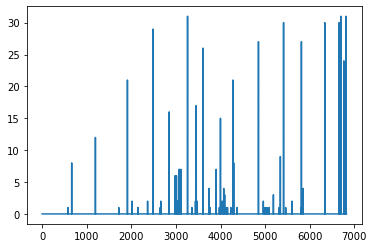

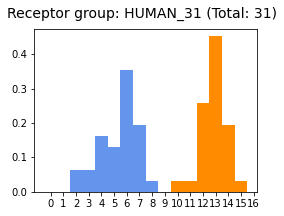

In [57]:
plt.plot(human_collection.anchor_hist)
human_collection.plot_sse_hist(title=f"Receptor group: HUMAN_31 (Total: 31)",
                                   n_max=16,
                                   savename="hists/human_31.s2_newAnch")

In [39]:
#dir(valid_collection)
occupancy = np.zeros([aln_cutoff],dtype=int)
sse_matrix = np.zeros([len(valid_collection.collection), aln_cutoff])
for i, gain in enumerate(valid_collection.collection):
    #print(gain.sda_helices, gain.sdb_sheets)
#    for res_id in range(gain.start,gain.end+1):
    occupancy[gain.alignment_indices] += 1
    
    for helix in gain.sda_helices:
        for res_id in range(helix[0],helix[1]+1):
            sse_matrix[i,gain.alignment_indices[res_id]] = -1
    for sheet in gain.sdb_sheets:
        for res_id in range(sheet[0],sheet[1]+1):
            sse_matrix[i,gain.alignment_indices[res_id]] = 1

Found Anchors at cutoff 3000 with 8 Helix Anchors and 14 Sheet Anchors.
[ 662 1194 1912 2490 2848 3011 3073 3260 3455 3607 3998 4279 4850 5339
 5341 5413 5813 6337 6659 6696 6765 6808]
0 662
1 1194
2 1912
3 2490
4 2848
5 3011
6 3073
7 3260
8 3455
9 3607
10 3998
11 4279
12 4850
13 5339
14 5341
15 5413
16 5813
17 6337
18 6659
19 6696
20 6765
21 6808


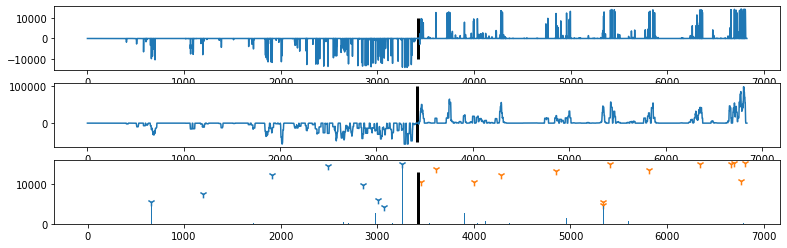

In [41]:
plt.figure(figsize=[math.ceil(aln_cutoff/600)+1,4])
plt.subplot(3,1,1)
plt.vlines(valid_collection.alignment_subdomain_boundary,-10000,10000, linewidth=3, color='k')
plt.plot(np.sum(sse_matrix, axis=0))
plt.subplot(3,1,2)
plt.vlines(valid_collection.alignment_subdomain_boundary, -50000,100000, linewidth=3, color='k')
plt.plot(np.convolve(np.sum(sse_matrix, axis=0), np.ones([20])))
plt.subplot(3,1,3)
plt.vlines(valid_collection.alignment_subdomain_boundary, 0, 13000, linewidth=3, color='k')
plt.bar(np.arange(aln_cutoff),valid_collection.anchor_hist, width=2)
anchors , anchor_occupation = valid_collection.find_anchors(cutoff=3000)
print(anchors)
for i, anchor in enumerate(anchors):
    print(i, anchor)
    if anchor < valid_collection.alignment_subdomain_boundary: 
        color = u'#1f77b4'
    else: 
        color = u'#ff7f0e'
    plt.scatter(anchor, valid_collection.anchor_hist[anchor]+1000, c=color, marker="1",s=60)
plt.savefig("big_signal.s2.png", dpi=600, bbox_inches='tight')

In [50]:
print(anchors, anchor_occupation)
print(valid_collection.alignment_subdomain_boundary)
#sdb = 3425
#anchors = [662, 1194, 1912, 2490, 2983, 3260, 3455, 3461, 3739, 3998, 4295, 4850, 5347, 5461,
# 5813, 5853, 6337, 6659, 6715, 6772, 6808]
#anchor_occupation = [ 3896,  7206, 11169, 13756, 11165, 14086,  6206,  4106, 12116,  9369,
# 12987, 12103, 11190, 11077,  5610,  8639, 13998, 13267, 13936, 10506, 14303]
#anchor_dict = sse_func.make_anchor_dict(anchors, 3425)
anchor_dict = sse_func.make_anchor_dict(anchors, valid_collection.alignment_subdomain_boundary)

[ 662 1194 1912 2490 2848 3011 3073 3260 3455 3607 3998 4279 4850 5339
 5341 5413 5813 6337 6659 6696 6765 6808] [ 4594.  6539. 11392. 13658.  8862.  5092.  3228. 14189.  9413. 12760.
  9420. 11201. 12283.  3676.  4562. 13992. 12575. 13999. 14051. 14353.
  9760. 14215.]
3425


In [51]:
class Indexing:
    def __init__(self, aGainCollection, fasta_offsets=None, split_mode='single'):
        
        length = len(aGainCollection.collection)
        names = np.empty([length], dtype=object)
        indexing_dirs = np.empty([length], dtype=object)
        center_dirs = np.empty([length], dtype=object)
        offsets = np.zeros([length], dtype=int)
        total_keys = []
        center_keys = []
        if fasta_offsets is None:
            self.fasta_offsets = np.zeros([length])
        if fasta_offsets is not None: 
            corrected_offsets = []
            for i in range(length):
                # The existing FASTA offsets do not account for the residue starting not at 0,
                # Therefore the value of the starting res (gain.start) needs to be subtracted.
                corrected_offsets.append(fasta_offsets[i]-aGainCollection.collection[i].start)
            self.fasta_offsets = np.array(corrected_offsets, dtype=int)
            
        for gain_index, gain in enumerate(aGainCollection.collection):
            indexing_dir, indexing_centers = gain.create_indexing(anchors, 
                                                                  anchor_occupation, 
                                                                  anchor_dict,
                                                                  split_mode=split_mode)
            print(indexing_dir, indexing_centers)
            for key in indexing_dir.keys():
                if key not in total_keys:
                    total_keys.append(key)
                    
            for key in indexing_centers.keys():
                if key not in center_keys:
                    center_keys.append(key)                 
                
            indexing_dirs[gain_index] = indexing_dir
            center_dirs[gain_index] = indexing_centers
            # Patch ADGRC/CELSR naming
            names[gain_index] = gain.name.replace("CadherinEGFLAGseven-passG-typereceptor", "AGRC")
            offsets[gain_index] = gain.start

        self.indexing_dirs = indexing_dirs
        self.center_dirs = center_dirs
        self.names = names
        self.length = length
        self.offsets = offsets
        self.accessions = [gain.name.split("-")[0].split("_")[0] for gain in aGainCollection.collection]
        self.sequences = ["".join(gain.sequence) for gain in aGainCollection.collection]
        self.total_keys = sorted(total_keys)
        self.center_keys = sorted(center_keys)
        
        print("Total of keys found in the dictionaries:\n", self.total_keys, self.center_keys)
        print("First entry", self.indexing_dirs[0], self.center_dirs[0])
        
        header_list = ["Receptor", "Accession"] + self.total_keys + self.center_keys
        #header = "Receptor,Accession," + ",".join(self.total_keys) + ",".join(self.center_keys)
        header_list = ["Receptor", "Accession"] + self.total_keys + self.center_keys
        header_dict = {}
        for idx, item in enumerate(header_list):
            header_dict[item] = idx

        data_matrix = np.full([self.length, len(header_dict.keys())], fill_value='', dtype=object)
        # Go through each of the sub-dictionaries and populate the dataframe:
        for row in range(self.length):
                # Q5T601_Q5KU15_..._Q9H615-AGRF1_HUMAN-AGRF1-Homo_sapiens.fa
                # 0                        1           2     3
            name_parts = self.names[row].split("-")
            data_matrix[row, header_dict["Receptor"]] = name_parts[2]
            data_matrix[row, header_dict["Accession"]] = name_parts[0].split("_")[0]
            offset = self.offsets[row]
            fa_offset = self.fasta_offsets[row]

            for key in self.indexing_dirs[row].keys():
                if key == "GPS":
                    sse=[int(x+fa_offset) for x in self.indexing_dirs[row][key]]
                    data_matrix[row, header_dict[key]] = f"{sse[0]}-{sse[-1]}"
                else:
                    sse = [int(x+offset+fa_offset) for x in self.indexing_dirs[row][key]]
                    data_matrix[row, header_dict[key]] = f"{sse[0]}-{sse[1]}"

            for key in self.center_dirs[row].keys():
                data_matrix[row, header_dict[key]] = str(self.center_dirs[row][key]+offset+fa_offset)
            
            self.data_header = ",".join(header_list)
            self.data_matrix = data_matrix

    def data2csv(self, outfile):
        with open(outfile, "w") as f:
            f.write(self.data_header+"\n")
            for row in range(self.length):
                f.write(",".join(self.data_matrix[row,:])+"\n")
        print("Completed file", outfile, ".")

In [52]:
#offset information
def find_offsets(big_seq_file, accessions, sequences):
    # searches through the accessions in the big sequence file,
    # finds the start for the provided sequence
    with open(big_seq_file,"r") as fa:
        fata = fa.read()
        fatas = fata.split(">")
    seqs = []
    headers = []
    offsets = []
    for seq in fatas:
        if len(seq) < 10: 
            continue
        data = seq.strip().split("\n")
        headers.append(data[0].split("|")[1])
        seqs.append("".join(data[1:]))
    
    heads = np.array(headers)
    for idx, accession in enumerate(accessions):
        #print(np.where(heads == accession))
        seq_idx = np.where(heads == accession)[0][0]
        offset = sse_func.find_the_start(seqs[seq_idx], sequences[idx])
        #print(offset)
        offsets.append(offset)
    
    return offsets

In [56]:
mode = 'double'

human_base = Indexing(human_collection, split_mode=mode)


big_seq_file = "/home/hildilab/projects/GPS_massif/uniprot_query/agpcr_celsr.fasta"
fasta_offsets = find_offsets(big_seq_file, 
                                 human_base.accessions, 
                                 human_base.sequences)
print(fasta_offsets)
fa_human_base = Indexing(human_collection, fasta_offsets = fasta_offsets, split_mode=mode)

human_base.data2csv(f"default_indexed_s2_s2a_re_{mode}_split.csv")
fa_human_base.data2csv(f"uniprot_indexed_s2_s2a_re_{mode}_split.csv")

[[], [], [], [], [], [], [0, 18]]
[NOTE] GainDomain.create_indexing : ANCHOR AMBIGUITY in this SSE: 
	 sse_idx = 1194,
	 anchor_dict[sse_idx] = 'H2',
	 type_breaks[idx] = []
[(array([ 0, 13]), ['H2.38', 'H2.39', 'H2.40', 'H2.41', 'H2.42', 'H2.43', 'H2.44', 'H2.45', 'H2.46', 'H2.47', 'H2.48', 'H2.49', 'H2.50', 'H2.51'], (array([ 0, 13]), 12, 'H2'))]
[NOTE] GainDomain.create_indexing : ANCHOR AMBIGUITY in this SSE: 
	 sse_idx = 3073,
	 anchor_dict[sse_idx] = 'H7',
	 type_breaks[idx] = []
[(array([ 90, 101]), ['H6.48', 'H6.49', 'H6.50', 'H6.51', 'H6.52', 'H6.53', 'H6.54', 'H6.55', 'H6.56', 'H6.57', 'H6.58', 'H6.59'], (array([ 90, 101]), 92, 'H6'))]
[[], [], [], [], [], [], [], [], [], [], [], [], [], []]
{'H2': array([ 0, 13]), 'H3': array([21, 36]), 'H4': array([43, 61]), 'H5': array([76, 87]), 'H6': array([ 90, 101]), 'H8': array([104, 126]), 'S1': array([132, 135]), 'S2': array([139, 147]), 'S4': array([173, 176]), 'S5': array([216, 224]), 'S7': array([248, 250]), 'S8': array([254, 261

[2027, 2106, 2175, 479, 632, 588, 568, 528, 517, 579, 723, 2449, 5619, 546, 0, 300, 22, 140, 112, 356, 154, 96, 365, 415, 265, 170, 235, 120, 418, 269, 324]
[[], [], [], [], [], [], [0, 18]]
[NOTE] GainDomain.create_indexing : ANCHOR AMBIGUITY in this SSE: 
	 sse_idx = 1194,
	 anchor_dict[sse_idx] = 'H2',
	 type_breaks[idx] = []
[(array([ 0, 13]), ['H2.38', 'H2.39', 'H2.40', 'H2.41', 'H2.42', 'H2.43', 'H2.44', 'H2.45', 'H2.46', 'H2.47', 'H2.48', 'H2.49', 'H2.50', 'H2.51'], (array([ 0, 13]), 12, 'H2'))]
[NOTE] GainDomain.create_indexing : ANCHOR AMBIGUITY in this SSE: 
	 sse_idx = 3073,
	 anchor_dict[sse_idx] = 'H7',
	 type_breaks[idx] = []
[(array([ 90, 101]), ['H6.48', 'H6.49', 'H6.50', 'H6.51', 'H6.52', 'H6.53', 'H6.54', 'H6.55', 'H6.56', 'H6.57', 'H6.58', 'H6.59'], (array([ 90, 101]), 92, 'H6'))]
[[], [], [], [], [], [], [], [], [], [], [], [], [], []]
{'H2': array([ 0, 13]), 'H3': array([21, 36]), 'H4': array([43, 61]), 'H5': array([76, 87]), 'H6': array([ 90, 101]), 'H8': array([1

In [19]:
def offset_pdb(in_pdb, out_pdb, offset):
    with open(in_pdb,"r") as p:
        data = p.readlines()
    offset_pdb = open(out_pdb, "w")
    
    for line in data:
        if line.startswith("ATOM"):
            res_id = int(line[22:26])
            offset_pdb.write(f"{line[:22]}{str(res_id+offset).rjust(4)}{line[26:]}")
        else:
            offset_pdb.write(line)
    
    print(f"Created PDB {out_pdb} with last residue {res_id+offset}. Total offset {offset} .")

In [20]:
#in_pdbs = glob.glob("/home/hildilab/projects/agpcr_nom/human_31/aligned/subd_B/trunc_pdbs/*.pdb")

In [21]:
"""for i, offset in enumerate(fa_human_base.fasta_offsets):
    sub_pdb = [pdb for pdb in in_pdbs if fa_human_base.accessions[i] in pdb][0]
    offset_pdb(sub_pdb, sub_pdb.replace("trunc_pdbs","uniprot_indexed_pdbs"), offset)"""

'for i, offset in enumerate(fa_human_base.fasta_offsets):\n    sub_pdb = [pdb for pdb in in_pdbs if fa_human_base.accessions[i] in pdb][0]\n    offset_pdb(sub_pdb, sub_pdb.replace("trunc_pdbs","uniprot_indexed_pdbs"), offset)'

In [55]:
for i, gain in enumerate(human_collection.collection):
    #if "Q6QNK2" in gain.name:
        x1, x2 = gain.create_indexing(anchors, anchor_occupation, anchor_dict, 
                    outdir = "/home/hildilab/projects/agpcr_nom/human_31/indexing_files_s2_dsp",
                    #offset = fasta_offsets[i]-gain.start+1,
                    split_mode='double')
        
        print(x1, x2)

[[], [], [], [], [], [], [0, 18]]
[NOTE] GainDomain.create_indexing : ANCHOR AMBIGUITY in this SSE: 
	 sse_idx = 1194,
	 anchor_dict[sse_idx] = 'H2',
	 type_breaks[idx] = []
[(array([ 0, 13]), ['H2.38', 'H2.39', 'H2.40', 'H2.41', 'H2.42', 'H2.43', 'H2.44', 'H2.45', 'H2.46', 'H2.47', 'H2.48', 'H2.49', 'H2.50', 'H2.51'], (array([ 0, 13]), 12, 'H2'))]
[NOTE] GainDomain.create_indexing : ANCHOR AMBIGUITY in this SSE: 
	 sse_idx = 3073,
	 anchor_dict[sse_idx] = 'H7',
	 type_breaks[idx] = []
[(array([ 90, 101]), ['H6.48', 'H6.49', 'H6.50', 'H6.51', 'H6.52', 'H6.53', 'H6.54', 'H6.55', 'H6.56', 'H6.57', 'H6.58', 'H6.59'], (array([ 90, 101]), 92, 'H6'))]
[[], [], [], [], [], [], [], [], [], [], [], [], [], []]
[DEBUG] GainDomain.create_indexing.indexing2longfile
 ['      ' '      ' '      ' '      ' '      ' '      ' '      ' '      '
 '      ' '      ' '      ' '      ' '      ' '      ' '      ' '      '
 '      ' '      ' '      ' '      ' '      ' '      ' '      ' '      '
 '      ' '     

{'H3': array([ 6, 20]), 'H4': array([24, 43]), 'H8': array([53, 76]), 'S1': array([81, 86]), 'S2': array([92, 98]), 'S4': array([112, 117]), 'S5': array([130, 137]), 'S8': array([178, 183]), 'S9': array([195, 200]), 'S10': array([208, 217]), 'S11': array([223, 226]), 'S12': array([230, 235]), 'S13': array([239, 244]), 'S14': array([249, 256]), 'GPS': [515, 516, 517]} {'H3.50': 15, 'H4.50': 31, 'H8.50': 63, 'S1.50': 84, 'S2.50': 93, 'S4.50': 114, 'S5.50': 131, 'S8.50': 178, 'S9.50': 195, 'S10.50': 212, 'S11.50': 225, 'S12.50': 230, 'S13.50': 242, 'S14.50': 253}
[[], [], [6, 12], []]
[[], [], [], [], [], [], [], [], [], [], [], [], []]
[DEBUG] GainDomain.create_indexing : Interval search found anchor @ Column 3998
NOTE: GainDomain.create_indexing : Interval search found SSE:peak = 3998, peak_dists = [98, 97, 96, 26, 25, 158], ref_res = 129. 
NOTE: GainDomain.create_indexing : This will be named {anchor_dict[peak]}
[DEBUG] GainDomain.create_indexing.indexing2longfile
 ['      ' '      ' '

In [23]:
print(fasta_offsets)

[2027, 2106, 2175, 479, 632, 588, 568, 528, 517, 579, 723, 2449, 5619, 546, 0, 300, 22, 140, 112, 356, 154, 96, 365, 415, 265, 170, 235, 120, 418, 269, 324]


In [24]:
for gain in human_collection.collection:
    gain.GPS.info()
    #for res in gain.GPS.indices:
    print(np.where(gain.alignment_indices == gps_minus_one))
    #for i in range(len(gain.alignment_indices)):
    #    print(gain.alignment_indices[i], gain.sequence[i])
    

Info about this GPS:
self.isConsensus = True
self.indices = [327, 328, 329]
self.sequence = array(['H', 'M', 'T'], dtype='<U1')
self.alignment_indices = array([6777, 6781, 6782])
self.residue_numbers = [786, 787, 788]
(array([328]),)
Info about this GPS:
self.isConsensus = True
self.indices = [340, 341, 342]
self.sequence = array(['H', 'T', 'A'], dtype='<U1')
self.alignment_indices = array([6777, 6781, 6782])
self.residue_numbers = [786, 787, 788]
(array([341]),)
Info about this GPS:
self.isConsensus = True
self.indices = [340, 341, 342]
self.sequence = array(['R', 'T', 'G'], dtype='<U1')
self.alignment_indices = array([6777, 6781, 6782])
self.residue_numbers = [786, 787, 788]
(array([341]),)
Info about this GPS:
self.isConsensus = True
self.indices = [271, 272, 273]
self.sequence = array(['H', 'L', 'T'], dtype='<U1')
self.alignment_indices = array([6777, 6781, 6782])
self.residue_numbers = [750, 751, 752]
(array([272]),)
Info about this GPS:
self.isConsensus = True
self.indices = [292